## 성장 현황 EDA

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from plotly.subplots import make_subplots
import plotly.graph_objects as go
from datetime import datetime
import os
import cv2

### 1. 데이터 불러오기

In [3]:
data = pd.read_csv('/home/ubuntu/drive/EDA/merged_growth_final.csv', encoding="UTF-8")
data

,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,측정년도,...,mask_id,point_x,point_y,size,color,output_image_path,origin_r,origin_g,origin_b,pred_growth
0,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1132.451172,554.744629,535,"[[121, 123, 112], [123, 125, 114], [118, 120, ...",image_mask_1.png,0.351564,0.406222,0.242214,unripe
1,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,c8f4ef001e5f686be96b1cb1bb68f68d,880.826233,100.000298,37040,"[[54, 63, 44], [88, 97, 76], [82, 91, 70], [85...",image_mask_2.png,0.367803,0.445607,0.186590,unripe
2,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1136.085205,556.137573,576,"[[70, 71, 65], [68, 69, 63], [63, 64, 58], [49...",image_mask_1.png,0.342620,0.379780,0.277600,unripe
3,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,3cf79ada342fb0b16364c9ea6d703f9f,771.131104,102.249115,20098,"[[22, 24, 10], [27, 30, 11], [42, 45, 24], [35...",image_mask_2.png,0.371069,0.430602,0.198329,unripe
4,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,fd48e0393a4d25876b5fb82e9571361e,902.543579,109.905945,22199,"[[97, 93, 92], [80, 79, 77], [85, 84, 80], [83...",image_mask_3.png,0.367177,0.417558,0.215264,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
134325,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,0cb9c5737f7de38bb2f75f064bd96a55,252.157288,679.823486,752,"[[159, 173, 137], [139, 154, 113], [101, 116, ...",image_mask_5.png,0.342348,0.385022,0.272630,unripe
134326,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,a778f0bf971bd81561020a9b5cab4043,111.124481,661.383179,1207,"[[58, 67, 48], [72, 81, 62], [90, 99, 82], [11...",image_mask_6.png,0.339128,0.366072,0.294800,unripe
134327,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,0146404d3a59c2af51d446bc348f9ca0,545.385010,625.948486,816,"[[67, 79, 41], [51, 63, 23], [33, 46, 3], [67,...",image_mask_7.png,0.346549,0.384828,0.268623,unripe
134328,NaN,NaN,NaN,F0017,NaN,NaN,NaN,NaN,NaN,NaN,...,774d0e20df9ee526e506a822cca77538,586.503967,478.773376,1269,"[[116, 140, 92], [182, 206, 156], [197, 221, 1...",image_mask_8.png,0.350770,0.386644,0.262587,unripe


In [4]:
copy_data = data.copy()

In [5]:
copy_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 134330 entries, 0 to 134329
Data columns (total 31 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   check_datetime     132584 non-null  object 
 1   측정일자               132584 non-null  object 
 2   구역명                132584 non-null  object 
 3   farm_code          134330 non-null  object 
 4   내부온도               132584 non-null  float64
 5   내부습도               132584 non-null  float64
 6   내부CO2              132584 non-null  float64
 7   근권온도               132584 non-null  float64
 8   내부순간일사량            132584 non-null  float64
 9   측정년도               132584 non-null  float64
 10  측정월                132584 non-null  float64
 11  input_image_name   134330 non-null  object 
 12  input_image_path   134330 non-null  object 
 13  img_id             134330 non-null  object 
 14  area_code          134330 non-null  object 
 15  shot_datetime      134330 non-null  object 
 16  co

### 2. 농장 - 작기별 확인 

In [6]:
#입력된 작기 시작- 종료 날짜를 datetime형식으로 변환해주는 함수 정의
def period(start_date, end_date):
    start_date = datetime.strptime(start_date,'%Y-%m-%d %H:%M:%S')
    end_date = datetime.strptime(end_date, '%Y-%m-%d %H:%M:%S')
    return (start_date, end_date)

period_21_22 = period('2021-09-10 07:59:03', '2022-06-09 12:30:00')
period_22_23 = period('2022-08-25 16:44:07', '2023-06-23 16:36:06')
period_23_24 = period('2023-08-29 08:40:22', '2024-03-26 12:40:00')

#측정일자를 datetime 형식으로 변환
copy_data['check_datetime'] = pd.to_datetime(copy_data["check_datetime"])


## F0016 작기별 성장 분포 확인

월별 분포 확인

In [7]:
#F0016 21-22작기 확인
F0016_21_22 = copy_data[(copy_data['farm_code'] == 'F0016') & (copy_data['check_datetime'] >= period_21_22[0]) & (copy_data['check_datetime']<= period_21_22[1])]
#작기 안에서 월별로 class 분포 확인
F0016_21_22_monthly = F0016_21_22.groupby([F0016_21_22['check_datetime'].dt.year.rename('year'), F0016_21_22['check_datetime'].dt.month, 'pred_growth']).size().reset_index(name='count')
F0016_21_22_monthly['check_datetime'] = F0016_21_22_monthly['year'].astype(str) + '-' + F0016_21_22_monthly['check_datetime'].astype(str)
F0016_21_22_monthly.drop(columns=['year'], inplace=True)
F0016_21_22_monthly

,check_datetime,pred_growth,count
0,2021-9,semi-ripe,18
1,2021-9,unripe,464
2,2021-10,semi-ripe,2
3,2021-10,unripe,131
4,2021-11,ripe,30
5,2021-11,semi-ripe,59
6,2021-11,unripe,345
7,2021-12,ripe,220
8,2021-12,semi-ripe,405
9,2021-12,unripe,645


<function matplotlib.pyplot.show(close=None, block=None)>

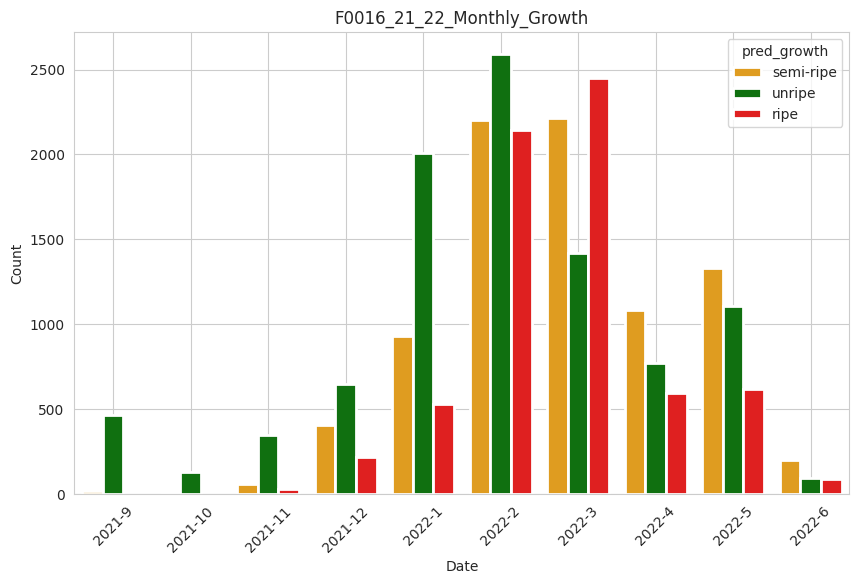

In [8]:
#graph로 확인
sns.set_style("whitegrid")

palette = {'unripe': 'green', 'semi-ripe': 'orange', 'ripe': 'red'}

plt.figure(figsize=(10, 6))
sns.barplot(data = F0016_21_22_monthly, x = 'check_datetime', y = 'count', hue = 'pred_growth', palette=palette ,  linewidth=2 )
plt.title('F0016_21_22_Monthly_Growth')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend(title='pred_growth')
plt.grid(True)
plt.xticks(rotation=45)
plt.show

주차별로 연속된 이틀로 확인 

In [9]:
F0016_21_22

,check_datetime,측정일자,구역명,farm_code,내부온도,내부습도,내부CO2,근권온도,내부순간일사량,측정년도,...,mask_id,point_x,point_y,size,color,output_image_path,origin_r,origin_g,origin_b,pred_growth
0,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1132.451172,554.744629,535,"[[121, 123, 112], [123, 125, 114], [118, 120, ...",image_mask_1.png,0.351564,0.406222,0.242214,unripe
1,2021-09-10 13:00:00,2021-09-10,1구역,F0016,27.52,72.22,467.9,22.51,223.17,2021.0,...,c8f4ef001e5f686be96b1cb1bb68f68d,880.826233,100.000298,37040,"[[54, 63, 44], [88, 97, 76], [82, 91, 70], [85...",image_mask_2.png,0.367803,0.445607,0.186590,unripe
2,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,065e7a9bdd5065fe01976ff3f4f49f03,1136.085205,556.137573,576,"[[70, 71, 65], [68, 69, 63], [63, 64, 58], [49...",image_mask_1.png,0.342620,0.379780,0.277600,unripe
3,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,3cf79ada342fb0b16364c9ea6d703f9f,771.131104,102.249115,20098,"[[22, 24, 10], [27, 30, 11], [42, 45, 24], [35...",image_mask_2.png,0.371069,0.430602,0.198329,unripe
4,2021-09-10 17:00:00,2021-09-10,1구역,F0016,27.02,71.23,463.1,23.77,102.75,2021.0,...,fd48e0393a4d25876b5fb82e9571361e,902.543579,109.905945,22199,"[[97, 93, 92], [80, 79, 77], [85, 84, 80], [83...",image_mask_3.png,0.367177,0.417558,0.215264,unripe
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
24694,2022-06-09 12:30:00,2022-06-09,1구역,F0016,30.12,49.47,472.0,30.15,745.10,2022.0,...,fa113b72f1178e7e9a718e36edf22c3c,1388.109131,411.941864,1096,"[[67, 73, 59], [123, 131, 108], [114, 122, 99]...",image_mask_5.png,0.417734,0.312083,0.270184,ripe
24695,2022-06-09 12:30:00,2022-06-09,1구역,F0016,30.12,49.47,472.0,30.15,745.10,2022.0,...,07c88f72c3f03cbe0e220543ba4331c0,1420.115479,518.644409,447,"[[36, 37, 29], [22, 23, 15], [83, 84, 76], [14...",image_mask_6.png,0.359332,0.332139,0.308529,semi-ripe
24696,2022-06-09 12:30:00,2022-06-09,1구역,F0016,30.12,49.47,472.0,30.15,745.10,2022.0,...,b5298e6b69b09db6d3ba661e12d5da9e,1627.713501,110.816078,2190,"[[63, 72, 53], [84, 93, 74], [138, 147, 128], ...",image_mask_7.png,0.360449,0.389204,0.250347,unripe
24697,2022-06-09 12:30:00,2022-06-09,1구역,F0016,30.12,49.47,472.0,30.15,745.10,2022.0,...,b5298e6b69b09db6d3ba661e12d5da9e,1621.831299,116.810532,1581,"[[57, 69, 47], [87, 96, 75], [116, 125, 104], ...",image_mask_8.png,0.364220,0.383176,0.252603,unripe


#### F0016_21_22작기 9월 성장량 추이

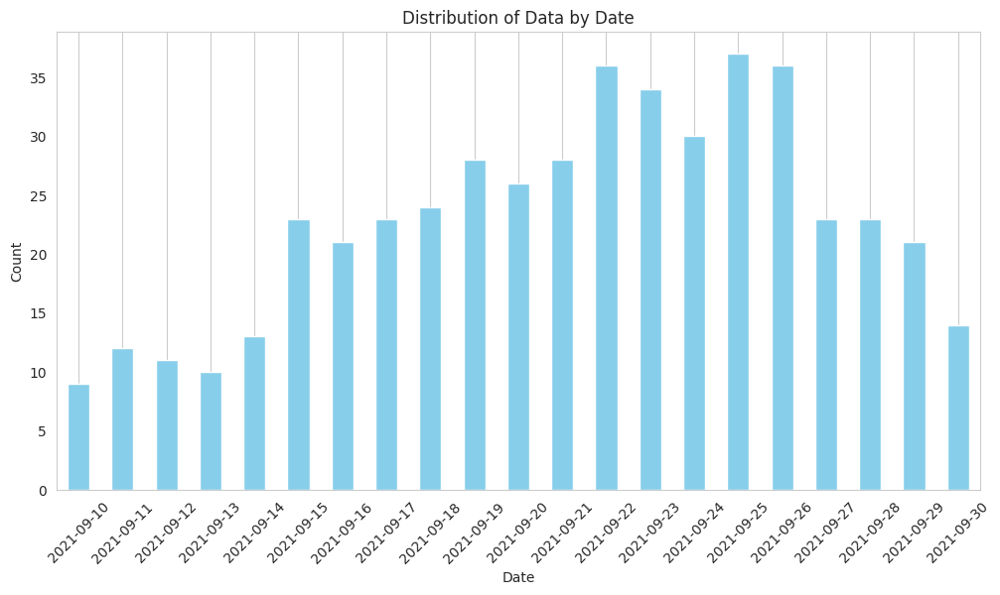

In [10]:
# F0016_21_22_sep_data 생성
F0016_21_22_sep_data = F0016_21_22[F0016_21_22['측정월'] == 9]

# 일자별 데이터 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_sep_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


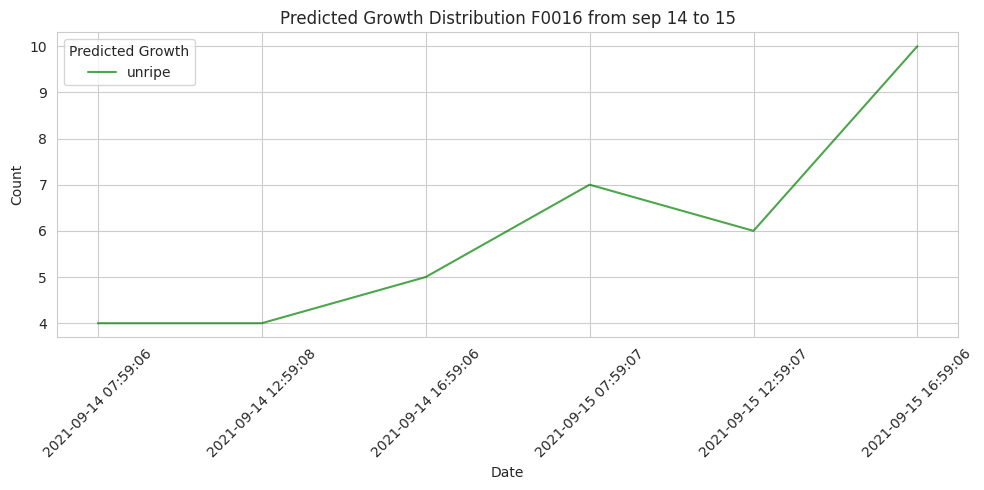

<Figure size 1200x600 with 0 Axes>

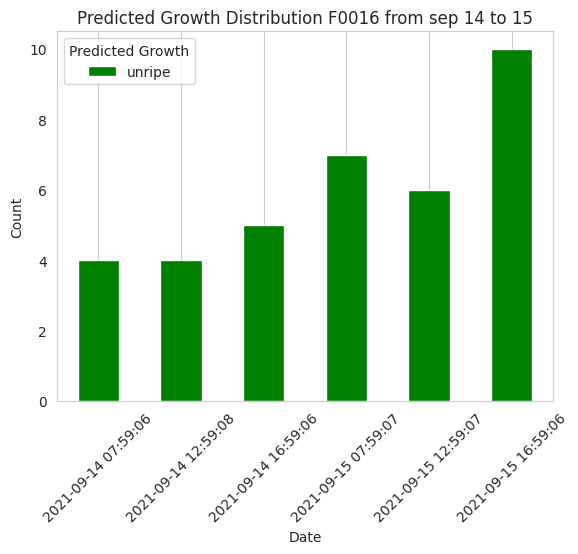

<Figure size 1200x600 with 0 Axes>

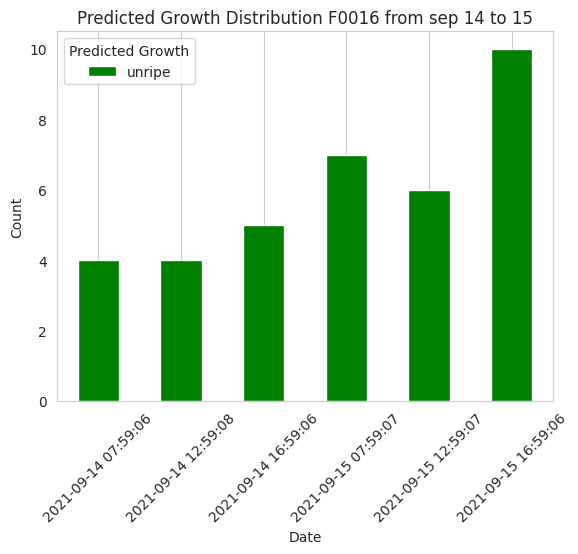

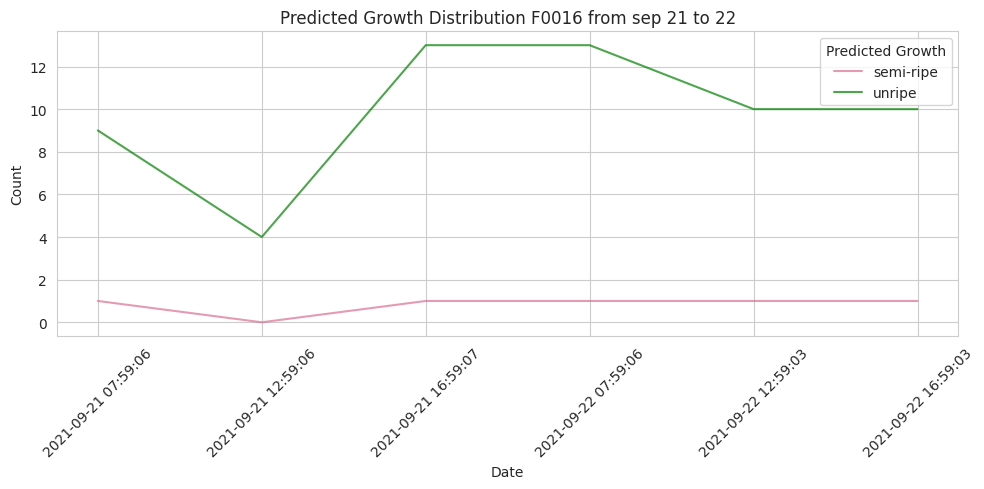

<Figure size 1200x600 with 0 Axes>

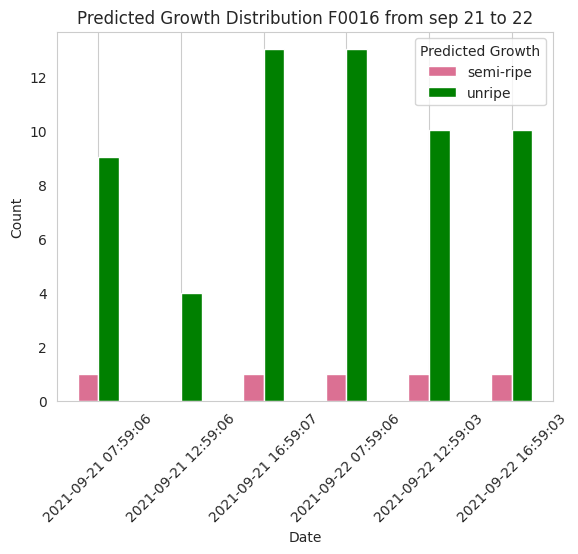

<Figure size 1200x600 with 0 Axes>

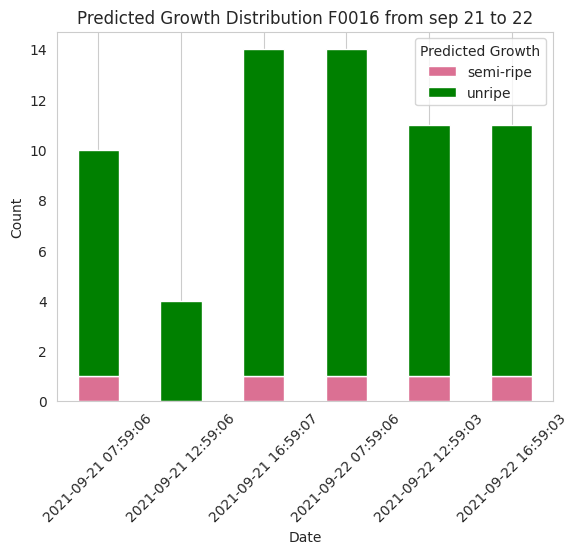

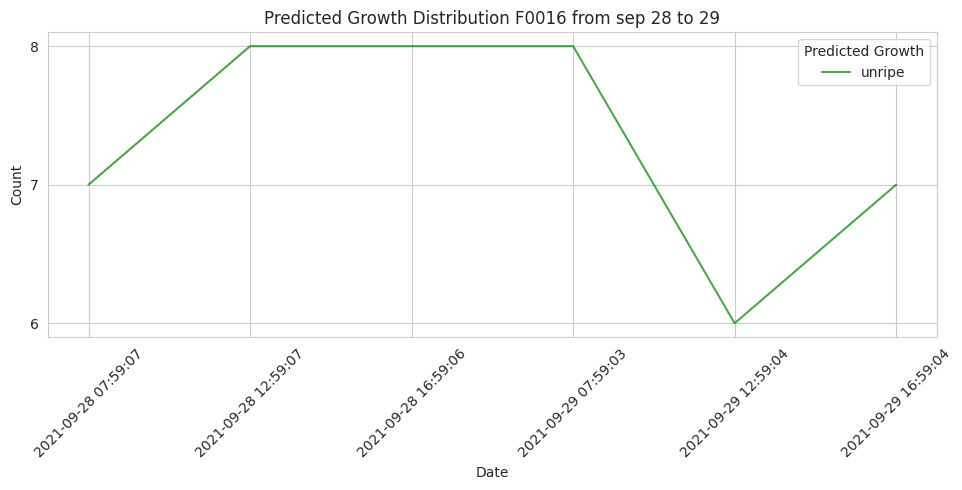

<Figure size 1200x600 with 0 Axes>

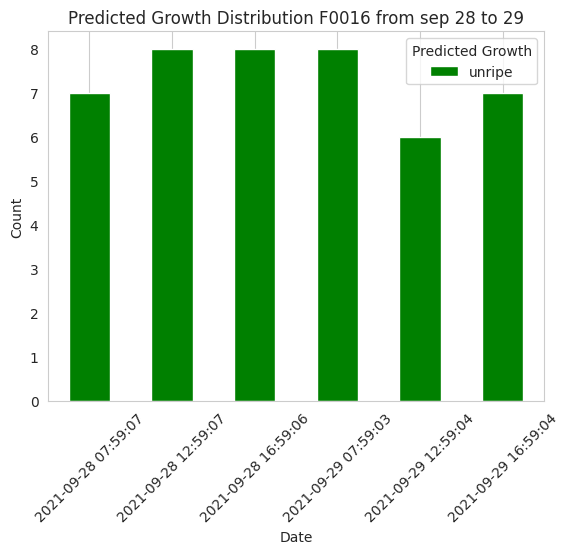

<Figure size 1200x600 with 0 Axes>

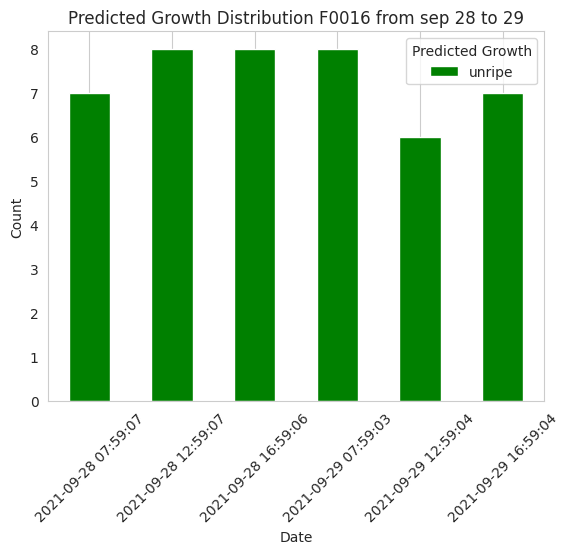

In [11]:
#주차별 이틀치 데이터 정의
select_sep_1 = F0016_21_22_sep_data[(F0016_21_22_sep_data['shot_datetime'] >= '2021-09-14') & (F0016_21_22_sep_data['shot_datetime'] <= '2021-09-16')]
select_sep_2 = F0016_21_22_sep_data[(F0016_21_22_sep_data['shot_datetime'] >= '2021-09-21') & (F0016_21_22_sep_data['shot_datetime'] <= '2021-09-23')]
select_sep_3 = F0016_21_22_sep_data[(F0016_21_22_sep_data['shot_datetime'] >= '2021-09-28') & (F0016_21_22_sep_data['shot_datetime'] <= '2021-09-30')]

sep_1_counts = select_sep_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
sep_2_counts = select_sep_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
sep_3_counts = select_sep_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')



# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(sep_1_counts, 'Predicted Growth Distribution F0016 from sep 14 to 15'),
            (sep_2_counts, 'Predicted Growth Distribution F0016 from sep 21 to 22'),
            (sep_3_counts, 'Predicted Growth Distribution F0016 from sep 28 to 29')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016_21_22작기 10월 주차별 확인

/tmp/ipykernel_21186/3946774157.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_oct_data['shot_datetime'] = pd.to_datetime(F0016_21_22_oct_data['shot_datetime'])


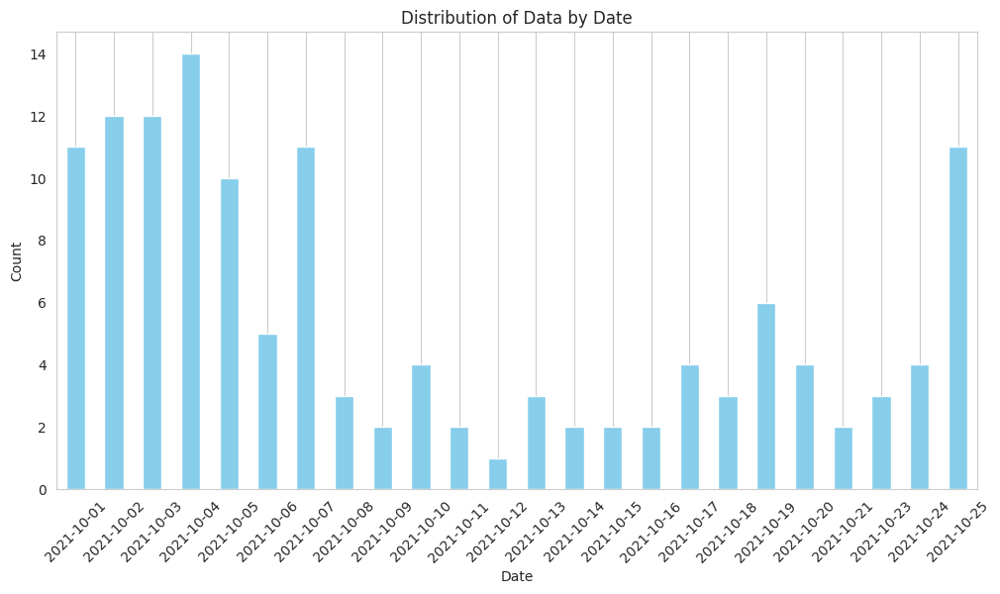

In [12]:
# F0016_21_22_oct_data 생성
F0016_21_22_oct_data = F0016_21_22[F0016_21_22['측정월'] == 10]
F0016_21_22_oct_data['shot_datetime'] = pd.to_datetime(F0016_21_22_oct_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_oct_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


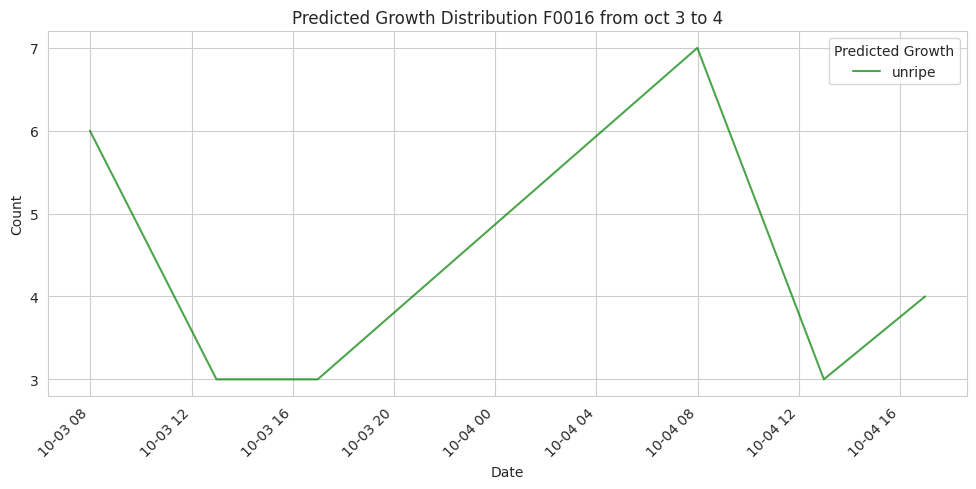

<Figure size 1200x600 with 0 Axes>

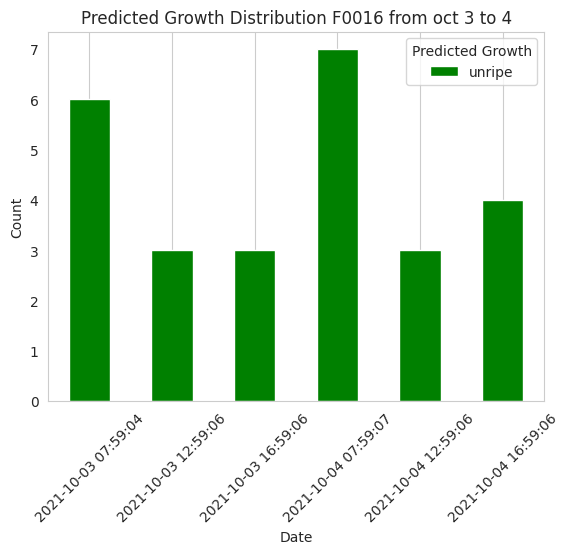

<Figure size 1200x600 with 0 Axes>

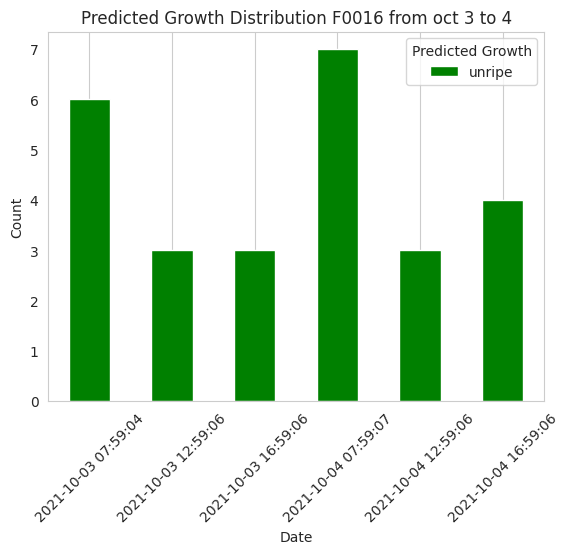

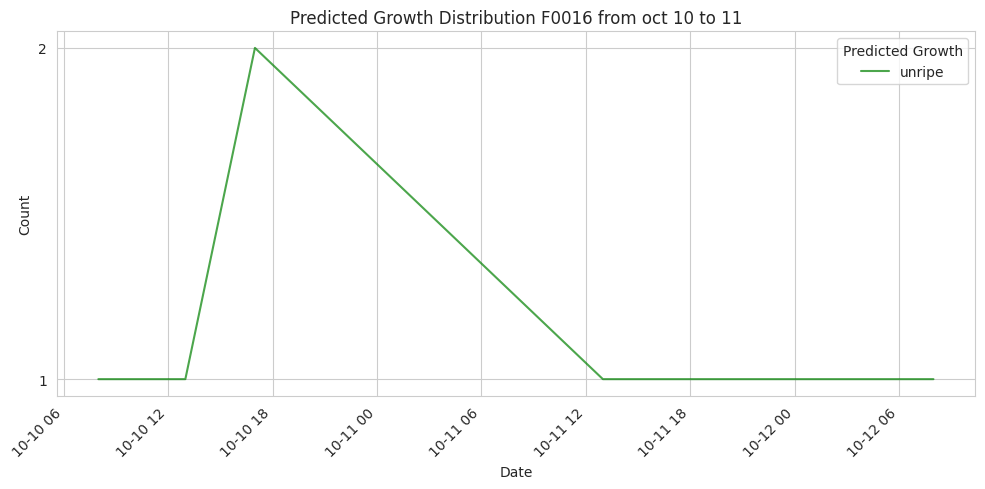

<Figure size 1200x600 with 0 Axes>

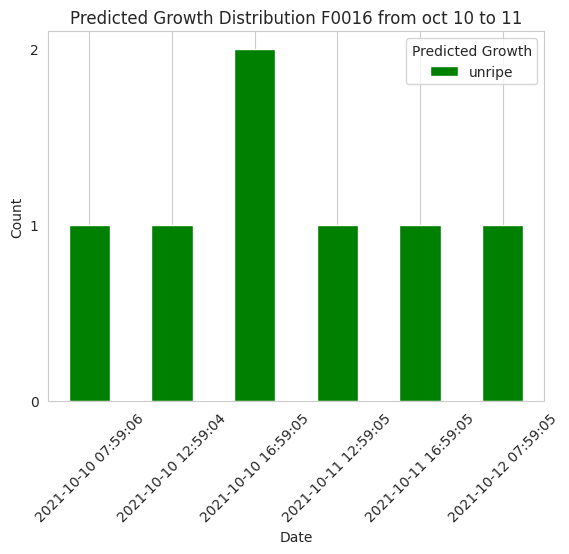

<Figure size 1200x600 with 0 Axes>

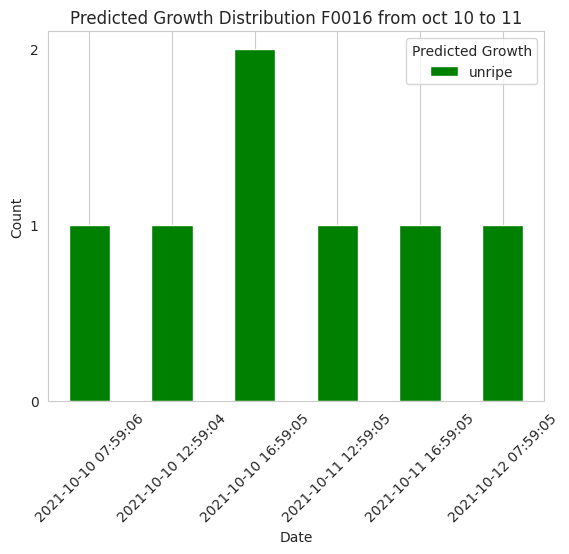

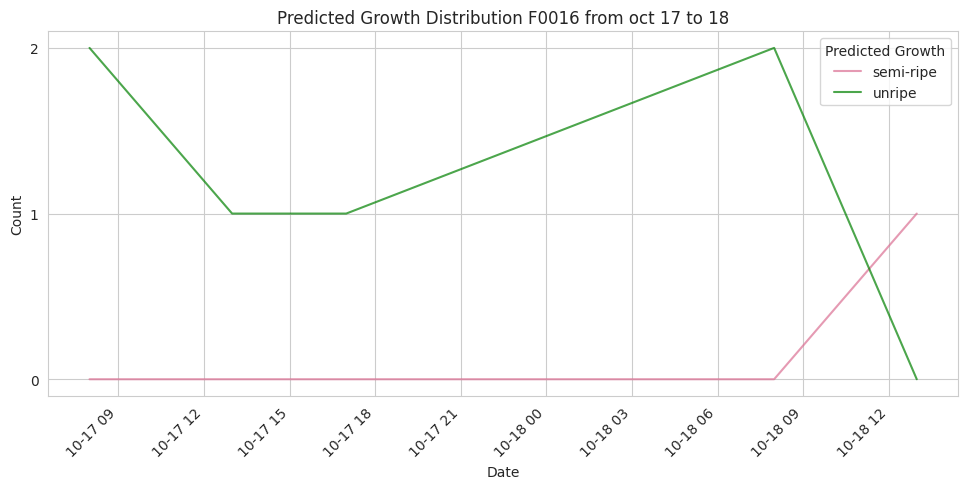

<Figure size 1200x600 with 0 Axes>

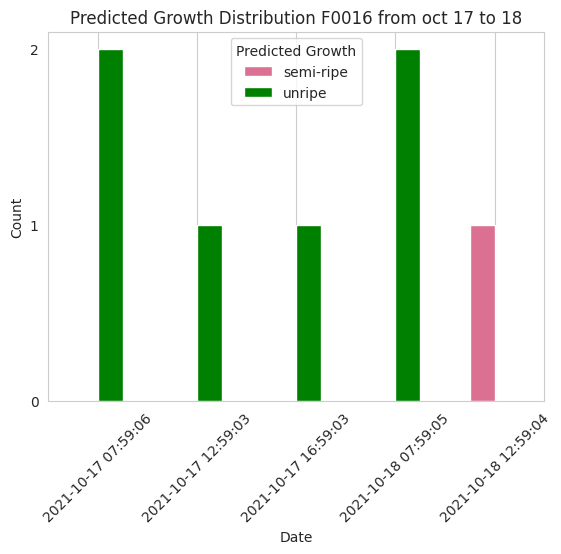

<Figure size 1200x600 with 0 Axes>

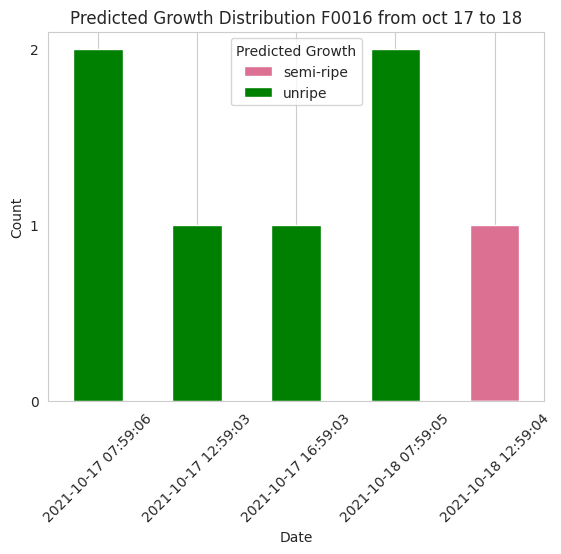

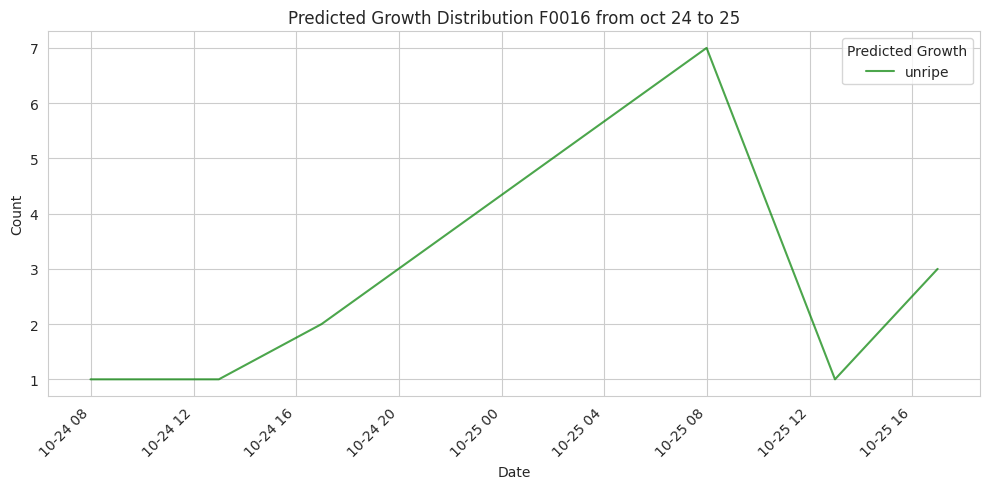

<Figure size 1200x600 with 0 Axes>

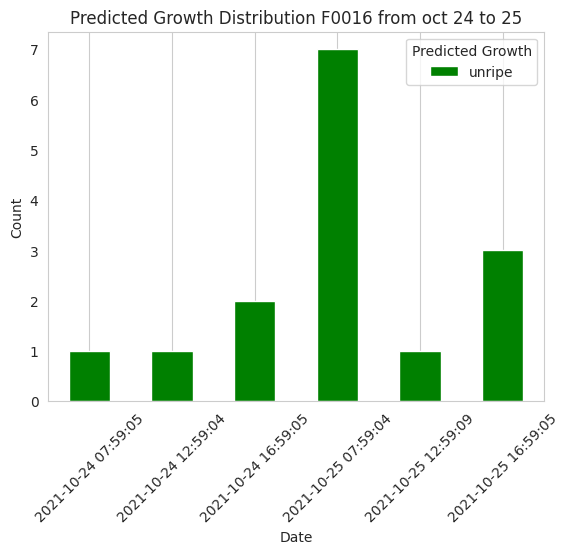

<Figure size 1200x600 with 0 Axes>

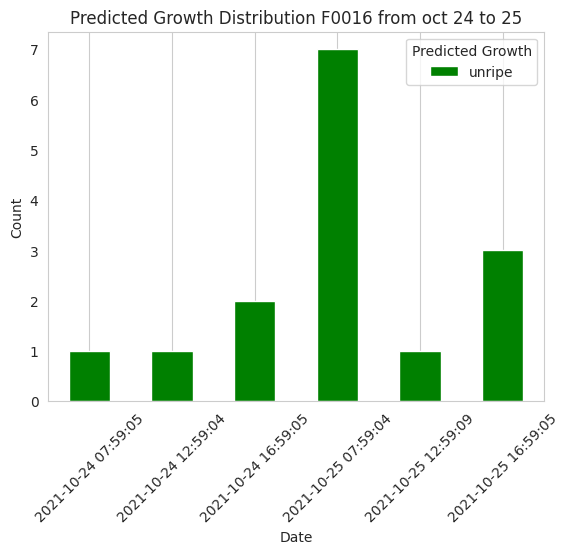

In [13]:
#주차별 이틀치 데이터 정의
select_oct_1 = F0016_21_22_oct_data[(F0016_21_22_oct_data['shot_datetime'] >= '2021-10-03') & (F0016_21_22_oct_data['shot_datetime'] <= '2021-10-05')]
select_oct_2 = F0016_21_22_oct_data[(F0016_21_22_oct_data['shot_datetime'] >= '2021-10-10') & (F0016_21_22_oct_data['shot_datetime'] <= '2021-10-13')]
select_oct_3 = F0016_21_22_oct_data[(F0016_21_22_oct_data['shot_datetime'] >= '2021-10-17') & (F0016_21_22_oct_data['shot_datetime'] <= '2021-10-19')]
select_oct_4 = F0016_21_22_oct_data[(F0016_21_22_oct_data['shot_datetime'] >= '2021-10-24') & (F0016_21_22_oct_data['shot_datetime'] <= '2021-10-26')]


oct_1_counts = select_oct_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_2_counts = select_oct_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_3_counts = select_oct_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_4_counts = select_oct_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')



# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(oct_1_counts, 'Predicted Growth Distribution F0016 from oct 3 to 4'),
            (oct_2_counts, 'Predicted Growth Distribution F0016 from oct 10 to 11'),
            (oct_3_counts, 'Predicted Growth Distribution F0016 from oct 17 to 18'),
            (oct_4_counts, 'Predicted Growth Distribution F0016 from oct 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016_21_22작기 11월 주차별 확인

/tmp/ipykernel_21186/1408191873.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_nov_data['shot_datetime'] = pd.to_datetime(F0016_21_22_nov_data['shot_datetime'])


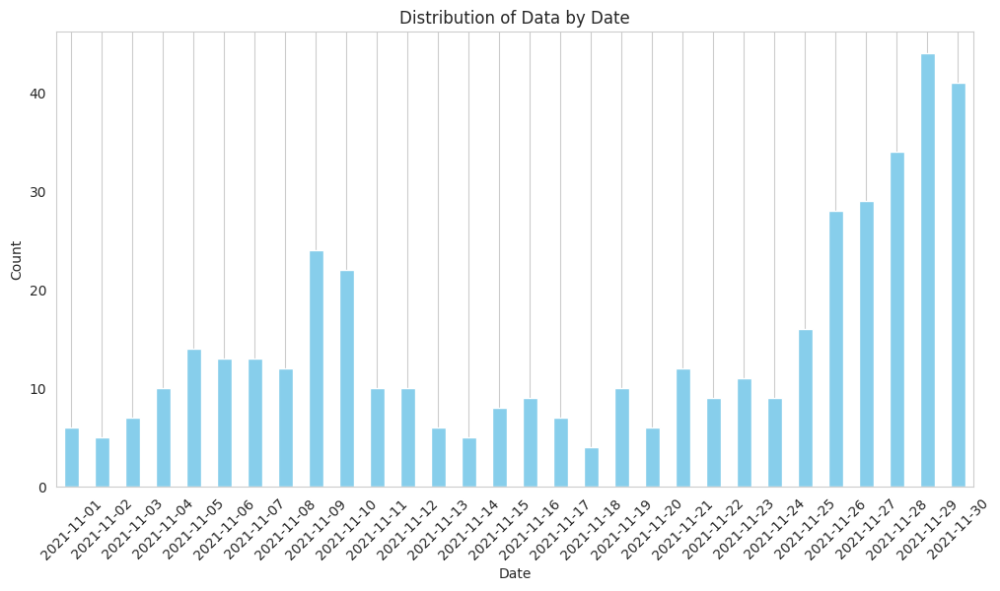

In [71]:
# F0016_21_22_nov_data 생성
F0016_21_22_nov_data = F0016_21_22[F0016_21_22['측정월'] == 11]
F0016_21_22_nov_data['shot_datetime'] = pd.to_datetime(F0016_21_22_nov_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_nov_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


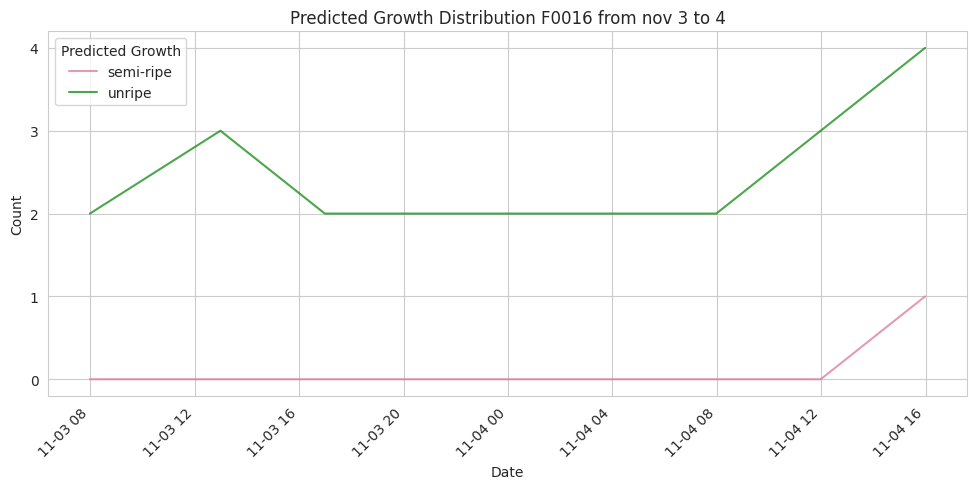

<Figure size 1200x600 with 0 Axes>

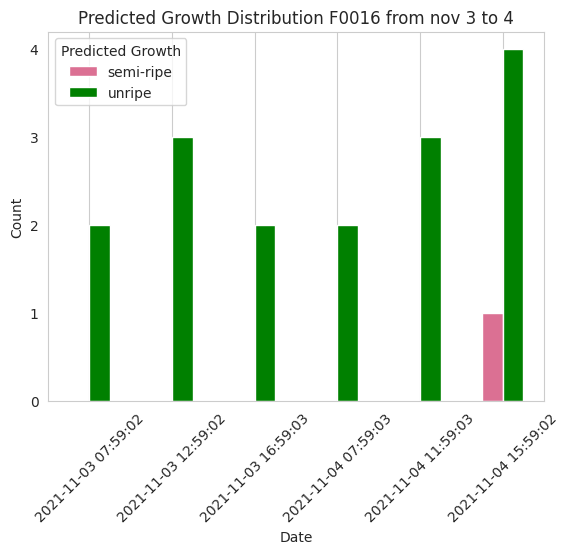

<Figure size 1200x600 with 0 Axes>

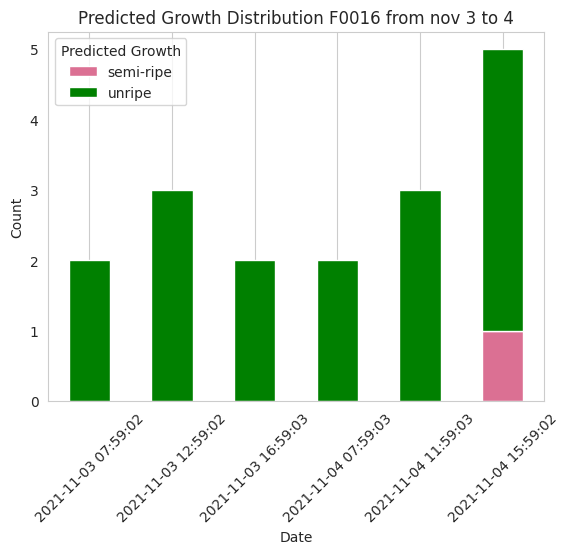

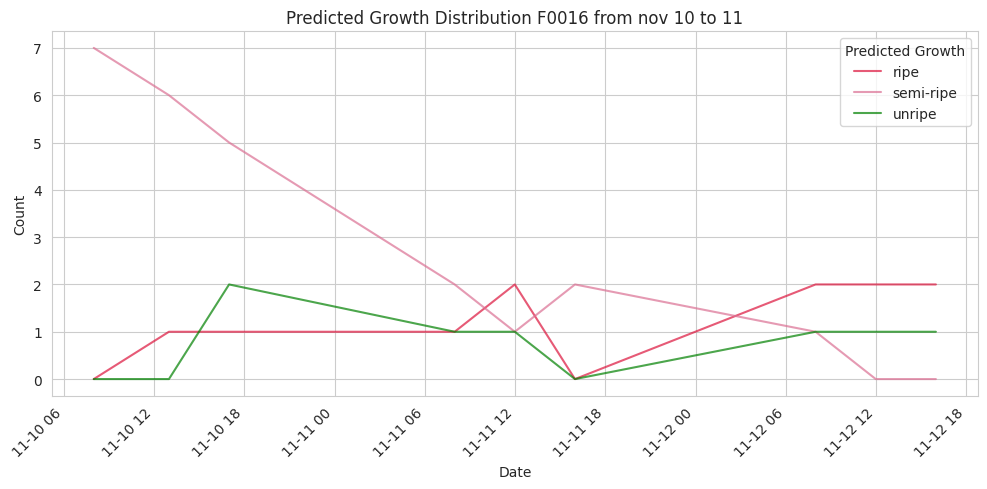

<Figure size 1200x600 with 0 Axes>

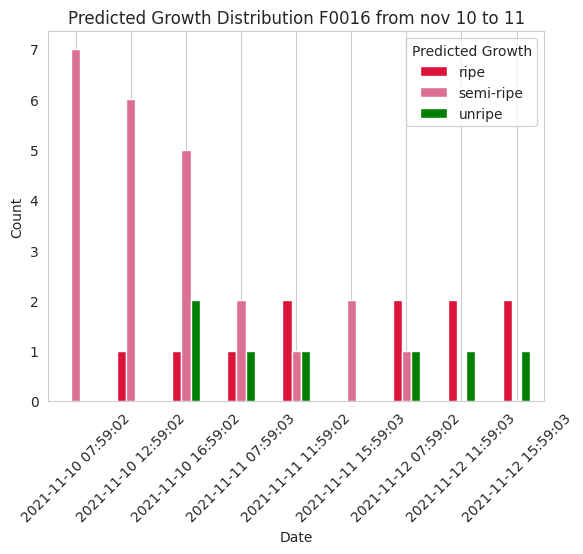

<Figure size 1200x600 with 0 Axes>

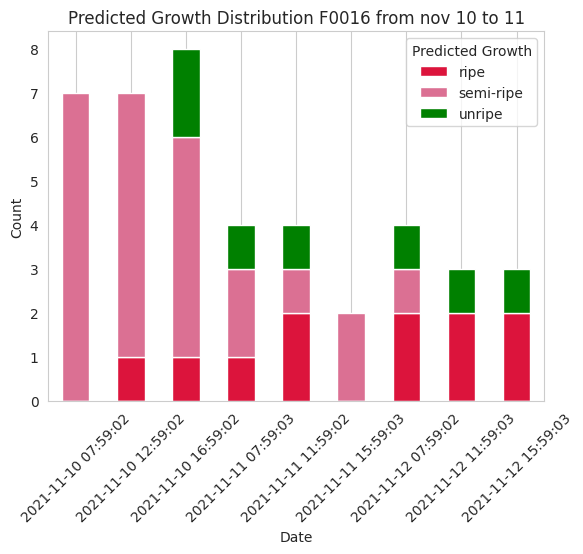

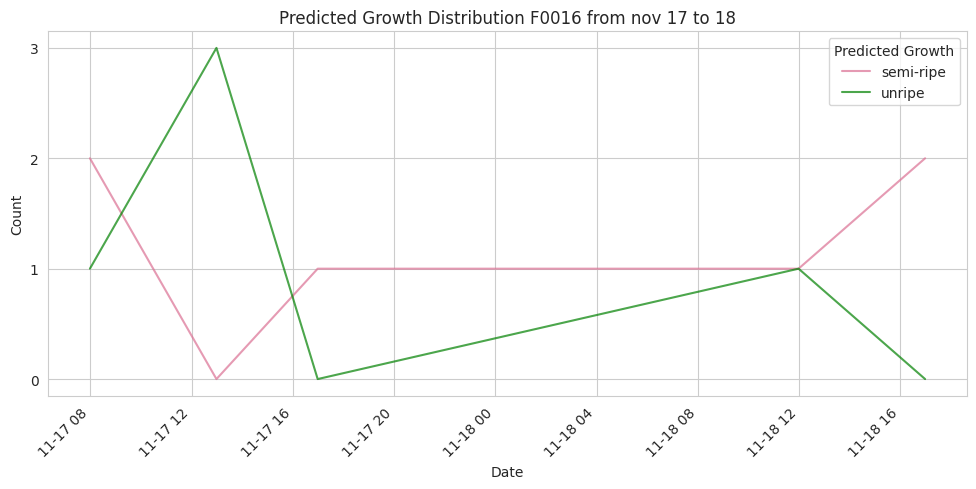

<Figure size 1200x600 with 0 Axes>

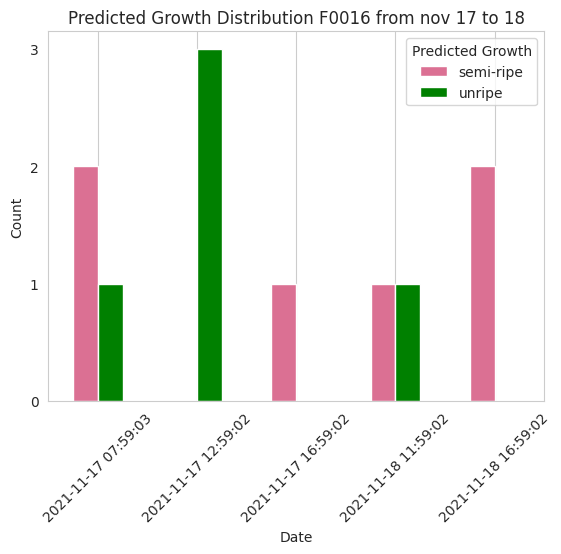

<Figure size 1200x600 with 0 Axes>

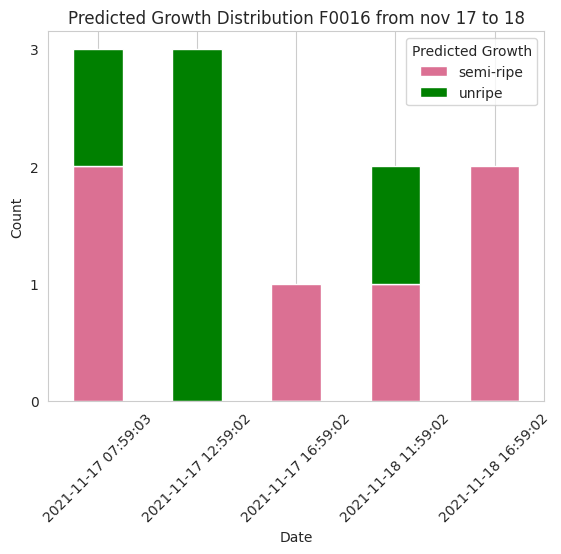

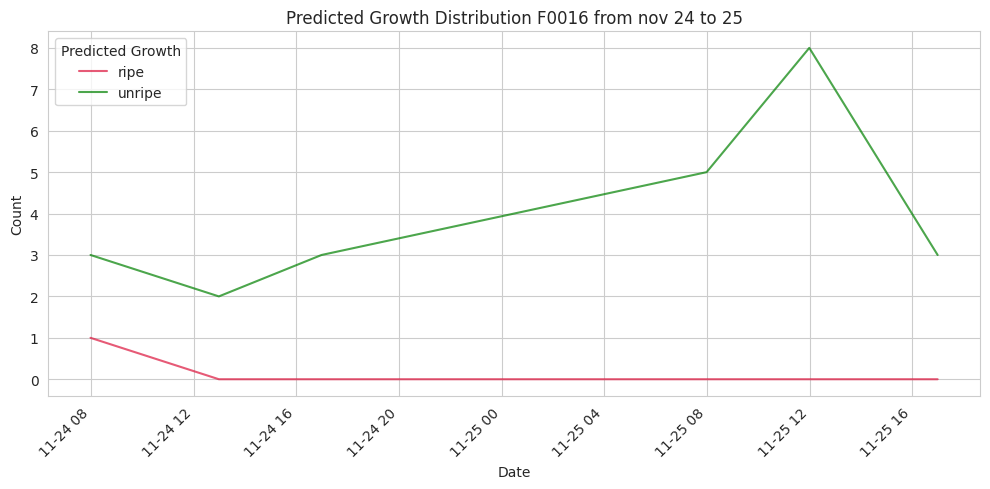

<Figure size 1200x600 with 0 Axes>

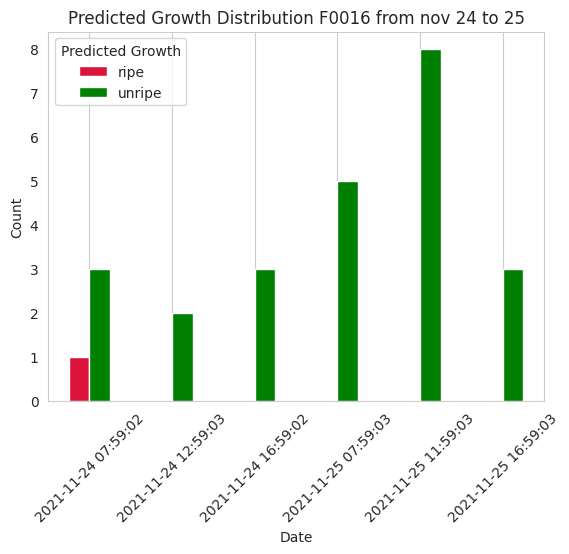

<Figure size 1200x600 with 0 Axes>

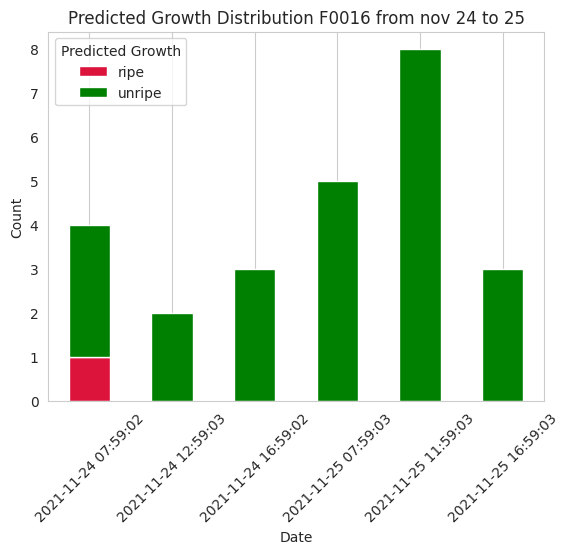

In [15]:
select_nov_1 = F0016_21_22_nov_data[(F0016_21_22_nov_data['shot_datetime'] >= '2021-11-03') & (F0016_21_22_nov_data['shot_datetime'] <= '2021-11-05')]
select_nov_2 = F0016_21_22_nov_data[(F0016_21_22_nov_data['shot_datetime'] >= '2021-11-10') & (F0016_21_22_nov_data['shot_datetime'] <= '2021-11-13')]
select_nov_3 = F0016_21_22_nov_data[(F0016_21_22_nov_data['shot_datetime'] >= '2021-11-17') & (F0016_21_22_nov_data['shot_datetime'] <= '2021-11-19')]
select_nov_4 = F0016_21_22_nov_data[(F0016_21_22_nov_data['shot_datetime'] >= '2021-11-24') & (F0016_21_22_nov_data['shot_datetime'] <= '2021-11-26')]

nov_1_counts = select_nov_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_2_counts = select_nov_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_3_counts = select_nov_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_4_counts = select_nov_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(nov_1_counts, 'Predicted Growth Distribution F0016 from nov 3 to 4'),
            (nov_2_counts, 'Predicted Growth Distribution F0016 from nov 10 to 11'),
            (nov_3_counts, 'Predicted Growth Distribution F0016 from nov 17 to 18'),
            (nov_4_counts, 'Predicted Growth Distribution F0016 from nov 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 21-22작기 12월 생산량 추이

/tmp/ipykernel_21186/3838329037.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_dec_data['shot_datetime'] = pd.to_datetime(F0016_21_22_dec_data['shot_datetime'])


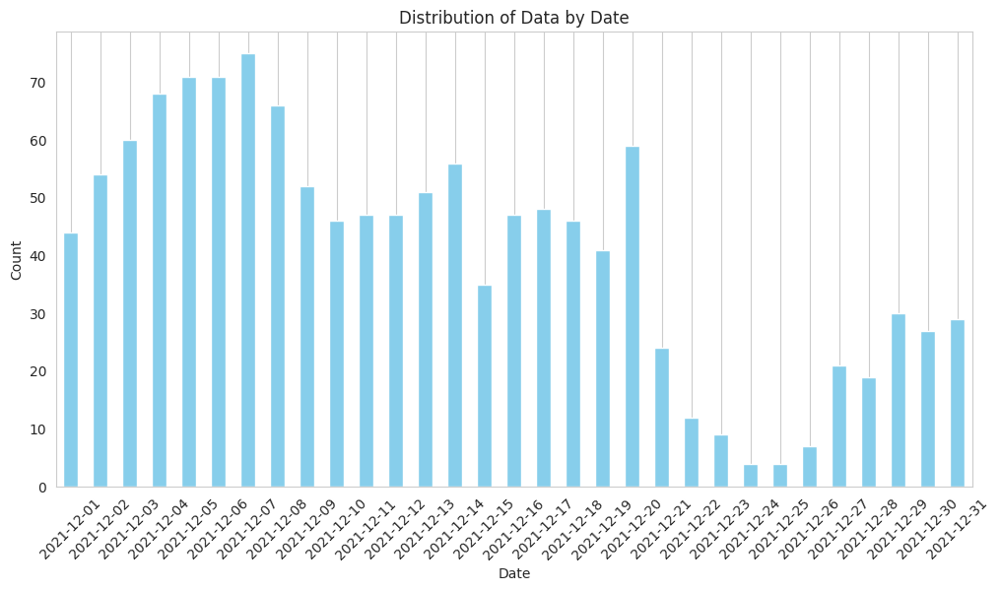

In [16]:
# F0016_21_22_dec_data 생성
F0016_21_22_dec_data = F0016_21_22[F0016_21_22['측정월'] == 12]
F0016_21_22_dec_data['shot_datetime'] = pd.to_datetime(F0016_21_22_dec_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_dec_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

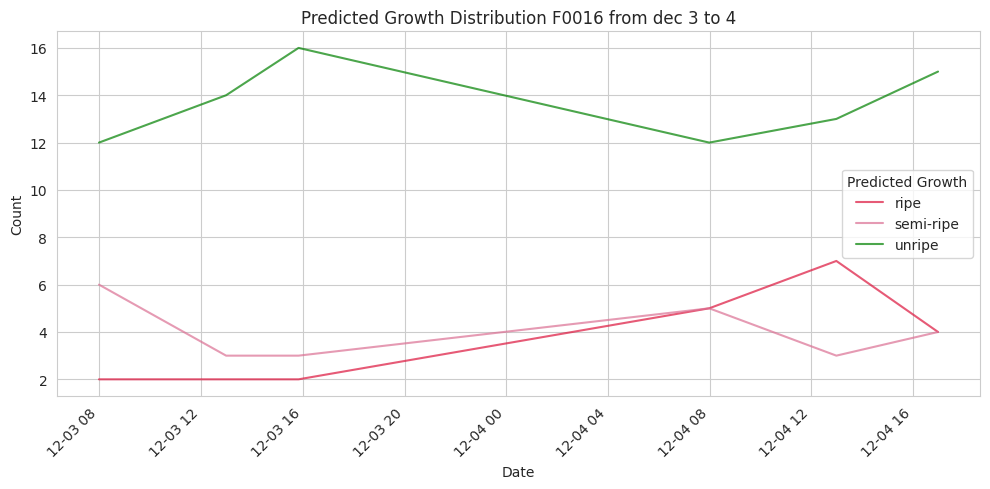

<Figure size 1200x600 with 0 Axes>

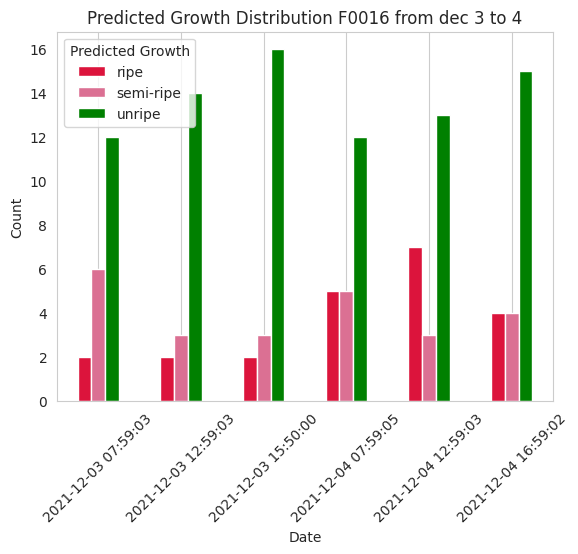

<Figure size 1200x600 with 0 Axes>

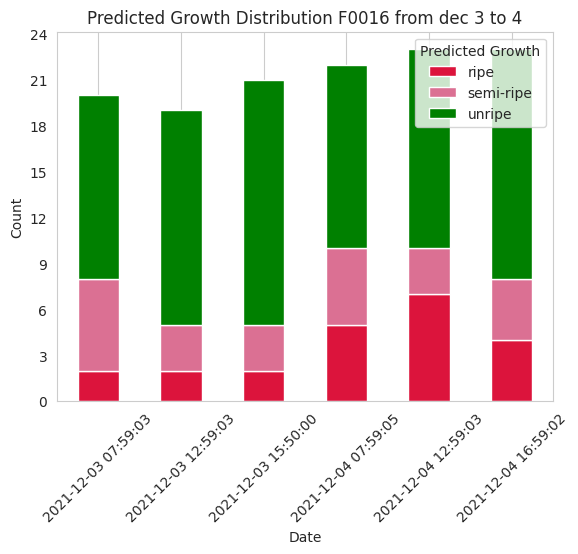

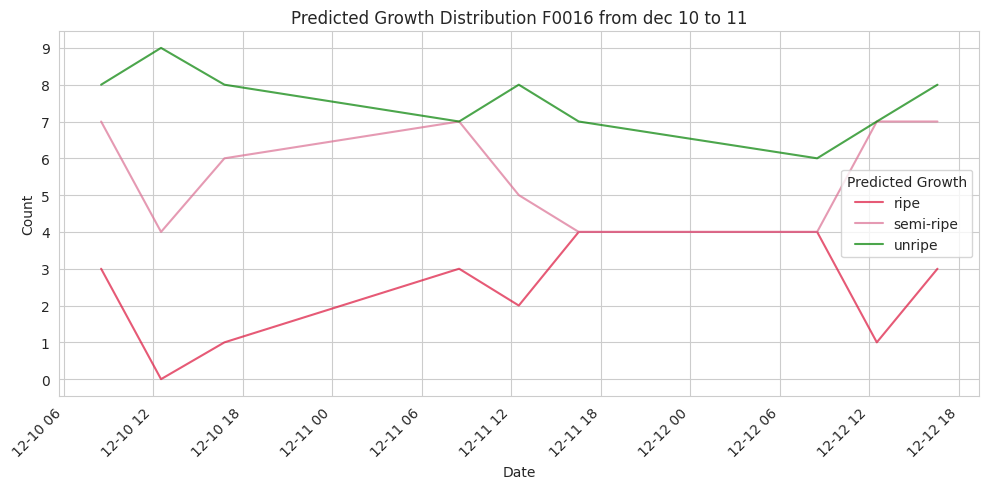

<Figure size 1200x600 with 0 Axes>

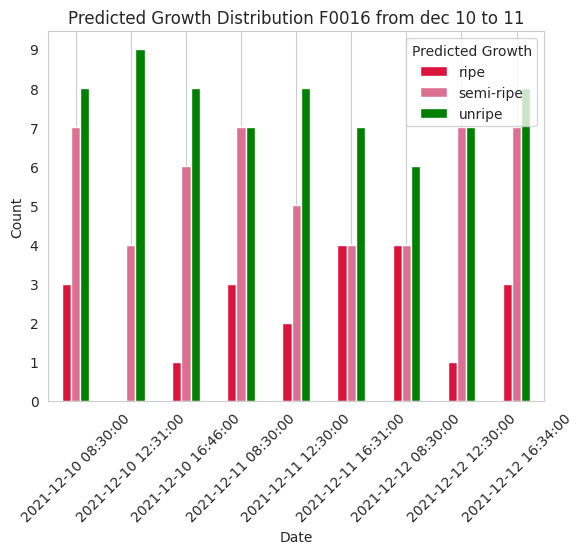

<Figure size 1200x600 with 0 Axes>

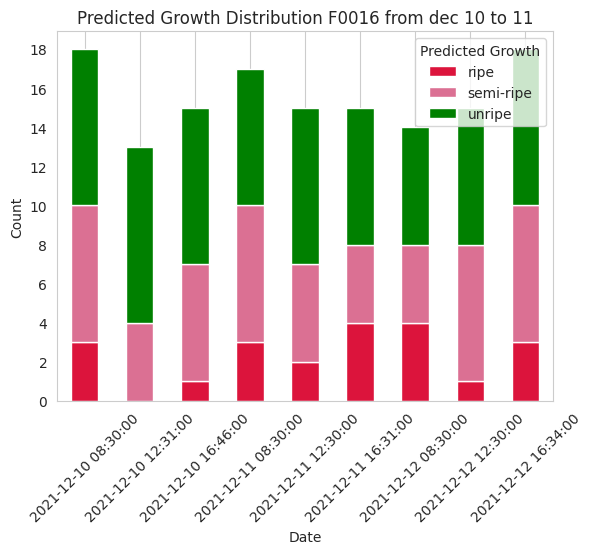

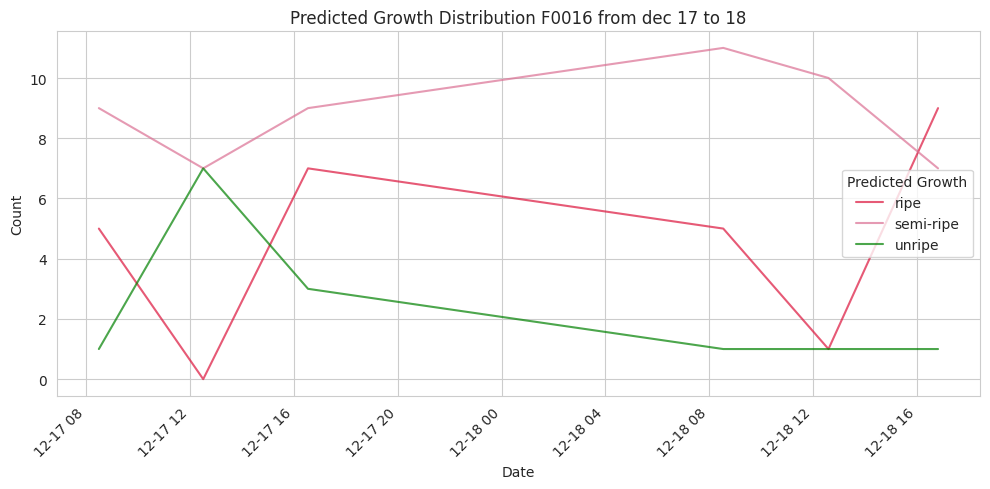

<Figure size 1200x600 with 0 Axes>

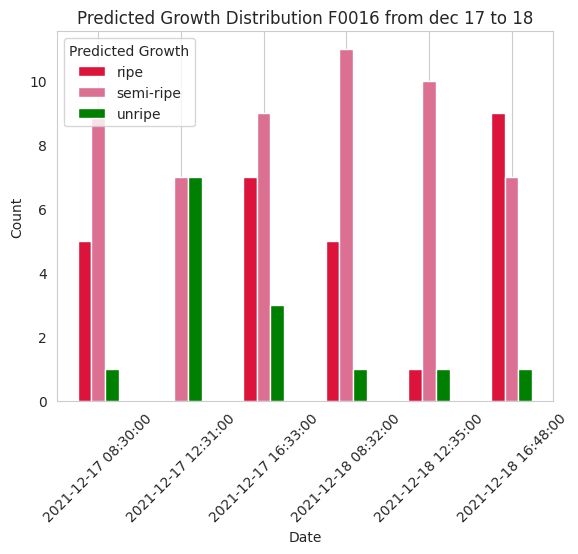

<Figure size 1200x600 with 0 Axes>

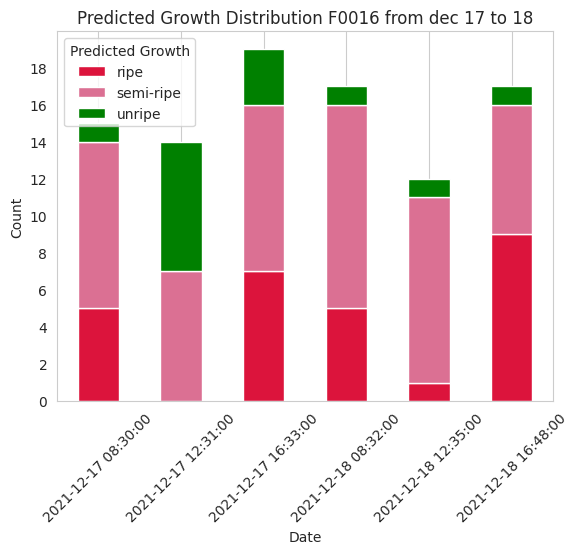

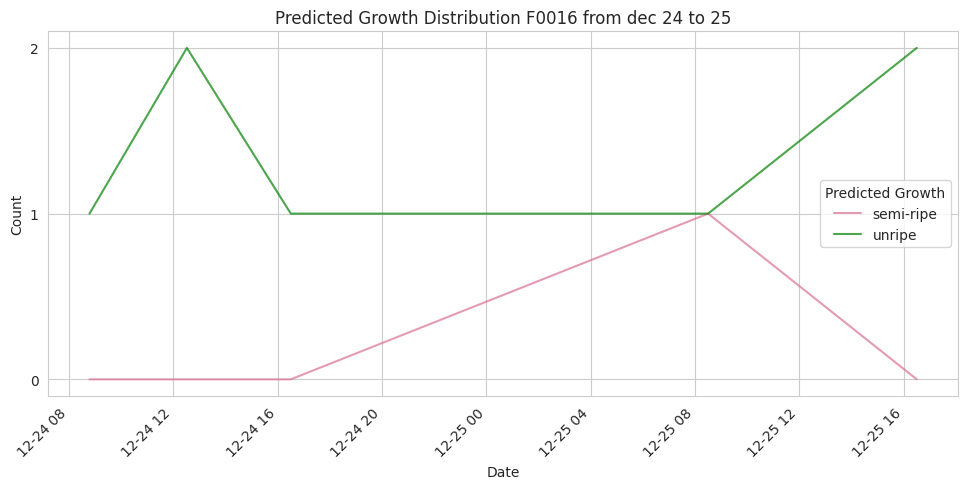

<Figure size 1200x600 with 0 Axes>

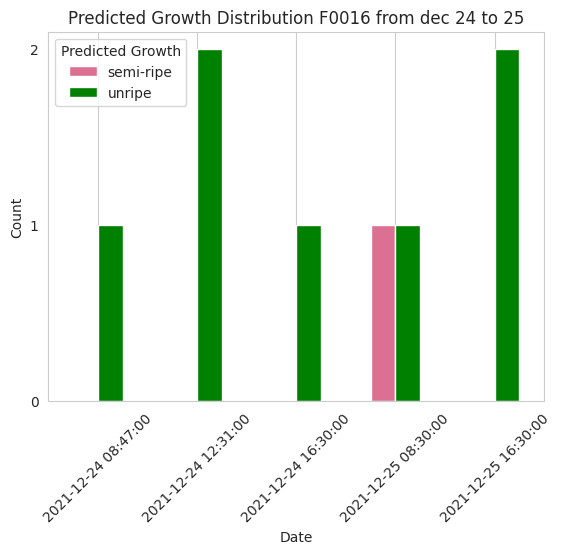

<Figure size 1200x600 with 0 Axes>

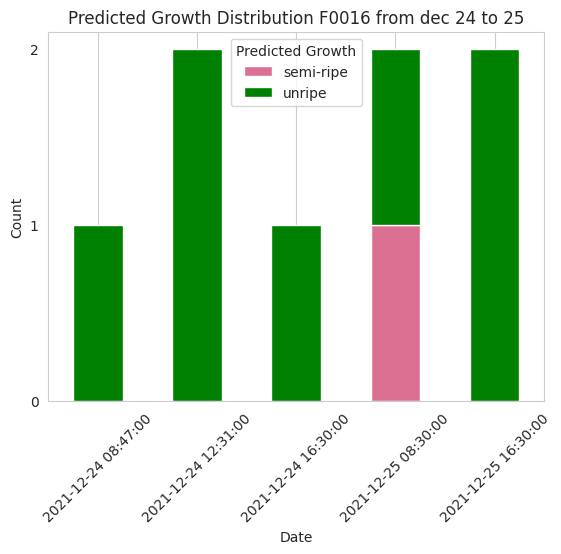

In [17]:
select_dec_1 = F0016_21_22_dec_data[(F0016_21_22_dec_data['shot_datetime'] >= '2021-12-03') & (F0016_21_22_dec_data['shot_datetime'] <= '2021-12-05')]
select_dec_2 = F0016_21_22_dec_data[(F0016_21_22_dec_data['shot_datetime'] >= '2021-12-10') & (F0016_21_22_dec_data['shot_datetime'] <= '2021-12-13')]
select_dec_3 = F0016_21_22_dec_data[(F0016_21_22_dec_data['shot_datetime'] >= '2021-12-17') & (F0016_21_22_dec_data['shot_datetime'] <= '2021-12-19')]
select_dec_4 = F0016_21_22_dec_data[(F0016_21_22_dec_data['shot_datetime'] >= '2021-12-24') & (F0016_21_22_dec_data['shot_datetime'] <= '2021-12-26')]

dec_1_counts = select_dec_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_2_counts = select_dec_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_3_counts = select_dec_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_4_counts = select_dec_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(dec_1_counts, 'Predicted Growth Distribution F0016 from dec 3 to 4'),
            (dec_2_counts, 'Predicted Growth Distribution F0016 from dec 10 to 11'),
            (dec_3_counts, 'Predicted Growth Distribution F0016 from dec 17 to 18'),
            (dec_4_counts, 'Predicted Growth Distribution F0016 from dec 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016_21_22 1월 주차별 확인

/tmp/ipykernel_21186/3500081191.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_jan_data['shot_datetime'] = pd.to_datetime(F0016_21_22_jan_data['shot_datetime'])


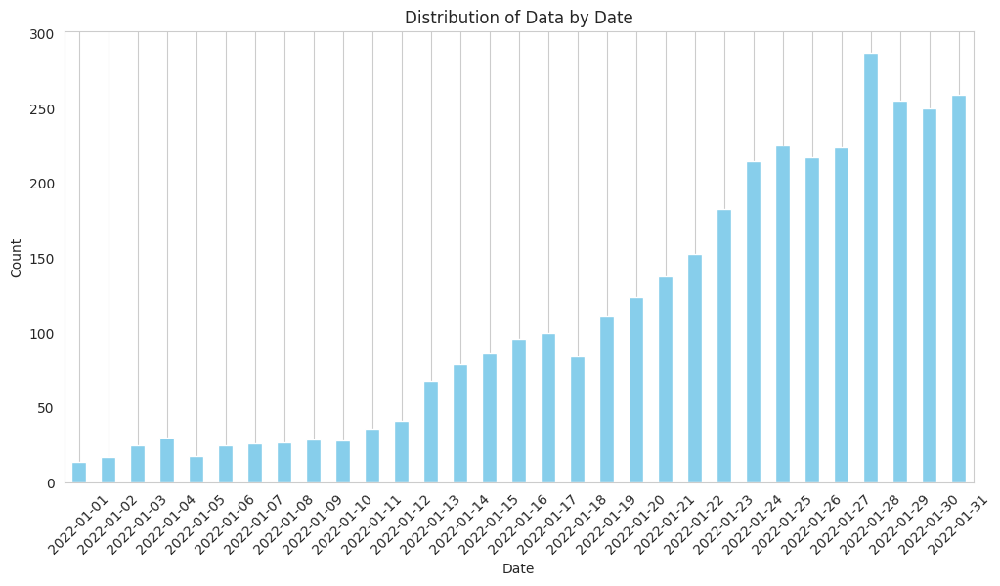

In [18]:
# F0016_21_22_jan_data 생성
F0016_21_22_jan_data = F0016_21_22[F0016_21_22['측정월'] == 1]
F0016_21_22_jan_data['shot_datetime'] = pd.to_datetime(F0016_21_22_jan_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_jan_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

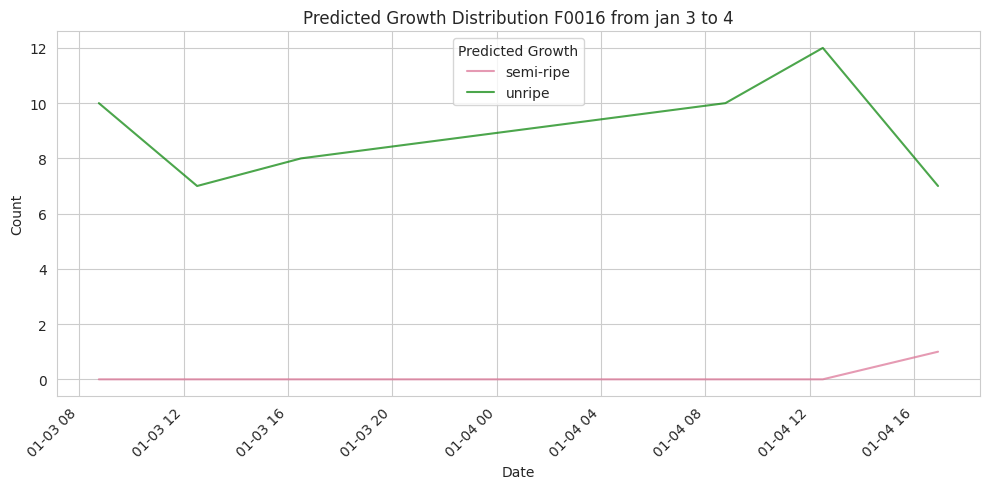

<Figure size 1200x600 with 0 Axes>

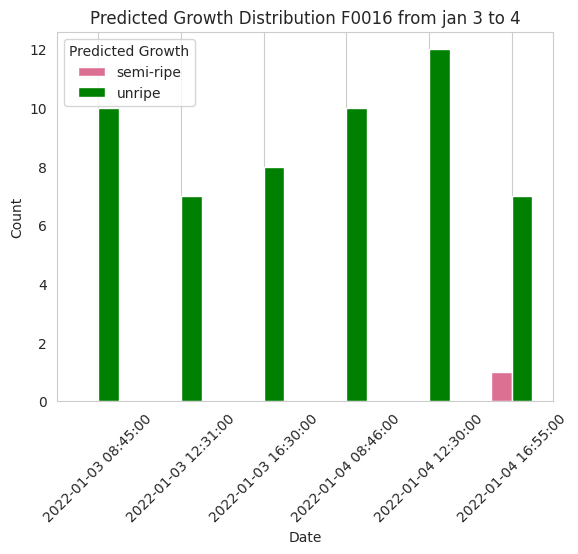

<Figure size 1200x600 with 0 Axes>

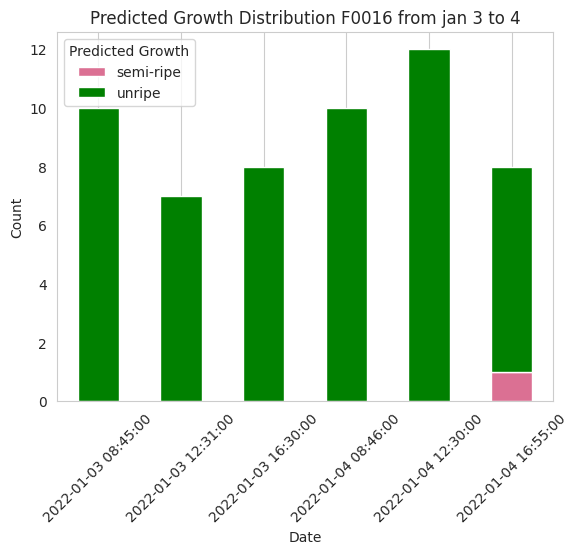

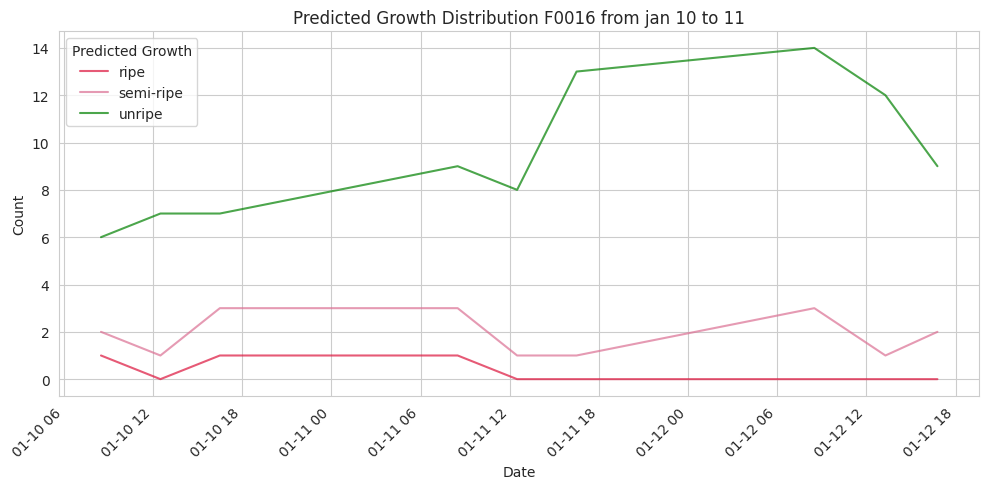

<Figure size 1200x600 with 0 Axes>

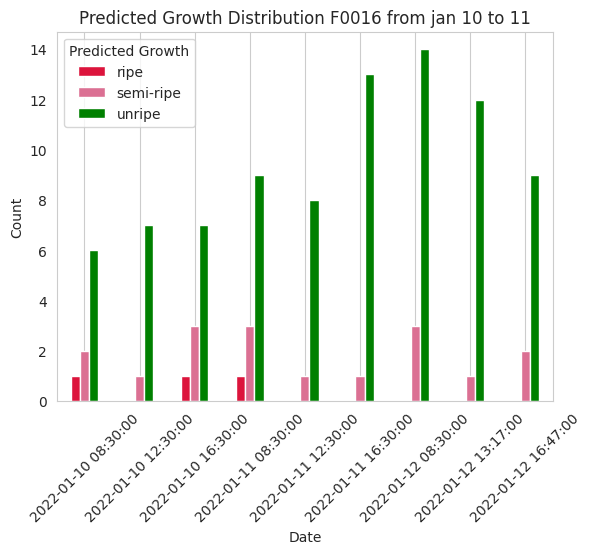

<Figure size 1200x600 with 0 Axes>

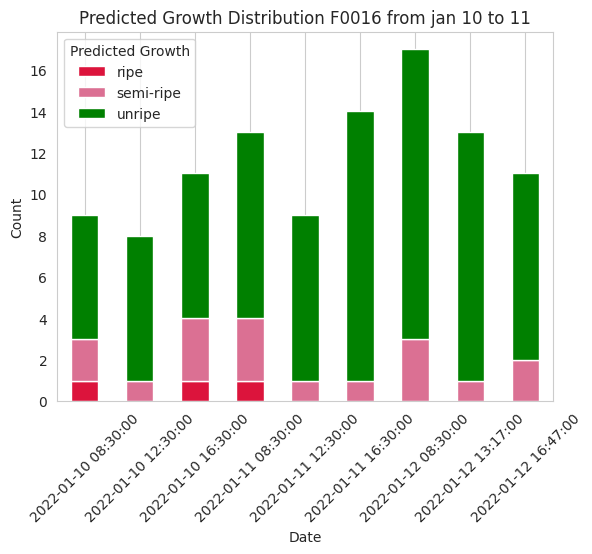

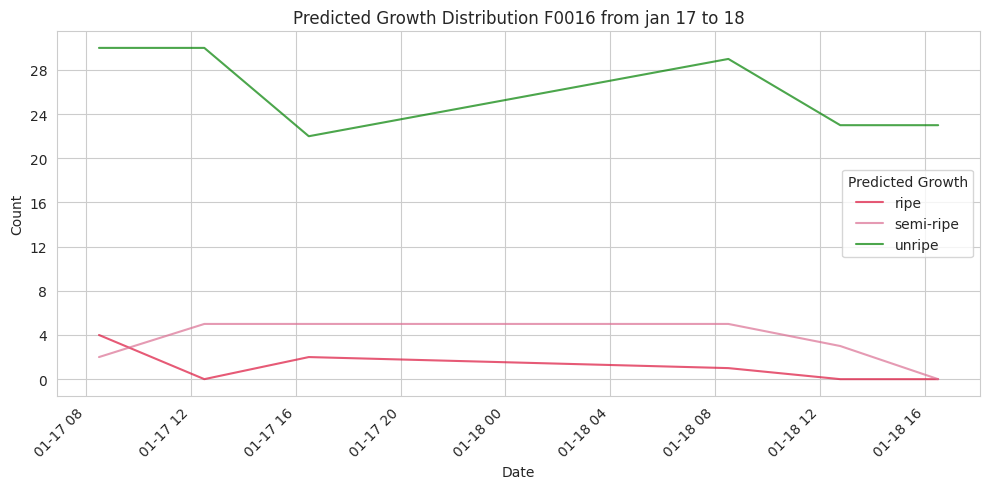

<Figure size 1200x600 with 0 Axes>

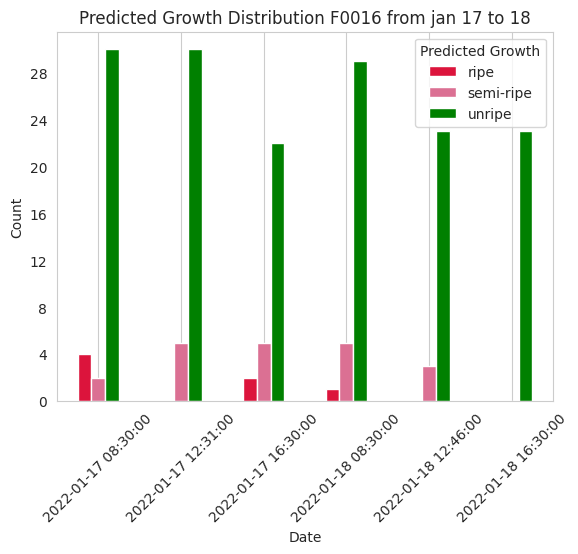

<Figure size 1200x600 with 0 Axes>

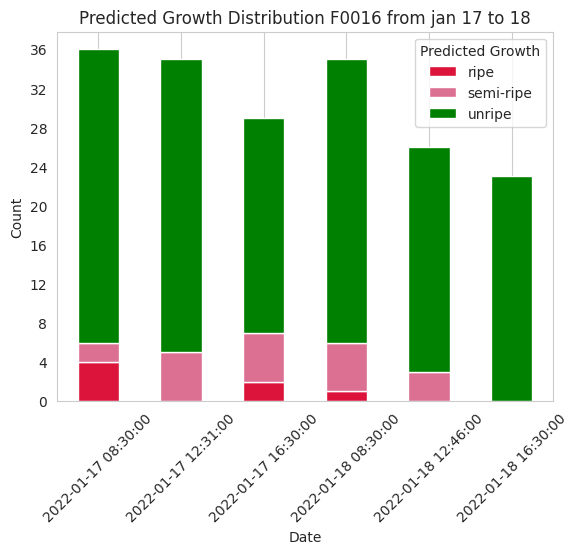

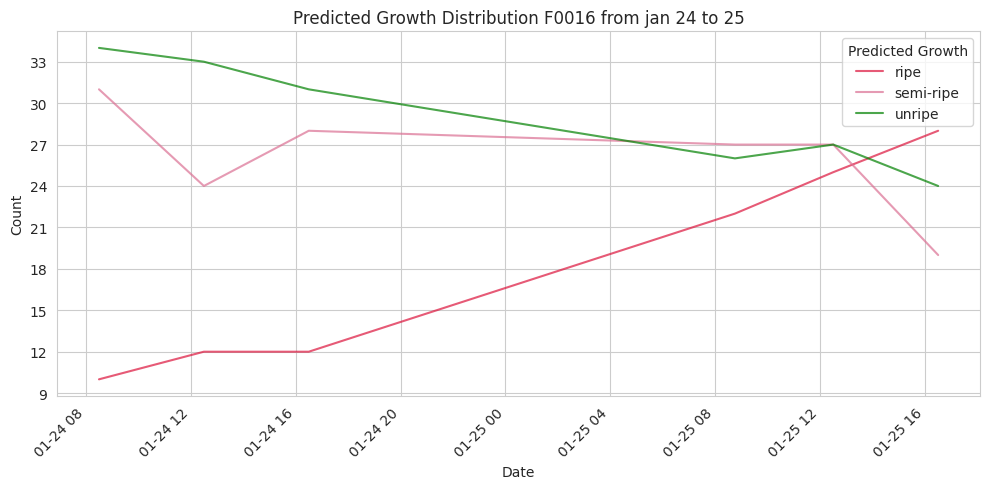

<Figure size 1200x600 with 0 Axes>

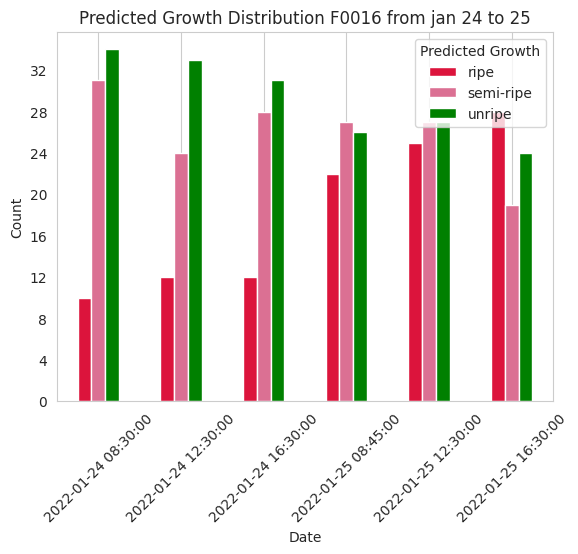

<Figure size 1200x600 with 0 Axes>

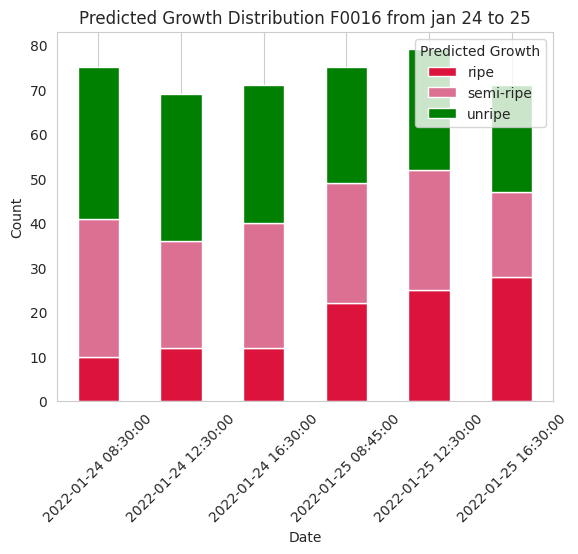

In [19]:
select_jan_1 = F0016_21_22_jan_data[(F0016_21_22_jan_data['shot_datetime'] >= '2022-01-03') & (F0016_21_22_jan_data['shot_datetime'] <= '2022-01-05')]
select_jan_2 = F0016_21_22_jan_data[(F0016_21_22_jan_data['shot_datetime'] >= '2022-01-10') & (F0016_21_22_jan_data['shot_datetime'] <= '2022-01-13')]
select_jan_3 = F0016_21_22_jan_data[(F0016_21_22_jan_data['shot_datetime'] >= '2022-01-17') & (F0016_21_22_jan_data['shot_datetime'] <= '2022-01-19')]
select_jan_4 = F0016_21_22_jan_data[(F0016_21_22_jan_data['shot_datetime'] >= '2022-01-24') & (F0016_21_22_jan_data['shot_datetime'] <= '2022-01-26')]

jan_1_counts = select_jan_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_2_counts = select_jan_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_3_counts = select_jan_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_4_counts = select_jan_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')
# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(jan_1_counts, 'Predicted Growth Distribution F0016 from jan 3 to 4'),
            (jan_2_counts, 'Predicted Growth Distribution F0016 from jan 10 to 11'),
            (jan_3_counts, 'Predicted Growth Distribution F0016 from jan 17 to 18'),
            (jan_4_counts, 'Predicted Growth Distribution F0016 from jan 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 21-22작기 2월 생산량 추이 

/tmp/ipykernel_21186/1084877396.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_feb_data['shot_datetime'] = pd.to_datetime(F0016_21_22_feb_data['shot_datetime'])


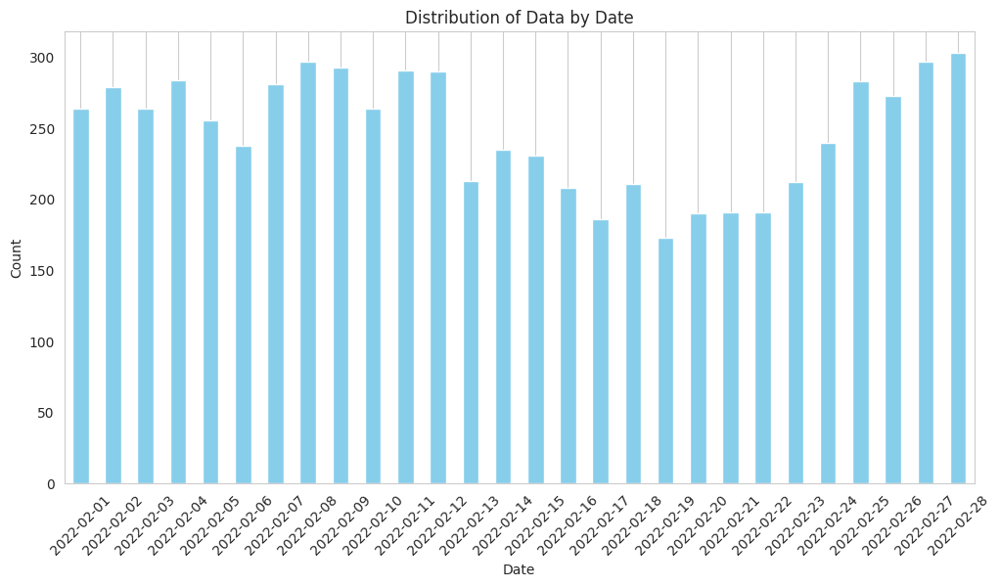

In [20]:
# F0016_21_22_feb_data 생성
F0016_21_22_feb_data = F0016_21_22[F0016_21_22['측정월'] == 2]
F0016_21_22_feb_data['shot_datetime'] = pd.to_datetime(F0016_21_22_feb_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_feb_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

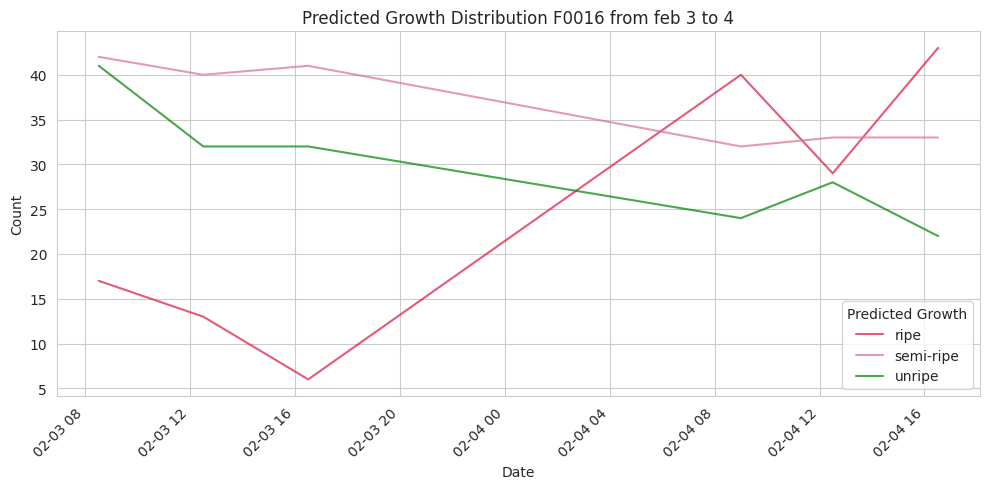

<Figure size 1200x600 with 0 Axes>

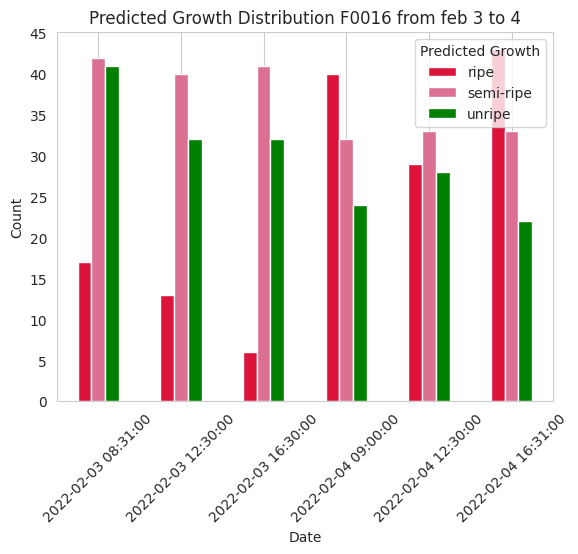

<Figure size 1200x600 with 0 Axes>

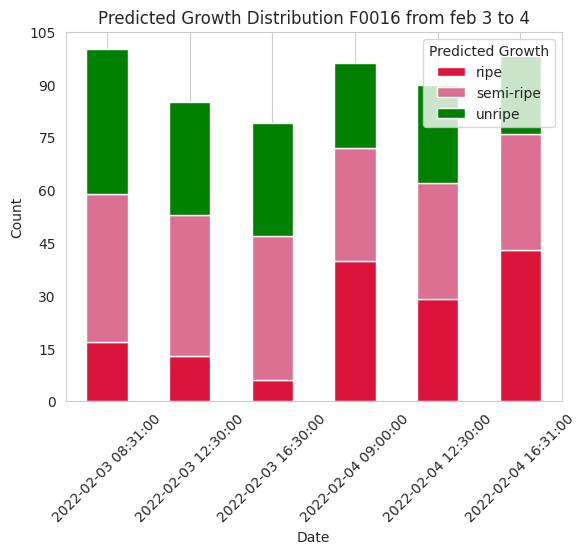

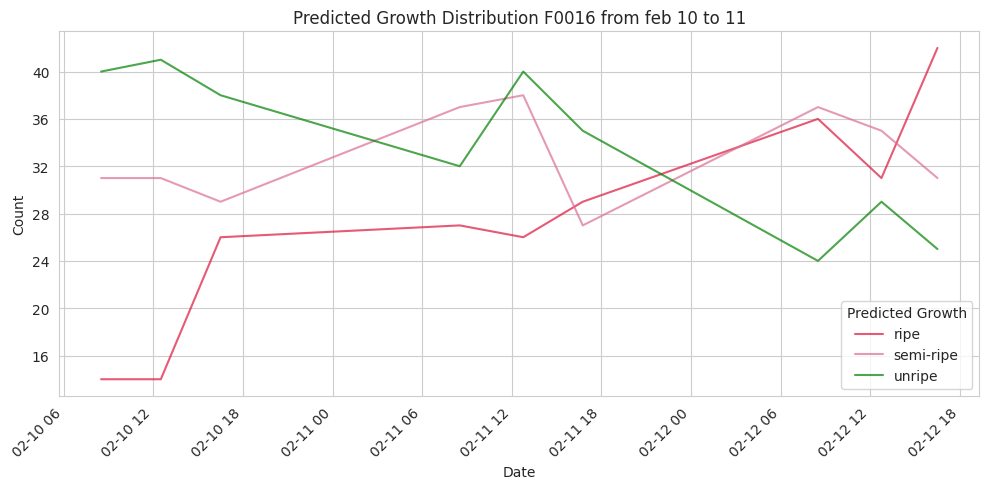

<Figure size 1200x600 with 0 Axes>

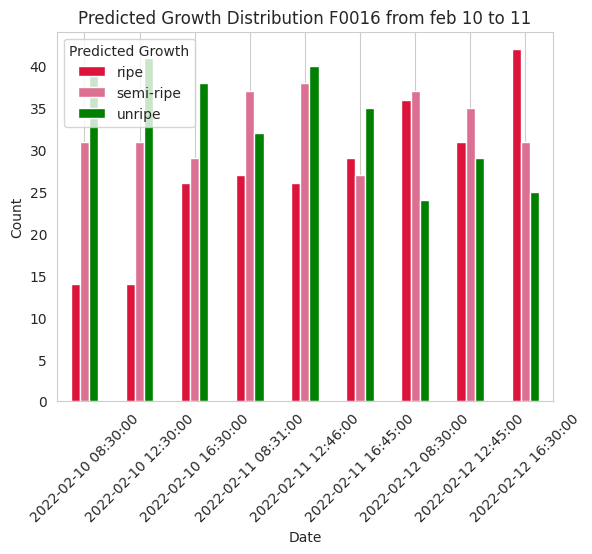

<Figure size 1200x600 with 0 Axes>

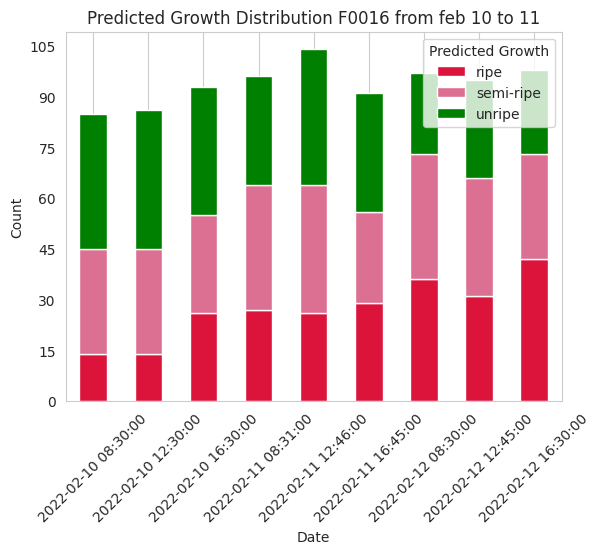

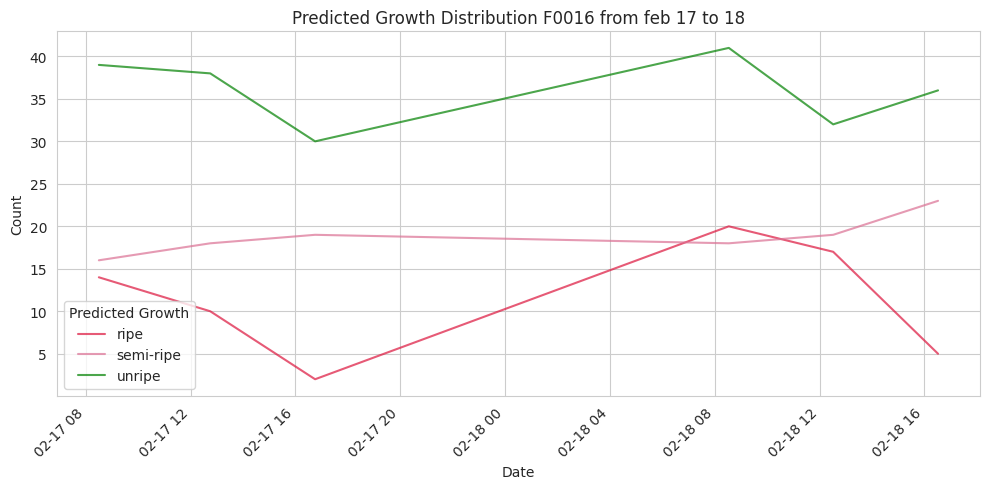

<Figure size 1200x600 with 0 Axes>

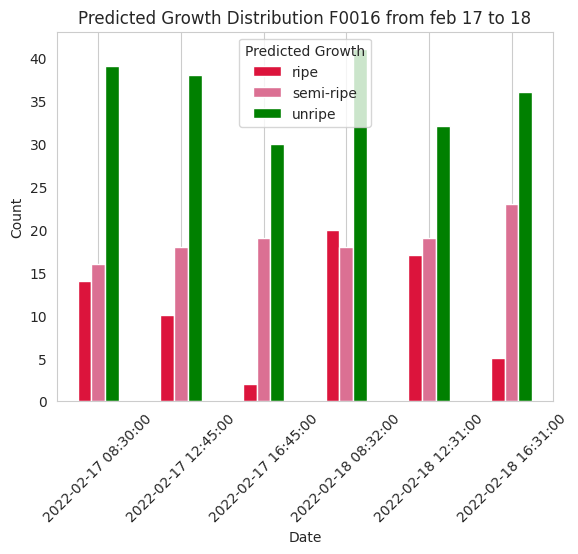

<Figure size 1200x600 with 0 Axes>

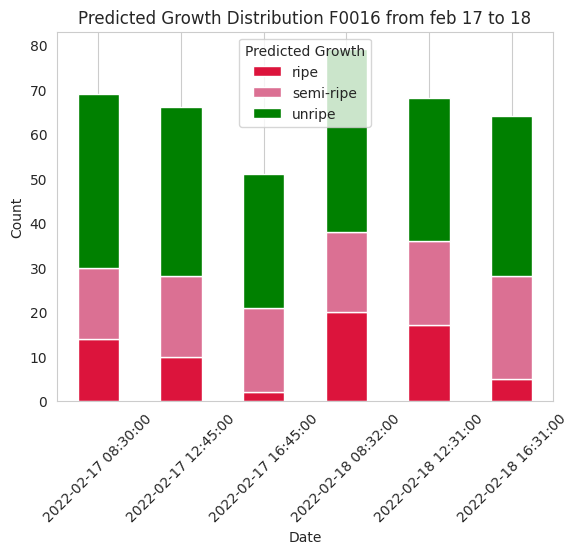

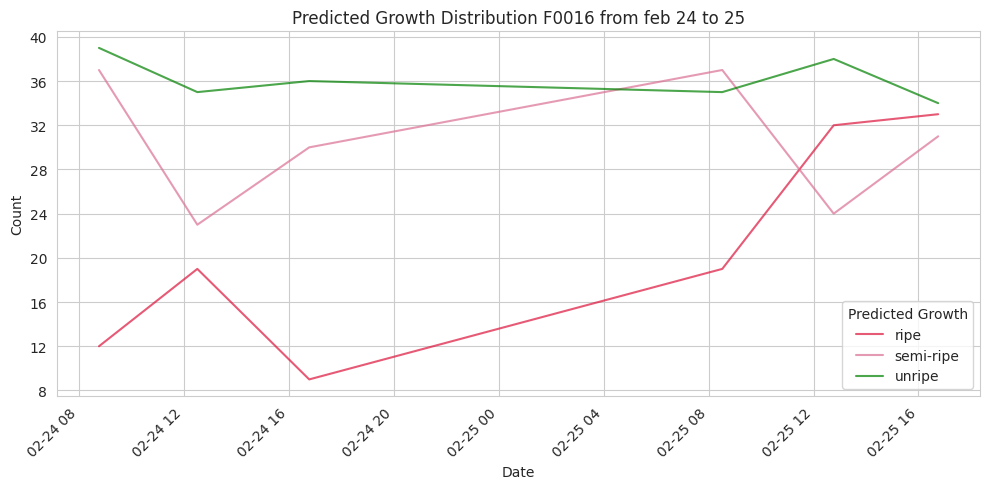

<Figure size 1200x600 with 0 Axes>

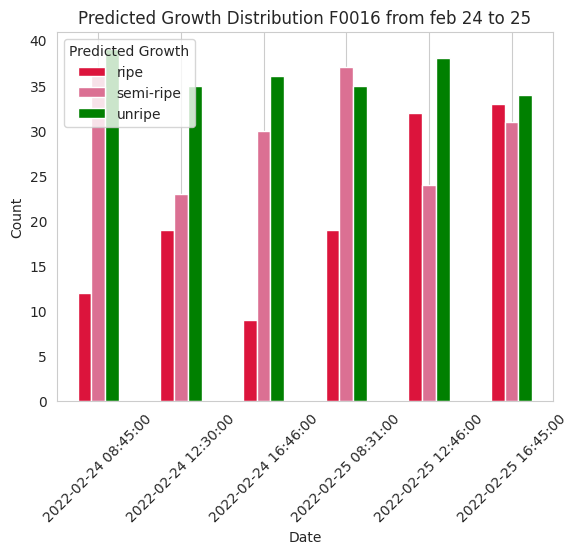

<Figure size 1200x600 with 0 Axes>

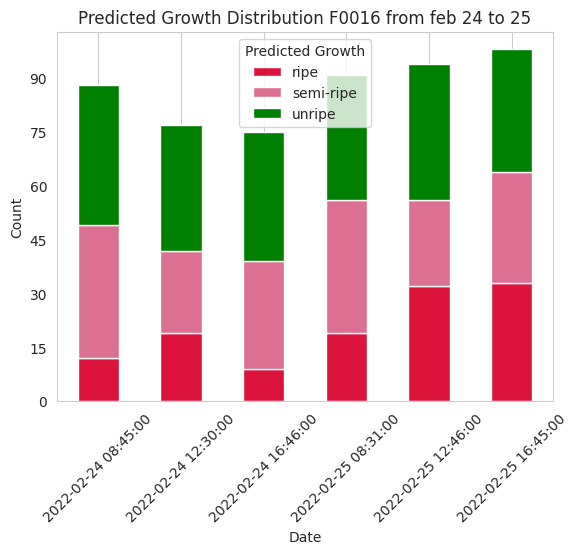

In [21]:
select_feb_1 = F0016_21_22_feb_data[(F0016_21_22_feb_data['shot_datetime'] >= '2022-02-03') & (F0016_21_22_feb_data['shot_datetime'] <= '2022-02-05')]
select_feb_2 = F0016_21_22_feb_data[(F0016_21_22_feb_data['shot_datetime'] >= '2022-02-10') & (F0016_21_22_feb_data['shot_datetime'] <= '2022-02-13')]
select_feb_3 = F0016_21_22_feb_data[(F0016_21_22_feb_data['shot_datetime'] >= '2022-02-17') & (F0016_21_22_feb_data['shot_datetime'] <= '2022-02-19')]
select_feb_4 = F0016_21_22_feb_data[(F0016_21_22_feb_data['shot_datetime'] >= '2022-02-24') & (F0016_21_22_feb_data['shot_datetime'] <= '2022-02-26')]

feb_1_counts = select_feb_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_2_counts = select_feb_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_3_counts = select_feb_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_4_counts = select_feb_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(feb_1_counts, 'Predicted Growth Distribution F0016 from feb 3 to 4'),
            (feb_2_counts, 'Predicted Growth Distribution F0016 from feb 10 to 11'),
            (feb_3_counts, 'Predicted Growth Distribution F0016 from feb 17 to 18'),
            (feb_4_counts, 'Predicted Growth Distribution F0016 from feb 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 21-22작기 3월 생산량 추이 

/tmp/ipykernel_21186/717022652.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_mar_data['shot_datetime'] = pd.to_datetime(F0016_21_22_mar_data['shot_datetime'])


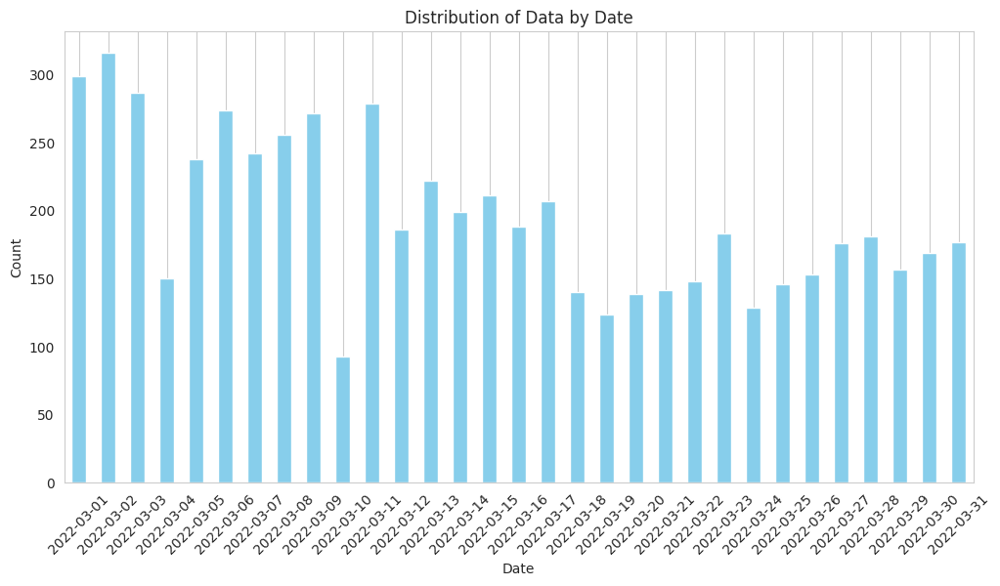

In [22]:
# F0016_21_22_mar_data 생성
F0016_21_22_mar_data = F0016_21_22[F0016_21_22['측정월'] == 3]
F0016_21_22_mar_data['shot_datetime'] = pd.to_datetime(F0016_21_22_mar_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_mar_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

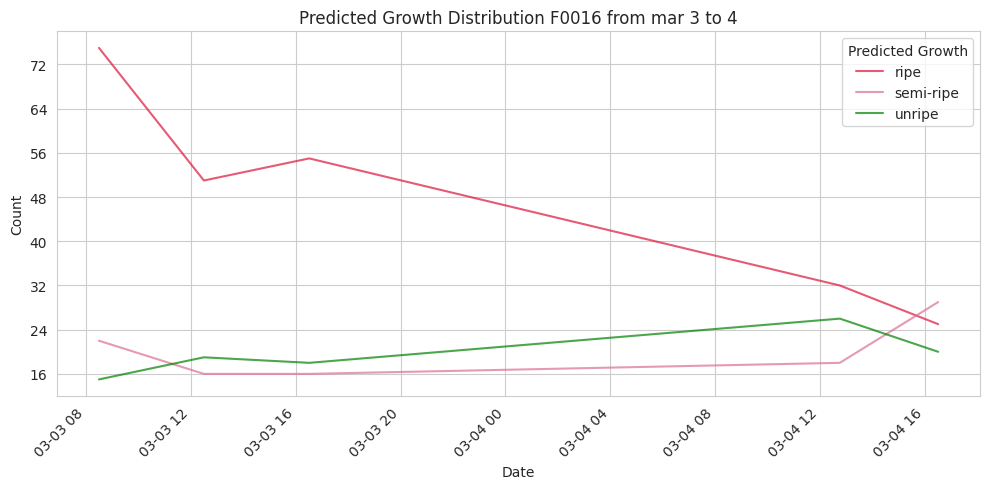

<Figure size 1200x600 with 0 Axes>

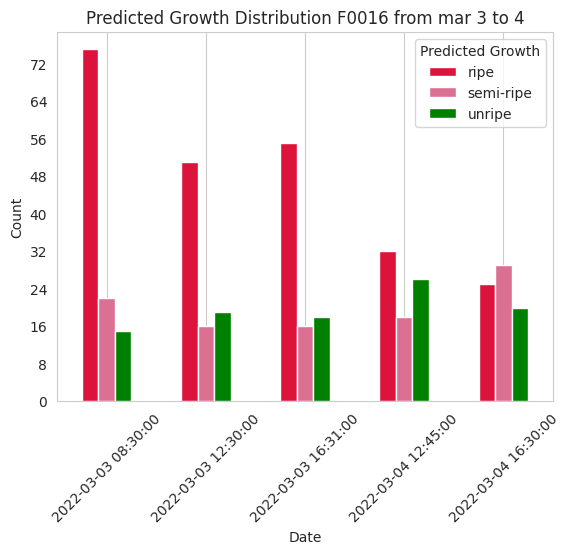

<Figure size 1200x600 with 0 Axes>

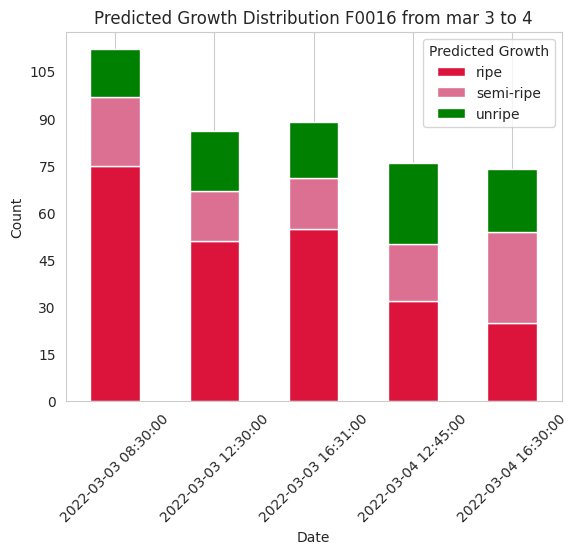

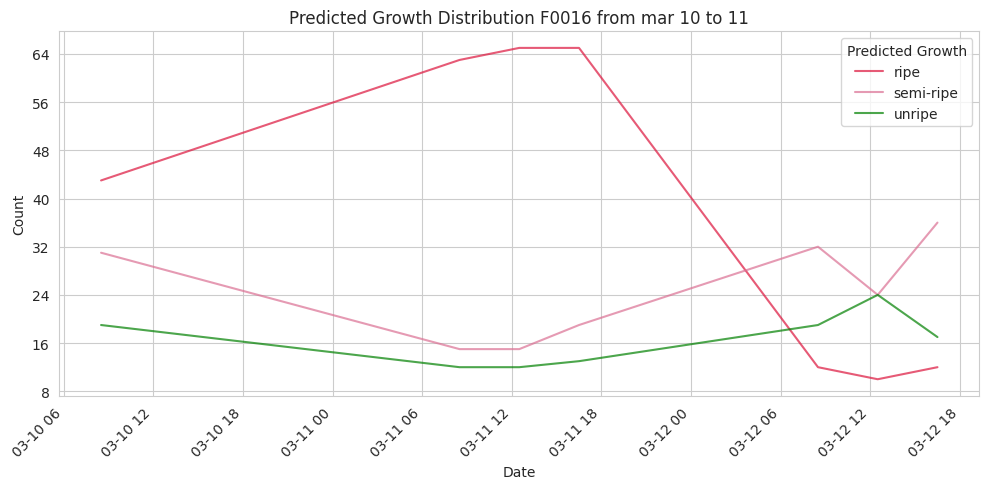

<Figure size 1200x600 with 0 Axes>

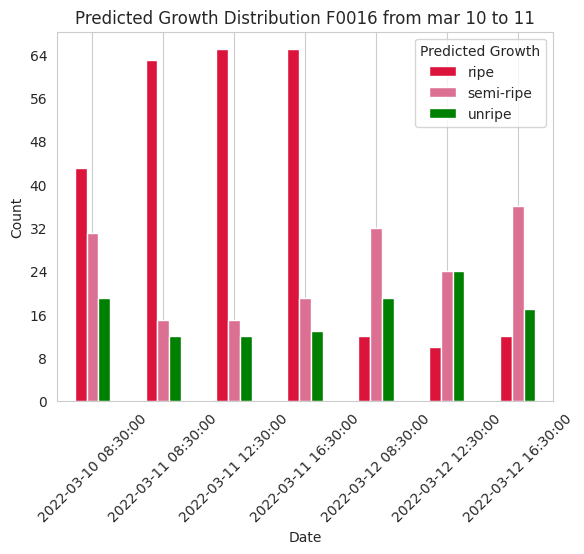

<Figure size 1200x600 with 0 Axes>

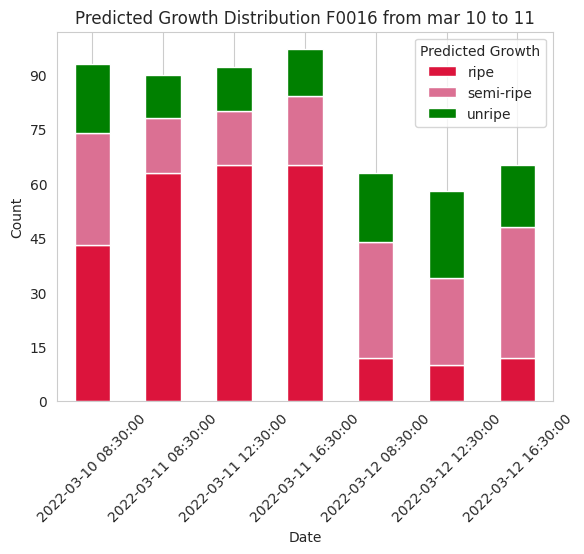

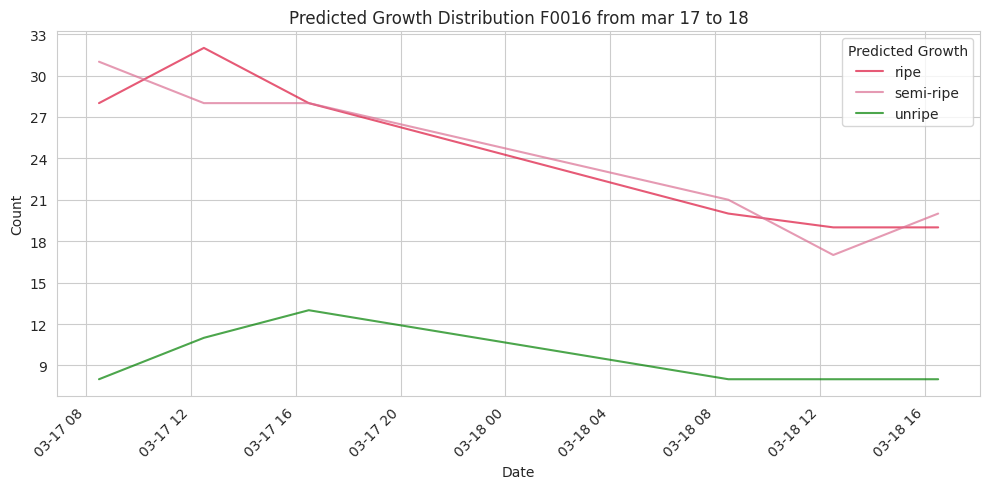

<Figure size 1200x600 with 0 Axes>

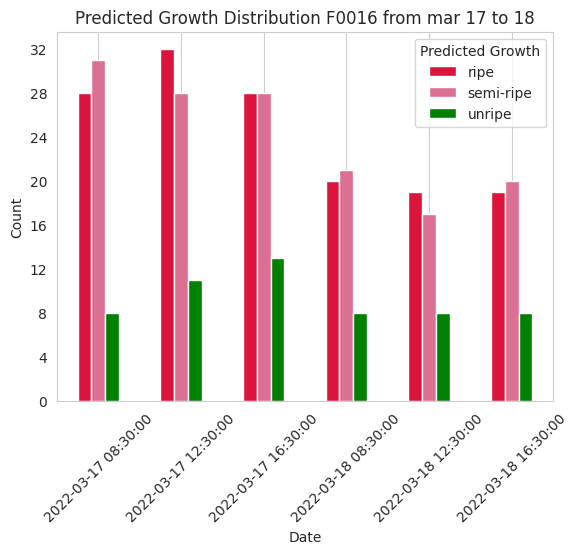

<Figure size 1200x600 with 0 Axes>

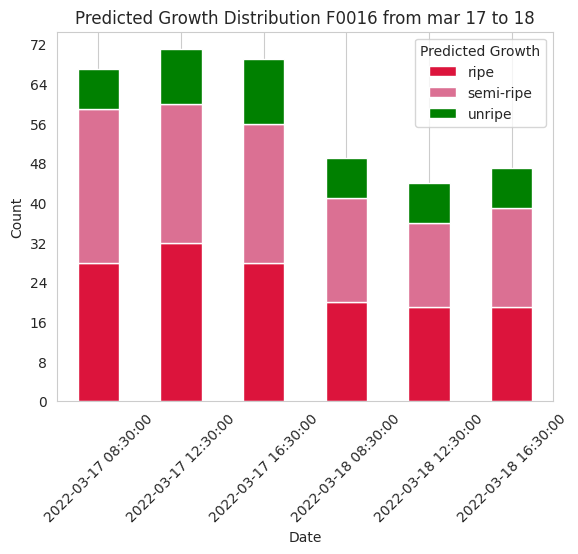

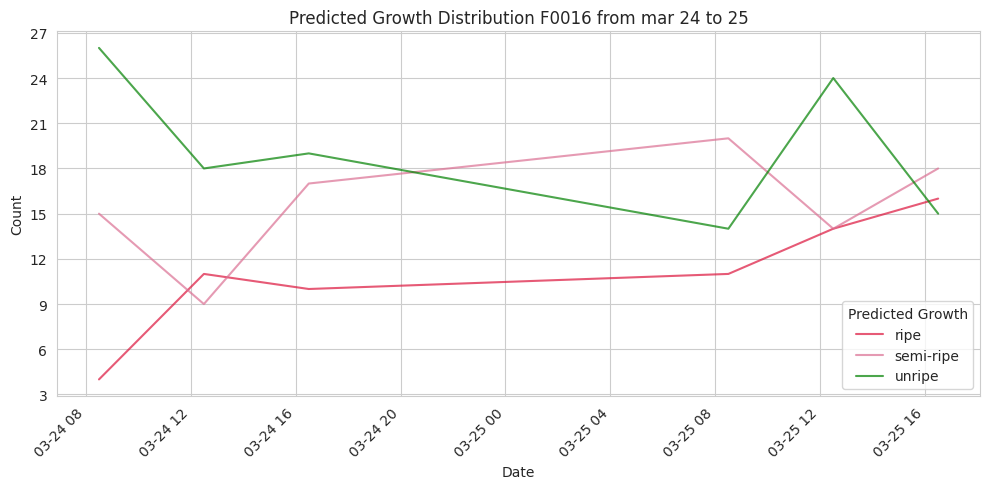

<Figure size 1200x600 with 0 Axes>

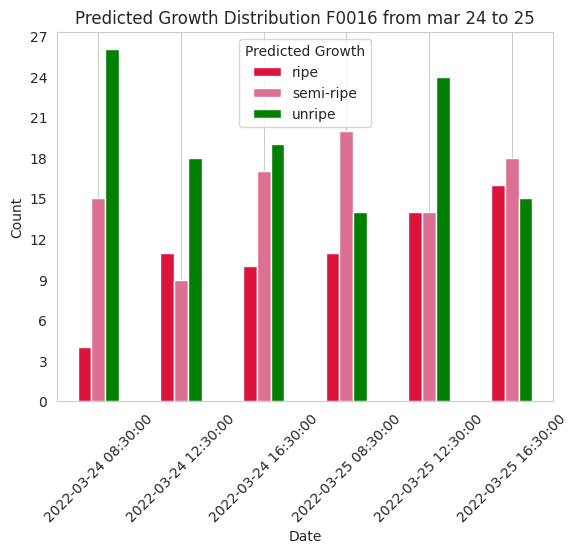

<Figure size 1200x600 with 0 Axes>

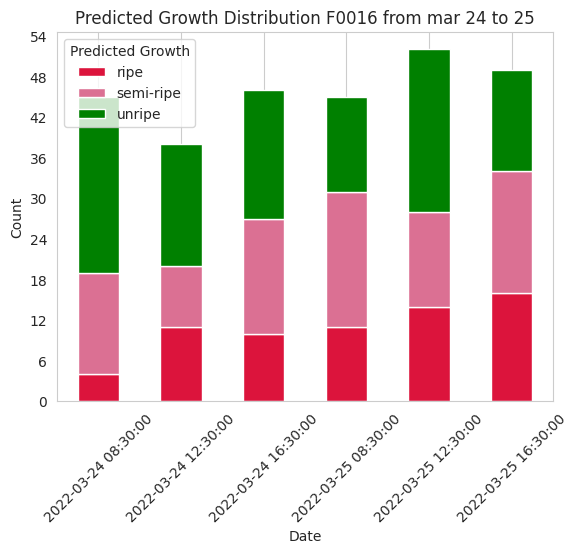

In [23]:
select_mar_1 = F0016_21_22_mar_data[(F0016_21_22_mar_data['shot_datetime'] >= '2022-03-03') & (F0016_21_22_mar_data['shot_datetime'] <= '2022-03-05')]
select_mar_2 = F0016_21_22_mar_data[(F0016_21_22_mar_data['shot_datetime'] >= '2022-03-10') & (F0016_21_22_mar_data['shot_datetime'] <= '2022-03-13')]
select_mar_3 = F0016_21_22_mar_data[(F0016_21_22_mar_data['shot_datetime'] >= '2022-03-17') & (F0016_21_22_mar_data['shot_datetime'] <= '2022-03-19')]
select_mar_4 = F0016_21_22_mar_data[(F0016_21_22_mar_data['shot_datetime'] >= '2022-03-24') & (F0016_21_22_mar_data['shot_datetime'] <= '2022-03-26')]

mar_1_counts = select_mar_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_2_counts = select_mar_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_3_counts = select_mar_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_4_counts = select_mar_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(mar_1_counts, 'Predicted Growth Distribution F0016 from mar 3 to 4'),
            (mar_2_counts, 'Predicted Growth Distribution F0016 from mar 10 to 11'),
            (mar_3_counts, 'Predicted Growth Distribution F0016 from mar 17 to 18'),
            (mar_4_counts, 'Predicted Growth Distribution F0016 from mar 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 21-22작기 4월 생산량 추이 

/tmp/ipykernel_21186/936469190.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_apr_data['shot_datetime'] = pd.to_datetime(F0016_21_22_apr_data['shot_datetime'])


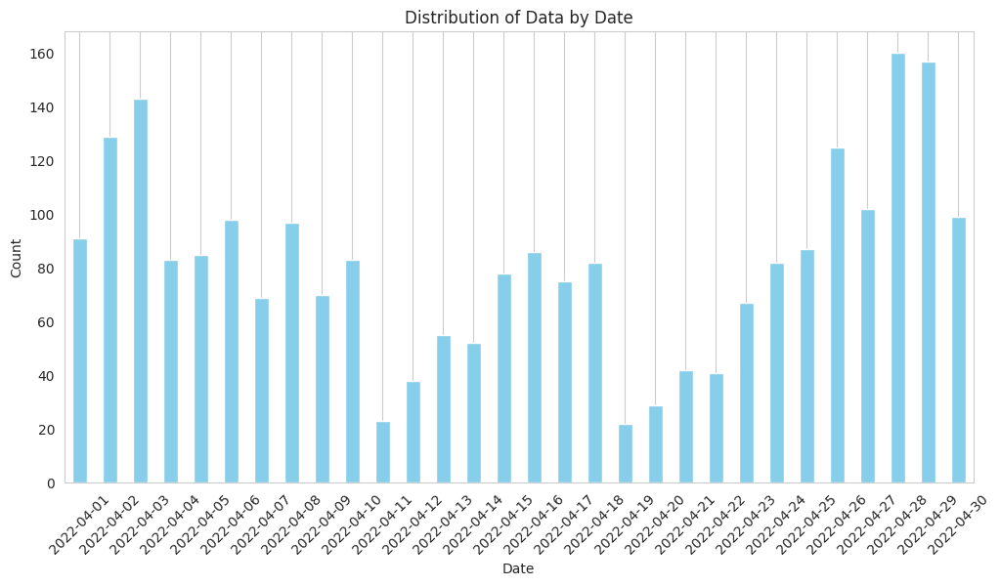

In [24]:
# F0016_21_22_apr_data 생성
F0016_21_22_apr_data = F0016_21_22[F0016_21_22['측정월'] == 4]
F0016_21_22_apr_data['shot_datetime'] = pd.to_datetime(F0016_21_22_apr_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_apr_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

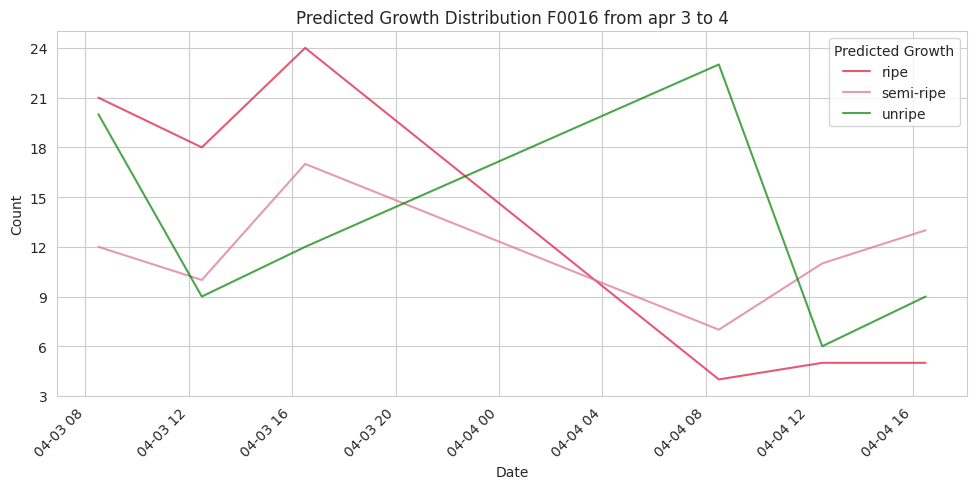

<Figure size 1200x600 with 0 Axes>

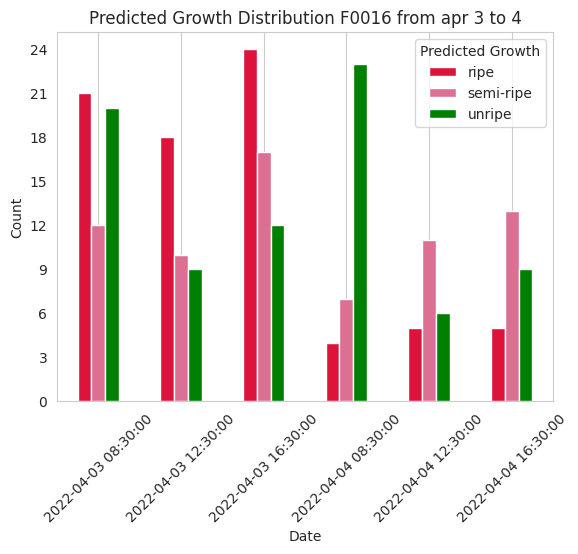

<Figure size 1200x600 with 0 Axes>

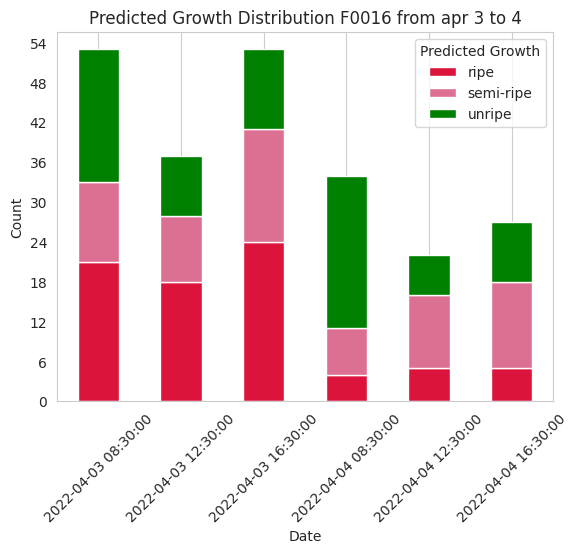

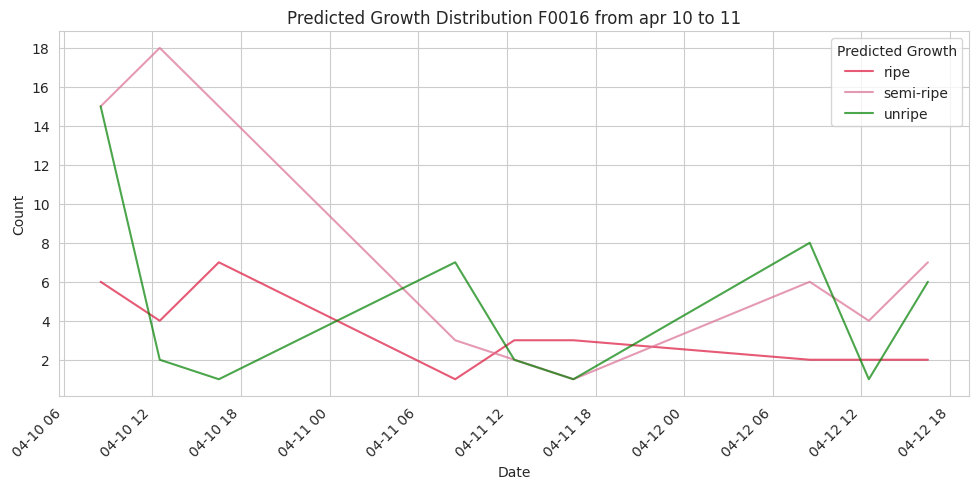

<Figure size 1200x600 with 0 Axes>

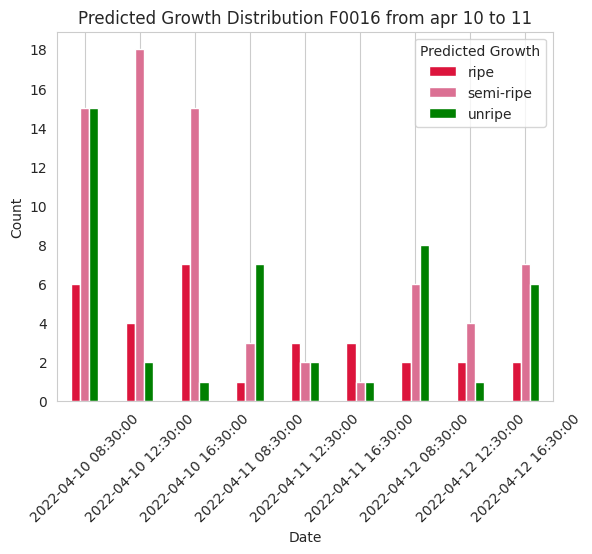

<Figure size 1200x600 with 0 Axes>

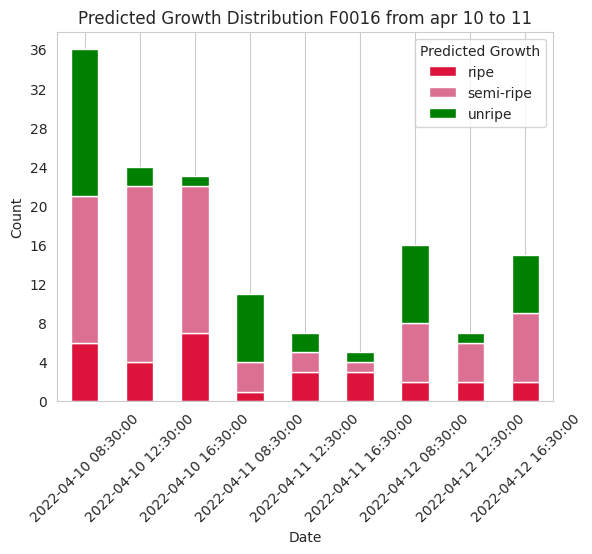

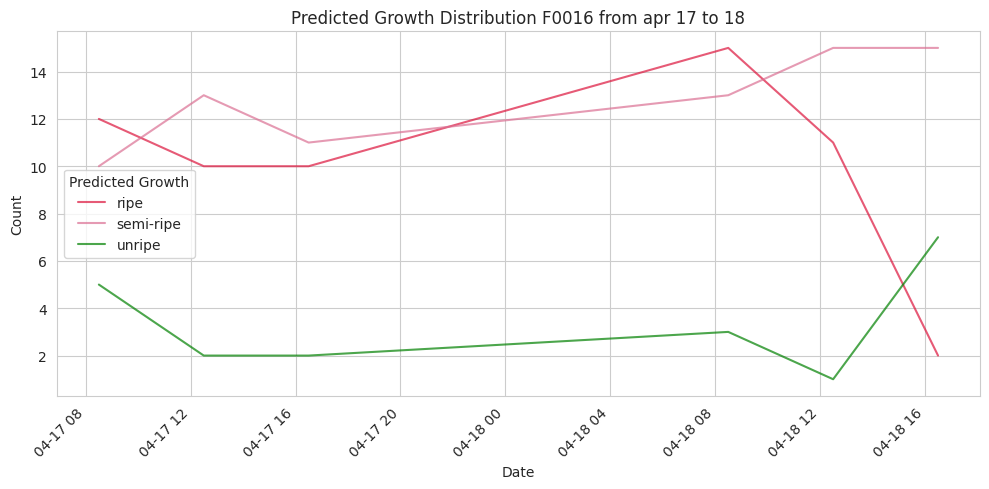

<Figure size 1200x600 with 0 Axes>

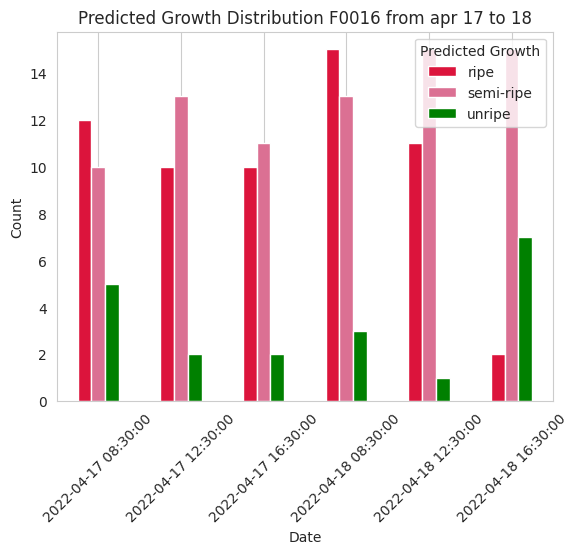

<Figure size 1200x600 with 0 Axes>

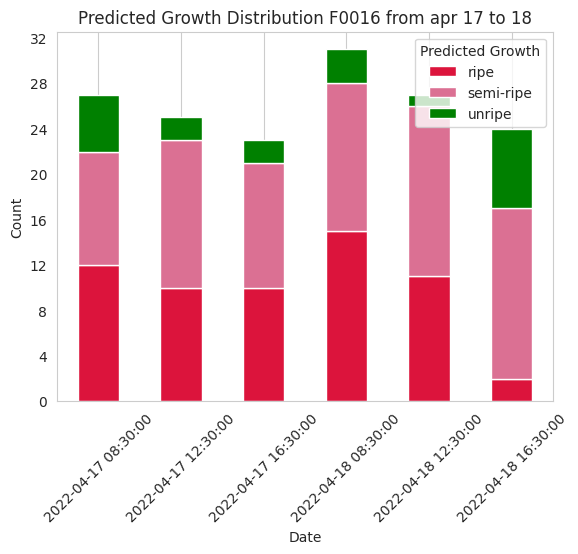

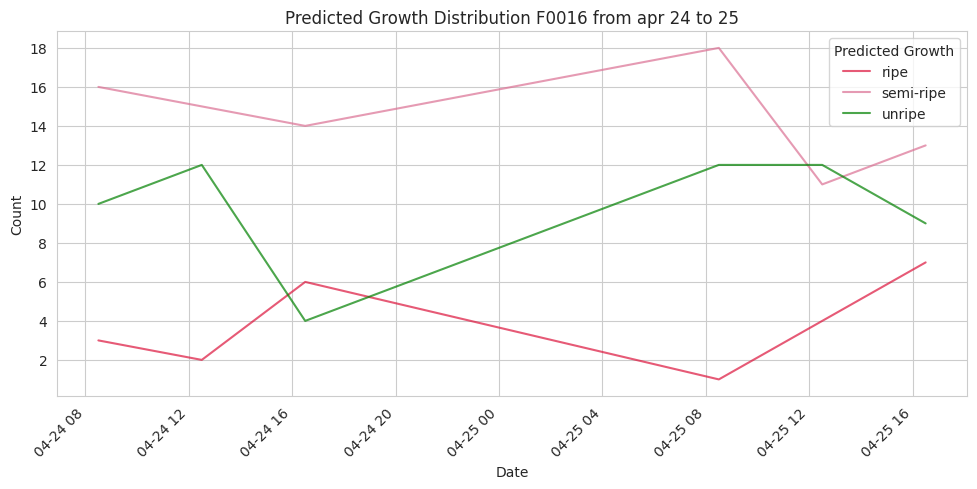

<Figure size 1200x600 with 0 Axes>

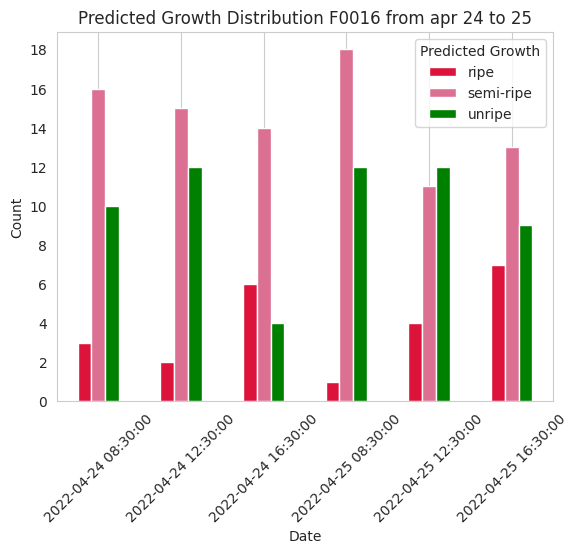

<Figure size 1200x600 with 0 Axes>

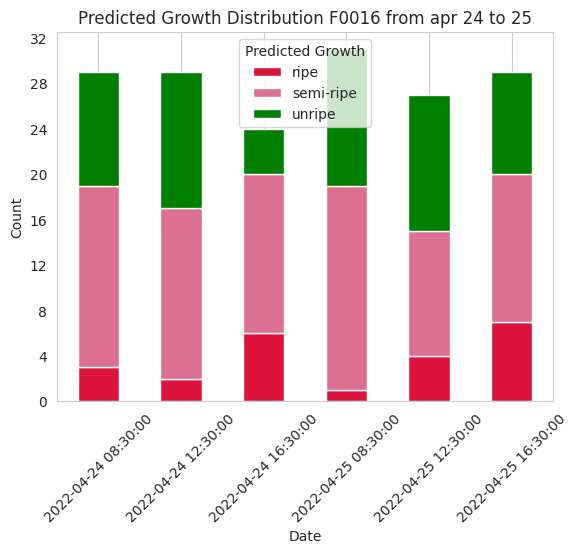

In [25]:
select_apr_1 = F0016_21_22_apr_data[(F0016_21_22_apr_data['shot_datetime'] >= '2022-04-03') & (F0016_21_22_apr_data['shot_datetime'] <= '2022-04-05')]
select_apr_2 = F0016_21_22_apr_data[(F0016_21_22_apr_data['shot_datetime'] >= '2022-04-10') & (F0016_21_22_apr_data['shot_datetime'] <= '2022-04-13')]
select_apr_3 = F0016_21_22_apr_data[(F0016_21_22_apr_data['shot_datetime'] >= '2022-04-17') & (F0016_21_22_apr_data['shot_datetime'] <= '2022-04-19')]
select_apr_4 = F0016_21_22_apr_data[(F0016_21_22_apr_data['shot_datetime'] >= '2022-04-24') & (F0016_21_22_apr_data['shot_datetime'] <= '2022-04-26')]

apr_1_counts = select_apr_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_2_counts = select_apr_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_3_counts = select_apr_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_4_counts = select_apr_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(apr_1_counts, 'Predicted Growth Distribution F0016 from apr 3 to 4'),
            (apr_2_counts, 'Predicted Growth Distribution F0016 from apr 10 to 11'),
            (apr_3_counts, 'Predicted Growth Distribution F0016 from apr 17 to 18'),
            (apr_4_counts, 'Predicted Growth Distribution F0016 from apr 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 21-22작기 5월 생산량 추이 

/tmp/ipykernel_21186/1632526682.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_may_data['shot_datetime'] = pd.to_datetime(F0016_21_22_may_data['shot_datetime'])


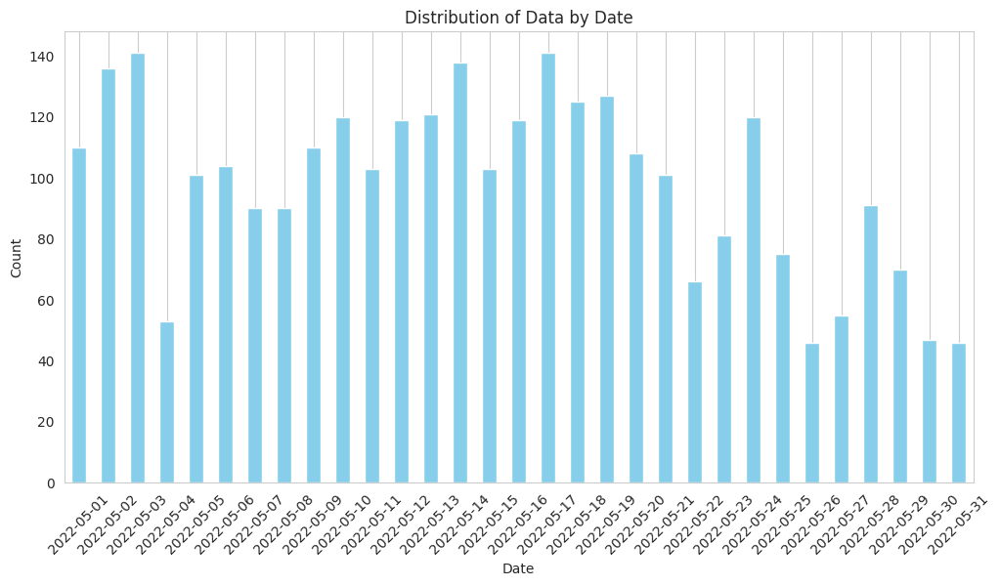

In [26]:
# F0016_21_22_may_data 생성
F0016_21_22_may_data = F0016_21_22[F0016_21_22['측정월'] == 5]
F0016_21_22_may_data['shot_datetime'] = pd.to_datetime(F0016_21_22_may_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_may_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

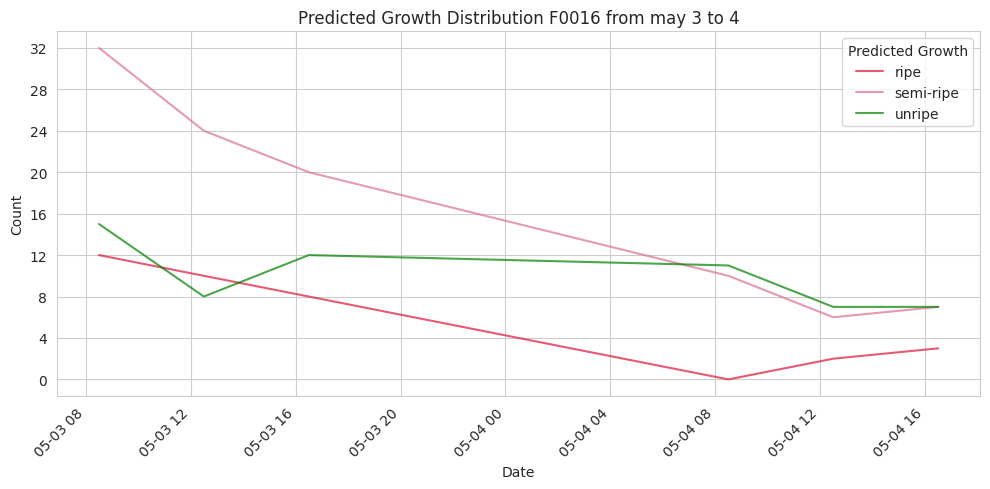

<Figure size 1200x600 with 0 Axes>

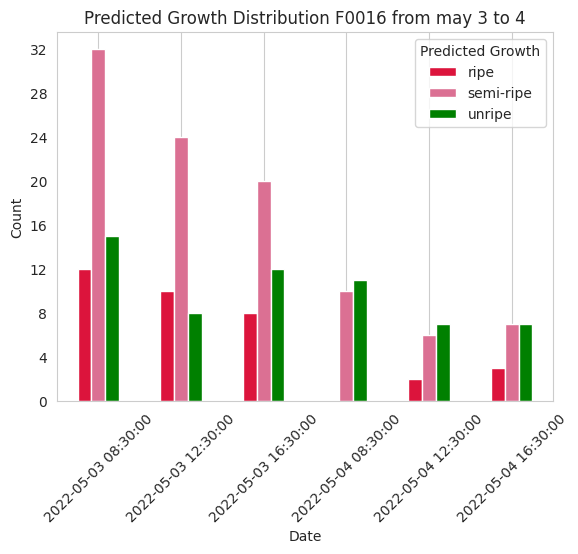

<Figure size 1200x600 with 0 Axes>

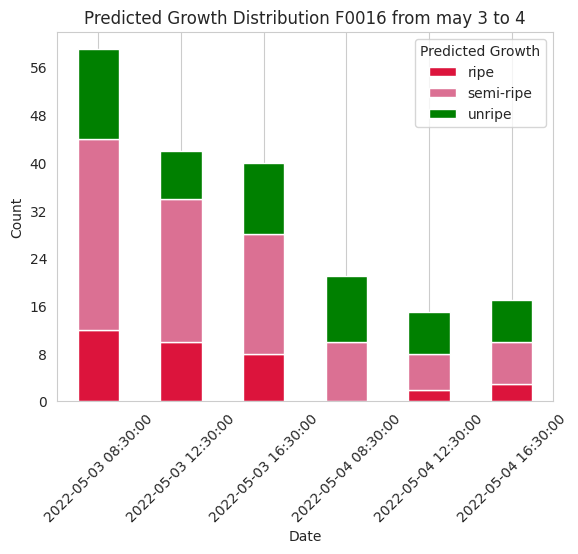

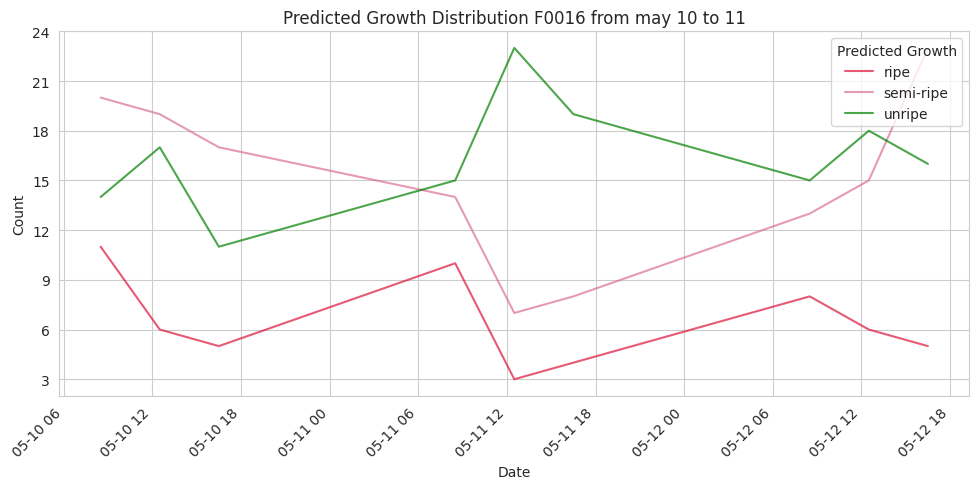

<Figure size 1200x600 with 0 Axes>

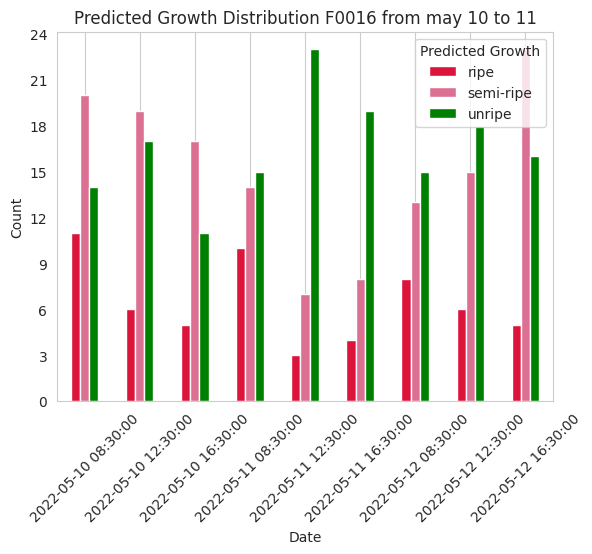

<Figure size 1200x600 with 0 Axes>

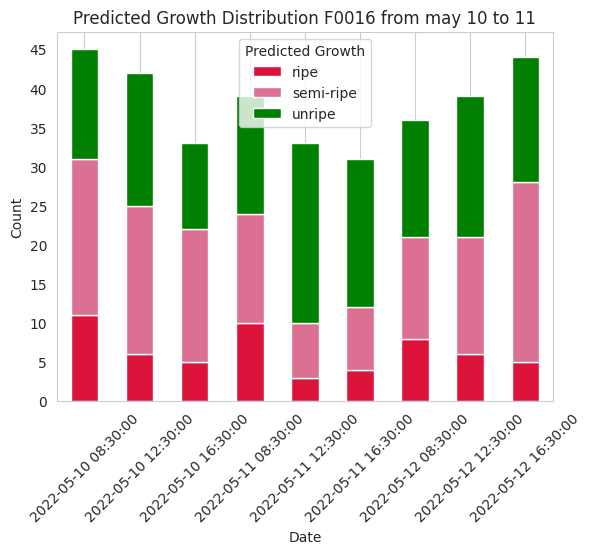

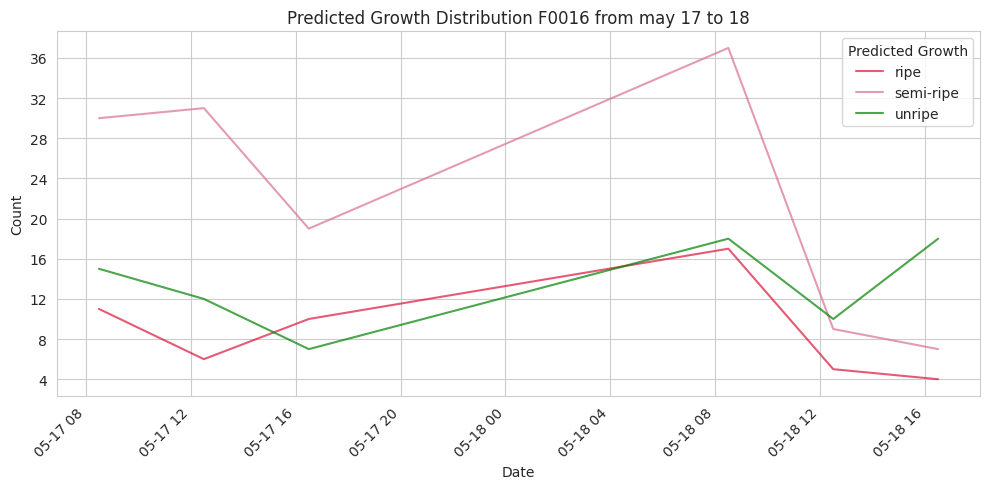

<Figure size 1200x600 with 0 Axes>

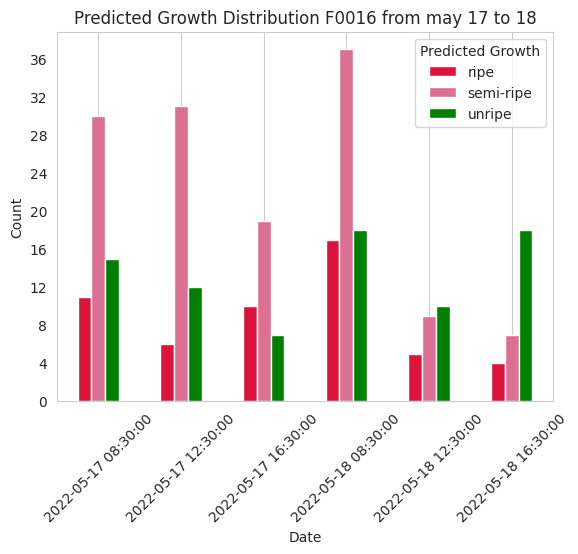

<Figure size 1200x600 with 0 Axes>

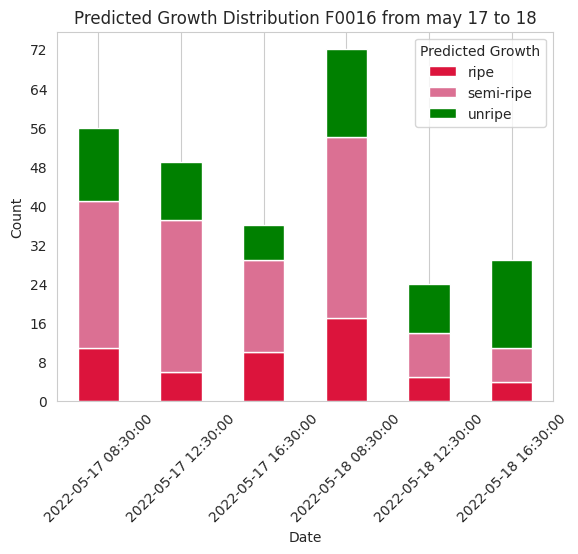

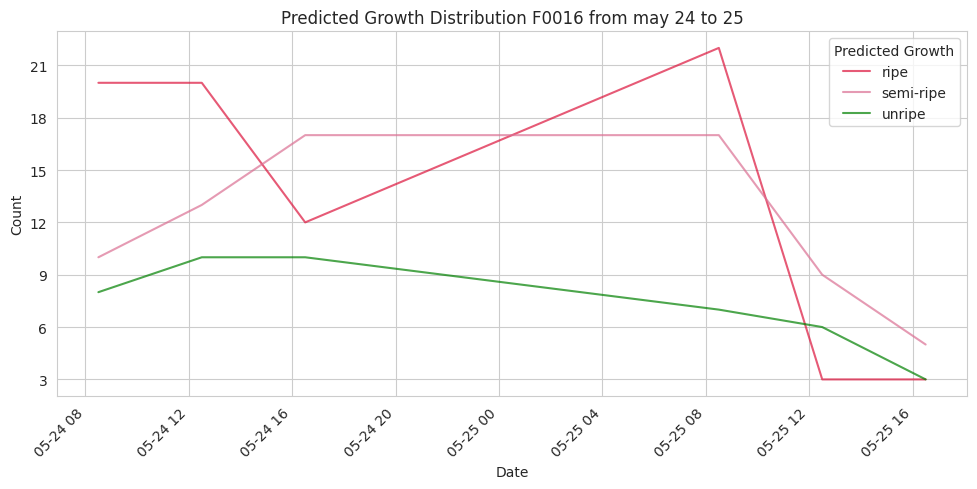

<Figure size 1200x600 with 0 Axes>

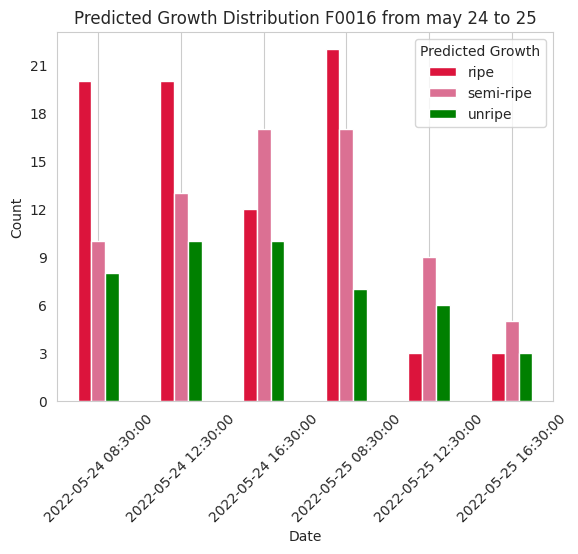

<Figure size 1200x600 with 0 Axes>

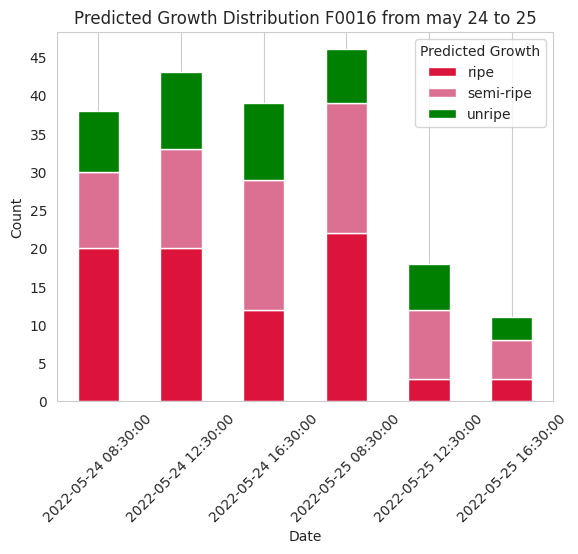

In [27]:
select_may_1 = F0016_21_22_may_data[(F0016_21_22_may_data['shot_datetime'] >= '2022-05-03') & (F0016_21_22_may_data['shot_datetime'] <= '2022-05-05')]
select_may_2 = F0016_21_22_may_data[(F0016_21_22_may_data['shot_datetime'] >= '2022-05-10') & (F0016_21_22_may_data['shot_datetime'] <= '2022-05-13')]
select_may_3 = F0016_21_22_may_data[(F0016_21_22_may_data['shot_datetime'] >= '2022-05-17') & (F0016_21_22_may_data['shot_datetime'] <= '2022-05-19')]
select_may_4 = F0016_21_22_may_data[(F0016_21_22_may_data['shot_datetime'] >= '2022-05-24') & (F0016_21_22_may_data['shot_datetime'] <= '2022-05-26')]

may_1_counts = select_may_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_2_counts = select_may_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_3_counts = select_may_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_4_counts = select_may_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(may_1_counts, 'Predicted Growth Distribution F0016 from may 3 to 4'),
            (may_2_counts, 'Predicted Growth Distribution F0016 from may 10 to 11'),
            (may_3_counts, 'Predicted Growth Distribution F0016 from may 17 to 18'),
            (may_4_counts, 'Predicted Growth Distribution F0016 from may 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 21-22작기 6월 생산량 추이

/tmp/ipykernel_21186/3063505348.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_21_22_jun_data['shot_datetime'] = pd.to_datetime(F0016_21_22_jun_data['shot_datetime'])


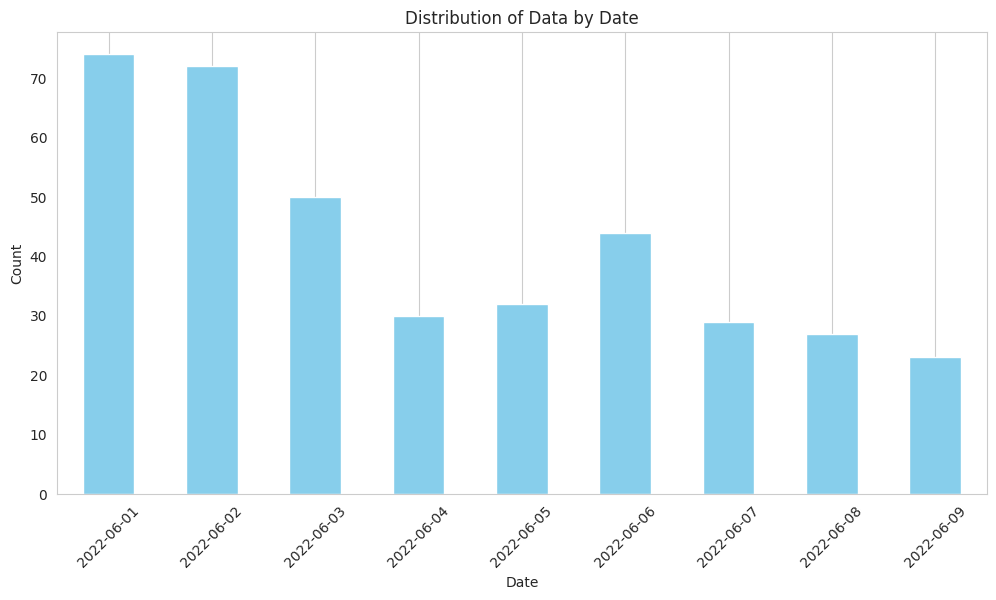

In [28]:
# F0016_21_22_jun_data 생성
F0016_21_22_jun_data = F0016_21_22[F0016_21_22['측정월'] == 6]
F0016_21_22_jun_data['shot_datetime'] = pd.to_datetime(F0016_21_22_jun_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_21_22_jun_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

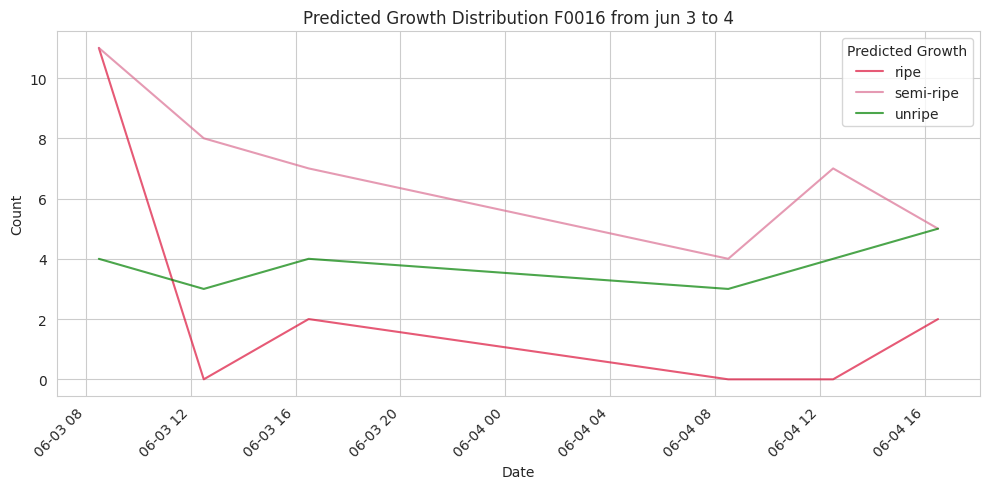

<Figure size 1200x600 with 0 Axes>

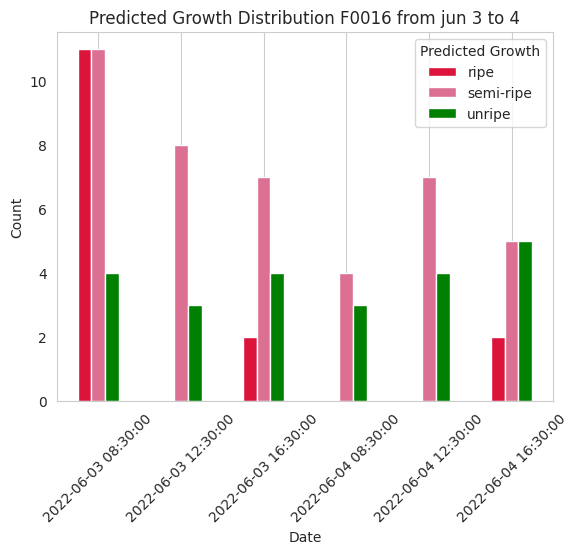

<Figure size 1200x600 with 0 Axes>

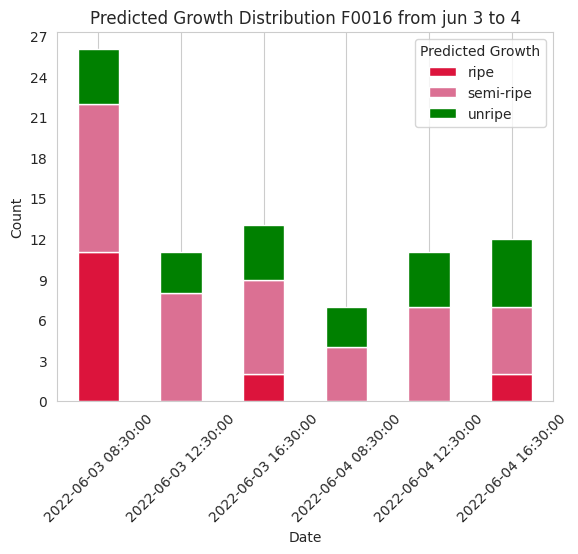

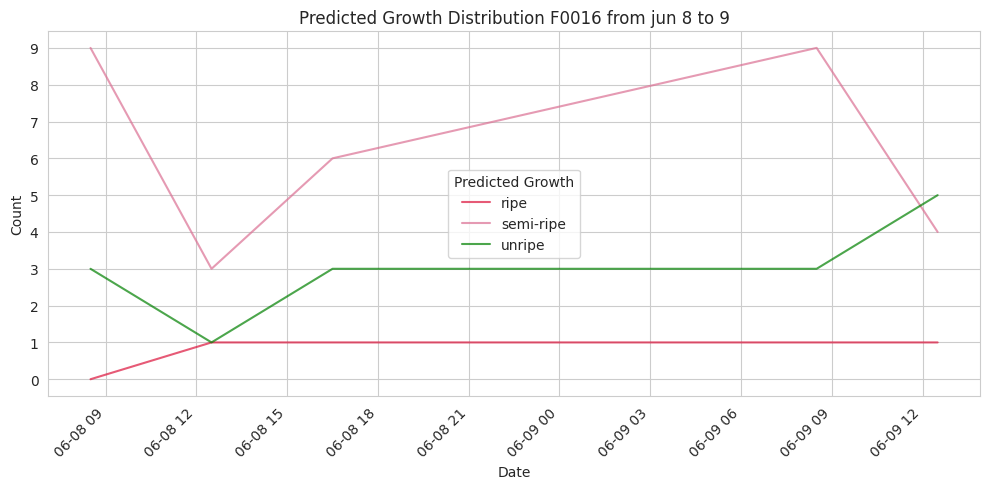

<Figure size 1200x600 with 0 Axes>

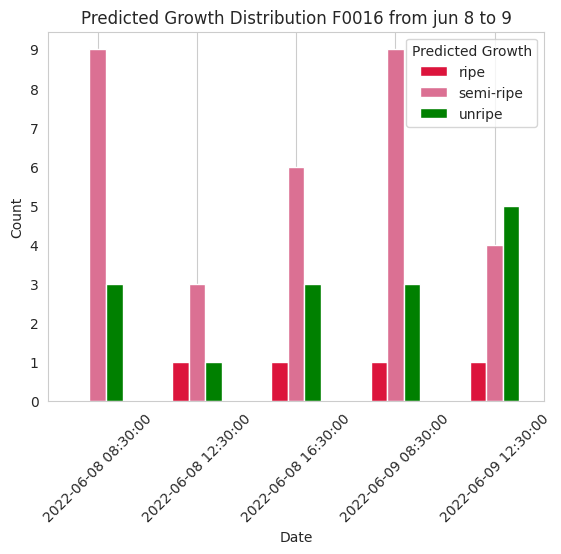

<Figure size 1200x600 with 0 Axes>

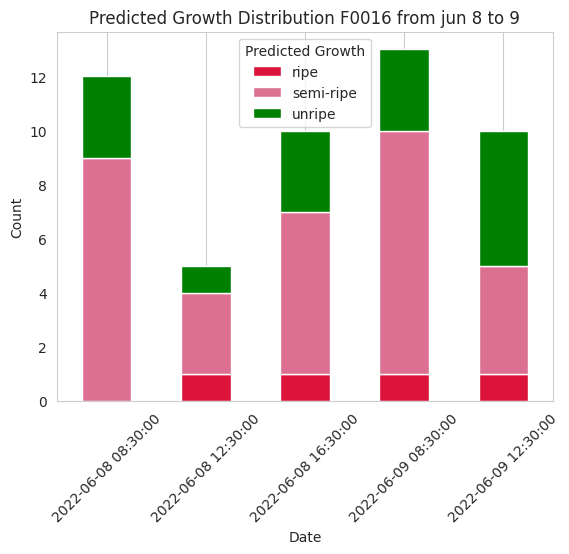

In [29]:
select_jun_1 = F0016_21_22_jun_data[(F0016_21_22_jun_data['shot_datetime'] >= '2022-06-03') & (F0016_21_22_jun_data['shot_datetime'] <= '2022-06-05')]
select_jun_2 = F0016_21_22_jun_data[(F0016_21_22_jun_data['shot_datetime'] >= '2022-06-08') & (F0016_21_22_jun_data['shot_datetime'] <= '2022-06-10')]

jun_1_counts = select_jun_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jun_2_counts = select_jun_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(jun_1_counts, 'Predicted Growth Distribution F0016 from jun 3 to 4'),
            (jun_2_counts, 'Predicted Growth Distribution F0016 from jun 8 to 9'),]


# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


### F0016 22-23작기

In [30]:
#F0016 22-23작기 확인
F0016_22_23 = copy_data[(copy_data['farm_code'] == 'F0016') & (copy_data['check_datetime'] >= period_22_23[0]) & (copy_data['check_datetime']<= period_22_23[1])]
#작기 안에서 월별로 class 분포 확인
F0016_22_23_monthly = F0016_22_23.groupby([F0016_22_23['check_datetime'].dt.year.rename('year'), F0016_22_23['check_datetime'].dt.month, 'pred_growth']).size().reset_index(name='count')
F0016_22_23_monthly['check_datetime'] = F0016_22_23_monthly['year'].astype(str) + '-' + F0016_22_23_monthly['check_datetime'].astype(str)
F0016_22_23_monthly.drop(columns=['year'], inplace=True)
F0016_22_23_monthly

,check_datetime,pred_growth,count
0,2022-8,unripe,7
1,2022-9,unripe,69
2,2022-10,ripe,3
3,2022-10,semi-ripe,33
4,2022-10,unripe,60
5,2022-11,ripe,100
6,2022-11,semi-ripe,407
7,2022-11,unripe,464
8,2022-12,ripe,16
9,2022-12,semi-ripe,19


<function matplotlib.pyplot.show(close=None, block=None)>

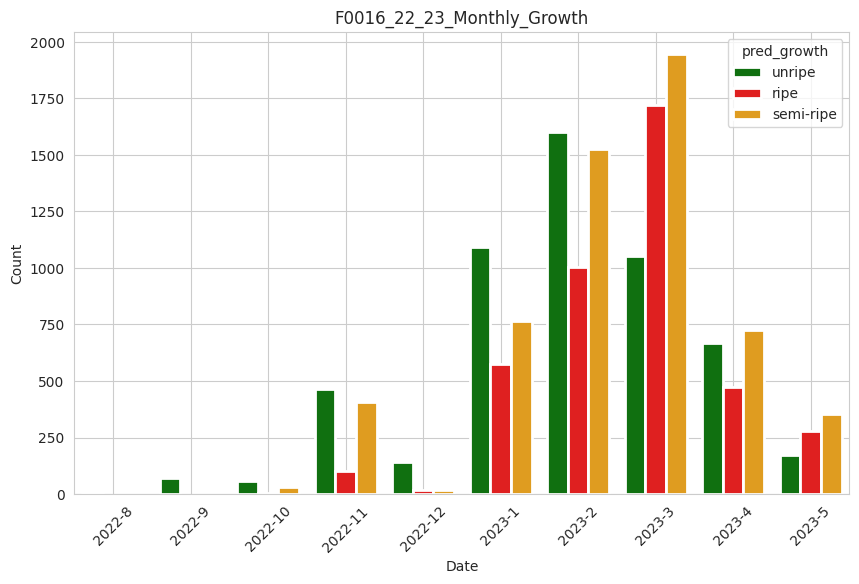

In [31]:
#graph로 확인
sns.set_style("whitegrid")

palette = {'unripe': 'green', 'semi-ripe': 'orange', 'ripe': 'red'}

plt.figure(figsize=(10, 6))
sns.barplot(data = F0016_22_23_monthly, x = 'check_datetime', y = 'count', hue = 'pred_growth', palette=palette ,  linewidth=2 )
plt.title('F0016_22_23_Monthly_Growth')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend(title='pred_growth')
plt.grid(True)
plt.xticks(rotation=45)
plt.show

#### F0016 22-23작기 8월 생산량 추이

/tmp/ipykernel_21186/4242909272.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_aug_data['shot_datetime'] = pd.to_datetime(F0016_22_23_aug_data['shot_datetime'])


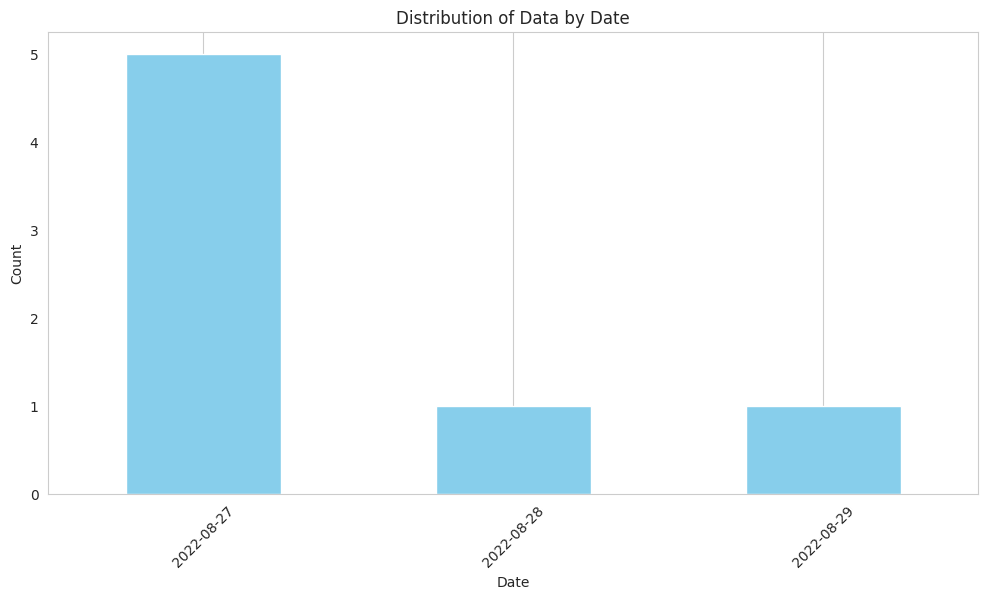

In [32]:
# F0016_22_23_aug_data 생성
F0016_22_23_aug_data = F0016_22_23[F0016_22_23['측정월'] == 8]
F0016_22_23_aug_data['shot_datetime'] = pd.to_datetime(F0016_22_23_aug_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_aug_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

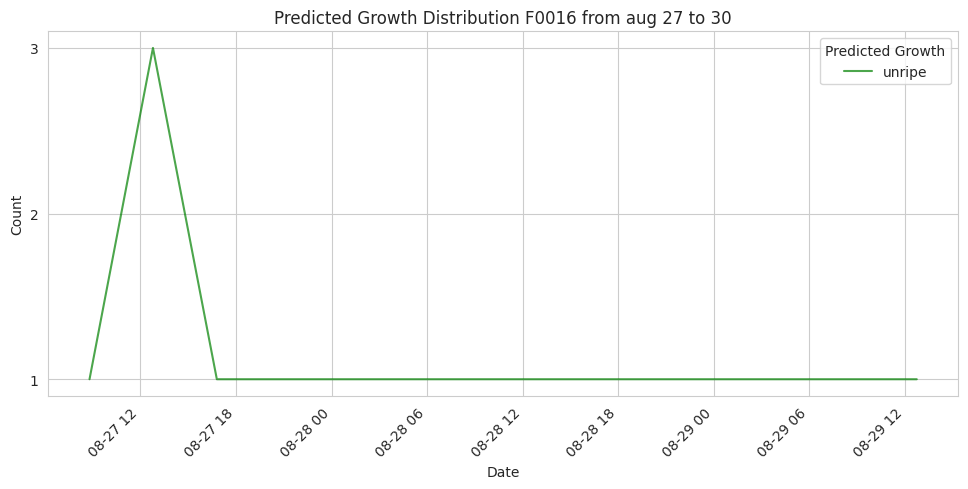

<Figure size 1200x600 with 0 Axes>

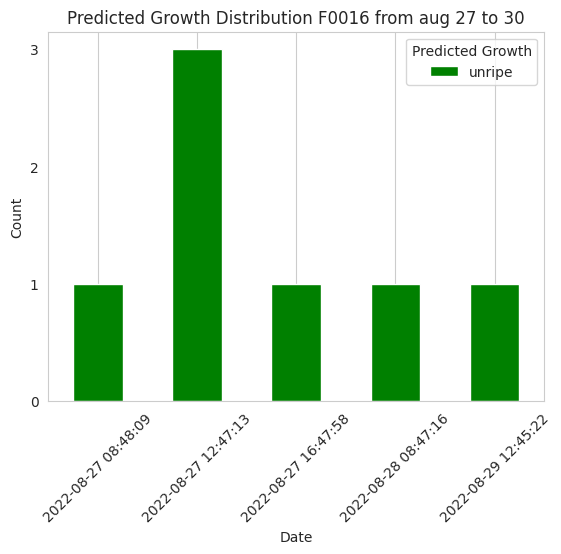

<Figure size 1200x600 with 0 Axes>

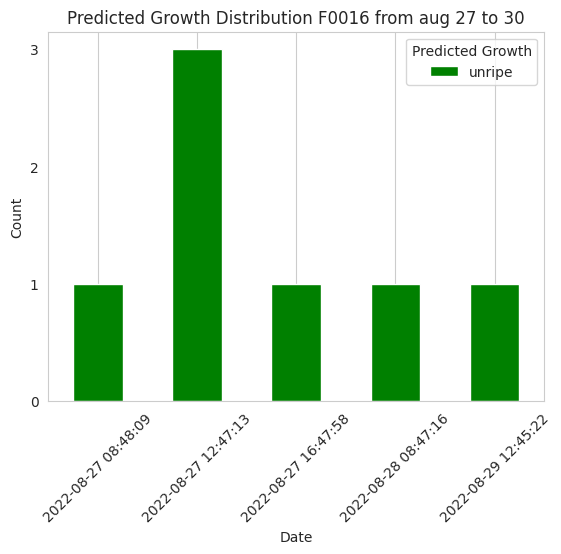

In [33]:
select_aug_1 = F0016_22_23_aug_data[(F0016_22_23_aug_data['shot_datetime'] >= '2022-08-27') & (F0016_22_23_aug_data['shot_datetime'] <= '2022-08-30')]

aug_1_counts = select_aug_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)


# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(aug_1_counts, 'Predicted Growth Distribution F0016 from aug 27 to 30')]


# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 22-23작기 9월 생산량 추이 

/tmp/ipykernel_21186/4132260863.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_sep_data['shot_datetime'] = pd.to_datetime(F0016_22_23_sep_data['shot_datetime'])


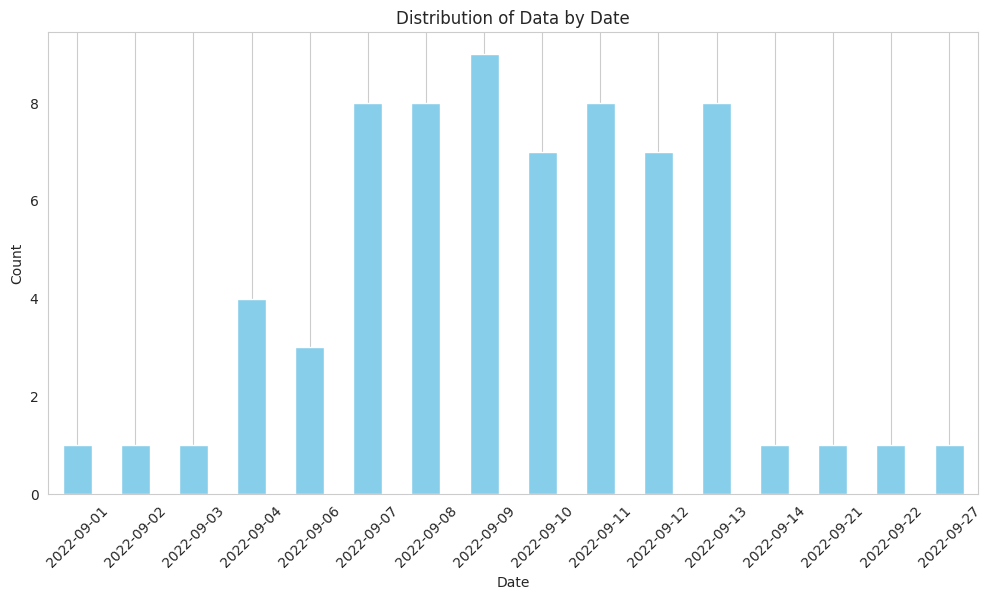

In [34]:
# F0016_22_23_sep_data 생성
F0016_22_23_sep_data = F0016_22_23[F0016_22_23['측정월'] == 9]
F0016_22_23_sep_data['shot_datetime'] = pd.to_datetime(F0016_22_23_sep_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_sep_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

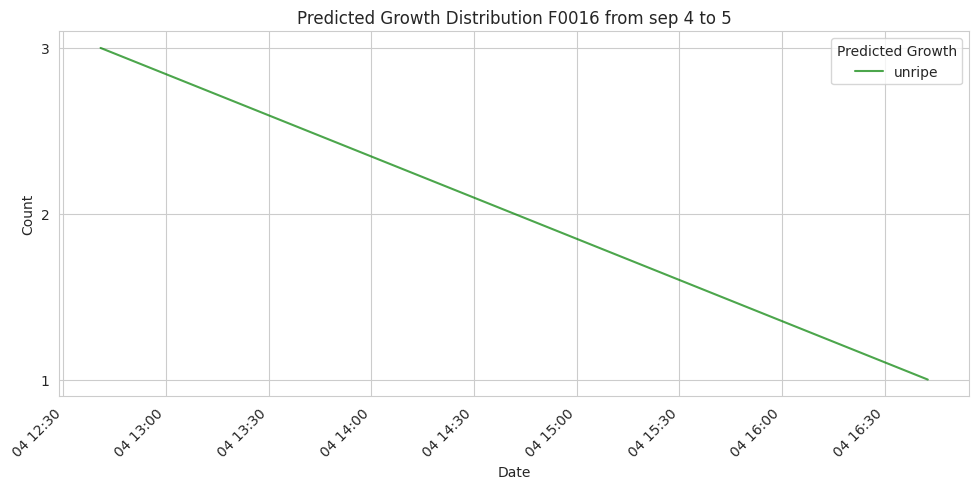

<Figure size 1200x600 with 0 Axes>

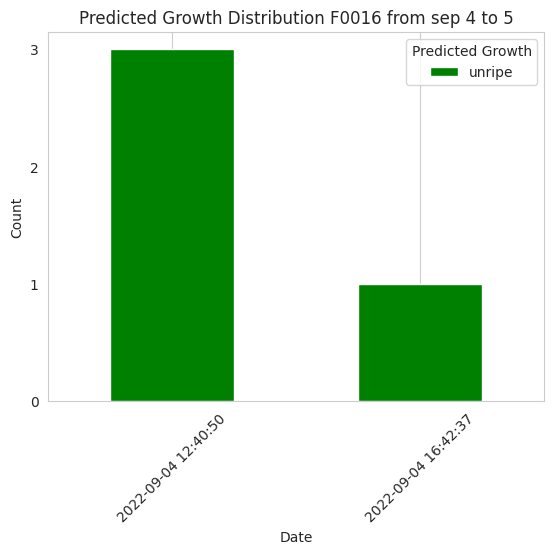

<Figure size 1200x600 with 0 Axes>

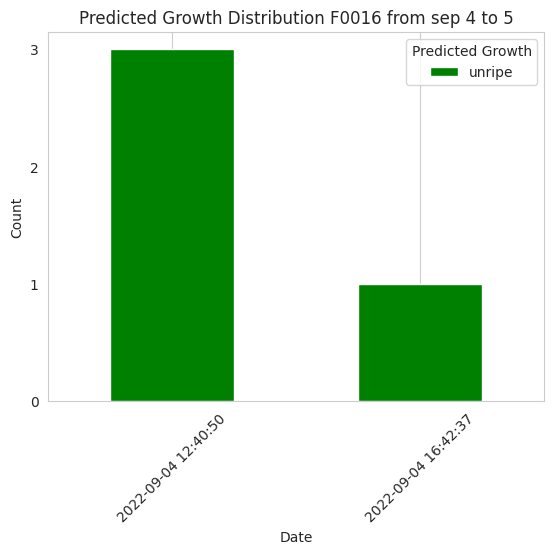

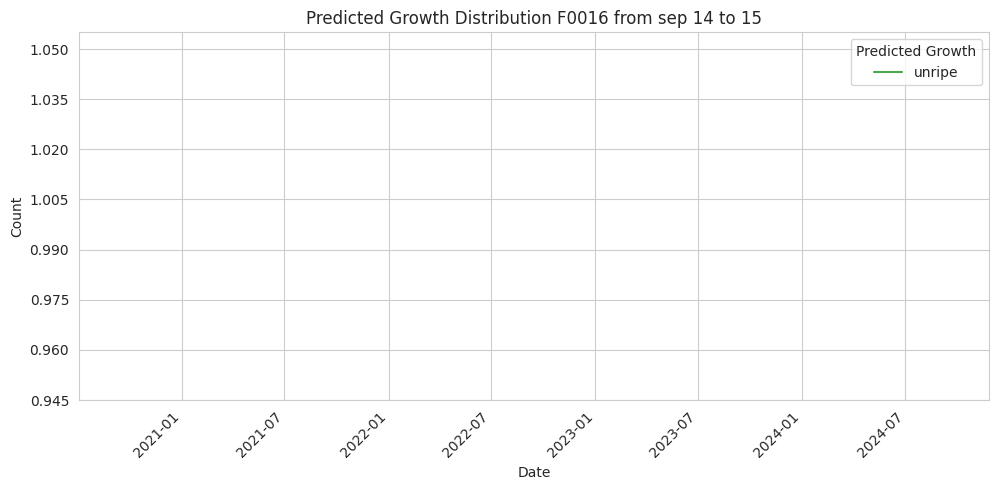

<Figure size 1200x600 with 0 Axes>

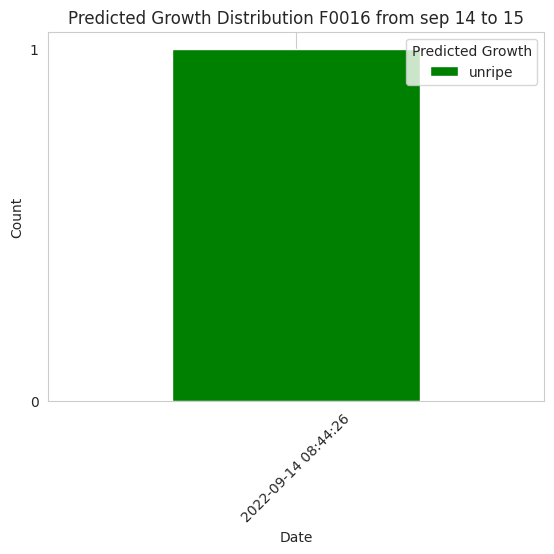

<Figure size 1200x600 with 0 Axes>

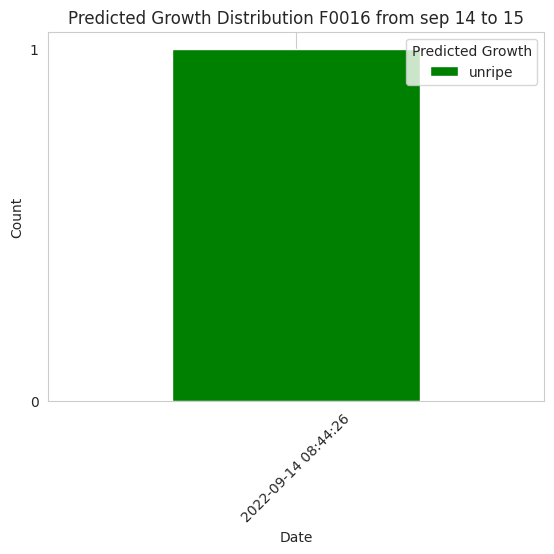

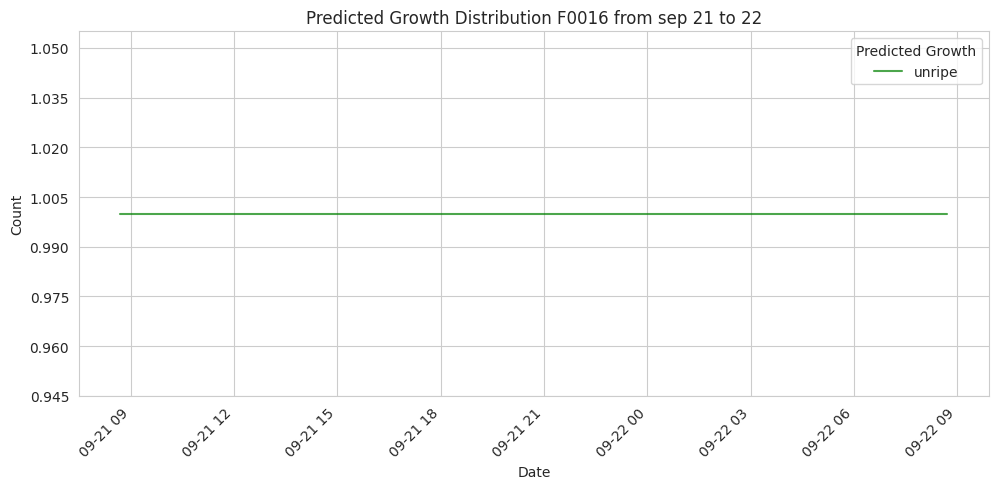

<Figure size 1200x600 with 0 Axes>

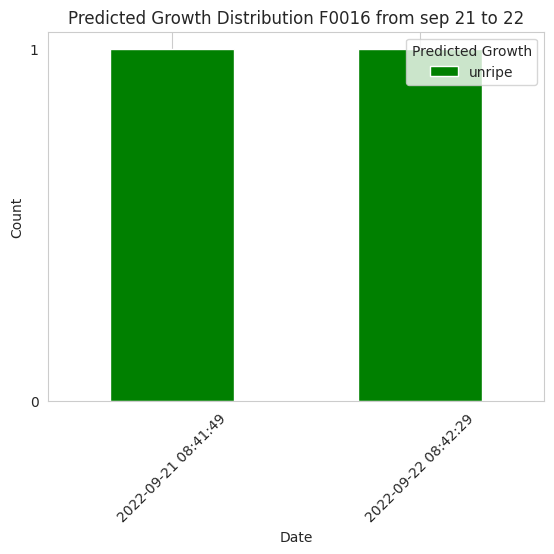

<Figure size 1200x600 with 0 Axes>

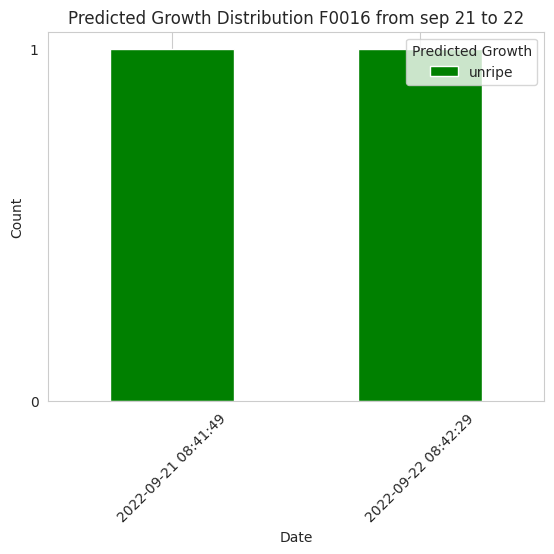

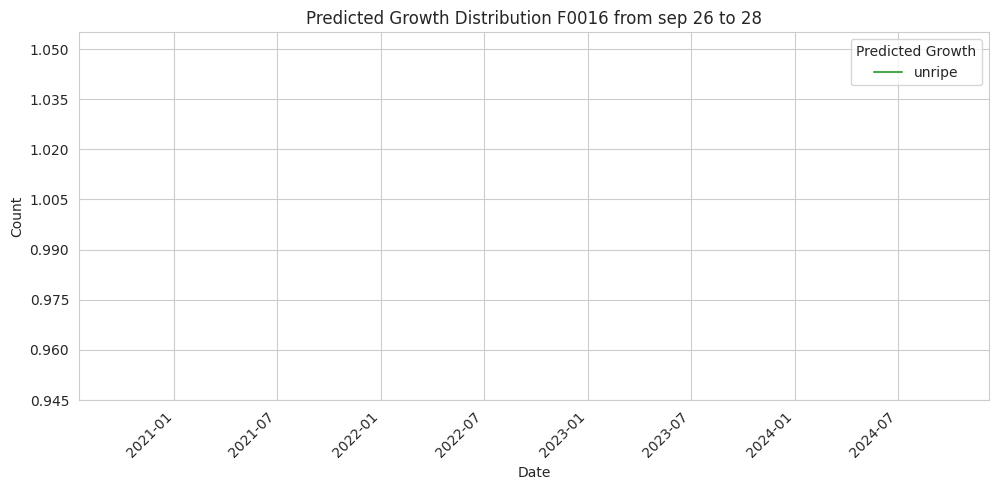

<Figure size 1200x600 with 0 Axes>

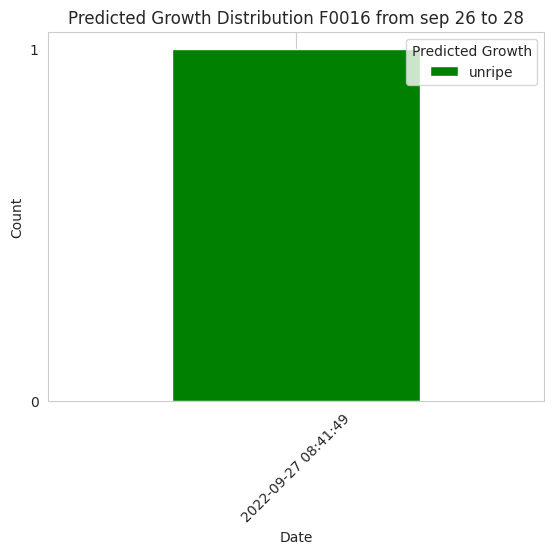

<Figure size 1200x600 with 0 Axes>

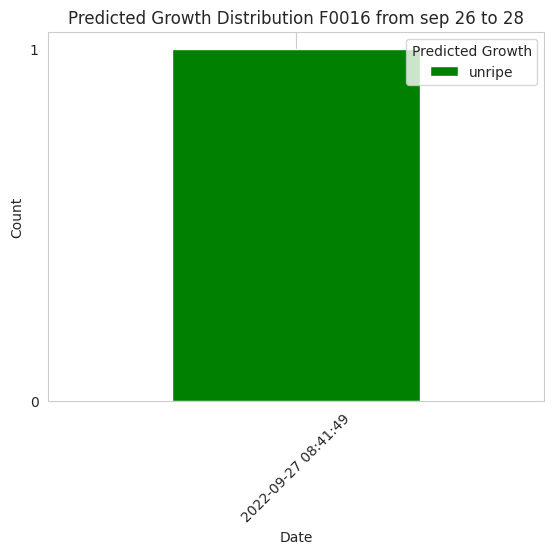

In [35]:
#주차별 이틀치 데이터 정의
select_22_23_sep_1 = F0016_22_23_sep_data[(F0016_22_23_sep_data['shot_datetime'] >= '2022-09-04') & (F0016_22_23_sep_data['shot_datetime'] <= '2022-09-06')]
select_22_23_sep_2 = F0016_22_23_sep_data[(F0016_22_23_sep_data['shot_datetime'] >= '2022-09-14') & (F0016_22_23_sep_data['shot_datetime'] <= '2022-09-16')]
select_22_23_sep_3 = F0016_22_23_sep_data[(F0016_22_23_sep_data['shot_datetime'] >= '2022-09-21') & (F0016_22_23_sep_data['shot_datetime'] <= '2022-09-23')]
select_22_23_sep_4 = F0016_22_23_sep_data[(F0016_22_23_sep_data['shot_datetime'] >= '2022-09-26') & (F0016_22_23_sep_data['shot_datetime'] <= '2022-09-28')]

sep_22_23_1_counts = select_22_23_sep_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
sep_22_23_2_counts = select_22_23_sep_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
sep_22_23_3_counts = select_22_23_sep_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
sep_22_23_4_counts = select_22_23_sep_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(sep_22_23_1_counts, 'Predicted Growth Distribution F0016 from sep 4 to 5'),
            (sep_22_23_2_counts, 'Predicted Growth Distribution F0016 from sep 14 to 15'),
            (sep_22_23_3_counts, 'Predicted Growth Distribution F0016 from sep 21 to 22'),
            (sep_22_23_4_counts, 'Predicted Growth Distribution F0016 from sep 26 to 28')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 22-23작기 10월 생산량 추이

/tmp/ipykernel_21186/1401927267.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_oct_data['shot_datetime'] = pd.to_datetime(F0016_22_23_oct_data['shot_datetime'])


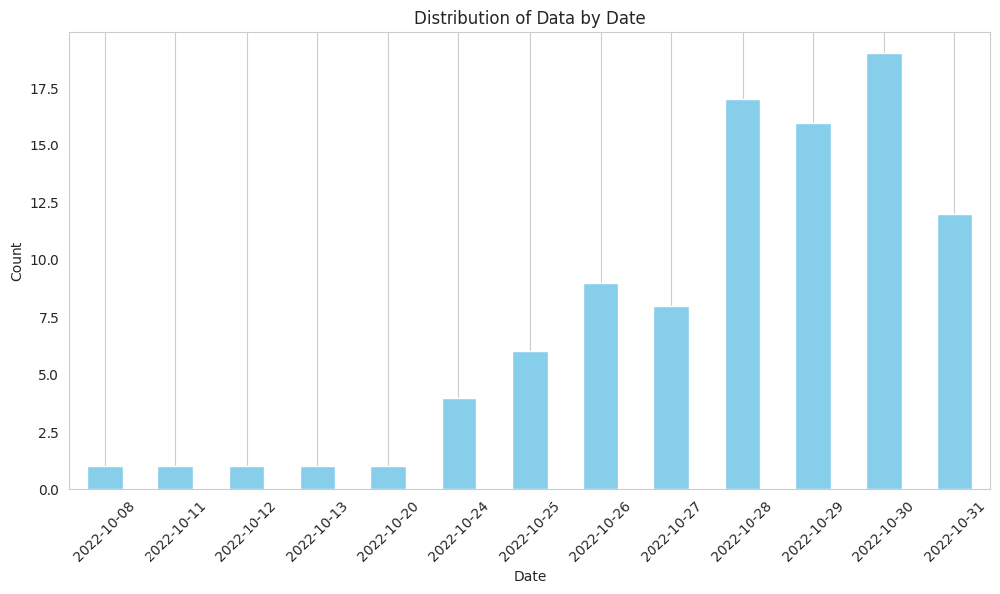

In [36]:
# F0016_22_23_oct_data 생성
F0016_22_23_oct_data = F0016_22_23[F0016_22_23['측정월'] == 10]
F0016_22_23_oct_data['shot_datetime'] = pd.to_datetime(F0016_22_23_oct_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_oct_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

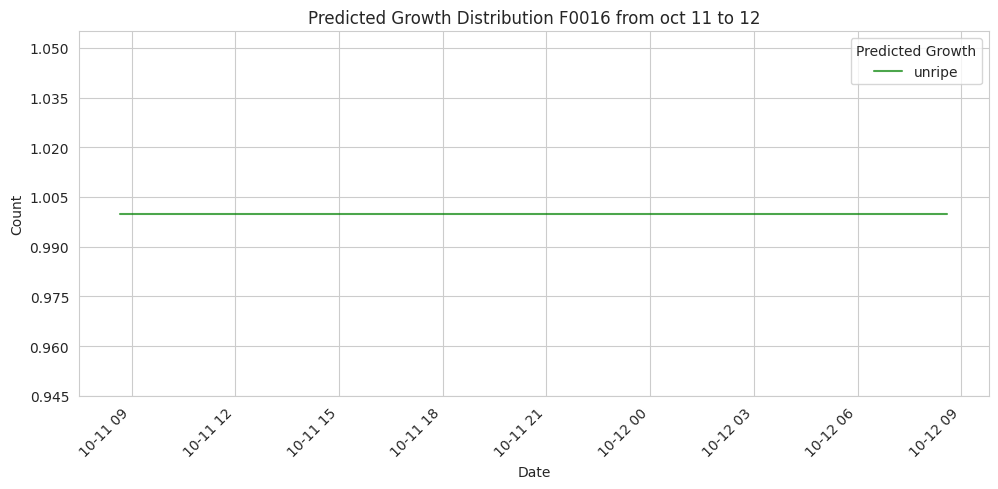

<Figure size 1200x600 with 0 Axes>

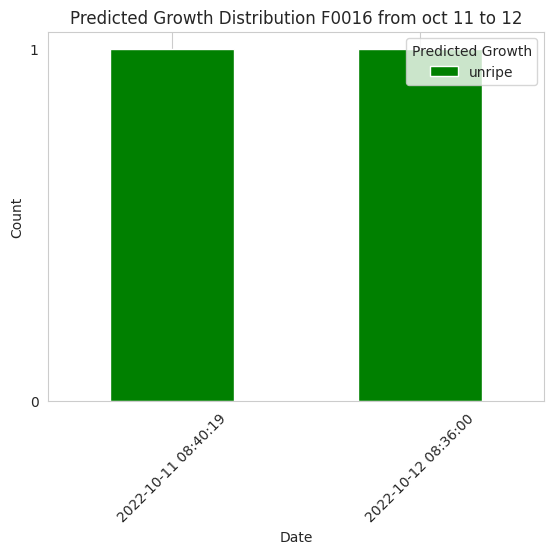

<Figure size 1200x600 with 0 Axes>

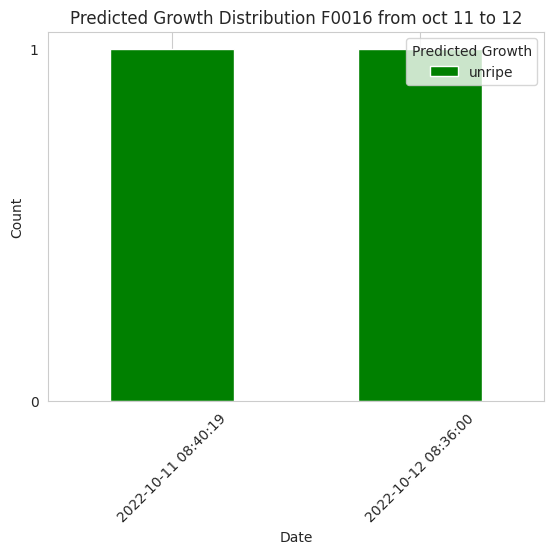

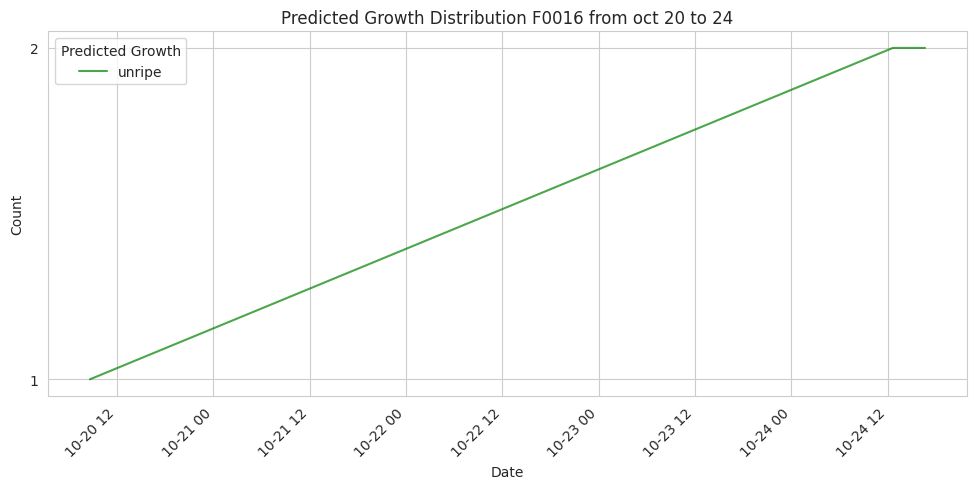

<Figure size 1200x600 with 0 Axes>

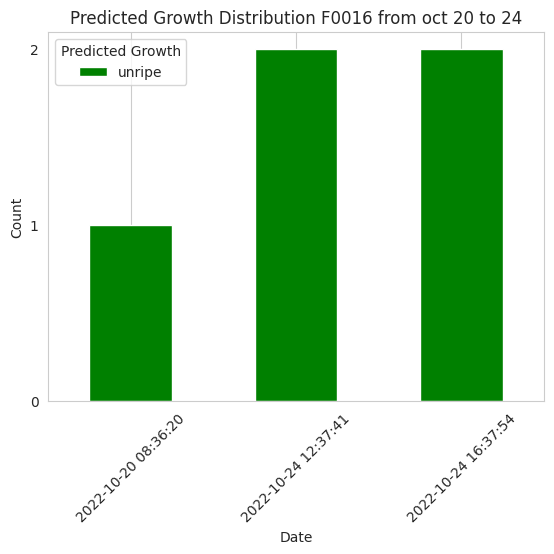

<Figure size 1200x600 with 0 Axes>

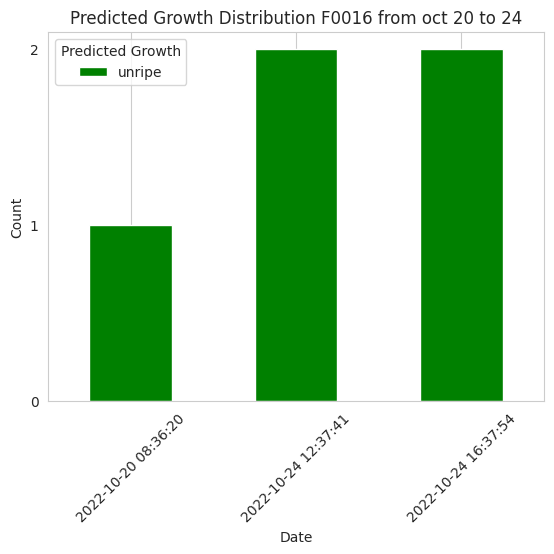

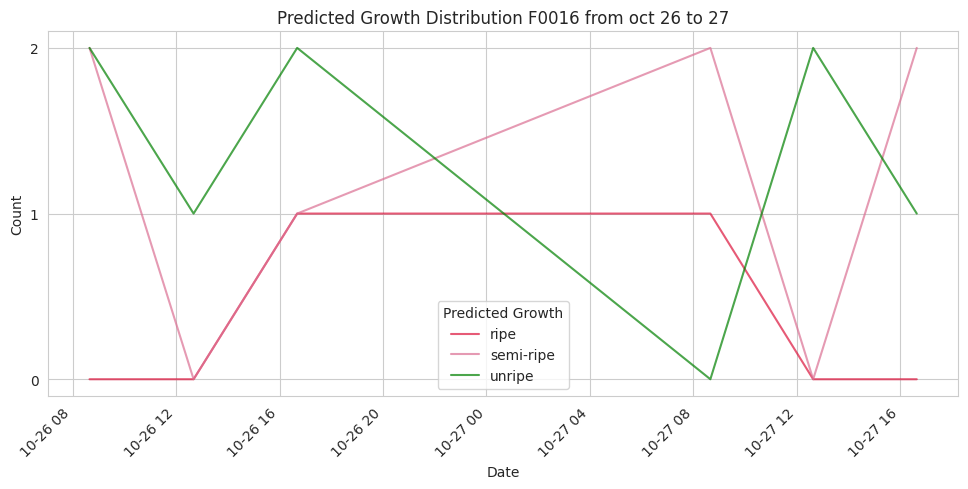

<Figure size 1200x600 with 0 Axes>

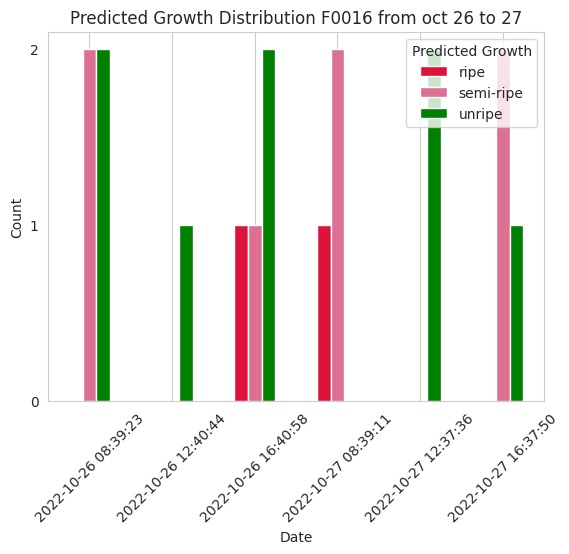

<Figure size 1200x600 with 0 Axes>

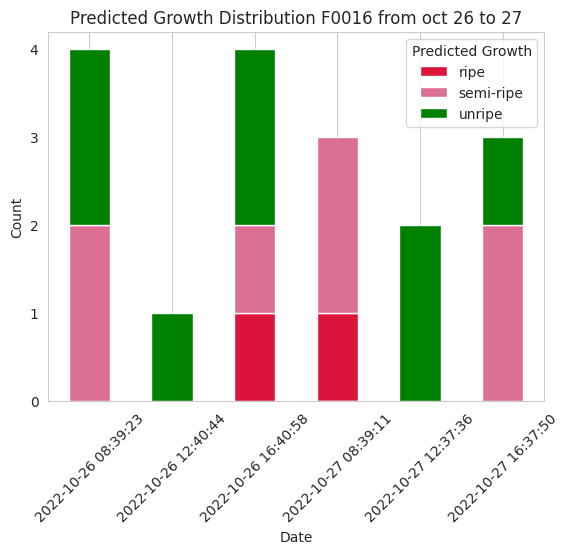

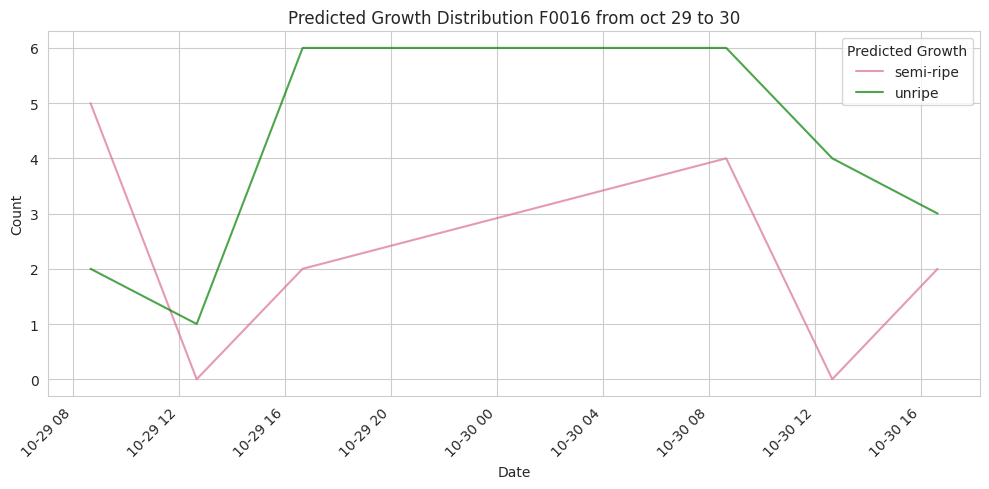

<Figure size 1200x600 with 0 Axes>

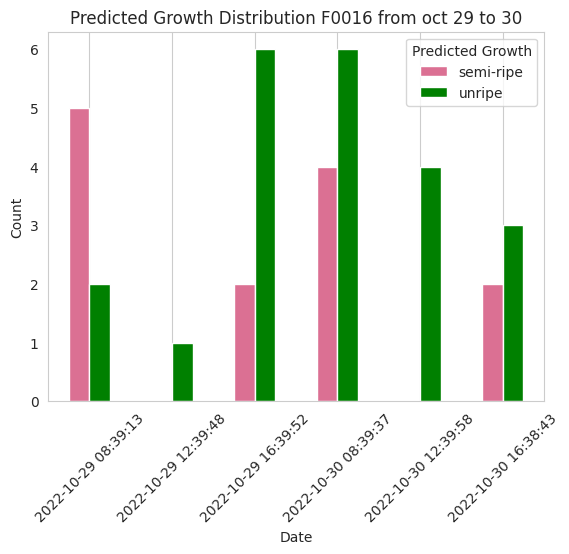

<Figure size 1200x600 with 0 Axes>

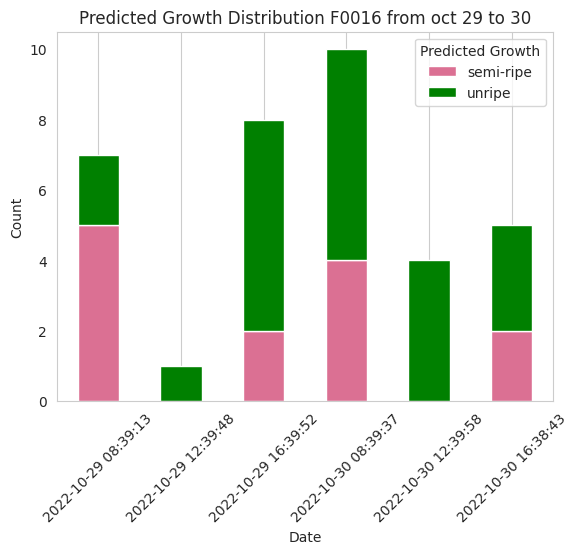

In [37]:
select_22_23_oct_1 = F0016_22_23_oct_data[(F0016_22_23_oct_data['shot_datetime'] >= '2022-10-11') & (F0016_22_23_oct_data['shot_datetime'] <= '2022-10-13')]
select_22_23_oct_2 = F0016_22_23_oct_data[(F0016_22_23_oct_data['shot_datetime'] >= '2022-10-20') & (F0016_22_23_oct_data['shot_datetime'] <= '2022-10-25')]
select_22_23_oct_3 = F0016_22_23_oct_data[(F0016_22_23_oct_data['shot_datetime'] >= '2022-10-26') & (F0016_22_23_oct_data['shot_datetime'] <= '2022-10-28')]
select_22_23_oct_4 = F0016_22_23_oct_data[(F0016_22_23_oct_data['shot_datetime'] >= '2022-10-29') & (F0016_22_23_oct_data['shot_datetime'] <= '2022-10-31')]

oct_22_23_1_counts = select_22_23_oct_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_22_23_2_counts = select_22_23_oct_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_22_23_3_counts = select_22_23_oct_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_22_23_4_counts = select_22_23_oct_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의는 생략합니다.
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(oct_22_23_1_counts, 'Predicted Growth Distribution F0016 from oct 11 to 12'),
            (oct_22_23_2_counts, 'Predicted Growth Distribution F0016 from oct 20 to 24'),
            (oct_22_23_3_counts, 'Predicted Growth Distribution F0016 from oct 26 to 27'),
            (oct_22_23_4_counts, 'Predicted Growth Distribution F0016 from oct 29 to 30')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 22-23작기 11월 생산량 추이

/tmp/ipykernel_21186/300638241.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_nov_data['shot_datetime'] = pd.to_datetime(F0016_22_23_nov_data['shot_datetime'])


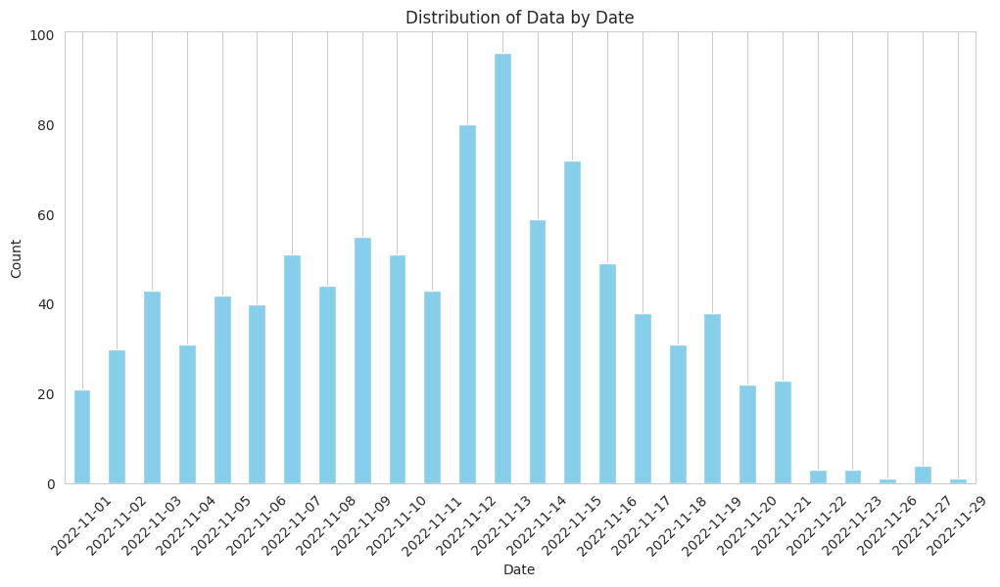

In [38]:
# F0016_22_23_nov_data 생성
F0016_22_23_nov_data = F0016_22_23[F0016_22_23['측정월'] == 11]
F0016_22_23_nov_data['shot_datetime'] = pd.to_datetime(F0016_22_23_nov_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_nov_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

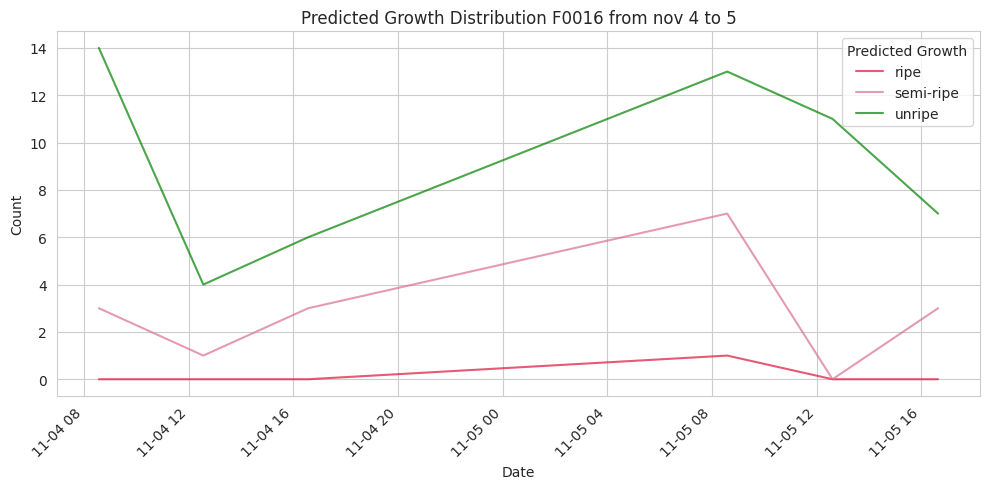

<Figure size 1200x600 with 0 Axes>

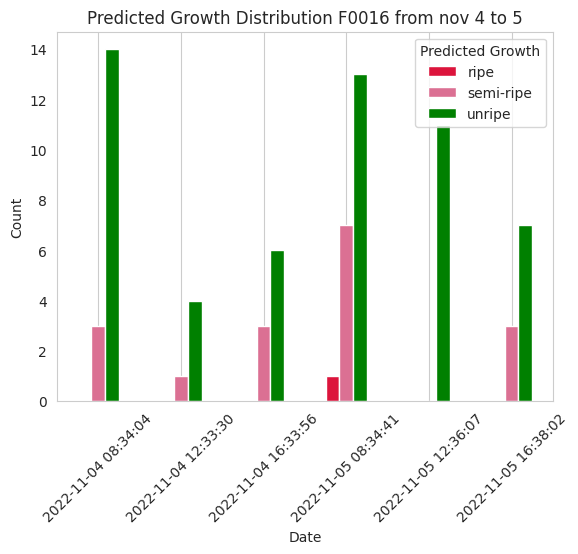

<Figure size 1200x600 with 0 Axes>

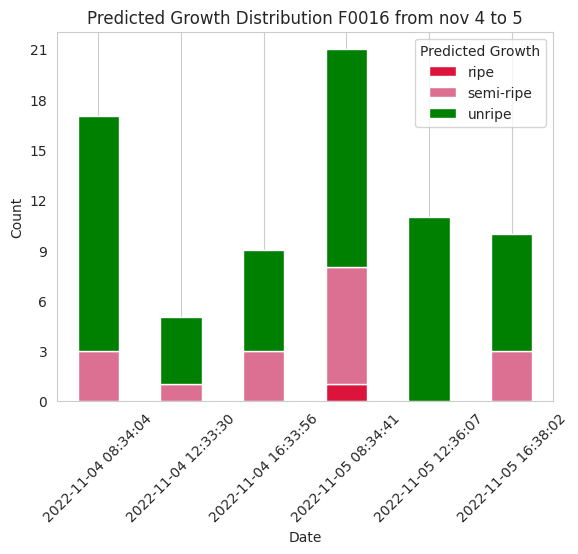

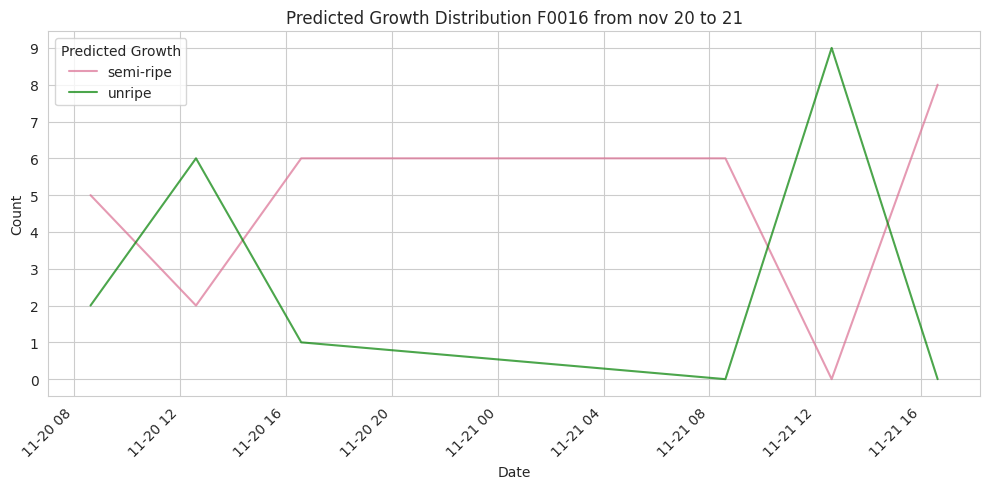

<Figure size 1200x600 with 0 Axes>

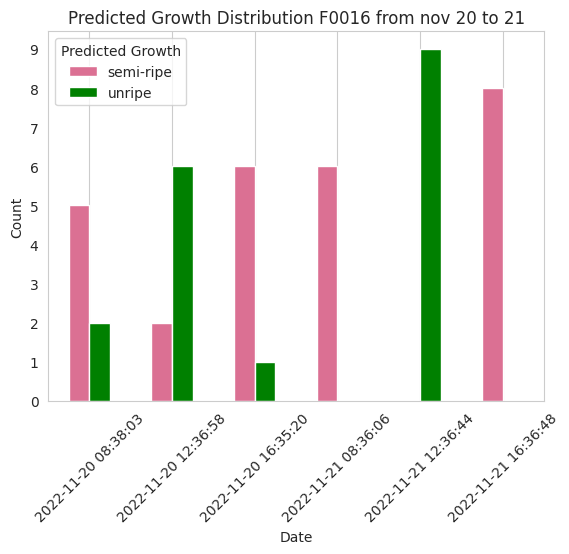

<Figure size 1200x600 with 0 Axes>

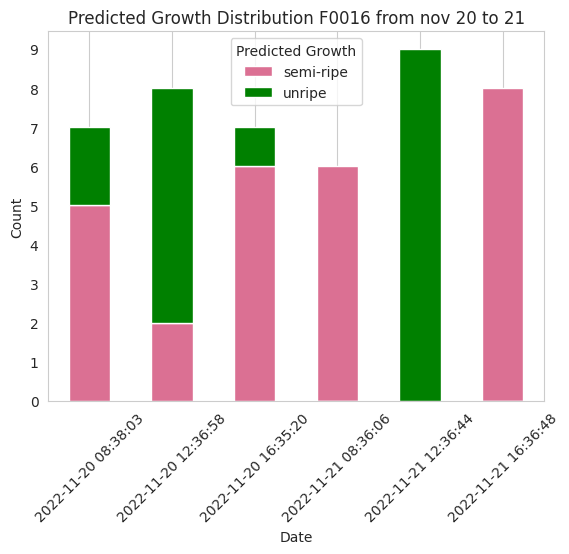

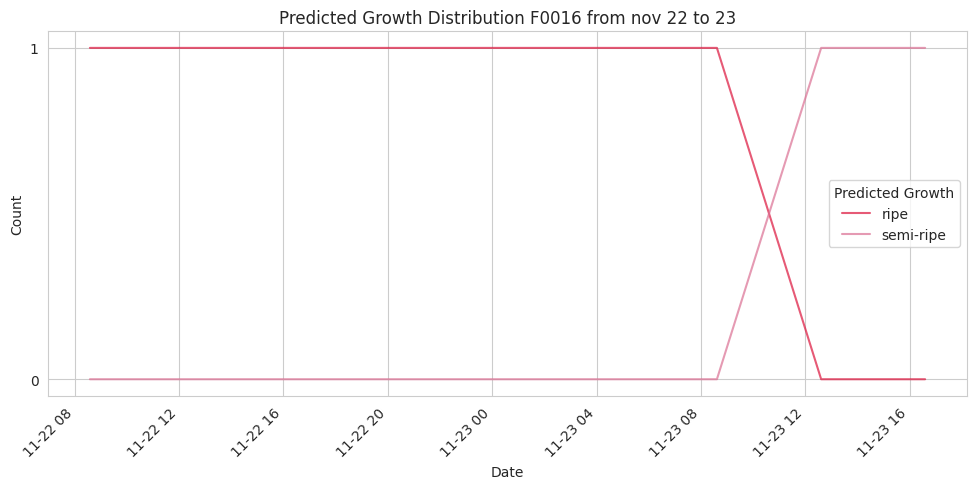

<Figure size 1200x600 with 0 Axes>

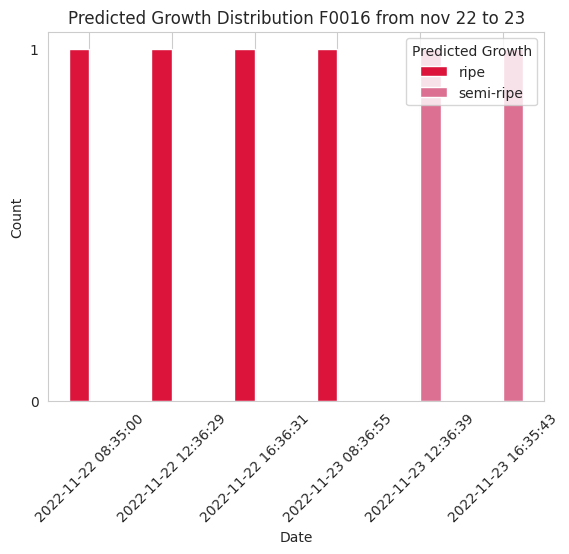

<Figure size 1200x600 with 0 Axes>

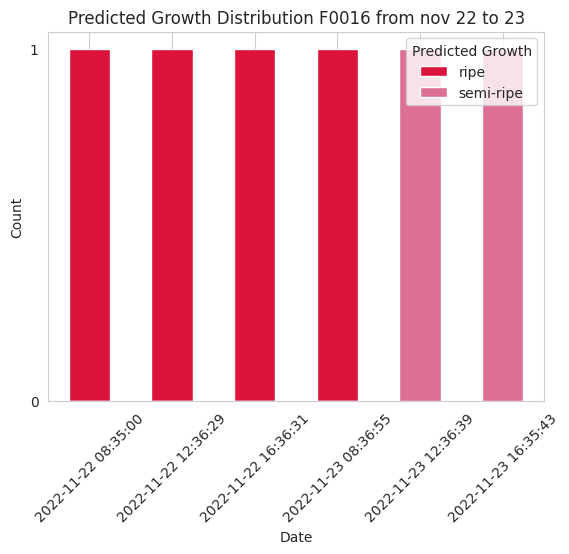

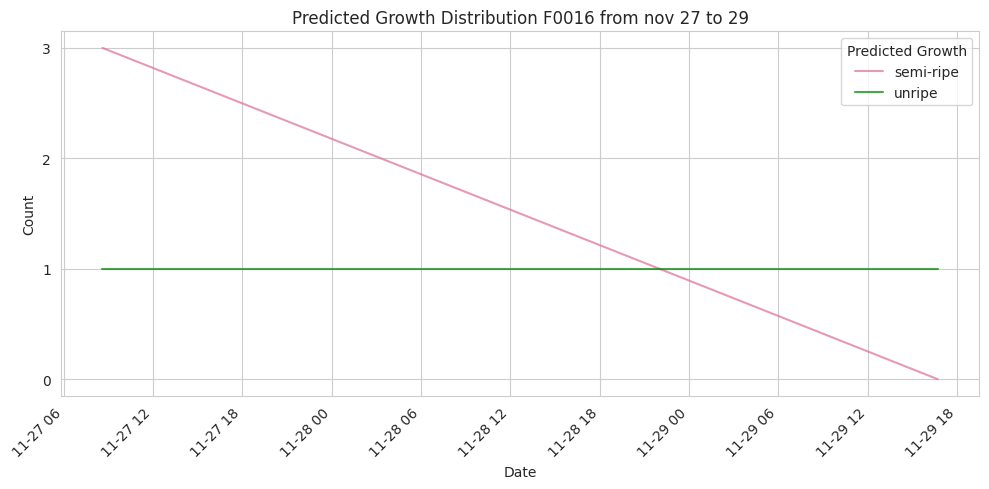

<Figure size 1200x600 with 0 Axes>

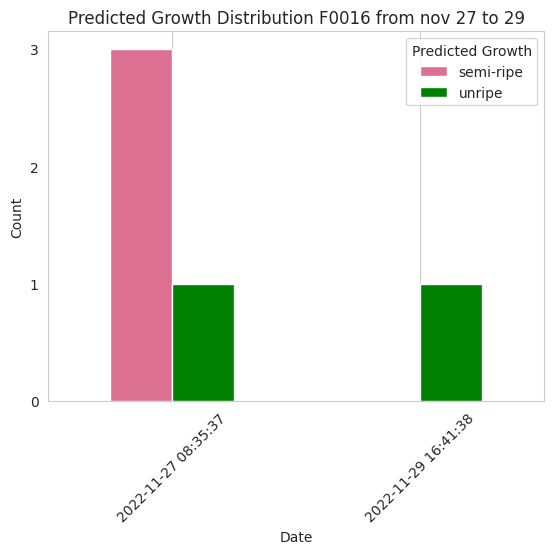

<Figure size 1200x600 with 0 Axes>

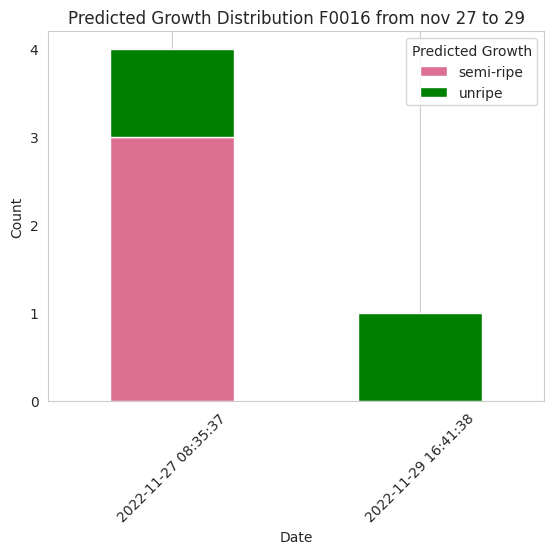

In [39]:
select_22_23_nov_1 = F0016_22_23_nov_data[(F0016_22_23_nov_data['shot_datetime'] >= '2022-11-04') & (F0016_22_23_nov_data['shot_datetime'] <= '2022-11-06')]
select_22_23_nov_2 = F0016_22_23_nov_data[(F0016_22_23_nov_data['shot_datetime'] >= '2022-11-20') & (F0016_22_23_nov_data['shot_datetime'] <= '2022-11-22')]
select_22_23_nov_3 = F0016_22_23_nov_data[(F0016_22_23_nov_data['shot_datetime'] >= '2022-11-22') & (F0016_22_23_nov_data['shot_datetime'] <= '2022-11-24')]
select_22_23_nov_4 = F0016_22_23_nov_data[(F0016_22_23_nov_data['shot_datetime'] >= '2022-11-27') & (F0016_22_23_nov_data['shot_datetime'] <= '2022-11-30')]

nov_22_23_1_counts = select_22_23_nov_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_22_23_2_counts = select_22_23_nov_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_22_23_3_counts = select_22_23_nov_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_22_23_4_counts = select_22_23_nov_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(nov_22_23_1_counts, 'Predicted Growth Distribution F0016 from nov 4 to 5'),
            (nov_22_23_2_counts, 'Predicted Growth Distribution F0016 from nov 20 to 21'),
            (nov_22_23_3_counts, 'Predicted Growth Distribution F0016 from nov 22 to 23'),
            (nov_22_23_4_counts, 'Predicted Growth Distribution F0016 from nov 27 to 29')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 22-23작기 12월 생산량 추이

/tmp/ipykernel_21186/1882059763.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_dec_data['shot_datetime'] = pd.to_datetime(F0016_22_23_dec_data['shot_datetime'])


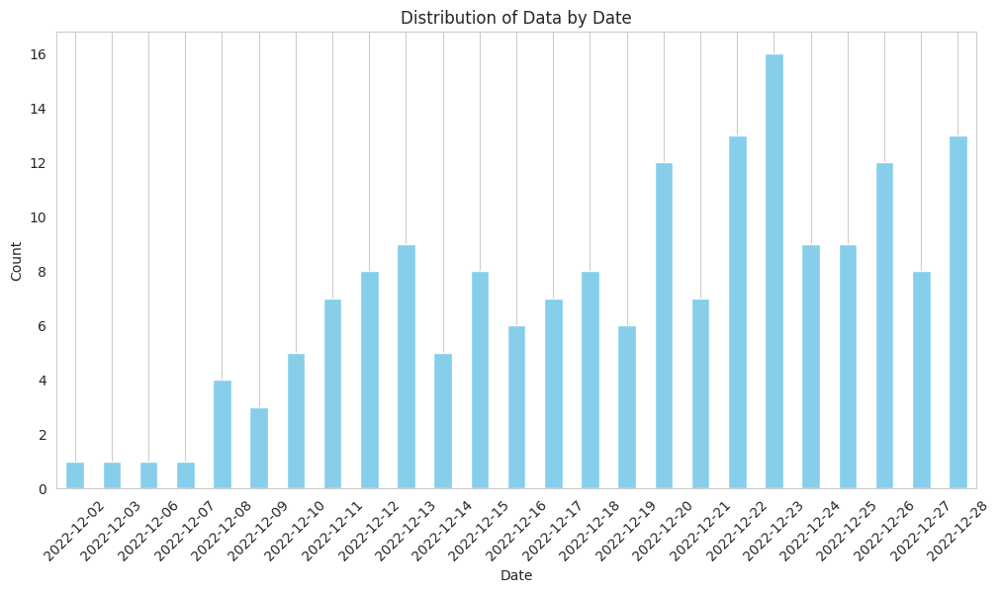

In [40]:
# F0016_22_23_dec_data 생성
F0016_22_23_dec_data = F0016_22_23[F0016_22_23['측정월'] == 12]
F0016_22_23_dec_data['shot_datetime'] = pd.to_datetime(F0016_22_23_dec_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_dec_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

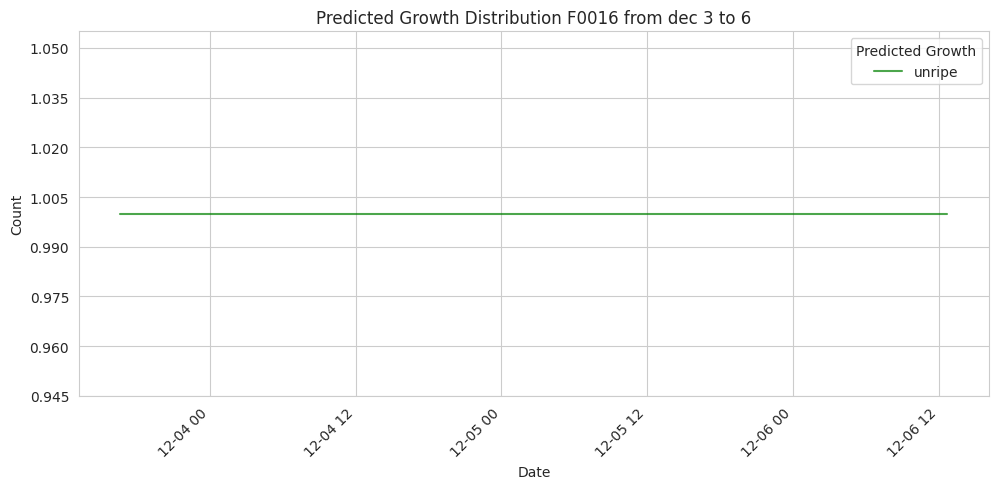

<Figure size 1200x600 with 0 Axes>

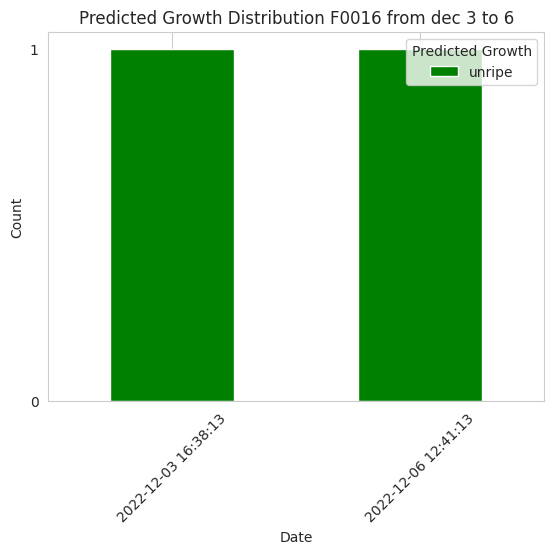

<Figure size 1200x600 with 0 Axes>

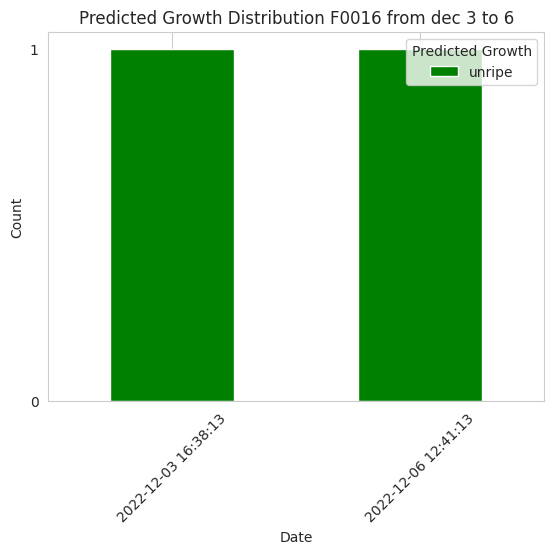

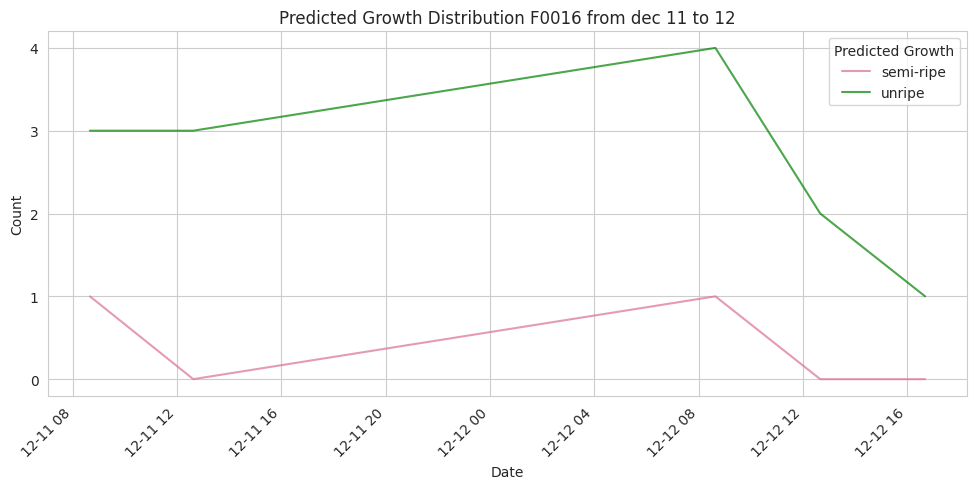

<Figure size 1200x600 with 0 Axes>

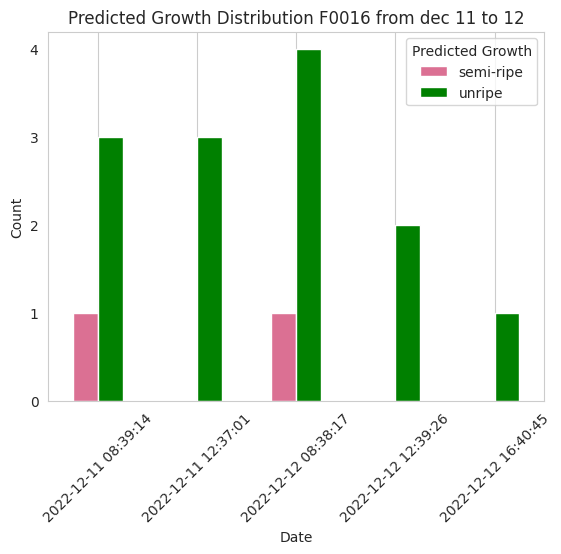

<Figure size 1200x600 with 0 Axes>

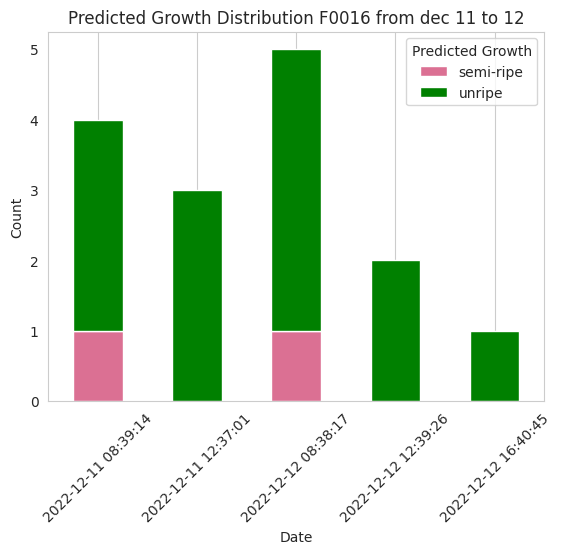

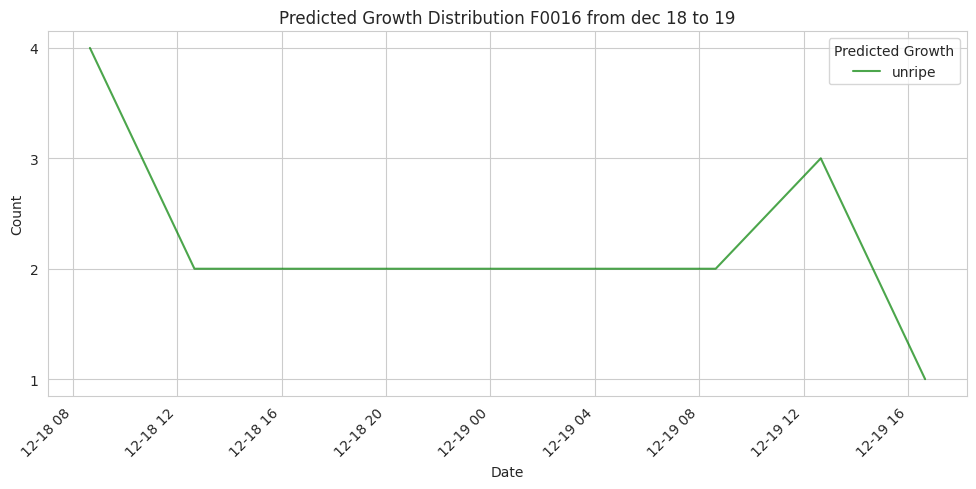

<Figure size 1200x600 with 0 Axes>

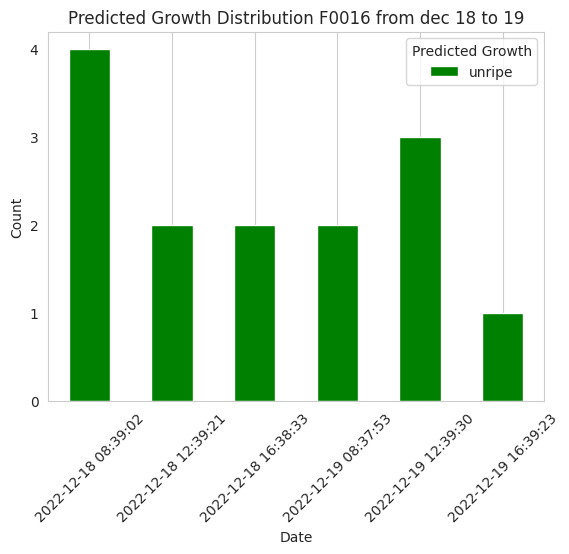

<Figure size 1200x600 with 0 Axes>

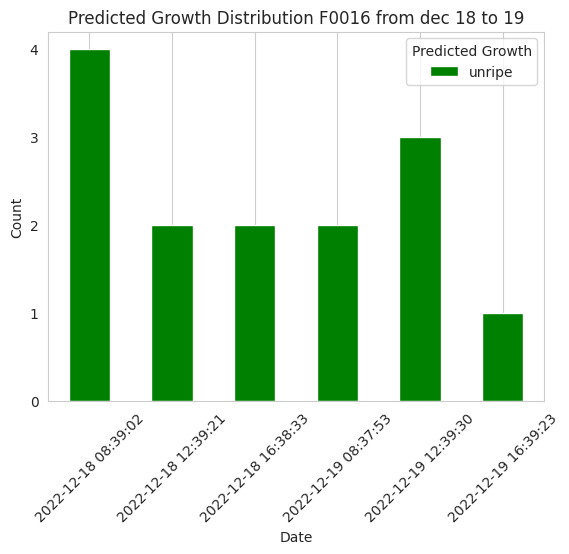

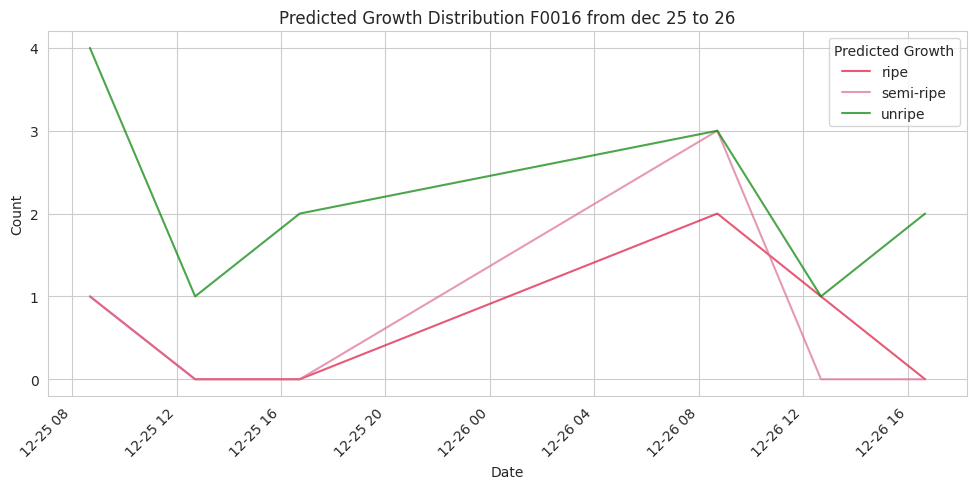

<Figure size 1200x600 with 0 Axes>

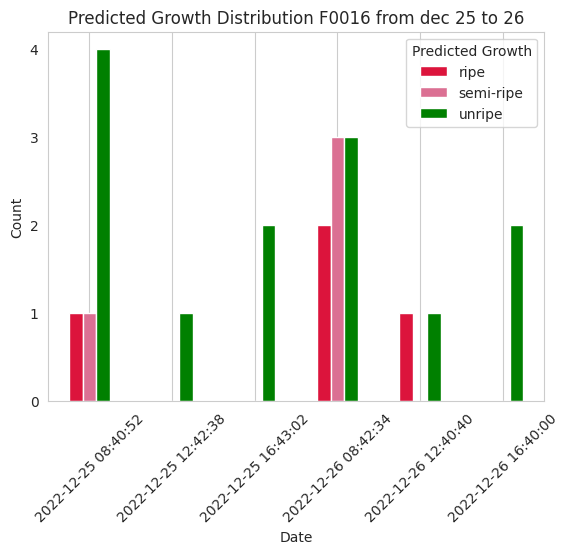

<Figure size 1200x600 with 0 Axes>

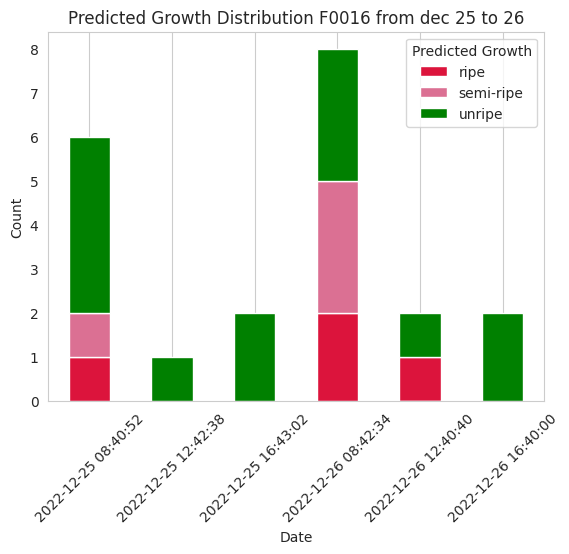

In [41]:
select_22_23_dec_1 = F0016_22_23_dec_data[(F0016_22_23_dec_data['shot_datetime'] >= '2022-12-03') & (F0016_22_23_dec_data['shot_datetime'] <= '2022-12-07')]
select_22_23_dec_2 = F0016_22_23_dec_data[(F0016_22_23_dec_data['shot_datetime'] >= '2022-12-11') & (F0016_22_23_dec_data['shot_datetime'] <= '2022-12-13')]
select_22_23_dec_3 = F0016_22_23_dec_data[(F0016_22_23_dec_data['shot_datetime'] >= '2022-12-18') & (F0016_22_23_dec_data['shot_datetime'] <= '2022-12-20')]
select_22_23_dec_4 = F0016_22_23_dec_data[(F0016_22_23_dec_data['shot_datetime'] >= '2022-12-25') & (F0016_22_23_dec_data['shot_datetime'] <= '2022-12-27')]

dec_22_23_1_counts = select_22_23_dec_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_22_23_2_counts = select_22_23_dec_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_22_23_3_counts = select_22_23_dec_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_22_23_4_counts = select_22_23_dec_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(dec_22_23_1_counts, 'Predicted Growth Distribution F0016 from dec 3 to 6'),
            (dec_22_23_2_counts, 'Predicted Growth Distribution F0016 from dec 11 to 12'),
            (dec_22_23_3_counts, 'Predicted Growth Distribution F0016 from dec 18 to 19'),
            (dec_22_23_4_counts, 'Predicted Growth Distribution F0016 from dec 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 22-23작기 1월 생산량추이

/tmp/ipykernel_21186/1366663064.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_jan_data['shot_datetime'] = pd.to_datetime(F0016_22_23_jan_data['shot_datetime'])


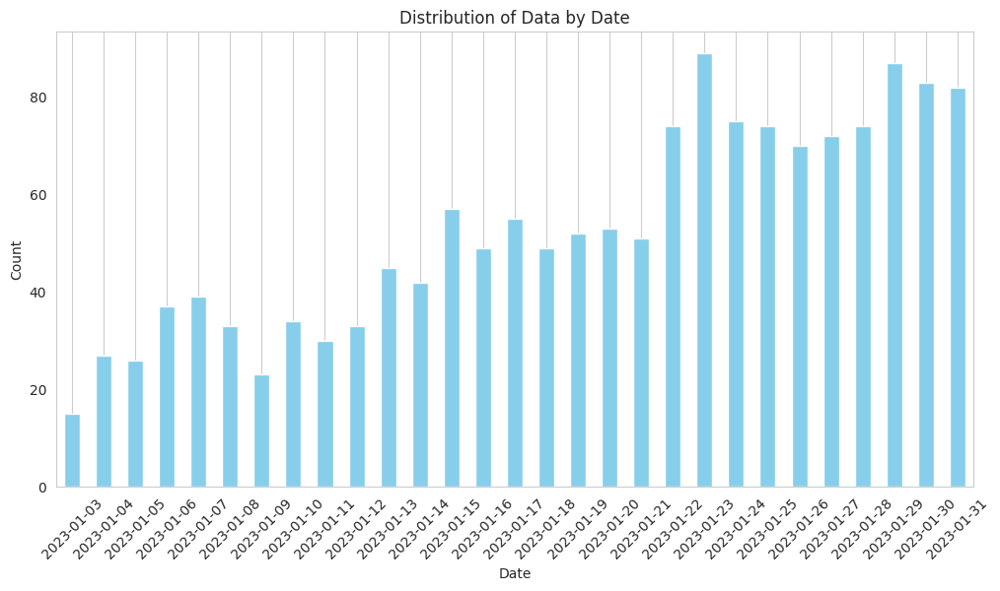

In [42]:
# F0016_22_23_jan_data 생성
F0016_22_23_jan_data = F0016_22_23[F0016_22_23['측정월'] == 1]
F0016_22_23_jan_data['shot_datetime'] = pd.to_datetime(F0016_22_23_jan_data['shot_datetime'])
# 일자별 mask_id 개수 카운트
date_counts = F0016_22_23_jan_data.groupby(F0016_22_23_jan_data['shot_datetime'].dt.date)['mask_id'].nunique().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

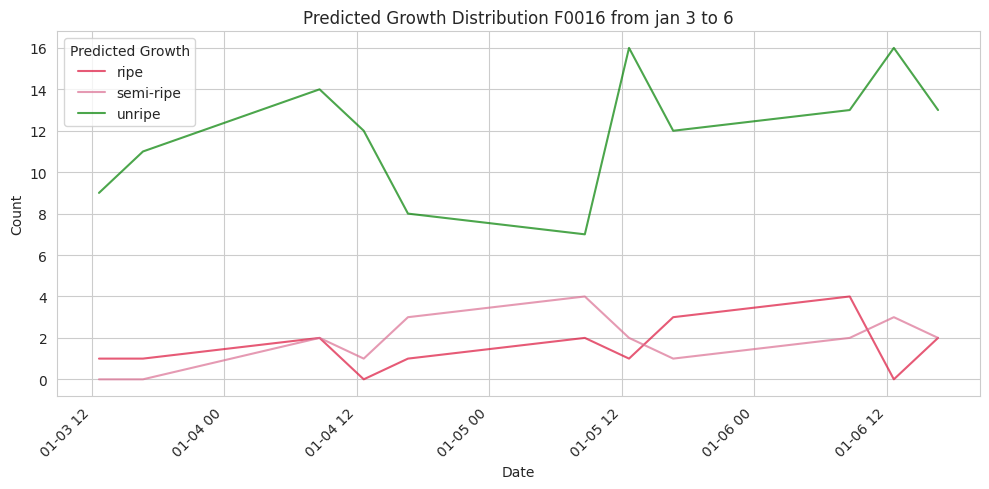

<Figure size 1200x600 with 0 Axes>

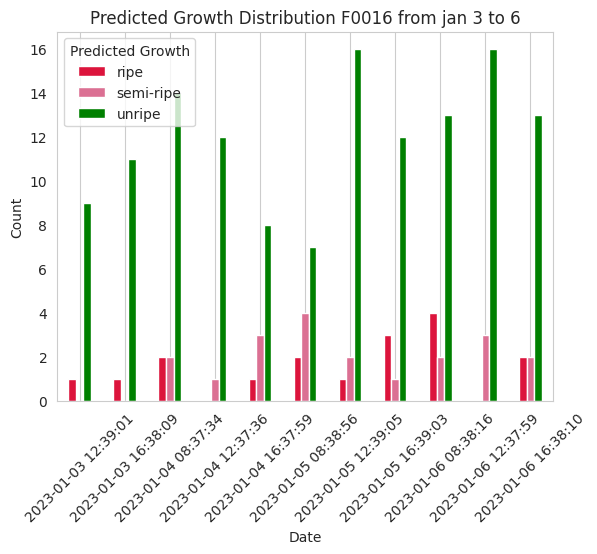

<Figure size 1200x600 with 0 Axes>

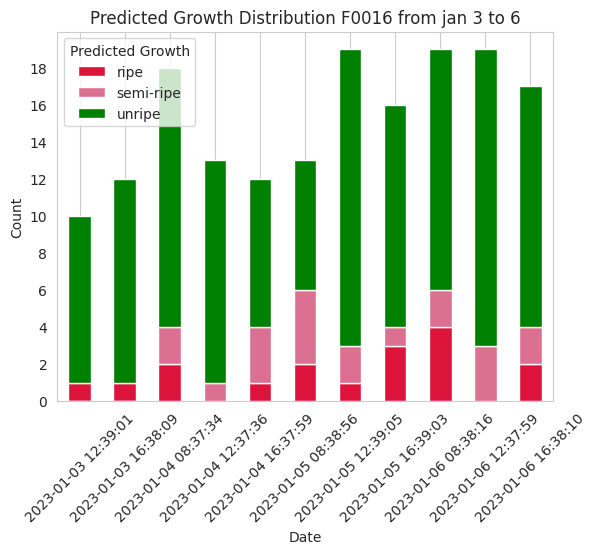

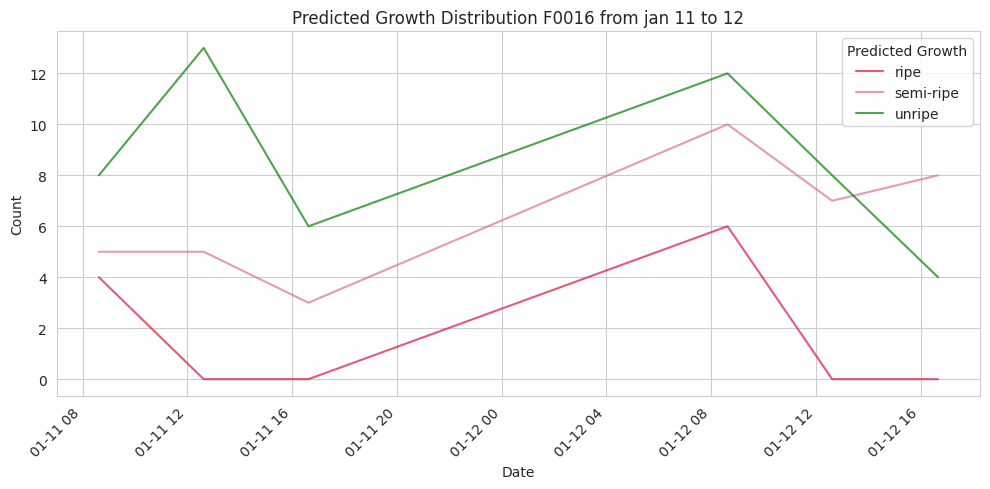

<Figure size 1200x600 with 0 Axes>

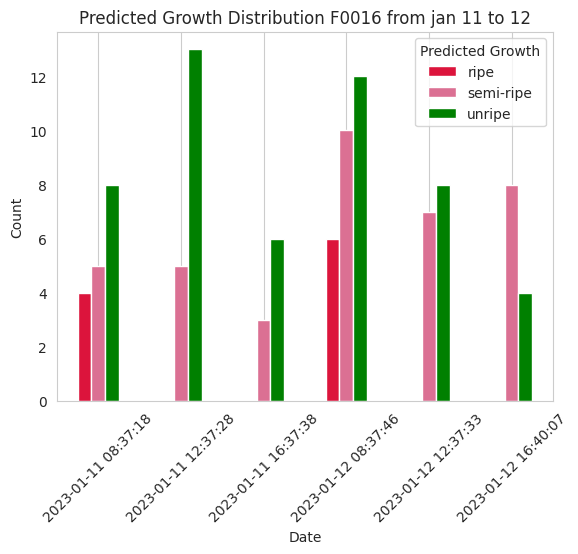

<Figure size 1200x600 with 0 Axes>

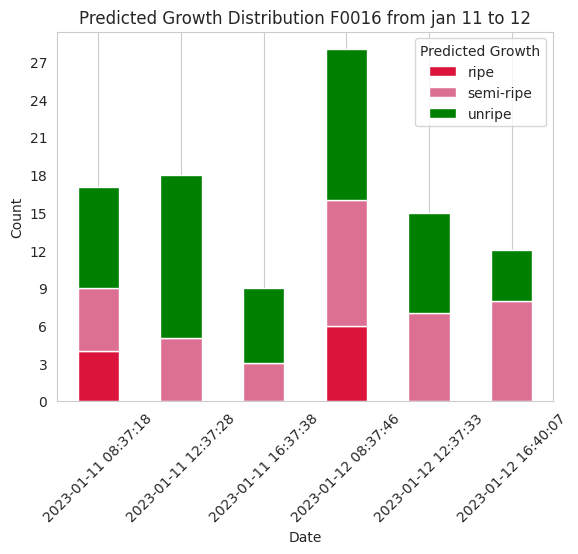

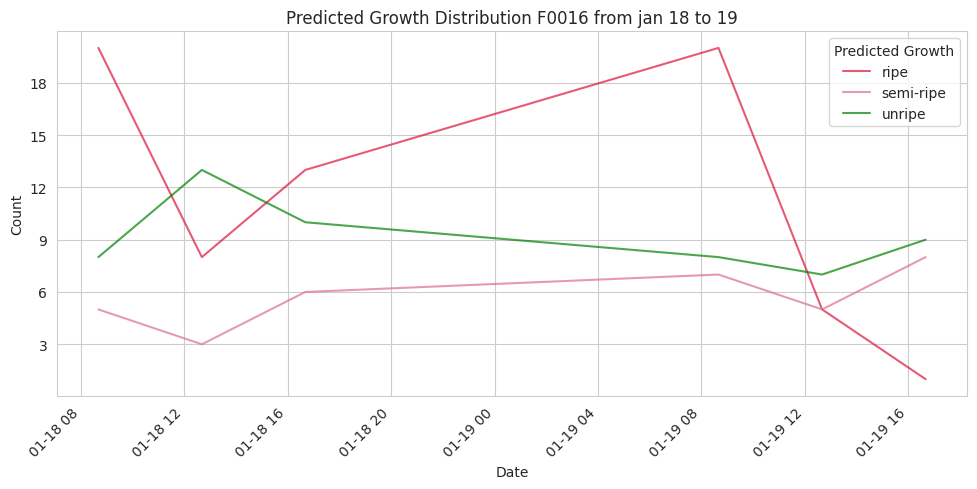

<Figure size 1200x600 with 0 Axes>

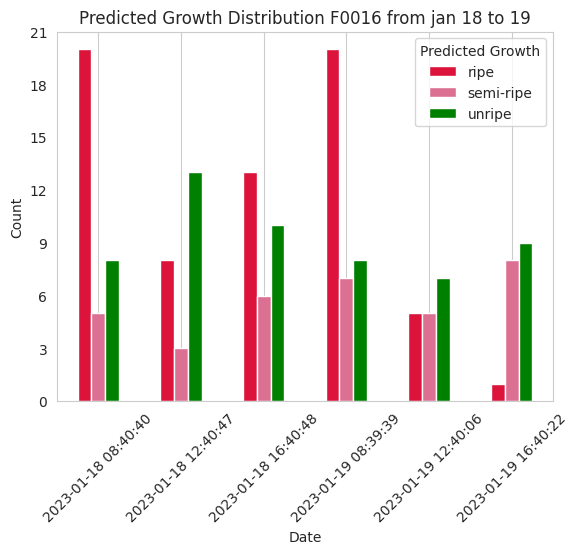

<Figure size 1200x600 with 0 Axes>

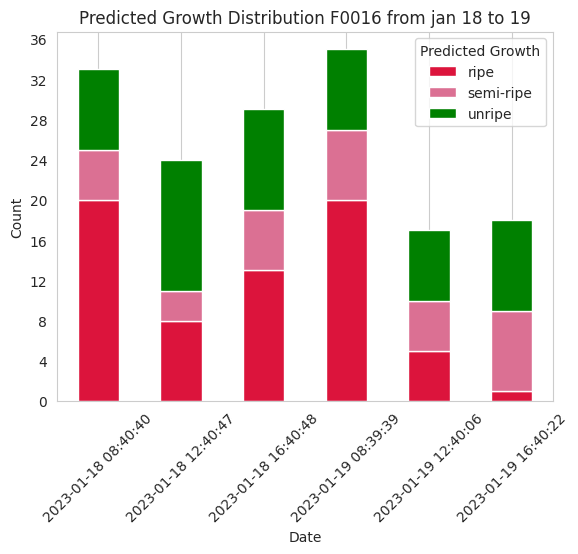

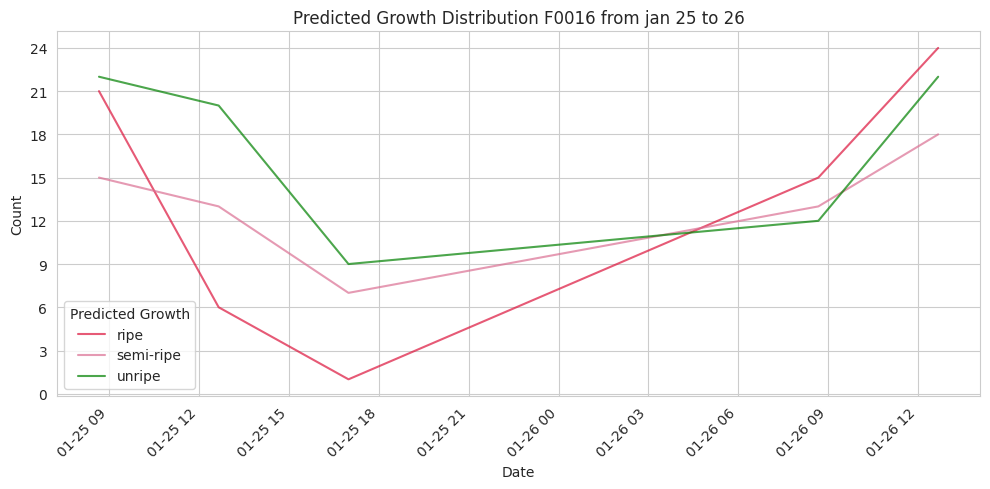

<Figure size 1200x600 with 0 Axes>

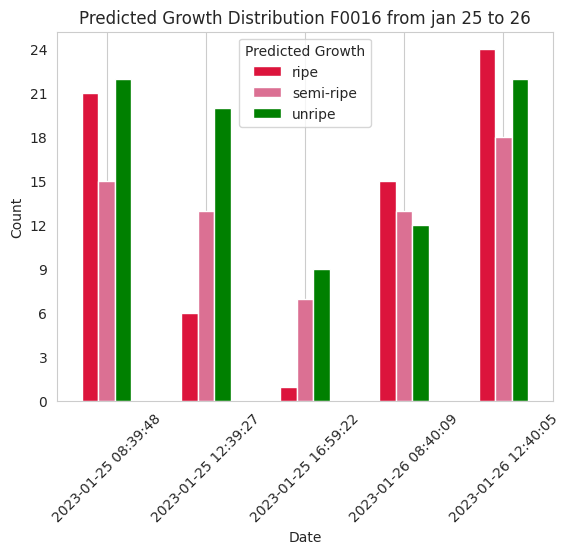

<Figure size 1200x600 with 0 Axes>

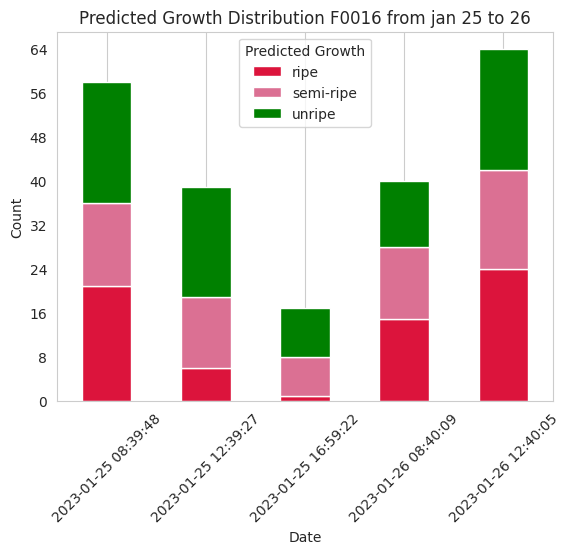

In [43]:
select_22_23_jan_1 = F0016_22_23_jan_data[(F0016_22_23_jan_data['shot_datetime'] >= '2023-01-03') & (F0016_22_23_jan_data['shot_datetime'] <= '2023-01-07')]
select_22_23_jan_2 = F0016_22_23_jan_data[(F0016_22_23_jan_data['shot_datetime'] >= '2023-01-11') & (F0016_22_23_jan_data['shot_datetime'] <= '2023-01-13')]
select_22_23_jan_3 = F0016_22_23_jan_data[(F0016_22_23_jan_data['shot_datetime'] >= '2023-01-18') & (F0016_22_23_jan_data['shot_datetime'] <= '2023-01-20')]
select_22_23_jan_4 = F0016_22_23_jan_data[(F0016_22_23_jan_data['shot_datetime'] >= '2023-01-25') & (F0016_22_23_jan_data['shot_datetime'] <= '2023-01-27')]

jan_22_23_1_counts = select_22_23_jan_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_22_23_2_counts = select_22_23_jan_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_22_23_3_counts = select_22_23_jan_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_22_23_4_counts = select_22_23_jan_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')


# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(jan_22_23_1_counts, 'Predicted Growth Distribution F0016 from jan 3 to 6'),
            (jan_22_23_2_counts, 'Predicted Growth Distribution F0016 from jan 11 to 12'),
            (jan_22_23_3_counts, 'Predicted Growth Distribution F0016 from jan 18 to 19'),
            (jan_22_23_4_counts, 'Predicted Growth Distribution F0016 from jan 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 22-23작기 2월 생산량 추이

/tmp/ipykernel_21186/3022473489.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_feb_data['shot_datetime'] = pd.to_datetime(F0016_22_23_feb_data['shot_datetime'])


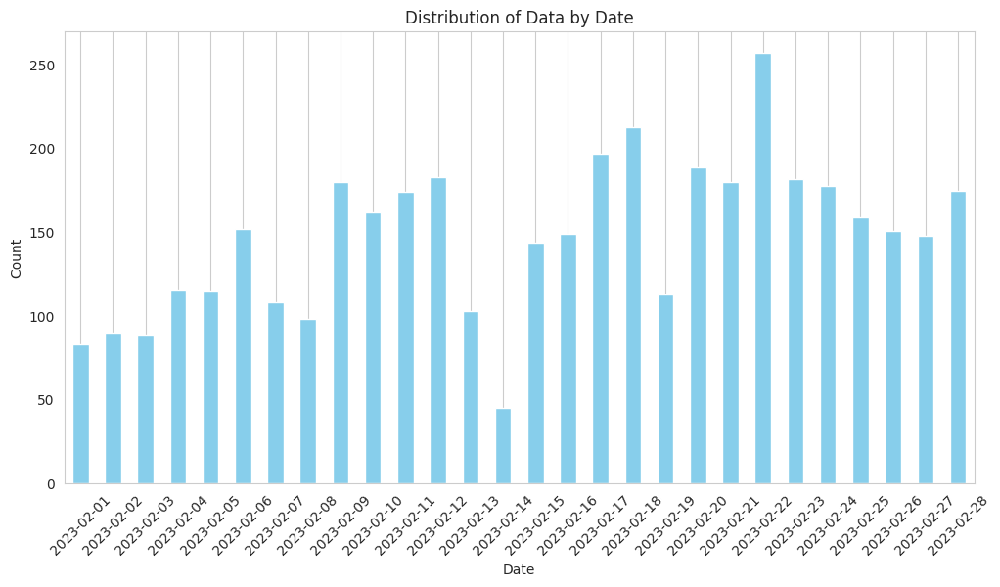

In [44]:
# F0016_22_23_feb_data 생성
F0016_22_23_feb_data = F0016_22_23[F0016_22_23['측정월'] == 2]
F0016_22_23_feb_data['shot_datetime'] = pd.to_datetime(F0016_22_23_feb_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_feb_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

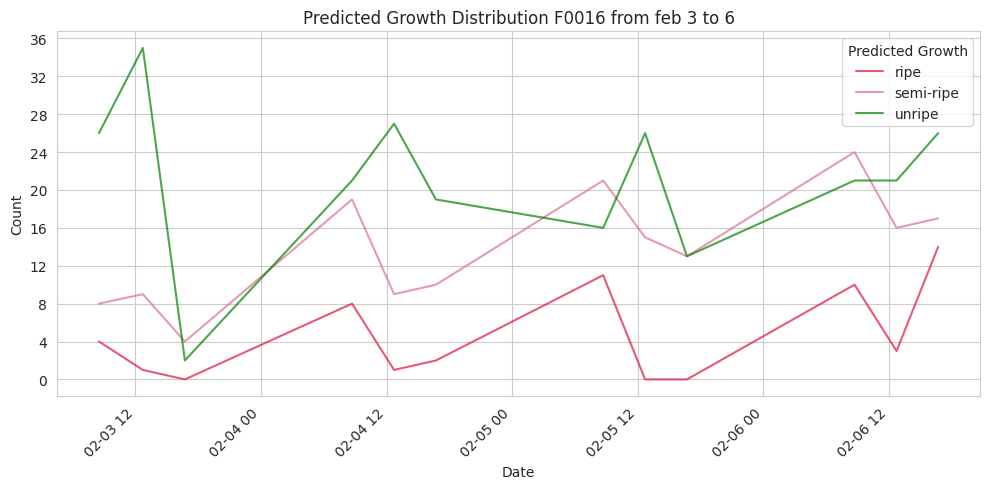

<Figure size 1200x600 with 0 Axes>

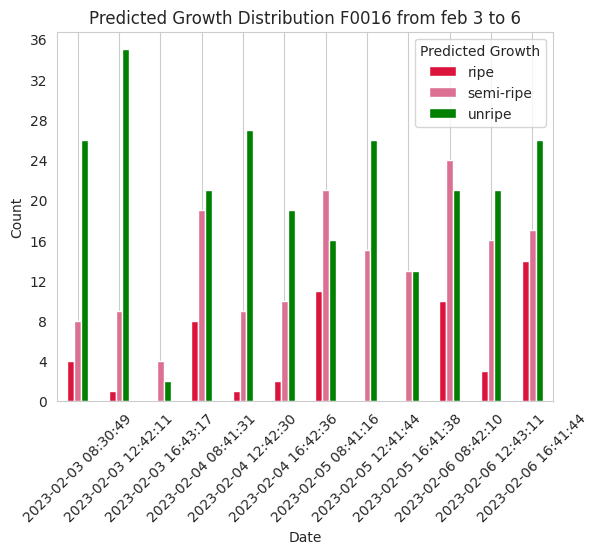

<Figure size 1200x600 with 0 Axes>

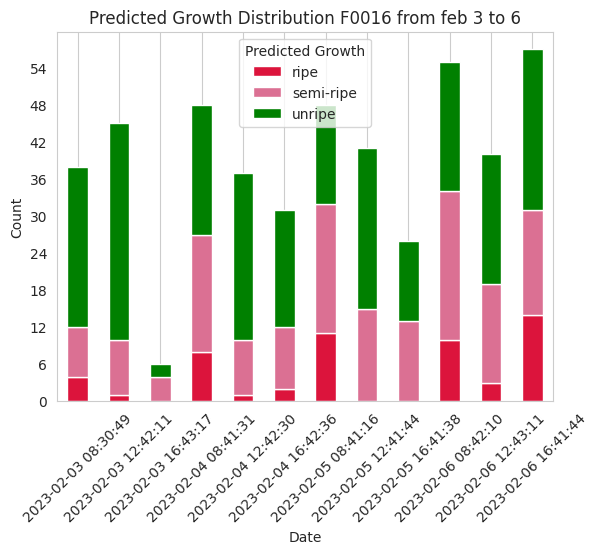

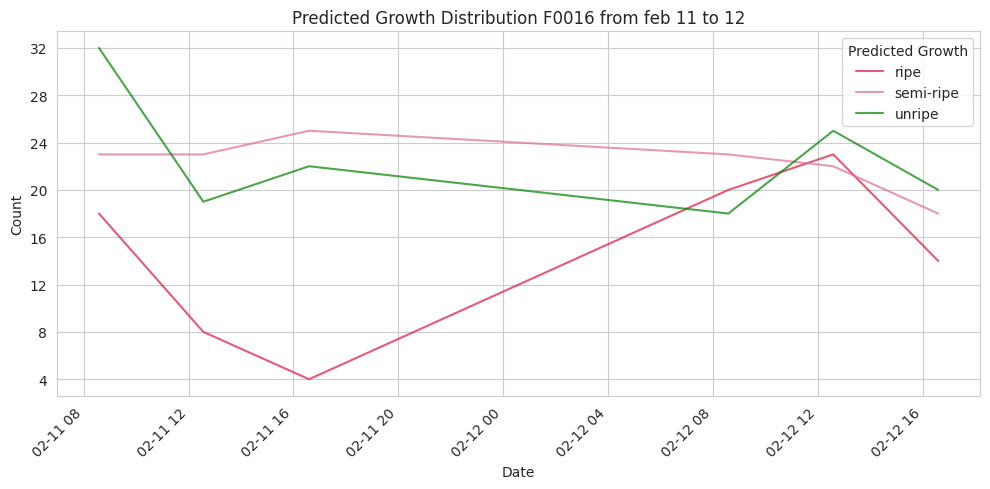

<Figure size 1200x600 with 0 Axes>

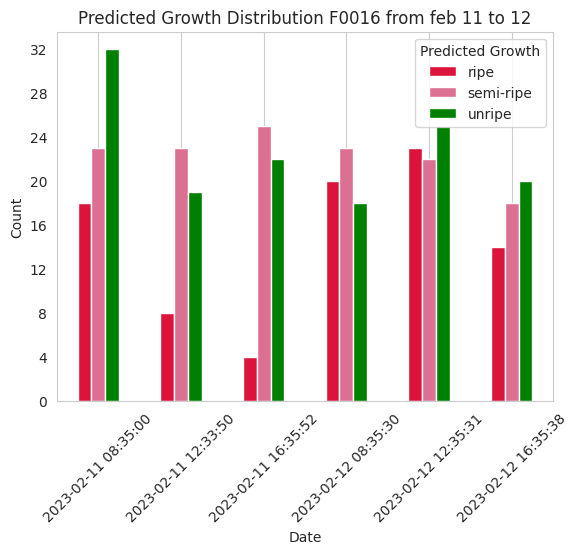

<Figure size 1200x600 with 0 Axes>

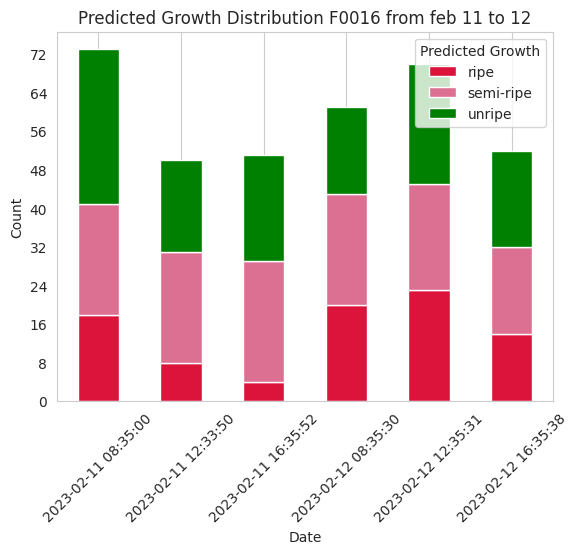

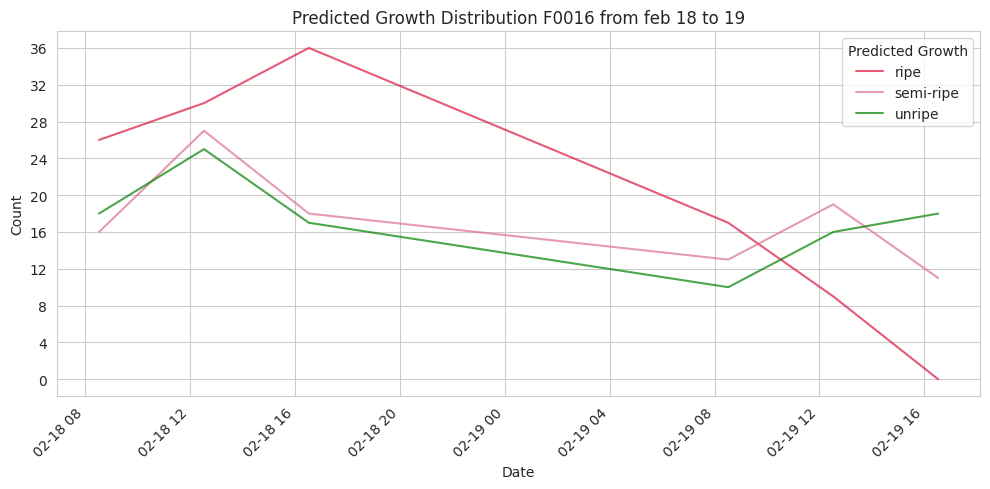

<Figure size 1200x600 with 0 Axes>

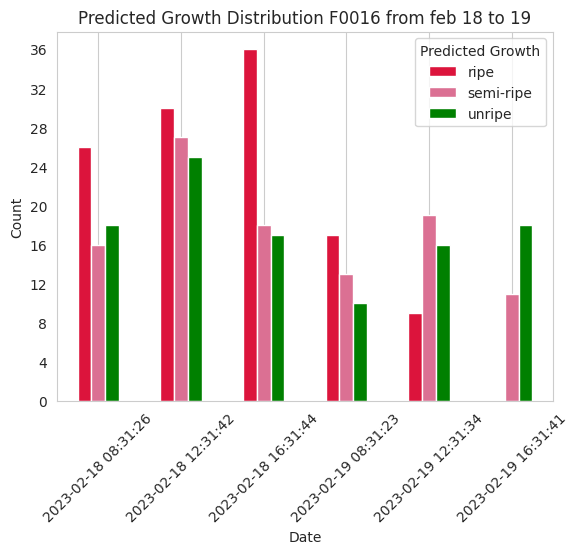

<Figure size 1200x600 with 0 Axes>

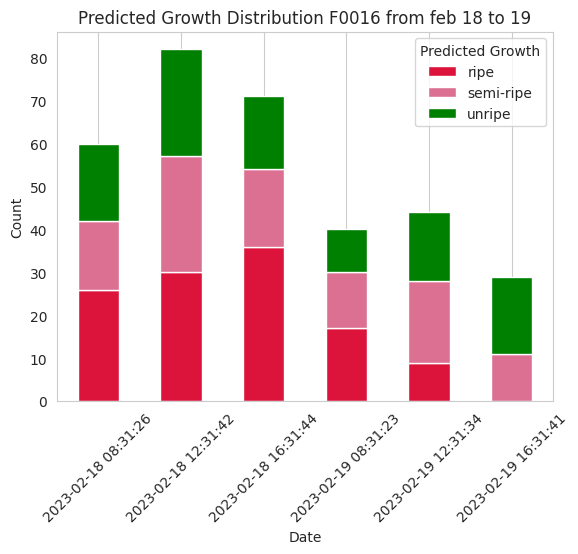

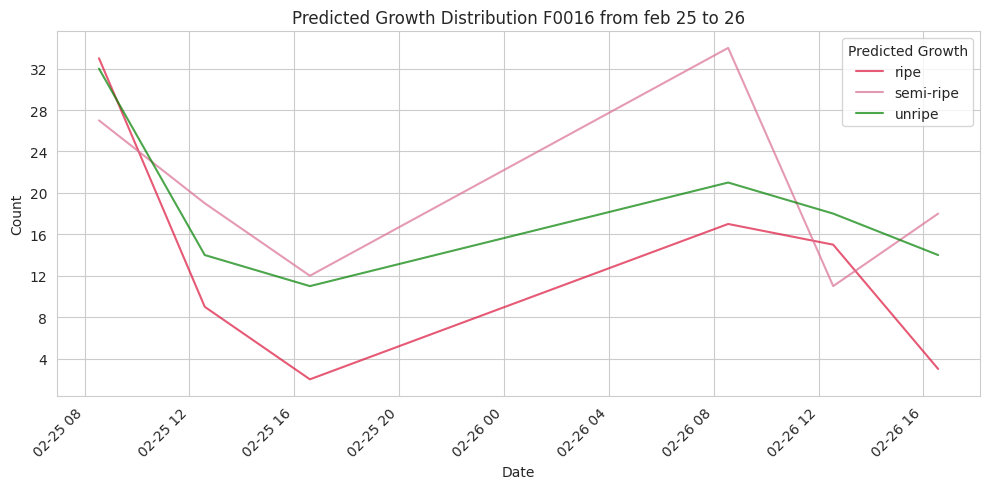

<Figure size 1200x600 with 0 Axes>

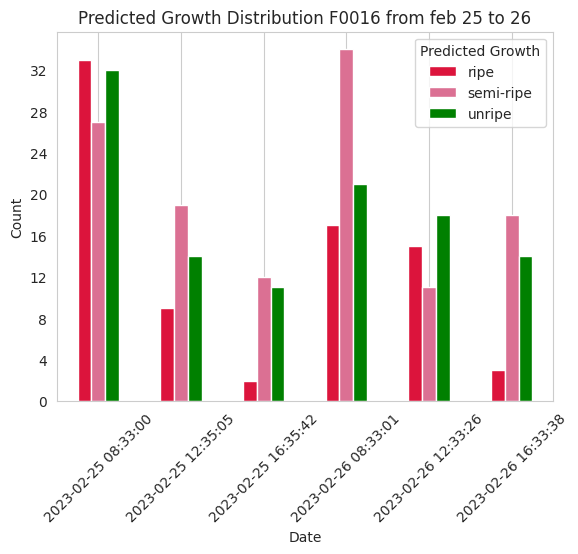

<Figure size 1200x600 with 0 Axes>

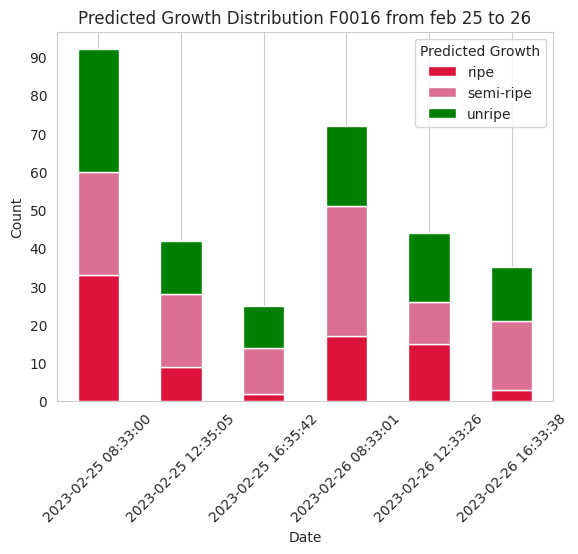

In [45]:
select_22_23_feb_1 = F0016_22_23_feb_data[(F0016_22_23_feb_data['shot_datetime'] >= '2023-02-03') & (F0016_22_23_feb_data['shot_datetime'] <= '2023-02-07')]
select_22_23_feb_2 = F0016_22_23_feb_data[(F0016_22_23_feb_data['shot_datetime'] >= '2023-02-11') & (F0016_22_23_feb_data['shot_datetime'] <= '2023-02-13')]
select_22_23_feb_3 = F0016_22_23_feb_data[(F0016_22_23_feb_data['shot_datetime'] >= '2023-02-18') & (F0016_22_23_feb_data['shot_datetime'] <= '2023-02-20')]
select_22_23_feb_4 = F0016_22_23_feb_data[(F0016_22_23_feb_data['shot_datetime'] >= '2023-02-25') & (F0016_22_23_feb_data['shot_datetime'] <= '2023-02-27')]

feb_22_23_1_counts = select_22_23_feb_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_22_23_2_counts = select_22_23_feb_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_22_23_3_counts = select_22_23_feb_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_22_23_4_counts = select_22_23_feb_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')


# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(feb_22_23_1_counts, 'Predicted Growth Distribution F0016 from feb 3 to 6'),
            (feb_22_23_2_counts, 'Predicted Growth Distribution F0016 from feb 11 to 12'),
            (feb_22_23_3_counts, 'Predicted Growth Distribution F0016 from feb 18 to 19'),
            (feb_22_23_4_counts, 'Predicted Growth Distribution F0016 from feb 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 22-23작기 3월 생산량 추이 

/tmp/ipykernel_21186/2059034220.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_mar_data['shot_datetime'] = pd.to_datetime(F0016_22_23_mar_data['shot_datetime'])


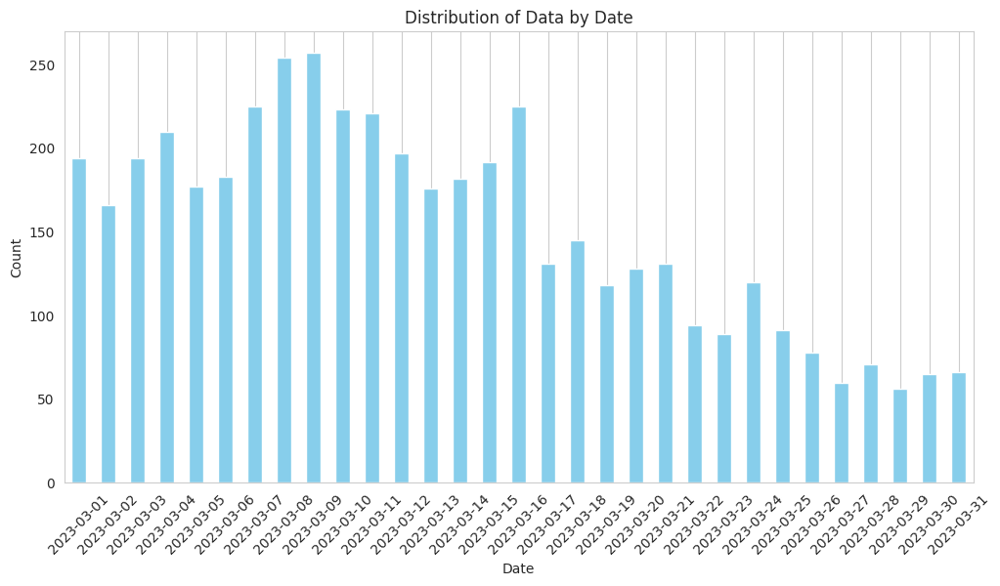

In [46]:
# F0016_22_23_mar_data 생성
F0016_22_23_mar_data = F0016_22_23[F0016_22_23['측정월'] == 3]
F0016_22_23_mar_data['shot_datetime'] = pd.to_datetime(F0016_22_23_mar_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_mar_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

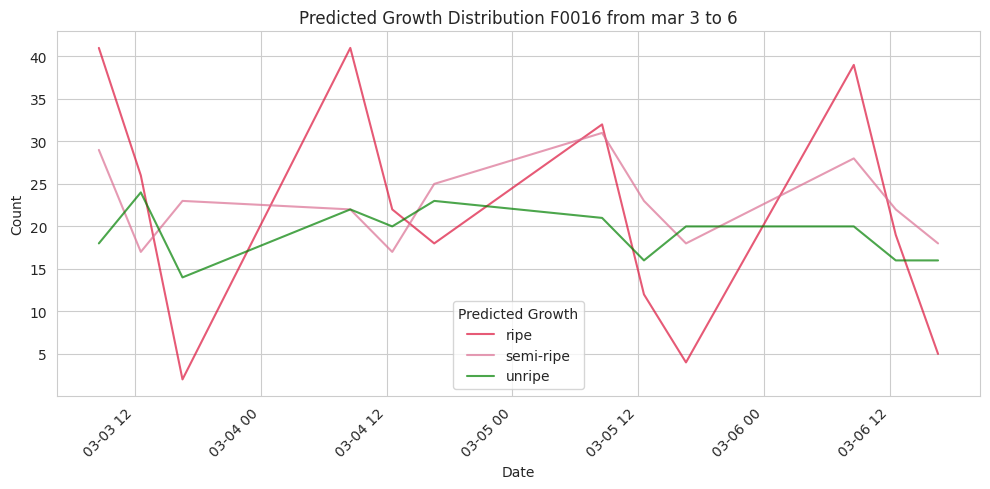

<Figure size 1200x600 with 0 Axes>

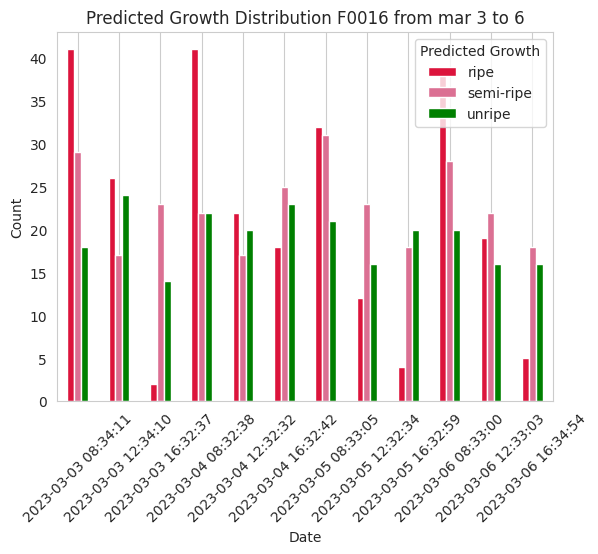

<Figure size 1200x600 with 0 Axes>

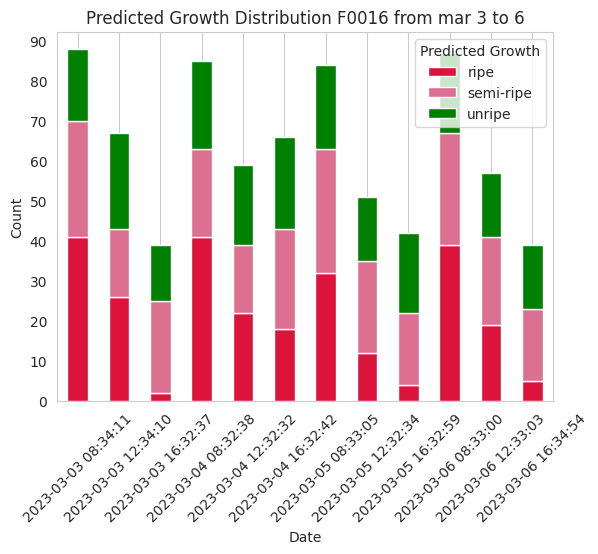

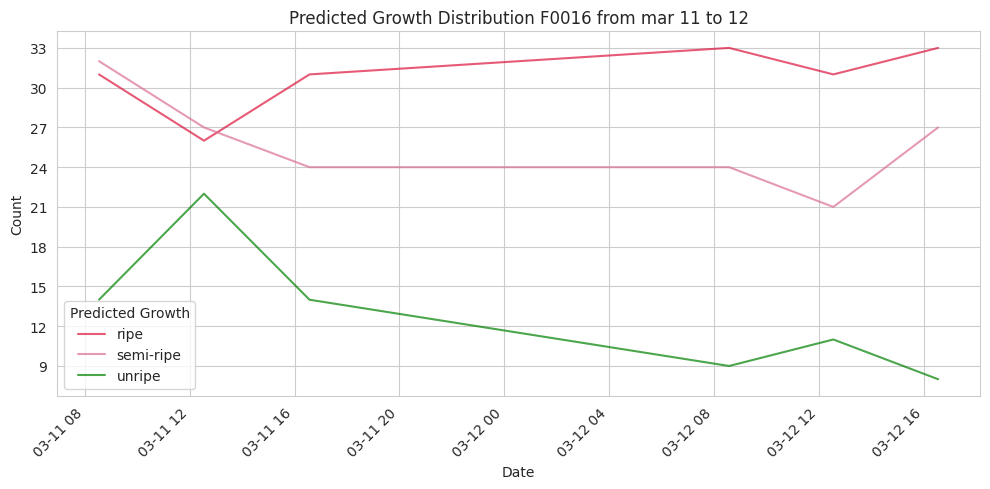

<Figure size 1200x600 with 0 Axes>

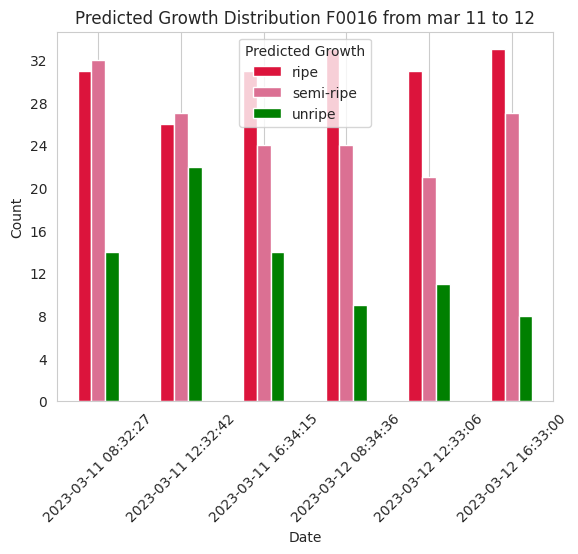

<Figure size 1200x600 with 0 Axes>

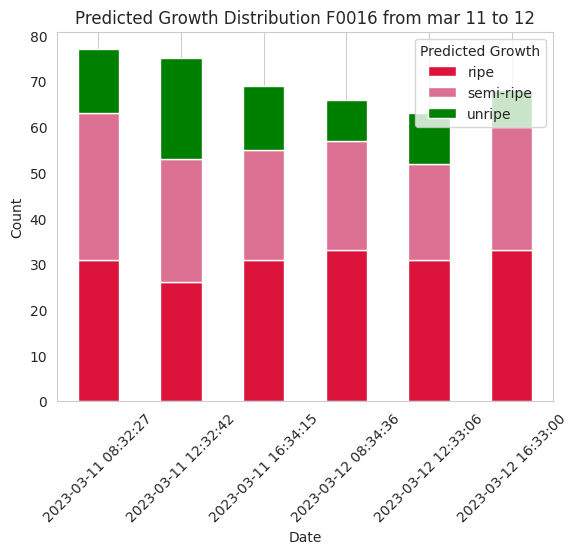

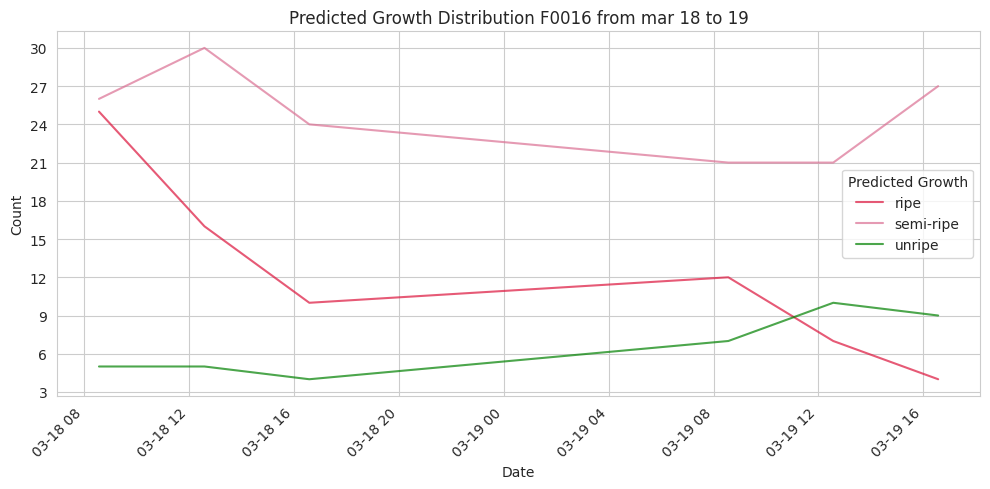

<Figure size 1200x600 with 0 Axes>

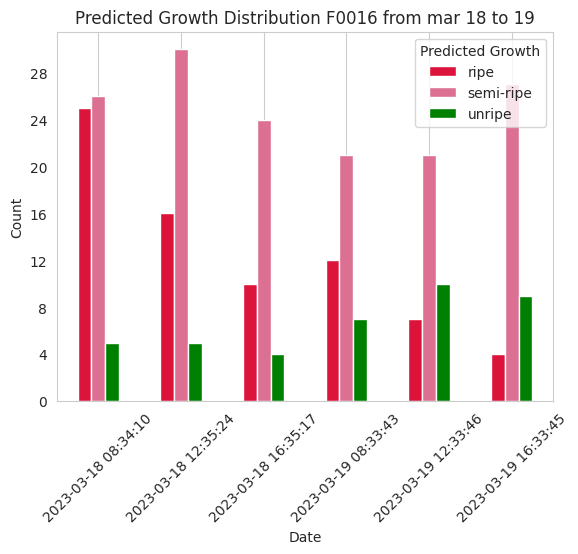

<Figure size 1200x600 with 0 Axes>

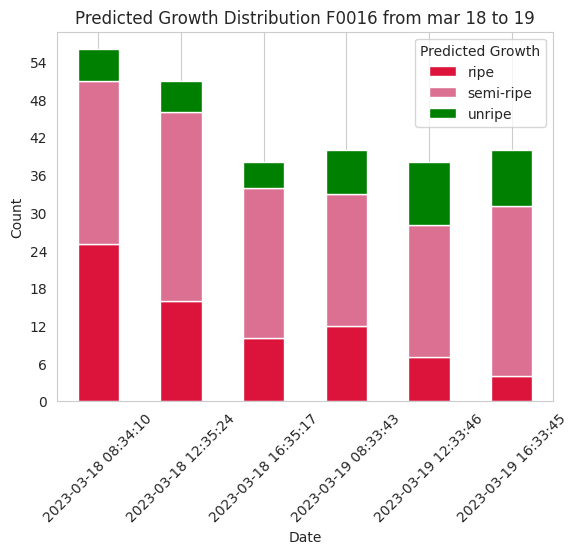

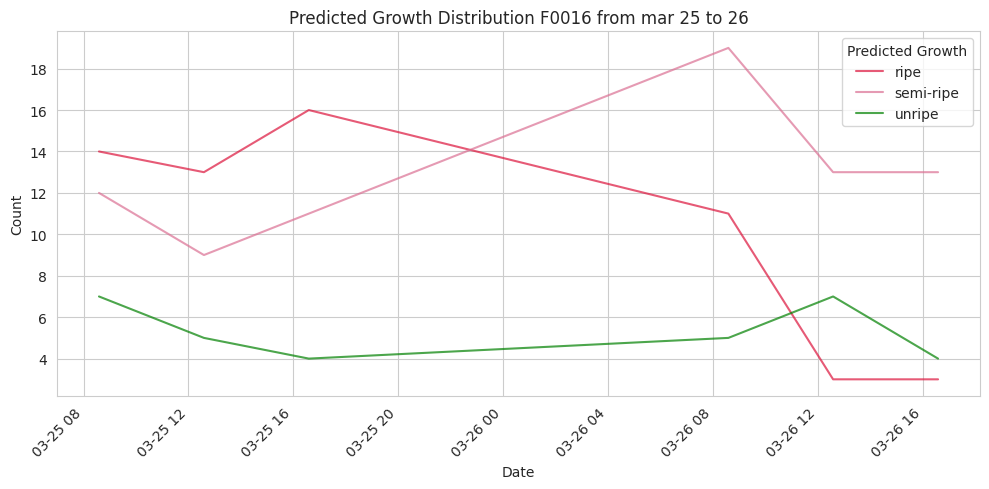

<Figure size 1200x600 with 0 Axes>

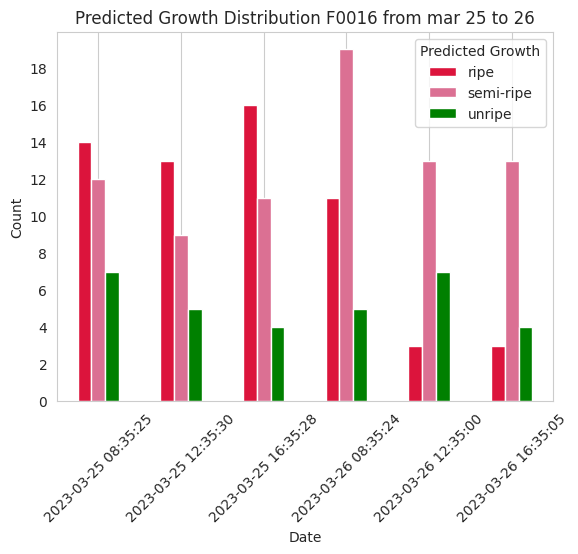

<Figure size 1200x600 with 0 Axes>

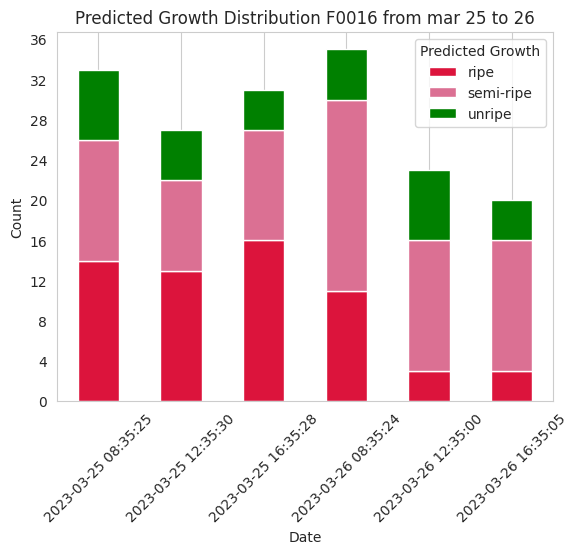

In [47]:
select_22_23_mar_1 = F0016_22_23_mar_data[(F0016_22_23_mar_data['shot_datetime'] >= '2023-03-03') & (F0016_22_23_mar_data['shot_datetime'] <= '2023-03-07')]
select_22_23_mar_2 = F0016_22_23_mar_data[(F0016_22_23_mar_data['shot_datetime'] >= '2023-03-11') & (F0016_22_23_mar_data['shot_datetime'] <= '2023-03-13')]
select_22_23_mar_3 = F0016_22_23_mar_data[(F0016_22_23_mar_data['shot_datetime'] >= '2023-03-18') & (F0016_22_23_mar_data['shot_datetime'] <= '2023-03-20')]
select_22_23_mar_4 = F0016_22_23_mar_data[(F0016_22_23_mar_data['shot_datetime'] >= '2023-03-25') & (F0016_22_23_mar_data['shot_datetime'] <= '2023-03-27')]

mar_22_23_1_counts = select_22_23_mar_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_22_23_2_counts = select_22_23_mar_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_22_23_3_counts = select_22_23_mar_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_22_23_4_counts = select_22_23_mar_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')


# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(mar_22_23_1_counts, 'Predicted Growth Distribution F0016 from mar 3 to 6'),
            (mar_22_23_2_counts, 'Predicted Growth Distribution F0016 from mar 11 to 12'),
            (mar_22_23_3_counts, 'Predicted Growth Distribution F0016 from mar 18 to 19'),
            (mar_22_23_4_counts, 'Predicted Growth Distribution F0016 from mar 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 22-23작기 4월 생산량 추이

/tmp/ipykernel_21186/3762129149.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_apr_data['shot_datetime'] = pd.to_datetime(F0016_22_23_apr_data['shot_datetime'])


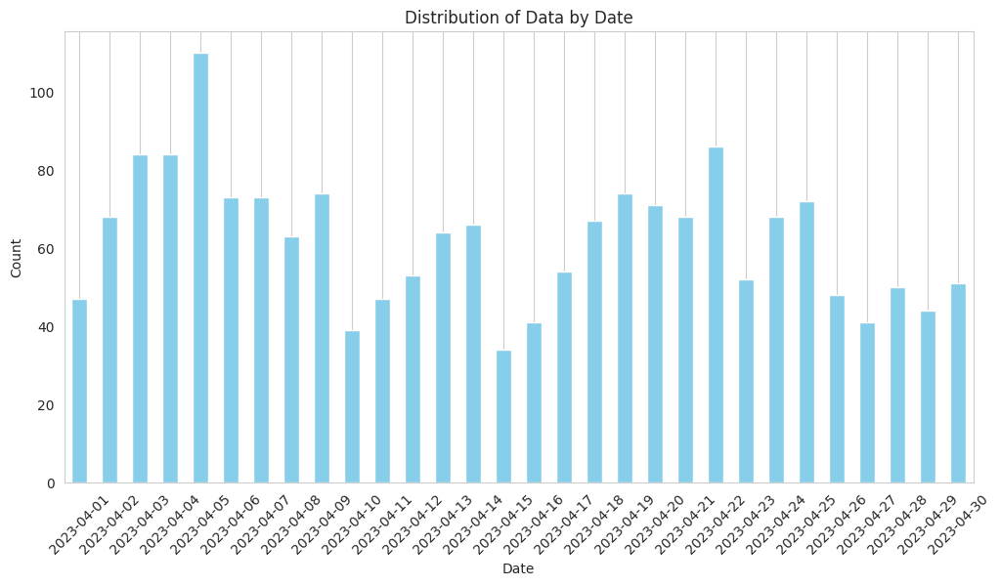

In [48]:
# F0016_22_23_apr_data 생성
F0016_22_23_apr_data = F0016_22_23[F0016_22_23['측정월'] == 4]
F0016_22_23_apr_data['shot_datetime'] = pd.to_datetime(F0016_22_23_apr_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_apr_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

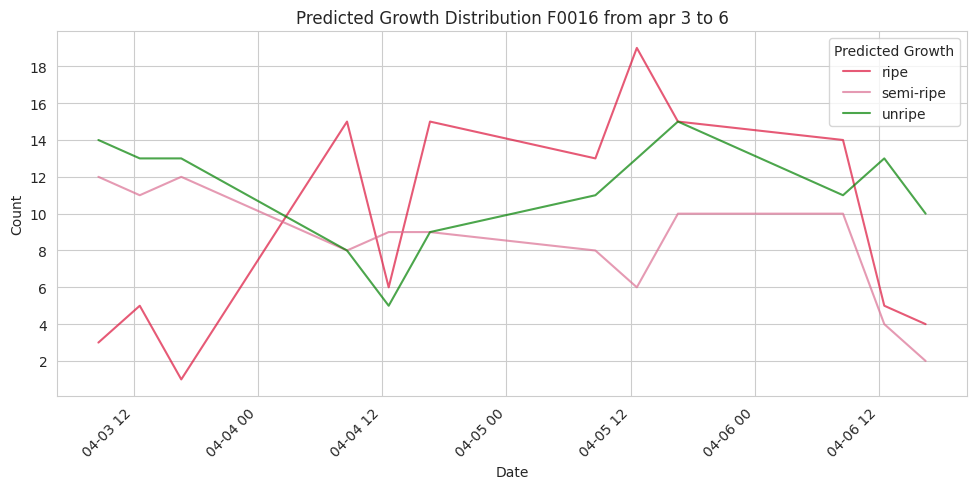

<Figure size 1200x600 with 0 Axes>

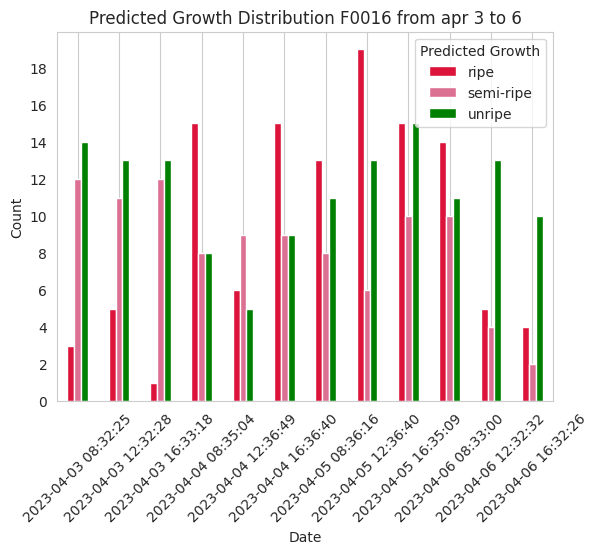

<Figure size 1200x600 with 0 Axes>

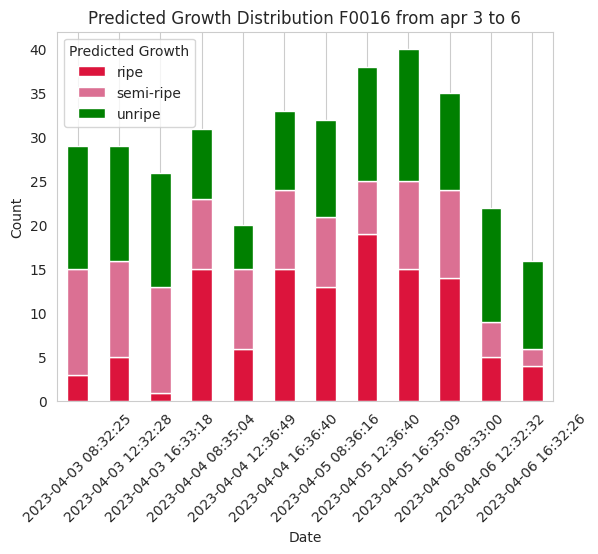

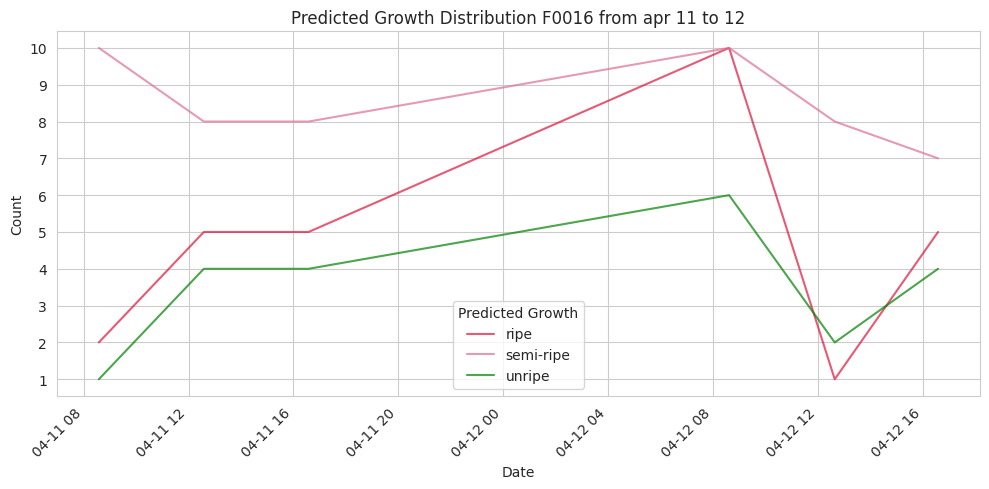

<Figure size 1200x600 with 0 Axes>

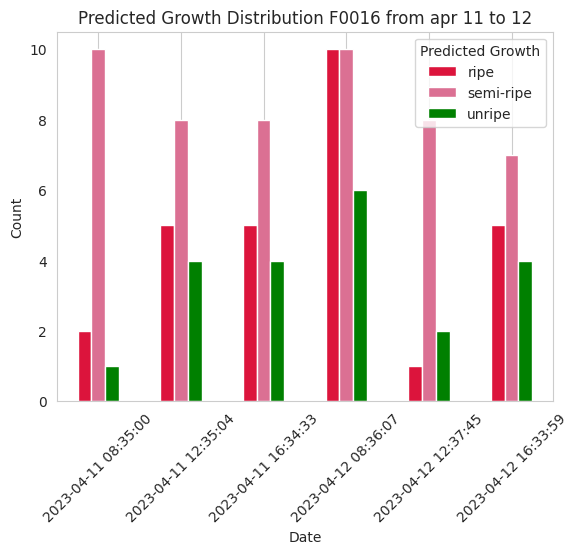

<Figure size 1200x600 with 0 Axes>

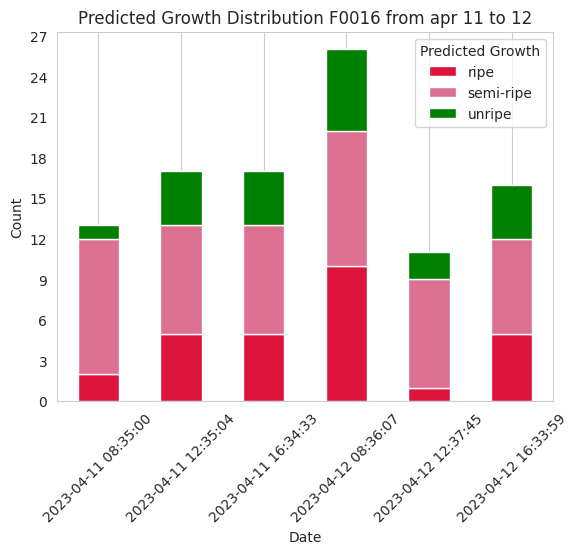

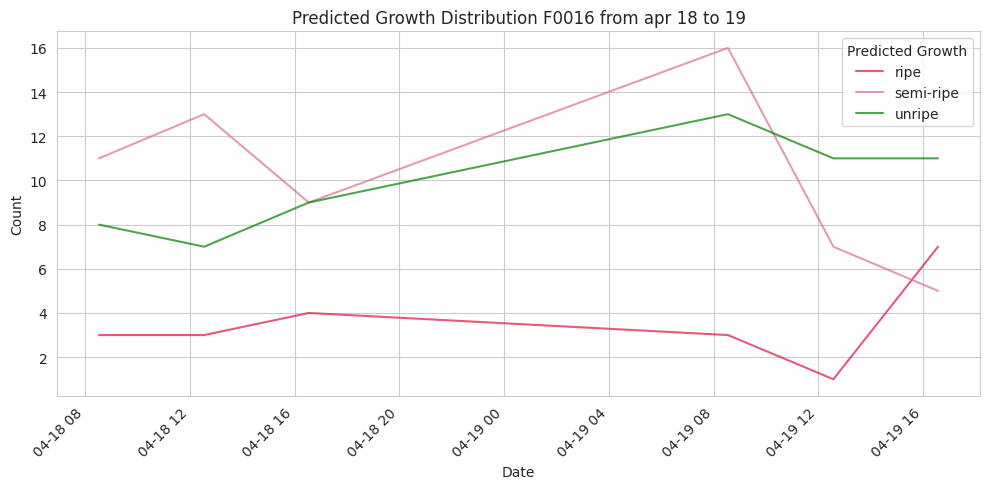

<Figure size 1200x600 with 0 Axes>

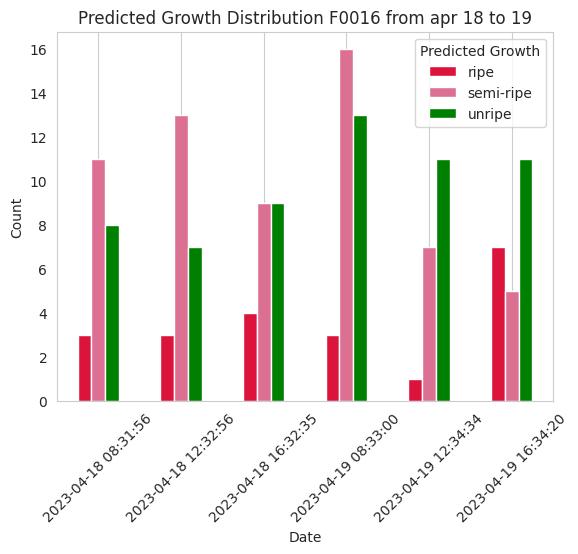

<Figure size 1200x600 with 0 Axes>

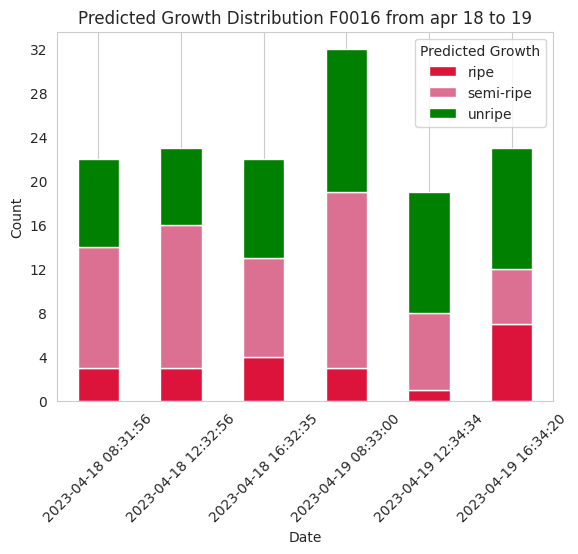

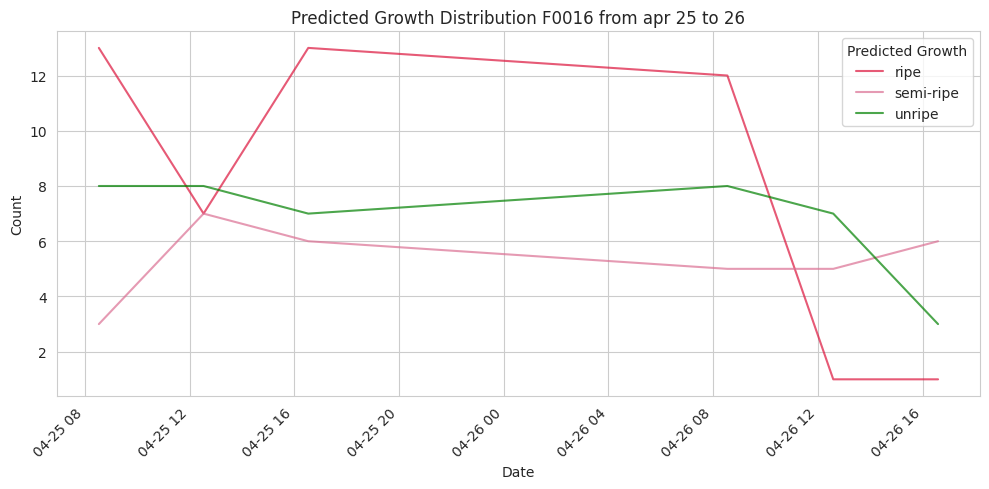

<Figure size 1200x600 with 0 Axes>

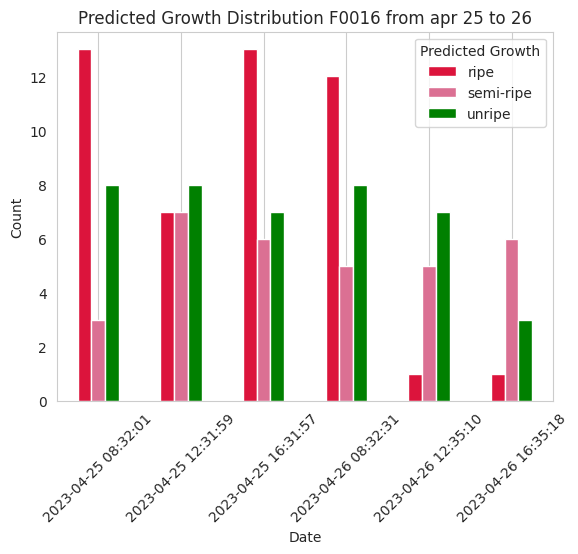

<Figure size 1200x600 with 0 Axes>

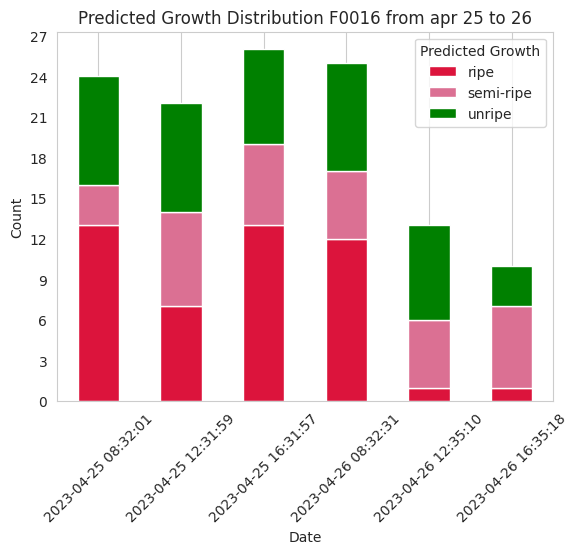

In [49]:
select_22_23_apr_1 = F0016_22_23_apr_data[(F0016_22_23_apr_data['shot_datetime'] >= '2023-04-03') & (F0016_22_23_apr_data['shot_datetime'] <= '2023-04-07')]
select_22_23_apr_2 = F0016_22_23_apr_data[(F0016_22_23_apr_data['shot_datetime'] >= '2023-04-11') & (F0016_22_23_apr_data['shot_datetime'] <= '2023-04-13')]
select_22_23_apr_3 = F0016_22_23_apr_data[(F0016_22_23_apr_data['shot_datetime'] >= '2023-04-18') & (F0016_22_23_apr_data['shot_datetime'] <= '2023-04-20')]
select_22_23_apr_4 = F0016_22_23_apr_data[(F0016_22_23_apr_data['shot_datetime'] >= '2023-04-25') & (F0016_22_23_apr_data['shot_datetime'] <= '2023-04-27')]

apr_22_23_1_counts = select_22_23_apr_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_22_23_2_counts = select_22_23_apr_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_22_23_3_counts = select_22_23_apr_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_22_23_4_counts = select_22_23_apr_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')


# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(apr_22_23_1_counts, 'Predicted Growth Distribution F0016 from apr 3 to 6'),
            (apr_22_23_2_counts, 'Predicted Growth Distribution F0016 from apr 11 to 12'),
            (apr_22_23_3_counts, 'Predicted Growth Distribution F0016 from apr 18 to 19'),
            (apr_22_23_4_counts, 'Predicted Growth Distribution F0016 from apr 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 22-23작기 5월 생산량 추이

/tmp/ipykernel_21186/101262644.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_22_23_may_data['shot_datetime'] = pd.to_datetime(F0016_22_23_may_data['shot_datetime'])


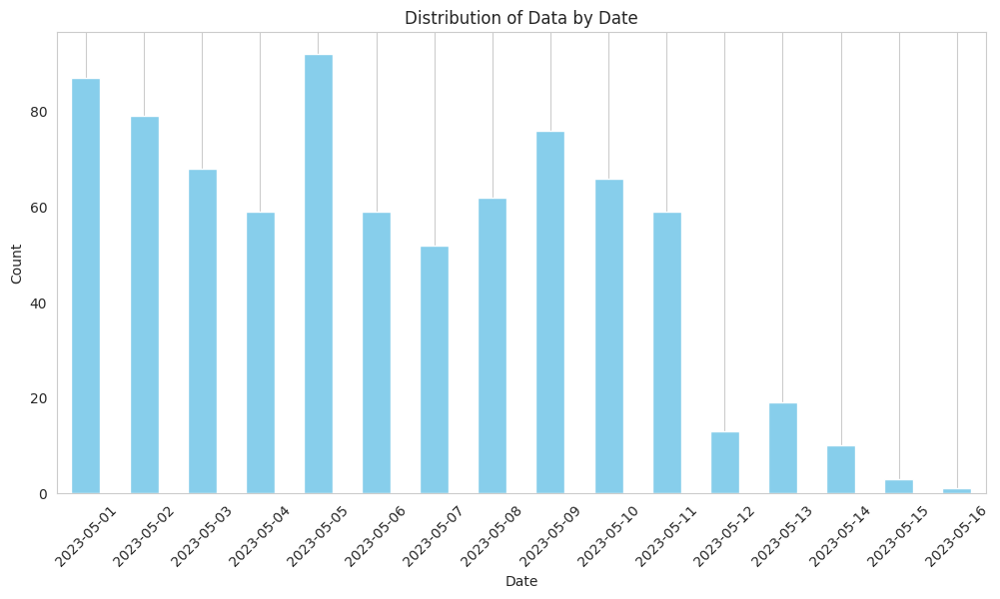

In [50]:
# F0016_22_23_may_data 생성
F0016_22_23_may_data = F0016_22_23[F0016_22_23['측정월'] == 5]
F0016_22_23_may_data['shot_datetime'] = pd.to_datetime(F0016_22_23_may_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_22_23_may_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

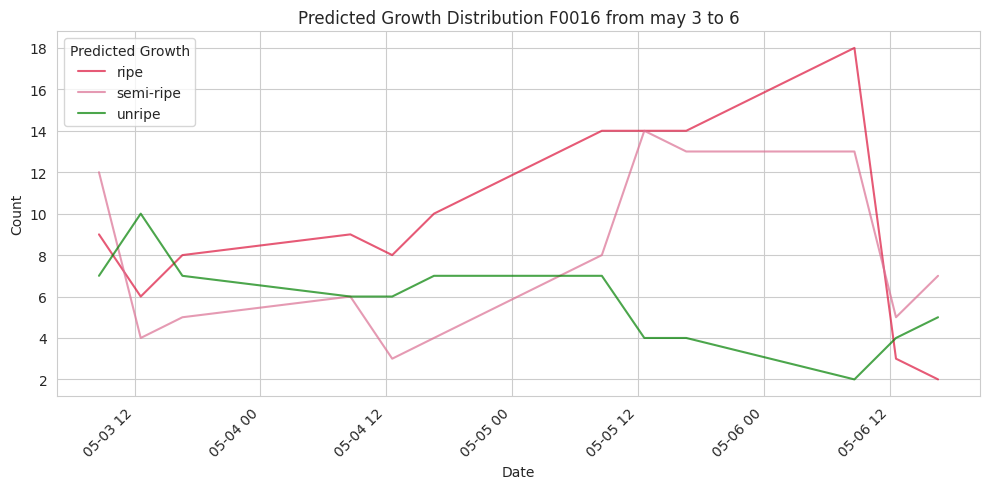

<Figure size 1200x600 with 0 Axes>

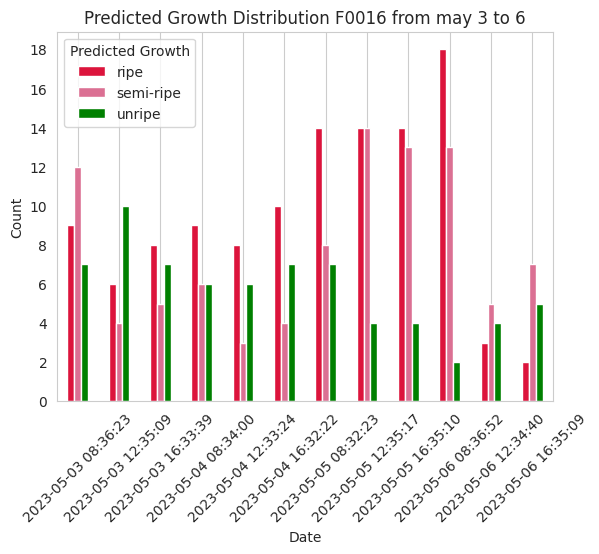

<Figure size 1200x600 with 0 Axes>

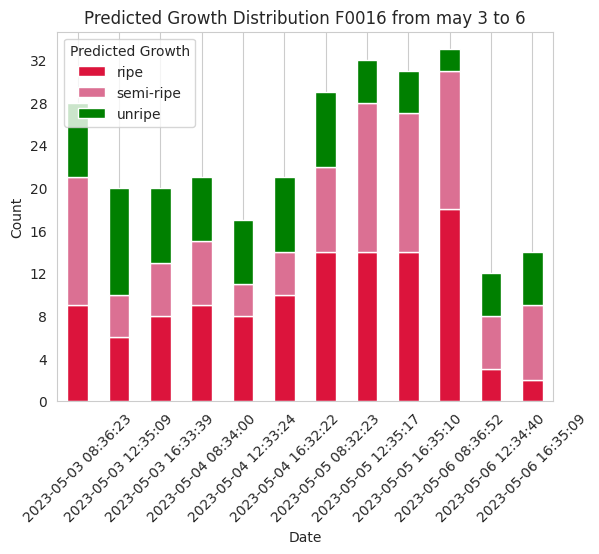

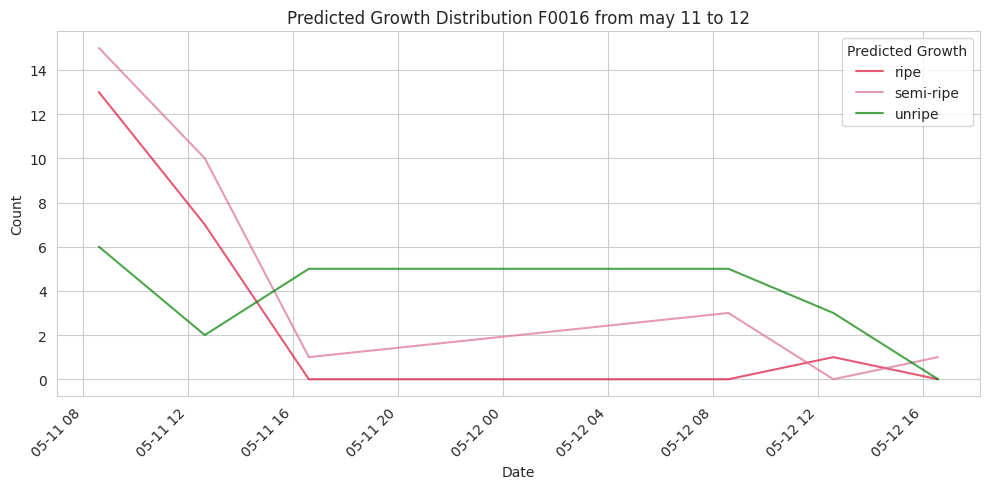

<Figure size 1200x600 with 0 Axes>

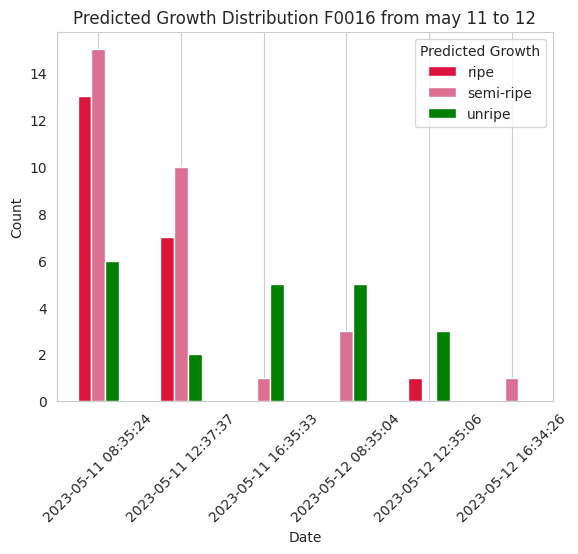

<Figure size 1200x600 with 0 Axes>

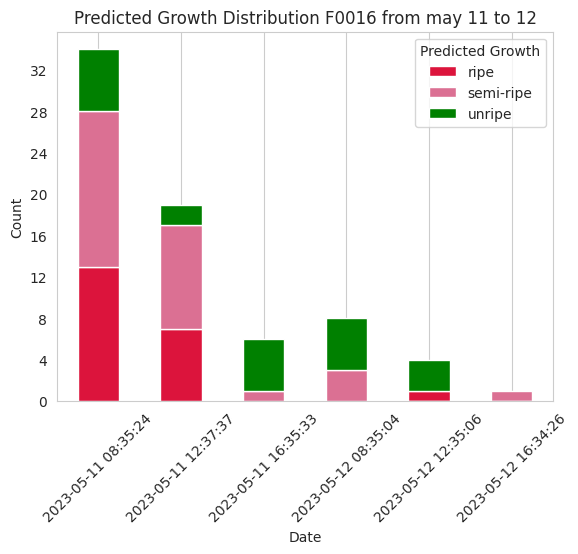

In [51]:
select_22_23_may_1 = F0016_22_23_may_data[(F0016_22_23_may_data['shot_datetime'] >= '2023-05-03') & (F0016_22_23_may_data['shot_datetime'] <= '2023-05-07')]
select_22_23_may_2 = F0016_22_23_may_data[(F0016_22_23_may_data['shot_datetime'] >= '2023-05-11') & (F0016_22_23_may_data['shot_datetime'] <= '2023-05-13')]


may_22_23_1_counts = select_22_23_may_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_22_23_2_counts = select_22_23_may_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)


# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')


# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(may_22_23_1_counts, 'Predicted Growth Distribution F0016 from may 3 to 6'),
            (may_22_23_2_counts, 'Predicted Growth Distribution F0016 from may 11 to 12')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


### F0016 23-24작기

In [52]:
#F0016 23-24작기 확인
F0016_23_24 = copy_data[(copy_data['farm_code'] == 'F0016') & (copy_data['check_datetime'] >= period_23_24[0]) & (copy_data['check_datetime']<= period_23_24[1])]
#작기 안에서 월별로 class 분포 확인
F0016_23_24_monthly = F0016_23_24.groupby([F0016_23_24['check_datetime'].dt.year.rename('year'), F0016_23_24['check_datetime'].dt.month, 'pred_growth']).size().reset_index(name='count')
F0016_23_24_monthly['check_datetime'] = F0016_23_24_monthly['year'].astype(str) + '-' + F0016_23_24_monthly['check_datetime'].astype(str)
F0016_23_24_monthly.drop(columns=['year'], inplace=True)
F0016_23_24_monthly

,check_datetime,pred_growth,count
0,2023-9,unripe,5
1,2023-10,unripe,1
2,2023-11,unripe,5
3,2023-12,ripe,71
4,2023-12,semi-ripe,401
5,2023-12,unripe,200
6,2024-1,ripe,248
7,2024-1,semi-ripe,1838
8,2024-1,unripe,606
9,2024-2,ripe,66


<function matplotlib.pyplot.show(close=None, block=None)>

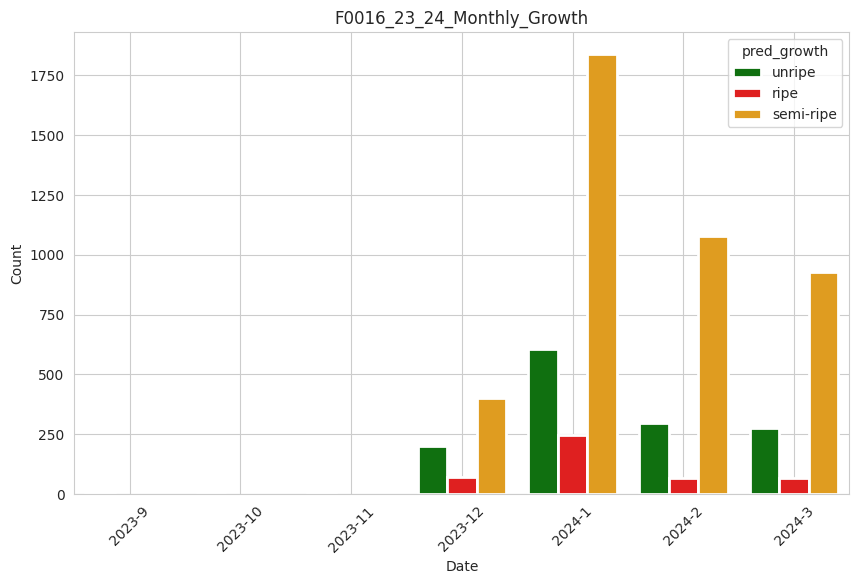

In [53]:
#graph로 확인
sns.set_style("whitegrid")

palette = {'unripe': 'green', 'semi-ripe': 'orange', 'ripe': 'red'}

plt.figure(figsize=(10, 6))
sns.barplot(data = F0016_23_24_monthly, x = 'check_datetime', y = 'count', hue = 'pred_growth', palette=palette ,  linewidth=2 )
plt.title('F0016_23_24_Monthly_Growth')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend(title='pred_growth')
plt.grid(True)
plt.xticks(rotation=45)
plt.show

#### F0016 23-24작기 12월 생산량 추이 

/tmp/ipykernel_21186/878790664.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_23_24_dec_data['shot_datetime'] = pd.to_datetime(F0016_23_24_dec_data['shot_datetime'])


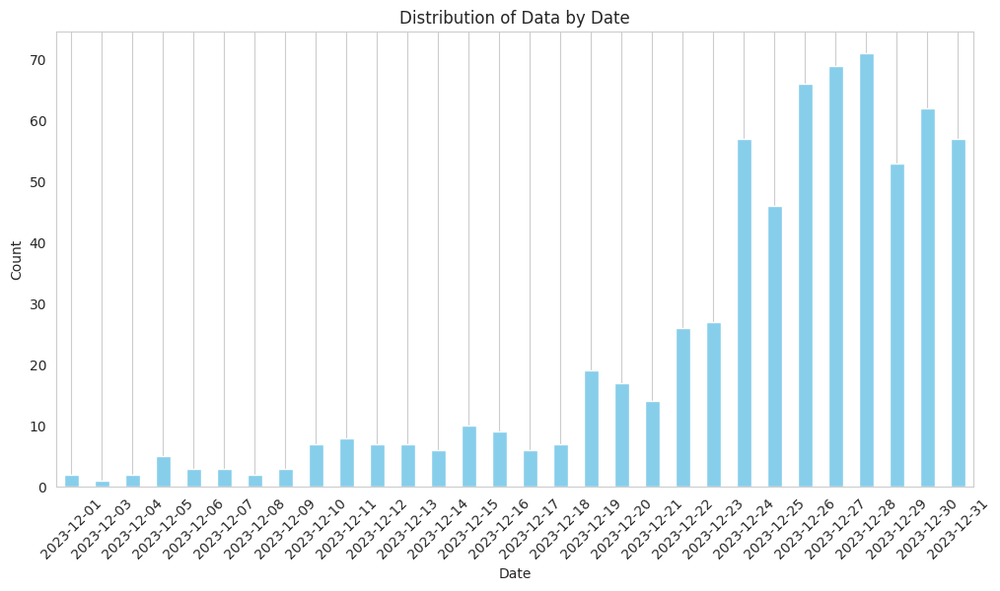

In [54]:
# F0016_23_24_dec_data 생성
F0016_23_24_dec_data = F0016_23_24[F0016_23_24['측정월'] == 12]
F0016_23_24_dec_data['shot_datetime'] = pd.to_datetime(F0016_23_24_dec_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_23_24_dec_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

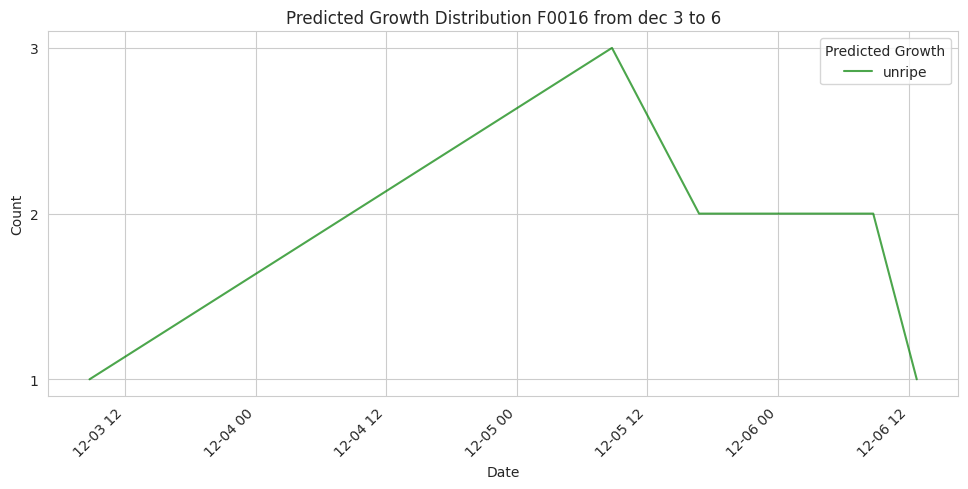

<Figure size 1200x600 with 0 Axes>

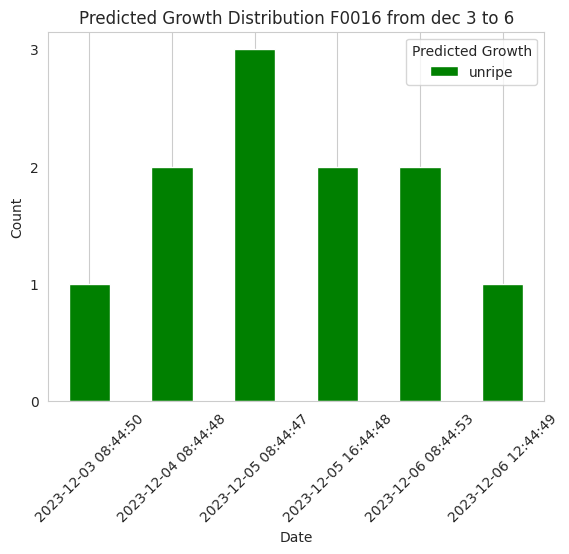

<Figure size 1200x600 with 0 Axes>

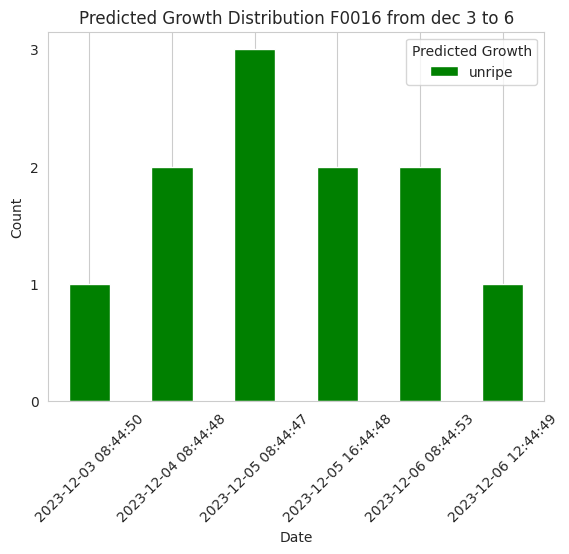

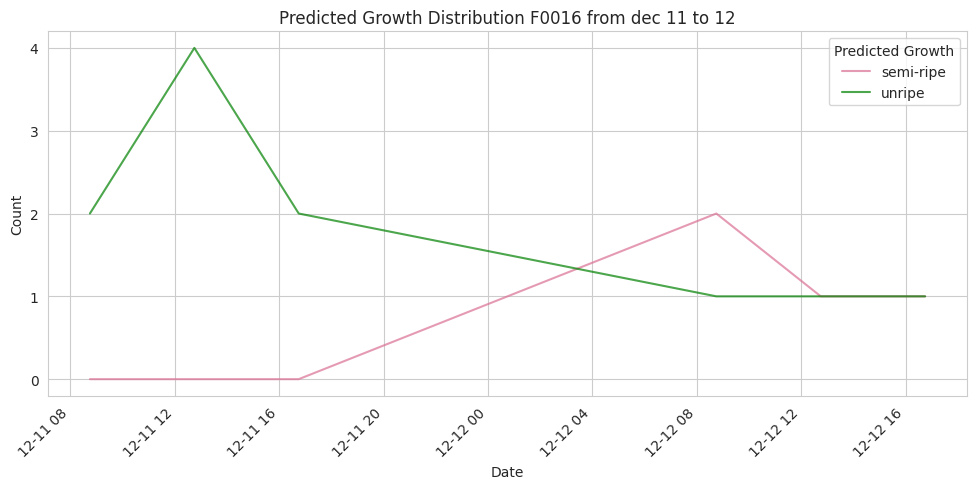

<Figure size 1200x600 with 0 Axes>

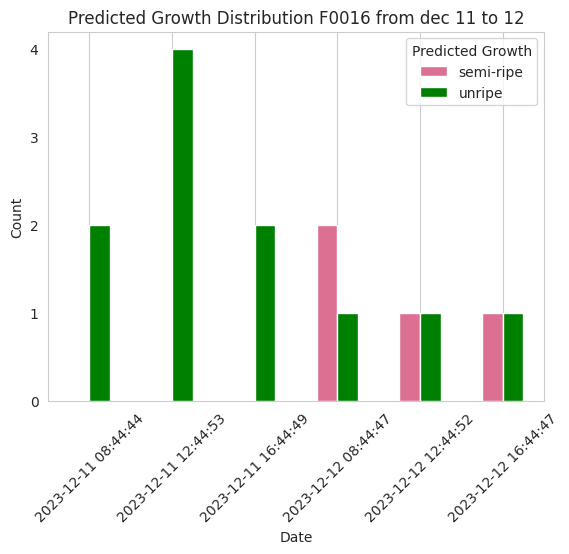

<Figure size 1200x600 with 0 Axes>

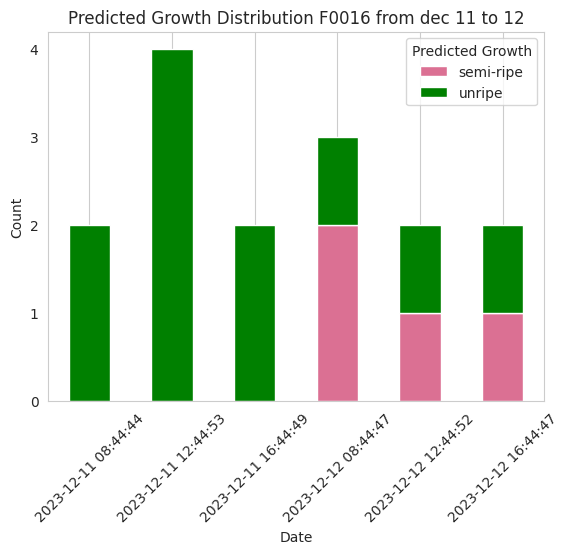

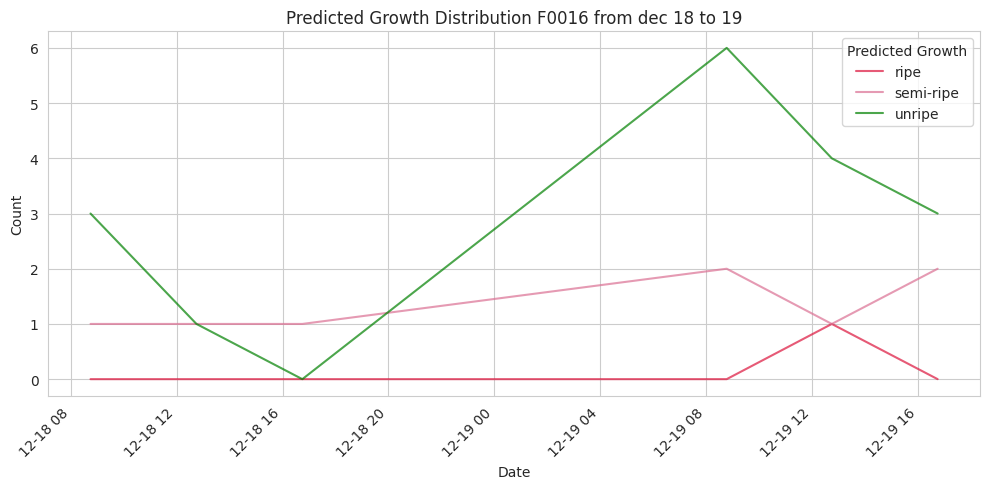

<Figure size 1200x600 with 0 Axes>

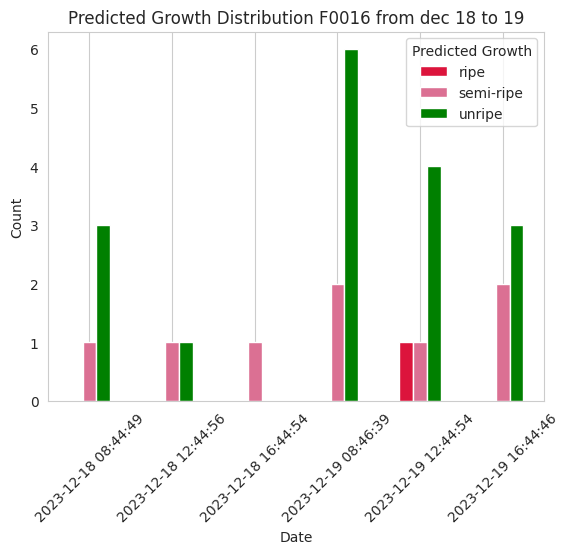

<Figure size 1200x600 with 0 Axes>

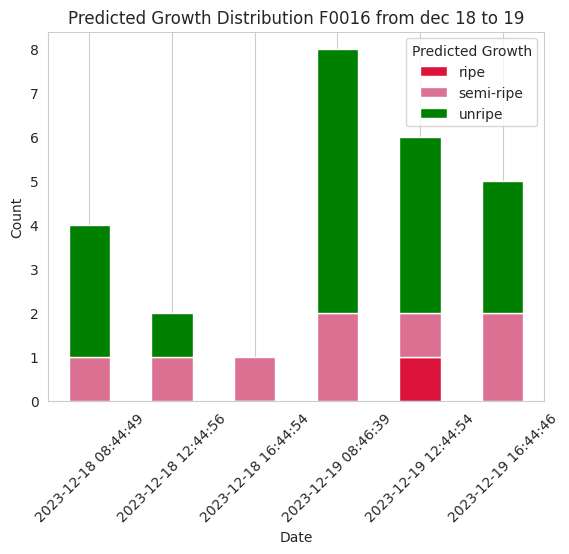

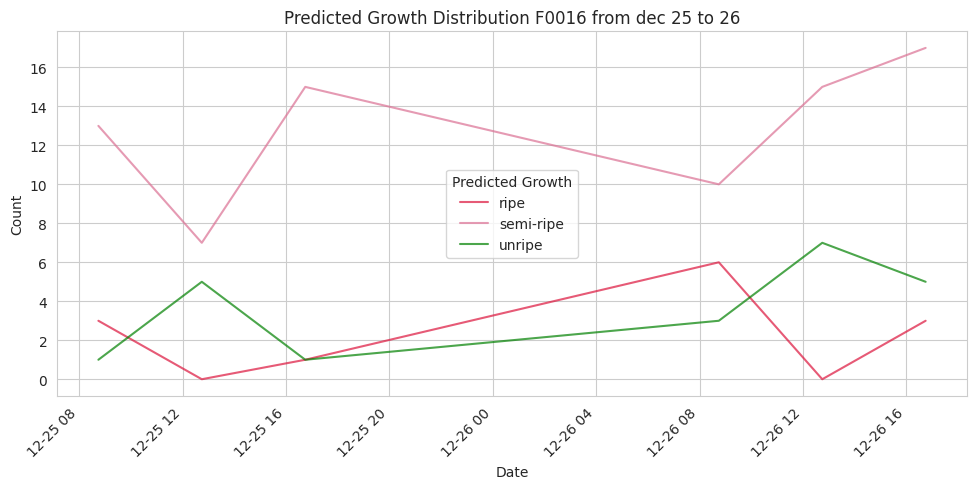

<Figure size 1200x600 with 0 Axes>

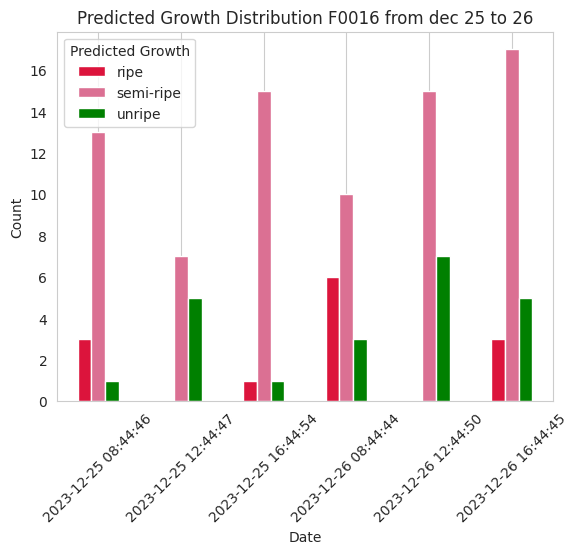

<Figure size 1200x600 with 0 Axes>

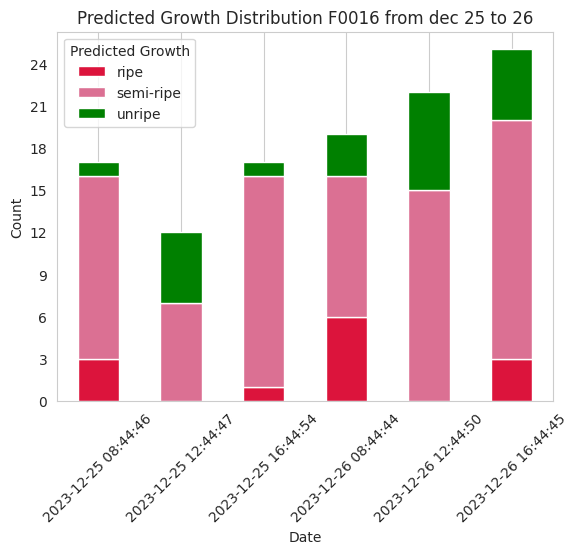

In [55]:
select_23_24_dec_1 = F0016_23_24_dec_data[(F0016_23_24_dec_data['shot_datetime'] >= '2023-12-03') & (F0016_23_24_dec_data['shot_datetime'] <= '2023-12-07')]
select_23_24_dec_2 = F0016_23_24_dec_data[(F0016_23_24_dec_data['shot_datetime'] >= '2023-12-11') & (F0016_23_24_dec_data['shot_datetime'] <= '2023-12-13')]
select_23_24_dec_3 = F0016_23_24_dec_data[(F0016_23_24_dec_data['shot_datetime'] >= '2023-12-18') & (F0016_23_24_dec_data['shot_datetime'] <= '2023-12-20')]
select_23_24_dec_4 = F0016_23_24_dec_data[(F0016_23_24_dec_data['shot_datetime'] >= '2023-12-25') & (F0016_23_24_dec_data['shot_datetime'] <= '2023-12-27')]

dec_23_24_1_counts = select_23_24_dec_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_23_24_2_counts = select_23_24_dec_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_23_24_3_counts = select_23_24_dec_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_23_24_4_counts = select_23_24_dec_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(dec_23_24_1_counts, 'Predicted Growth Distribution F0016 from dec 3 to 6'),
            (dec_23_24_2_counts, 'Predicted Growth Distribution F0016 from dec 11 to 12'),
            (dec_23_24_3_counts, 'Predicted Growth Distribution F0016 from dec 18 to 19'),
            (dec_23_24_4_counts, 'Predicted Growth Distribution F0016 from dec 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0016 23-24작기 1월 생산량 추이

/tmp/ipykernel_21186/2276117733.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_23_24_jan_data['shot_datetime'] = pd.to_datetime(F0016_23_24_jan_data['shot_datetime'])


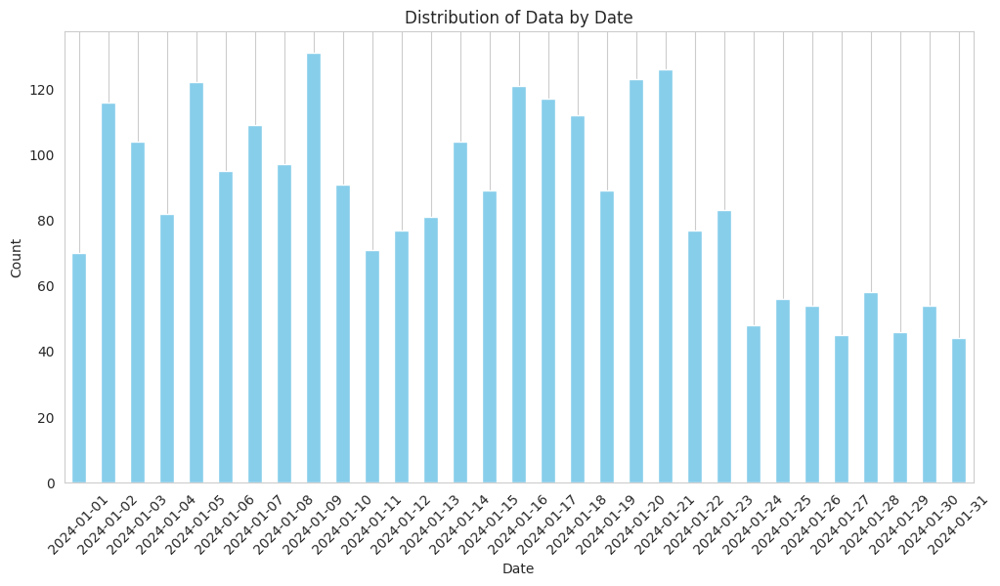

In [56]:
# F0016_23_24_jan_data 생성
F0016_23_24_jan_data = F0016_23_24[F0016_23_24['측정월'] == 1]
F0016_23_24_jan_data['shot_datetime'] = pd.to_datetime(F0016_23_24_jan_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_23_24_jan_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

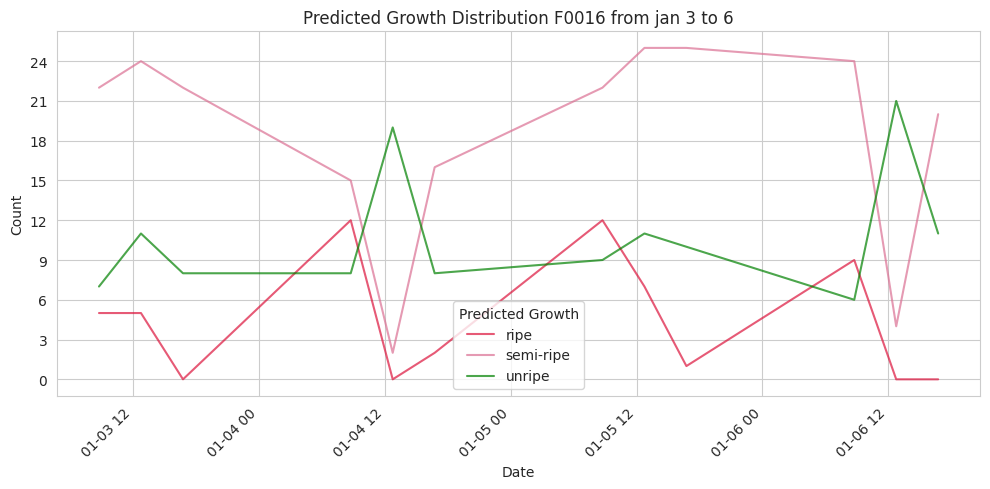

<Figure size 1200x600 with 0 Axes>

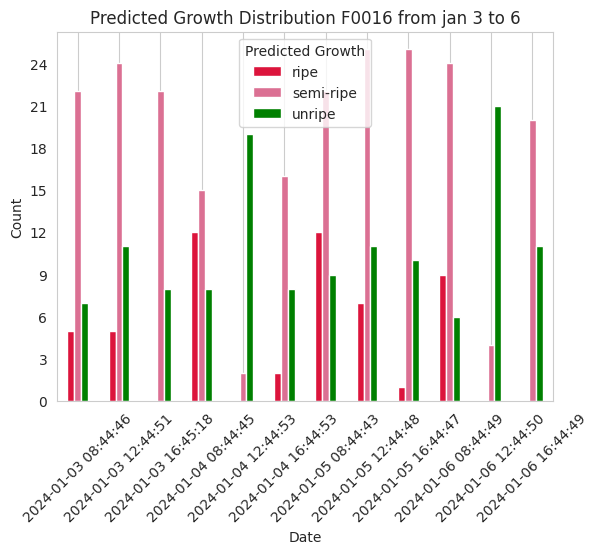

<Figure size 1200x600 with 0 Axes>

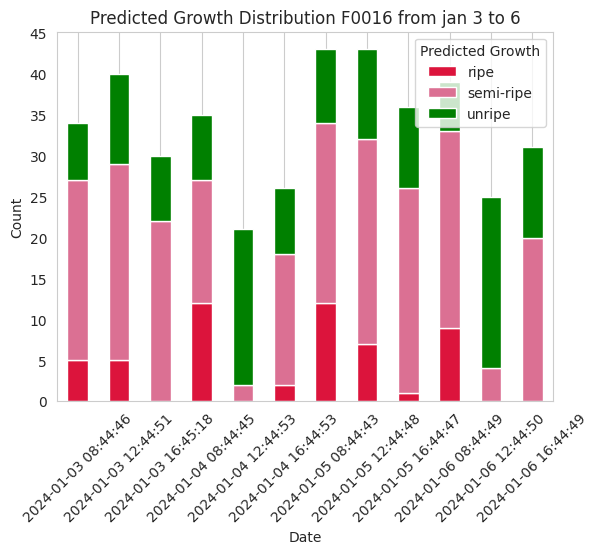

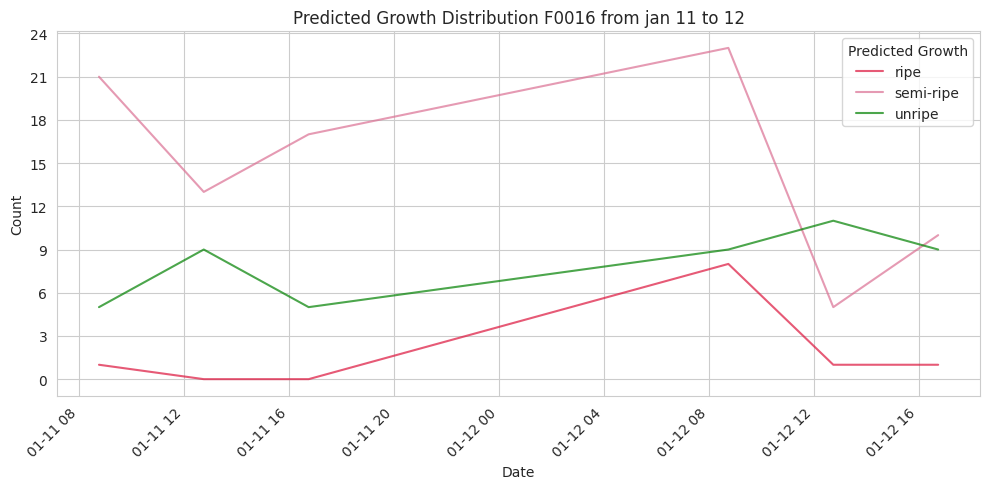

<Figure size 1200x600 with 0 Axes>

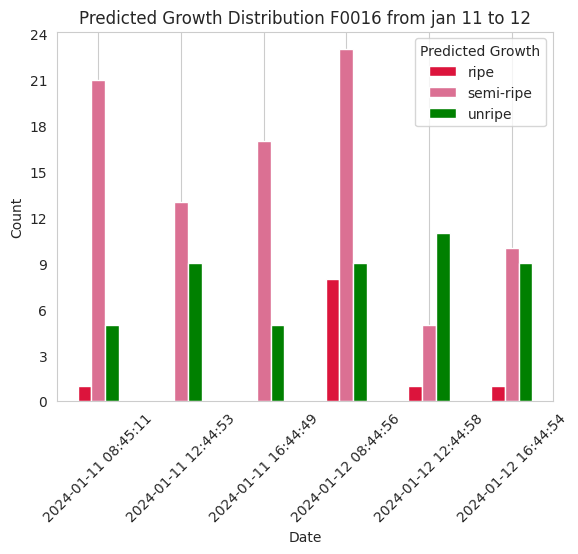

<Figure size 1200x600 with 0 Axes>

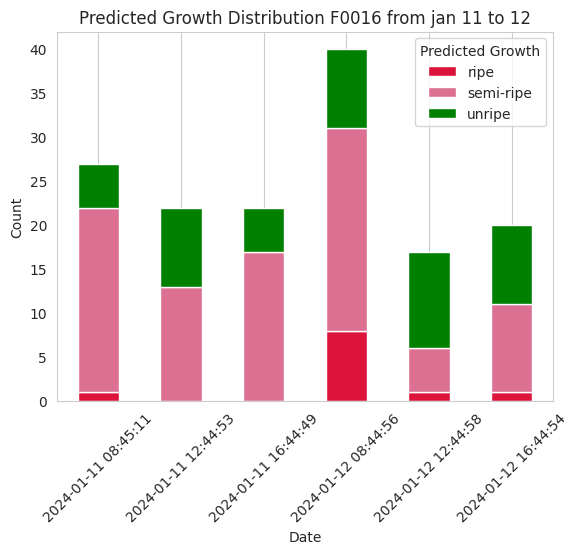

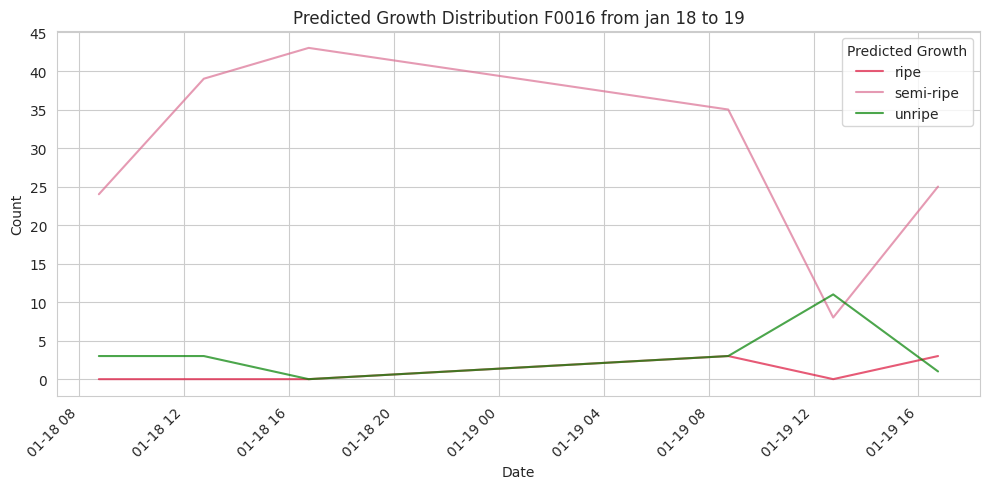

<Figure size 1200x600 with 0 Axes>

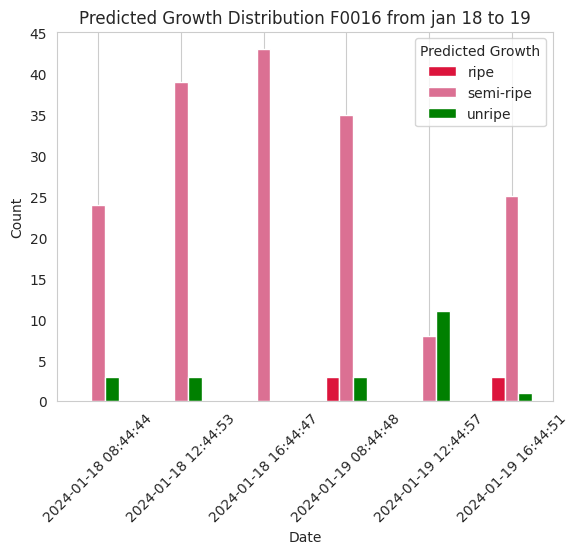

<Figure size 1200x600 with 0 Axes>

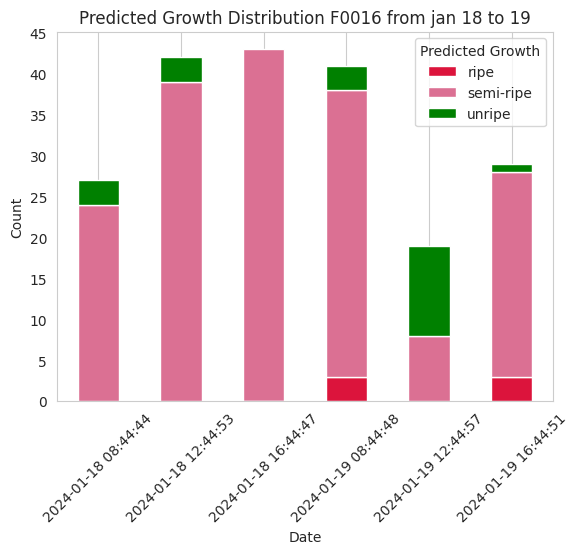

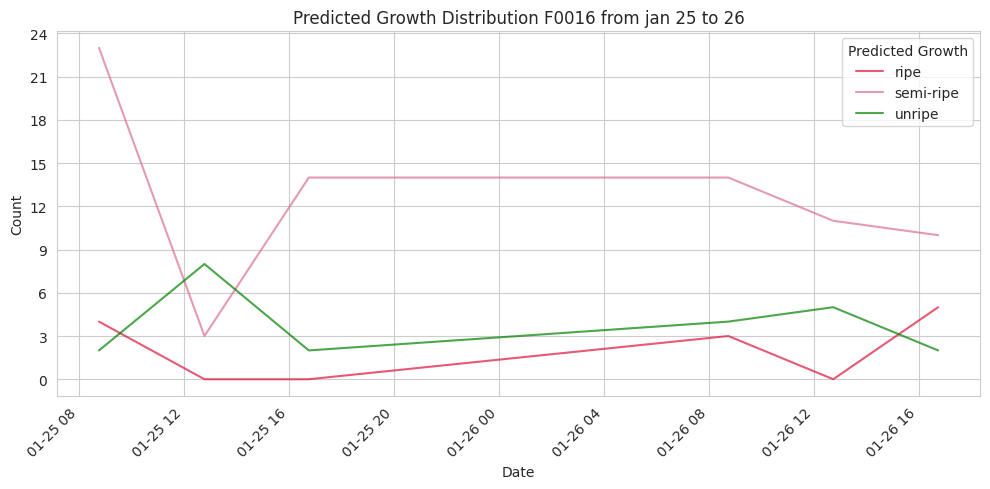

<Figure size 1200x600 with 0 Axes>

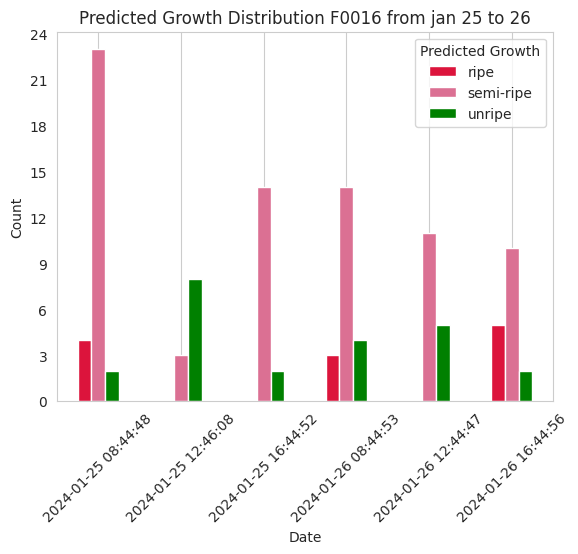

<Figure size 1200x600 with 0 Axes>

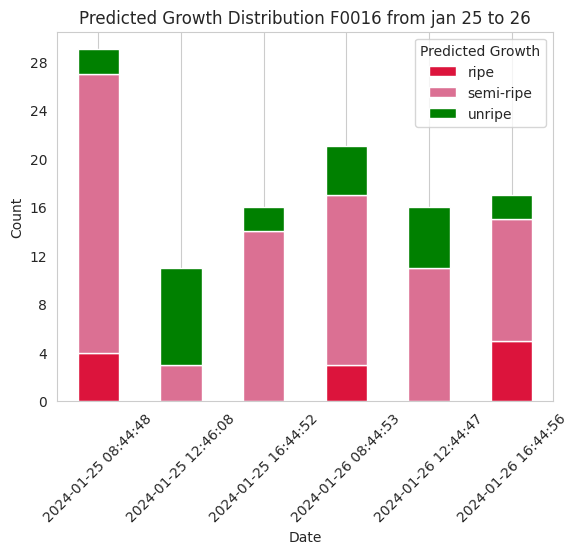

In [58]:
select_23_24_jan_1 = F0016_23_24_jan_data[(F0016_23_24_jan_data['shot_datetime'] >= '2024-01-03') & (F0016_23_24_jan_data['shot_datetime'] <= '2024-01-07')]
select_23_24_jan_2 = F0016_23_24_jan_data[(F0016_23_24_jan_data['shot_datetime'] >= '2024-01-11') & (F0016_23_24_jan_data['shot_datetime'] <= '2024-01-13')]
select_23_24_jan_3 = F0016_23_24_jan_data[(F0016_23_24_jan_data['shot_datetime'] >= '2024-01-18') & (F0016_23_24_jan_data['shot_datetime'] <= '2024-01-20')]
select_23_24_jan_4 = F0016_23_24_jan_data[(F0016_23_24_jan_data['shot_datetime'] >= '2024-01-25') & (F0016_23_24_jan_data['shot_datetime'] <= '2024-01-27')]

jan_23_24_1_counts = select_23_24_jan_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_23_24_2_counts = select_23_24_jan_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_23_24_3_counts = select_23_24_jan_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_23_24_4_counts = select_23_24_jan_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(jan_23_24_1_counts, 'Predicted Growth Distribution F0016 from jan 3 to 6'),
            (jan_23_24_2_counts, 'Predicted Growth Distribution F0016 from jan 11 to 12'),
            (jan_23_24_3_counts, 'Predicted Growth Distribution F0016 from jan 18 to 19'),
            (jan_23_24_4_counts, 'Predicted Growth Distribution F0016 from jan 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 23-24작기 2월 생산량 추이

/tmp/ipykernel_21186/471245896.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_23_24_feb_data['shot_datetime'] = pd.to_datetime(F0016_23_24_feb_data['shot_datetime'])


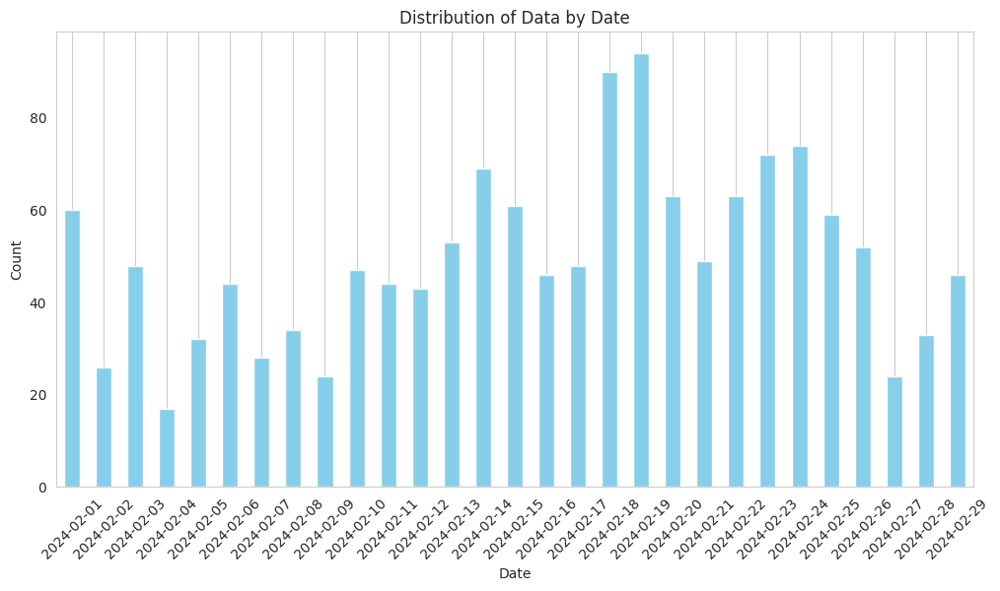

In [62]:
# F0016_23_24_feb_data 생성
F0016_23_24_feb_data = F0016_23_24[F0016_23_24['측정월'] == 2]
F0016_23_24_feb_data['shot_datetime'] = pd.to_datetime(F0016_23_24_feb_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_23_24_feb_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

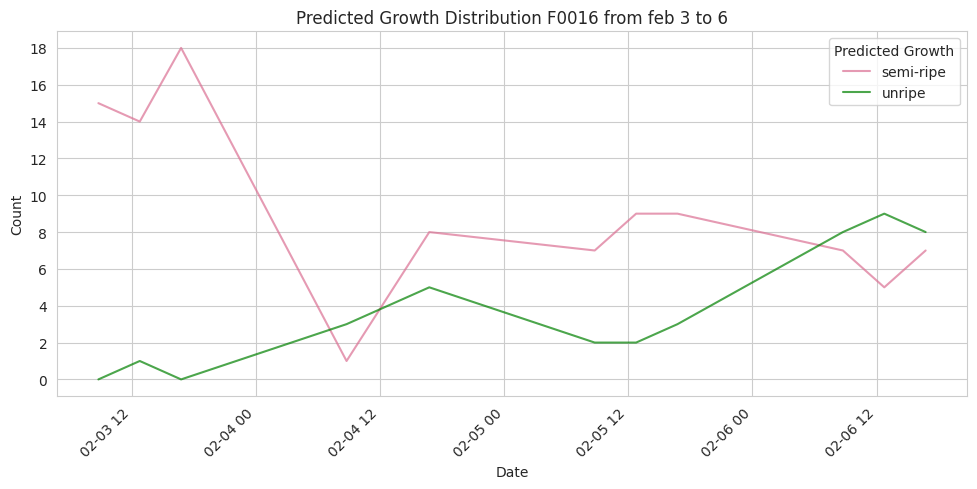

<Figure size 1200x600 with 0 Axes>

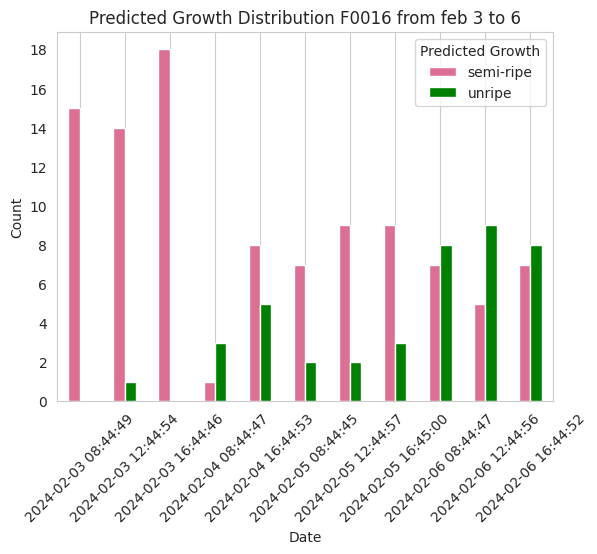

<Figure size 1200x600 with 0 Axes>

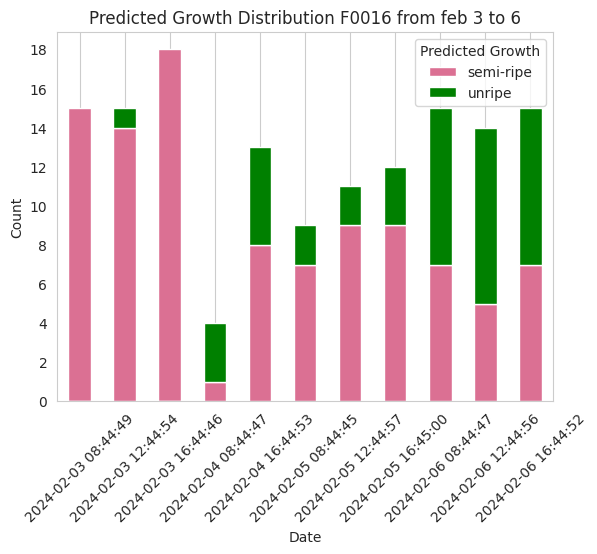

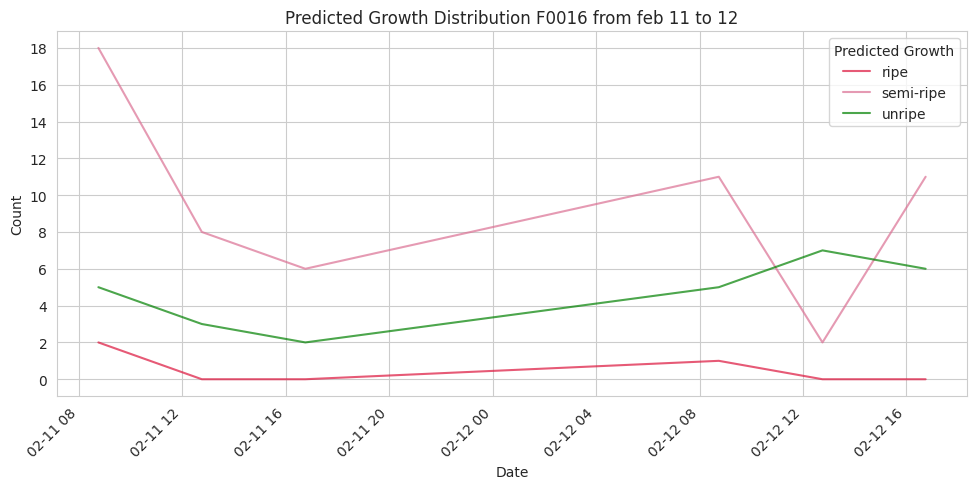

<Figure size 1200x600 with 0 Axes>

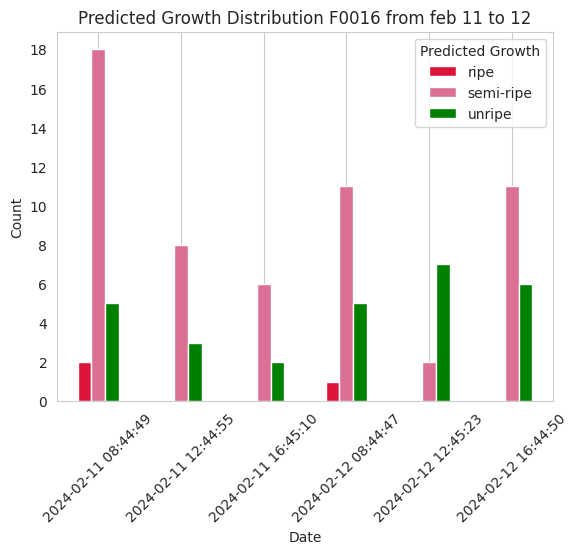

<Figure size 1200x600 with 0 Axes>

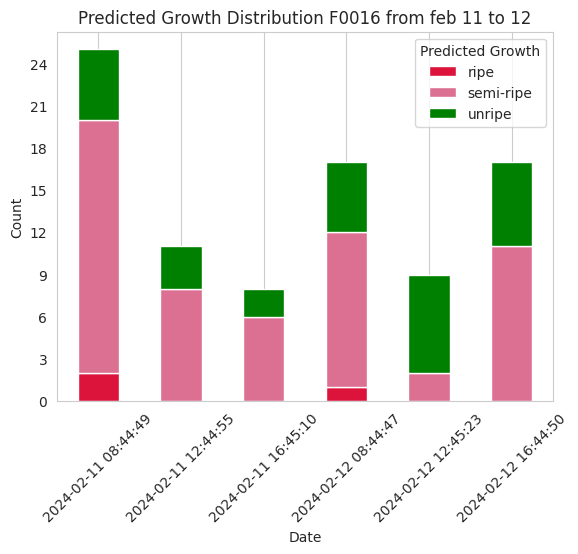

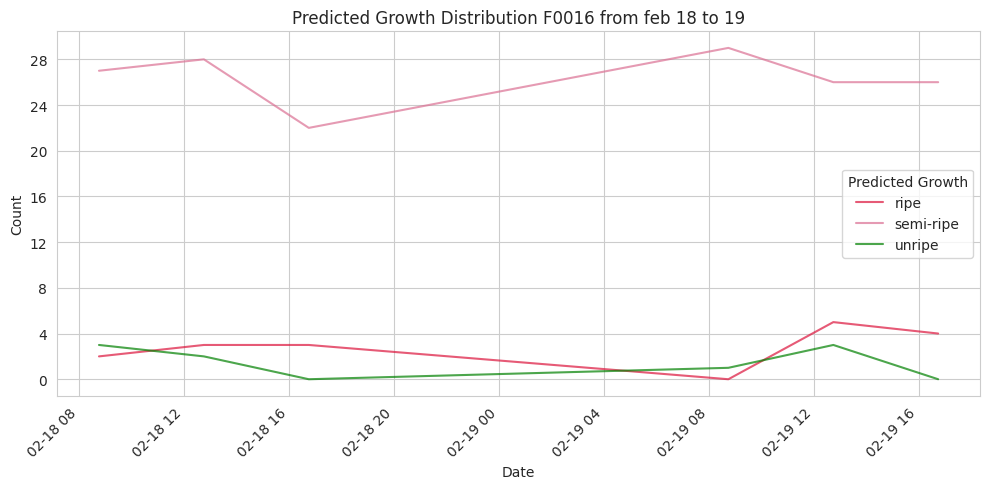

<Figure size 1200x600 with 0 Axes>

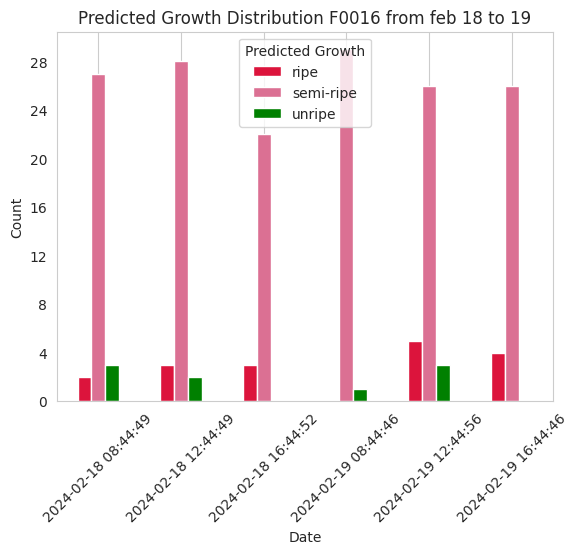

<Figure size 1200x600 with 0 Axes>

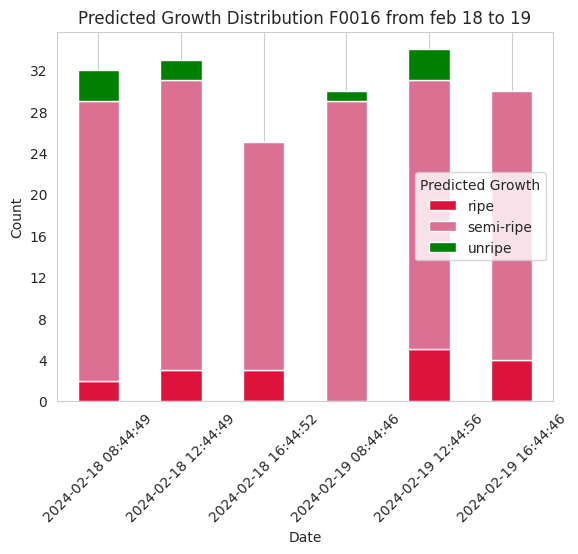

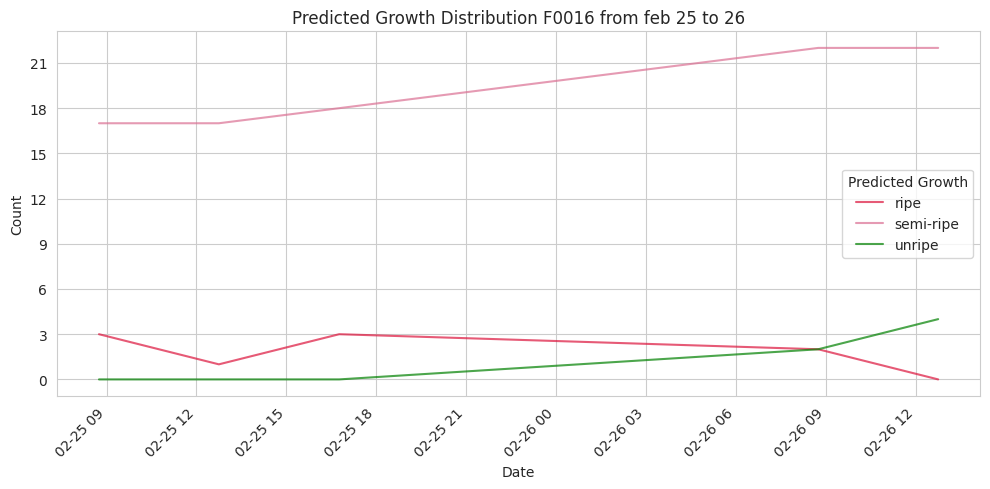

<Figure size 1200x600 with 0 Axes>

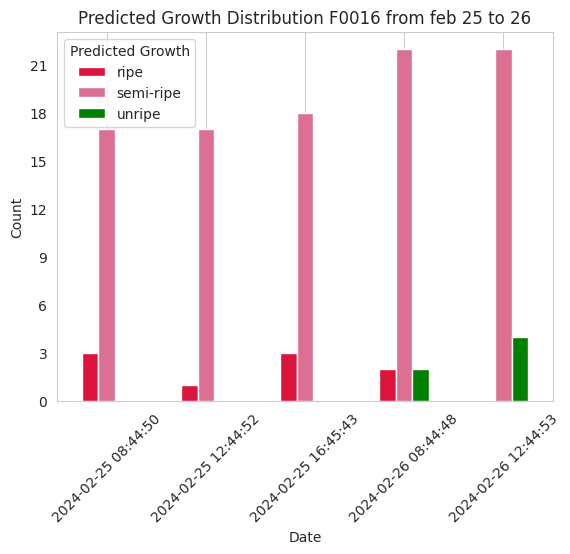

<Figure size 1200x600 with 0 Axes>

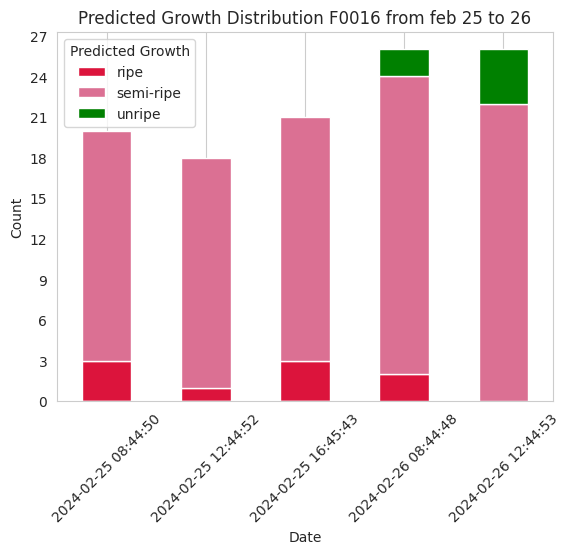

In [61]:
select_23_24_feb_1 = F0016_23_24_feb_data[(F0016_23_24_feb_data['shot_datetime'] >= '2024-02-03') & (F0016_23_24_feb_data['shot_datetime'] <= '2024-02-07')]
select_23_24_feb_2 = F0016_23_24_feb_data[(F0016_23_24_feb_data['shot_datetime'] >= '2024-02-11') & (F0016_23_24_feb_data['shot_datetime'] <= '2024-02-13')]
select_23_24_feb_3 = F0016_23_24_feb_data[(F0016_23_24_feb_data['shot_datetime'] >= '2024-02-18') & (F0016_23_24_feb_data['shot_datetime'] <= '2024-02-20')]
select_23_24_feb_4 = F0016_23_24_feb_data[(F0016_23_24_feb_data['shot_datetime'] >= '2024-02-25') & (F0016_23_24_feb_data['shot_datetime'] <= '2024-02-27')]

feb_23_24_1_counts = select_23_24_feb_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_23_24_2_counts = select_23_24_feb_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_23_24_3_counts = select_23_24_feb_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_23_24_4_counts = select_23_24_feb_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(feb_23_24_1_counts, 'Predicted Growth Distribution F0016 from feb 3 to 6'),
            (feb_23_24_2_counts, 'Predicted Growth Distribution F0016 from feb 11 to 12'),
            (feb_23_24_3_counts, 'Predicted Growth Distribution F0016 from feb 18 to 19'),
            (feb_23_24_4_counts, 'Predicted Growth Distribution F0016 from feb 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0016 23-24작기 3월 생산량 추이

/tmp/ipykernel_21186/2025604508.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0016_23_24_mar_data['shot_datetime'] = pd.to_datetime(F0016_23_24_mar_data['shot_datetime'])


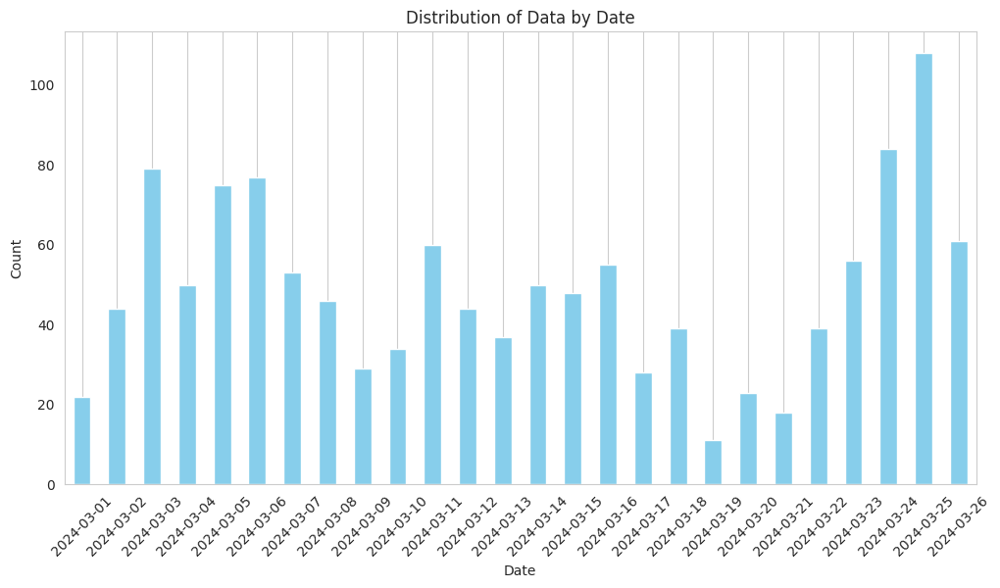

In [64]:
# F0016_23_24_mar_data 생성
F0016_23_24_mar_data = F0016_23_24[F0016_23_24['측정월'] == 3]
F0016_23_24_mar_data['shot_datetime'] = pd.to_datetime(F0016_23_24_mar_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0016_23_24_mar_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

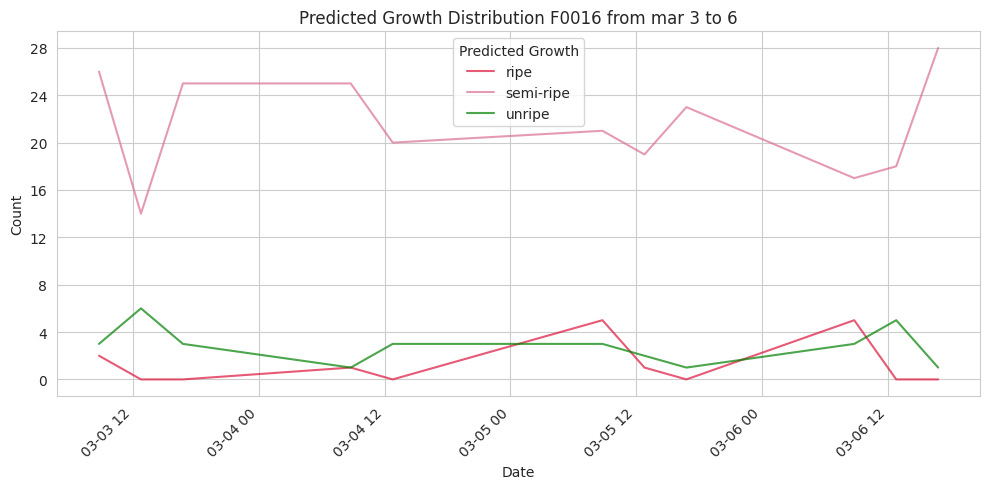

<Figure size 1200x600 with 0 Axes>

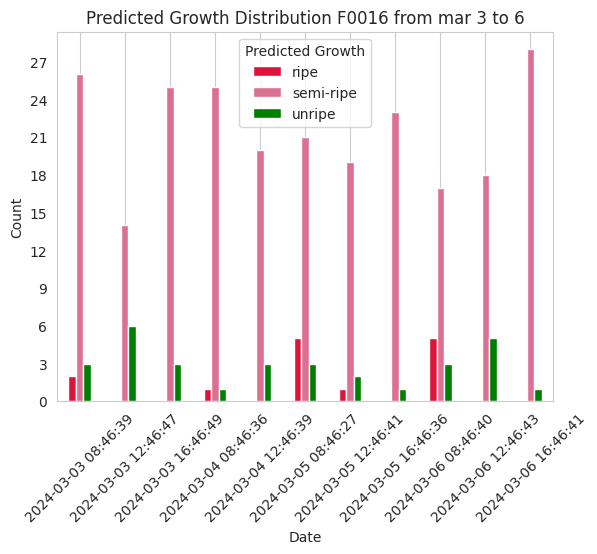

<Figure size 1200x600 with 0 Axes>

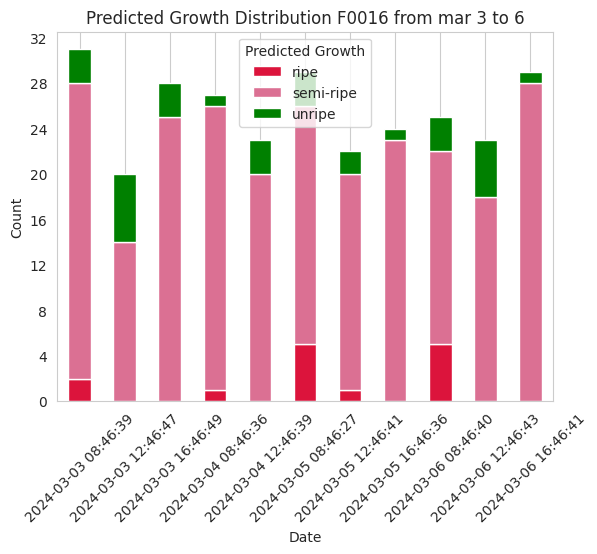

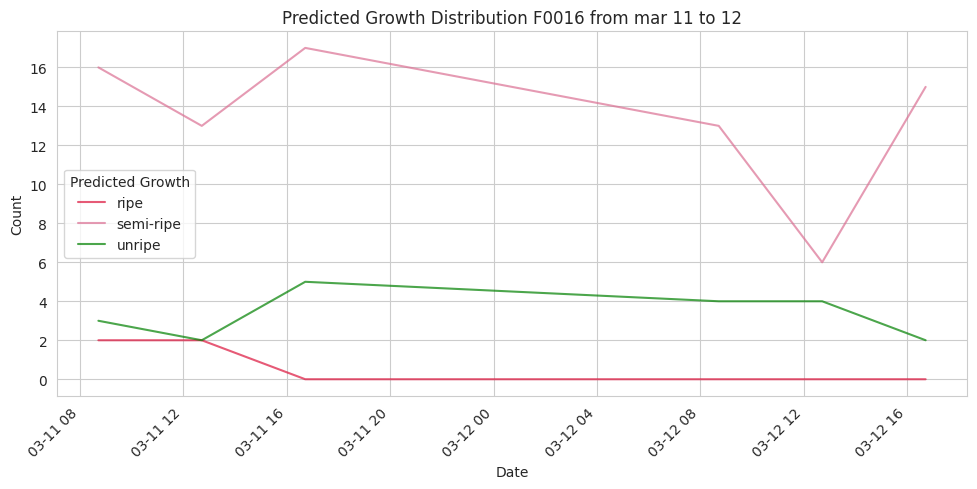

<Figure size 1200x600 with 0 Axes>

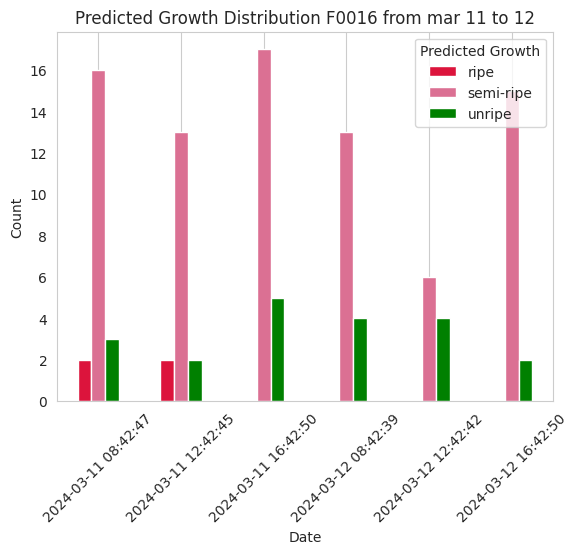

<Figure size 1200x600 with 0 Axes>

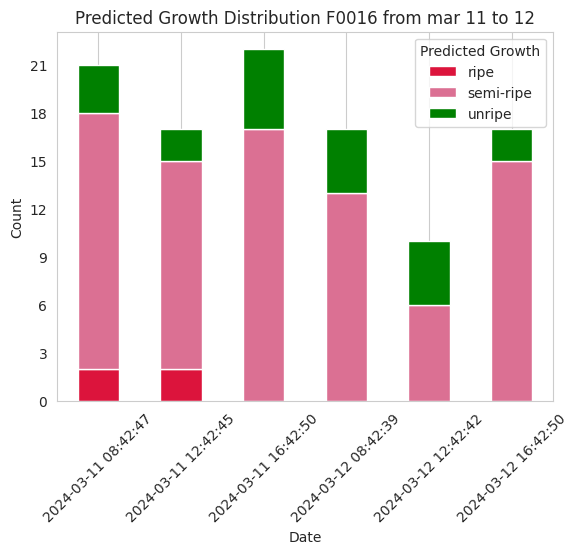

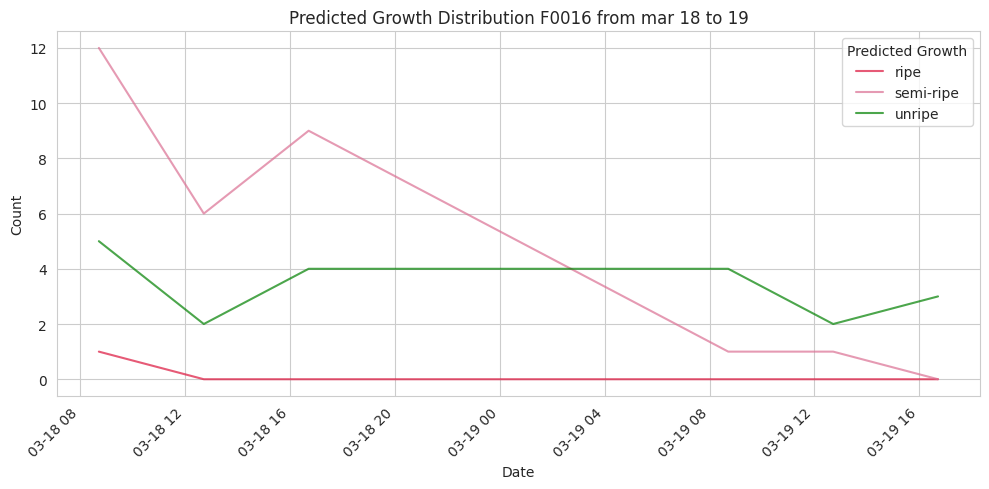

<Figure size 1200x600 with 0 Axes>

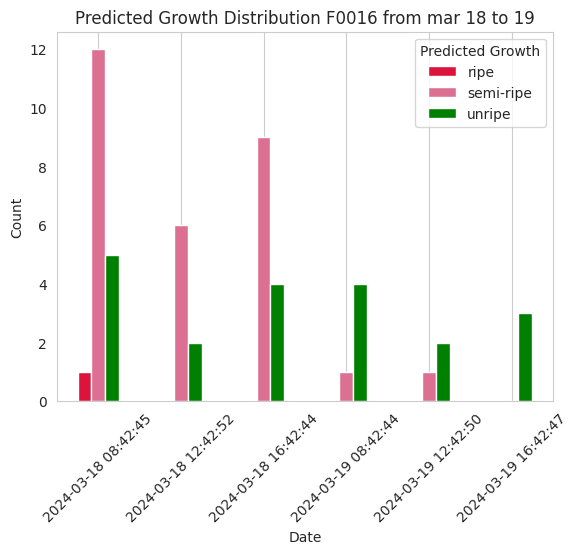

<Figure size 1200x600 with 0 Axes>

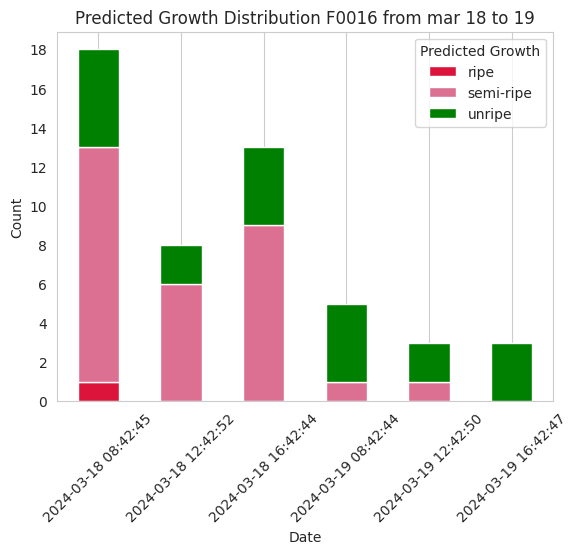

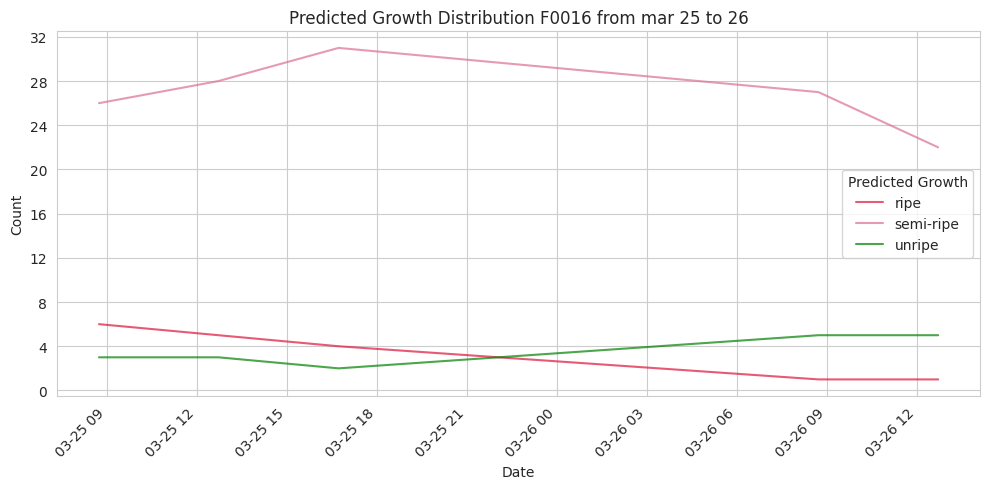

<Figure size 1200x600 with 0 Axes>

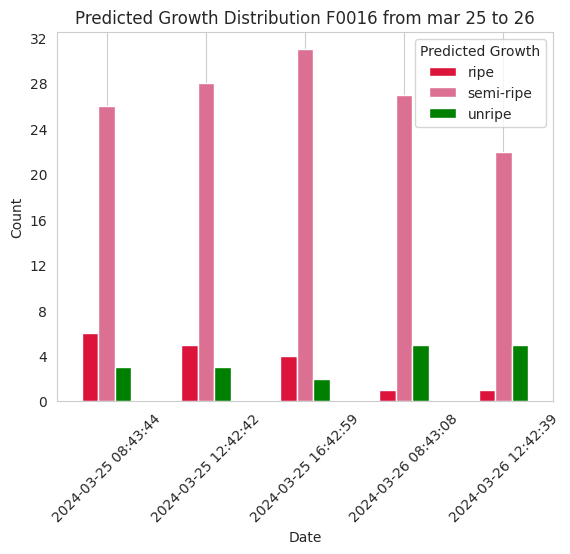

<Figure size 1200x600 with 0 Axes>

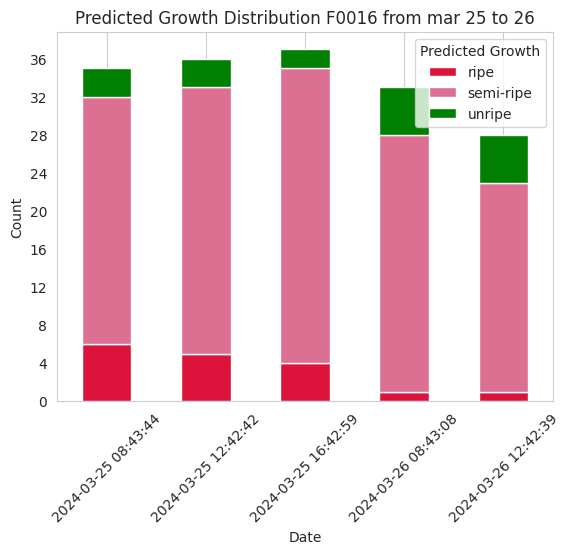

In [65]:
select_23_24_mar_1 = F0016_23_24_mar_data[(F0016_23_24_mar_data['shot_datetime'] >= '2024-03-03') & (F0016_23_24_mar_data['shot_datetime'] <= '2024-03-07')]
select_23_24_mar_2 = F0016_23_24_mar_data[(F0016_23_24_mar_data['shot_datetime'] >= '2024-03-11') & (F0016_23_24_mar_data['shot_datetime'] <= '2024-03-13')]
select_23_24_mar_3 = F0016_23_24_mar_data[(F0016_23_24_mar_data['shot_datetime'] >= '2024-03-18') & (F0016_23_24_mar_data['shot_datetime'] <= '2024-03-20')]
select_23_24_mar_4 = F0016_23_24_mar_data[(F0016_23_24_mar_data['shot_datetime'] >= '2024-03-25') & (F0016_23_24_mar_data['shot_datetime'] <= '2024-03-27')]

mar_23_24_1_counts = select_23_24_mar_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_23_24_2_counts = select_23_24_mar_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_23_24_3_counts = select_23_24_mar_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_23_24_4_counts = select_23_24_mar_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# plot_growth_distribution 함수 정의
# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(mar_23_24_1_counts, 'Predicted Growth Distribution F0016 from mar 3 to 6'),
            (mar_23_24_2_counts, 'Predicted Growth Distribution F0016 from mar 11 to 12'),
            (mar_23_24_3_counts, 'Predicted Growth Distribution F0016 from mar 18 to 19'),
            (mar_23_24_4_counts, 'Predicted Growth Distribution F0016 from mar 25 to 26')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)



## F0017 작기별 성장 분포

### F0017 21-22 작기별 확인

In [66]:
F0017_21_22 = copy_data[(copy_data['farm_code'] == 'F0017') & (copy_data['check_datetime'] >= period_21_22[0]) & (copy_data['check_datetime']<= period_21_22[1])]
#작기 안에서 월별로 class 분포 확인
F0017_21_22_monthly = F0017_21_22.groupby([F0017_21_22['check_datetime'].dt.year.rename('year'), F0017_21_22['check_datetime'].dt.month, 'pred_growth']).size().reset_index(name='count')
F0017_21_22_monthly['check_datetime'] = F0017_21_22_monthly['year'].astype(str) + '-' + F0017_21_22_monthly['check_datetime'].astype(str)
F0017_21_22_monthly.drop(columns=['year'], inplace=True)
F0017_21_22_monthly


,check_datetime,pred_growth,count
0,2021-9,semi-ripe,6
1,2021-9,unripe,46
2,2021-10,ripe,4
3,2021-10,semi-ripe,1
4,2021-10,unripe,90
5,2021-11,ripe,78
6,2021-11,semi-ripe,88
7,2021-11,unripe,686
8,2021-12,ripe,794
9,2021-12,semi-ripe,1045


<function matplotlib.pyplot.show(close=None, block=None)>

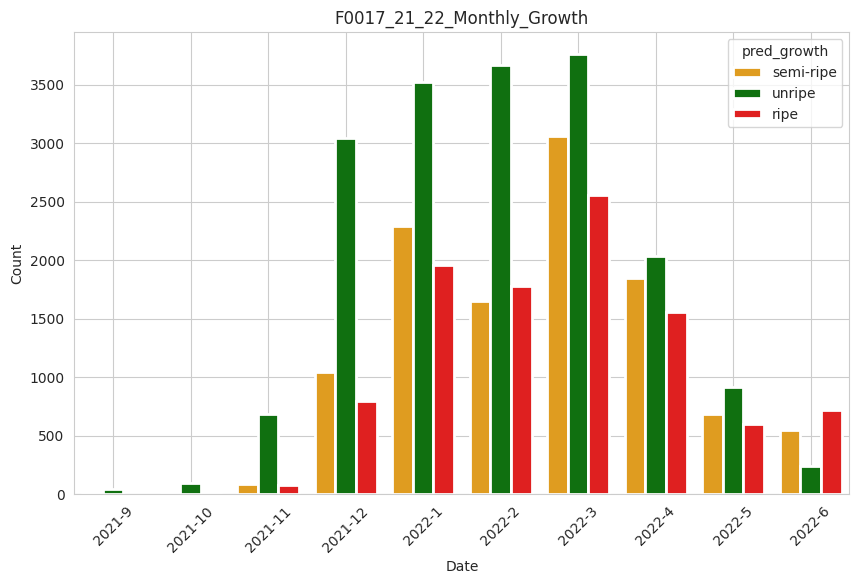

In [67]:
#graph로 확인
sns.set_style("whitegrid")

palette = {'unripe': 'green', 'semi-ripe': 'orange', 'ripe': 'red'}

plt.figure(figsize=(10, 6))
sns.barplot(data = F0017_21_22_monthly, x = 'check_datetime', y = 'count', hue = 'pred_growth', palette=palette ,  linewidth=2 )
plt.title('F0017_21_22_Monthly_Growth')
plt.xlabel('Date')
plt.ylabel('Count')
plt.legend(title='pred_growth')
plt.grid(True)
plt.xticks(rotation=45)
plt.show

#### F0017 21-22작기 10월 성장량 추이

/tmp/ipykernel_21186/3222405310.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_oct_data['shot_datetime'] = pd.to_datetime(F0017_21_22_oct_data['shot_datetime'])


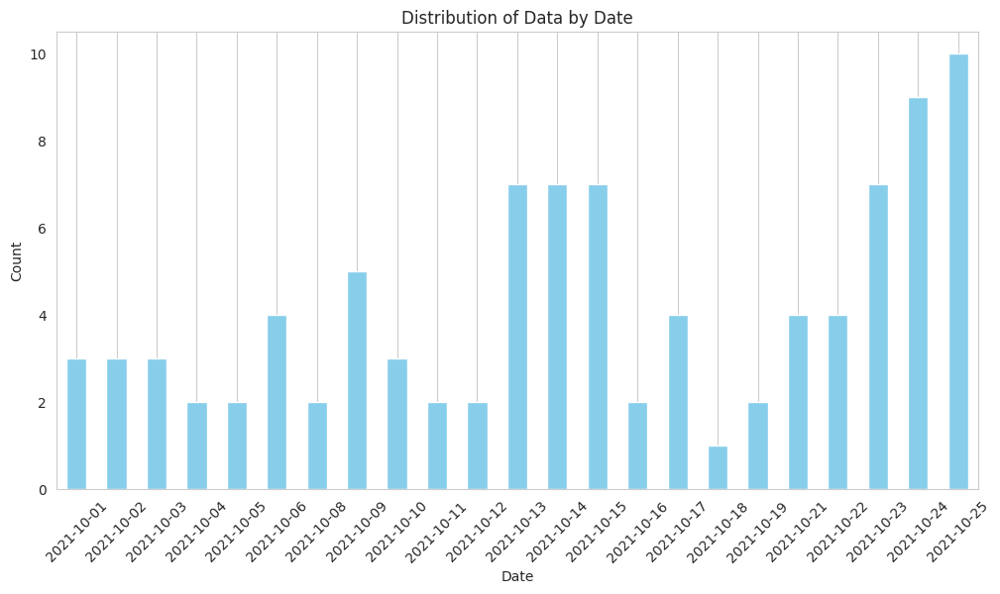

In [68]:
# F0017_21_22_oct_data 생성
F0017_21_22_oct_data = F0017_21_22[F0017_21_22['측정월'] == 10]
F0017_21_22_oct_data['shot_datetime'] = pd.to_datetime(F0017_21_22_oct_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_oct_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


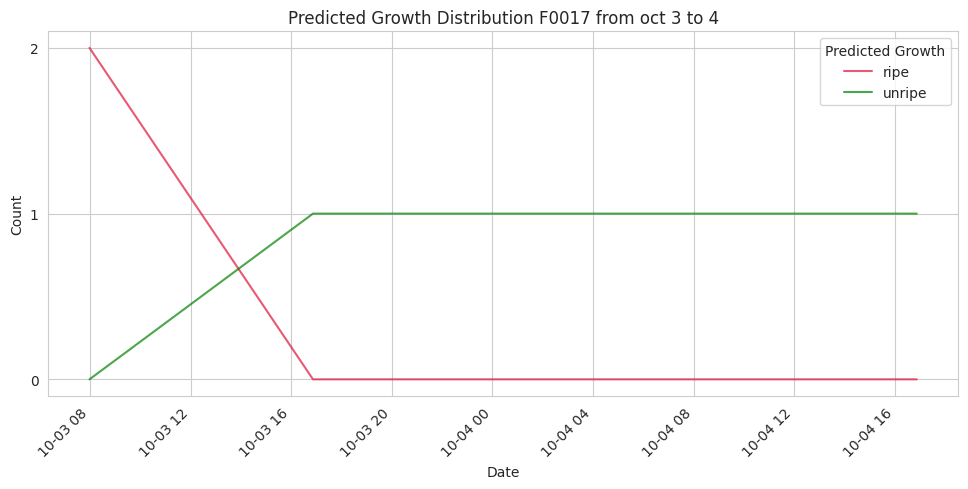

<Figure size 1200x600 with 0 Axes>

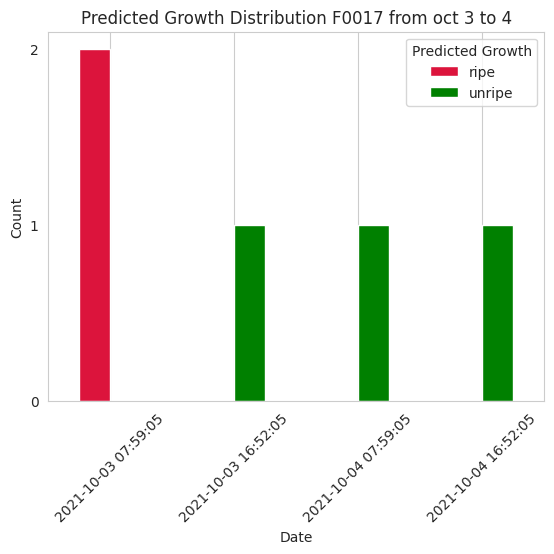

<Figure size 1200x600 with 0 Axes>

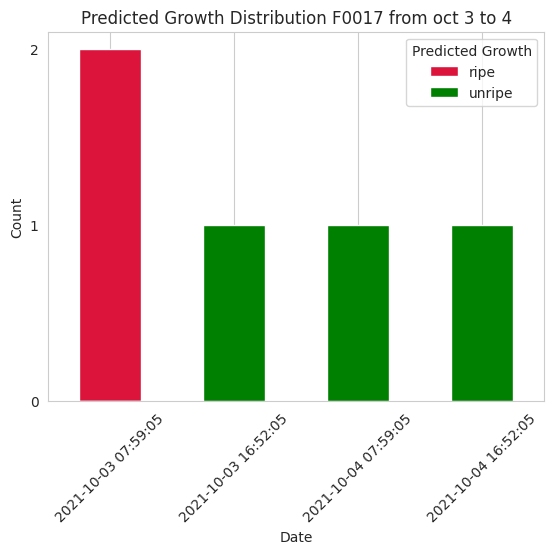

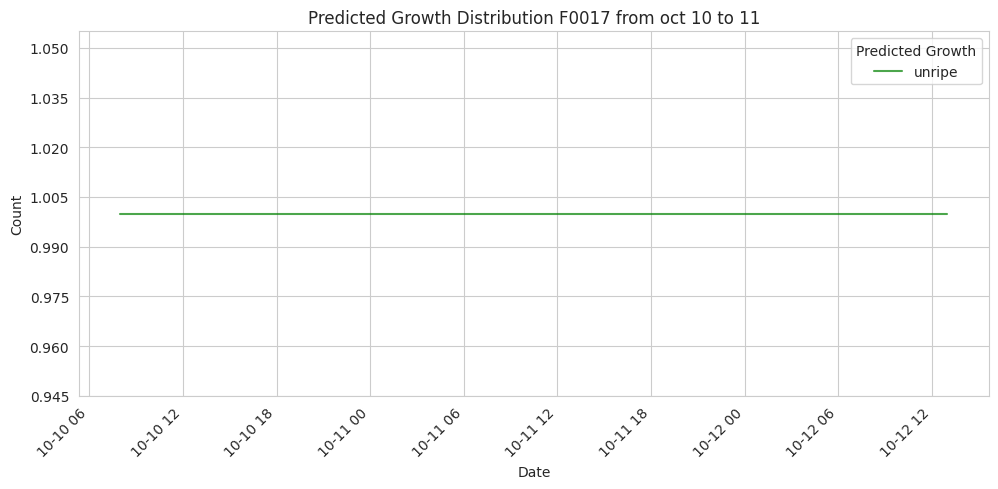

<Figure size 1200x600 with 0 Axes>

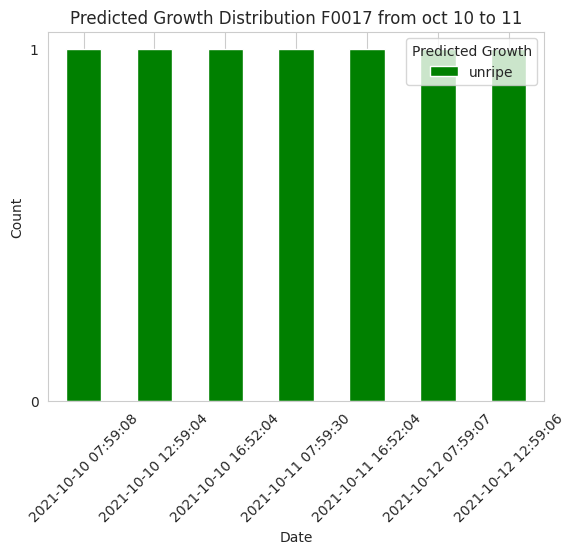

<Figure size 1200x600 with 0 Axes>

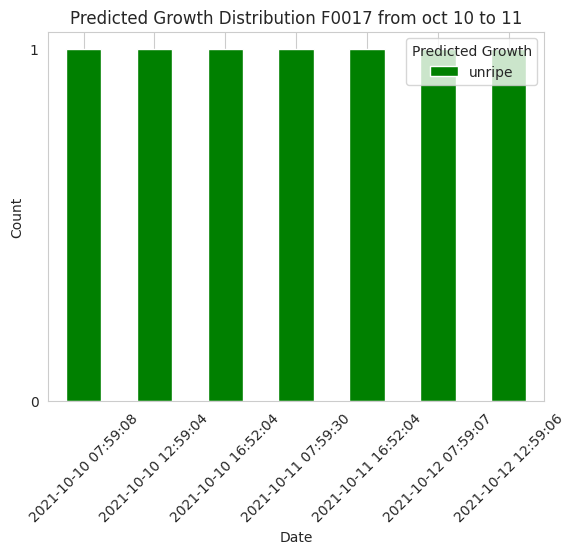

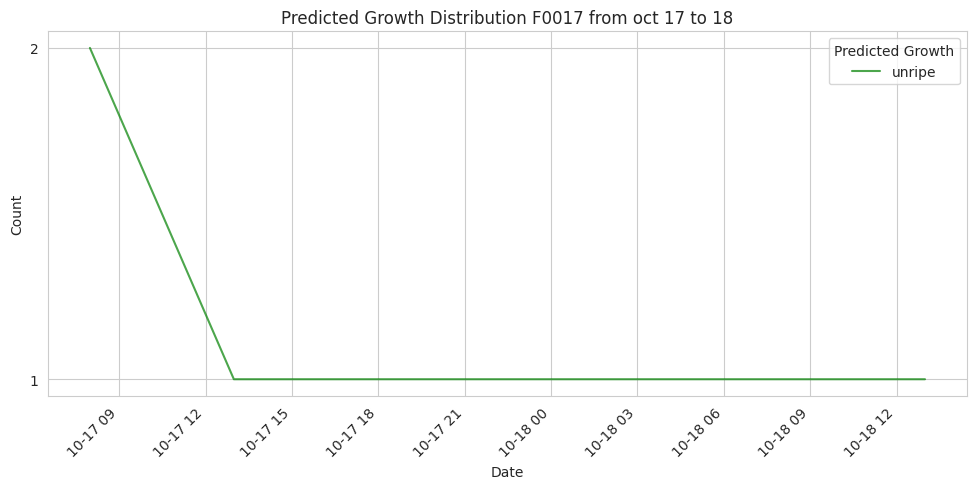

<Figure size 1200x600 with 0 Axes>

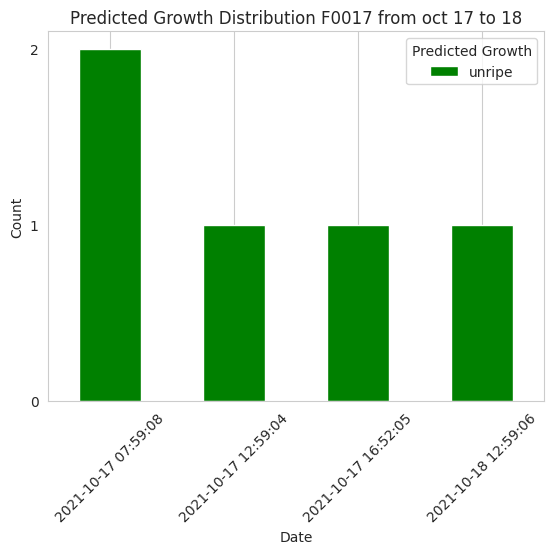

<Figure size 1200x600 with 0 Axes>

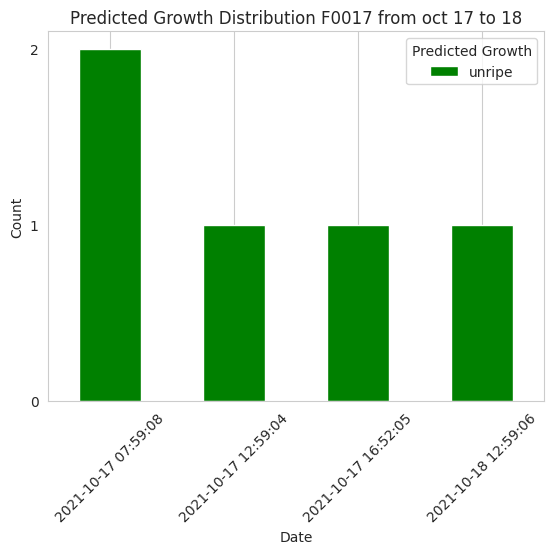

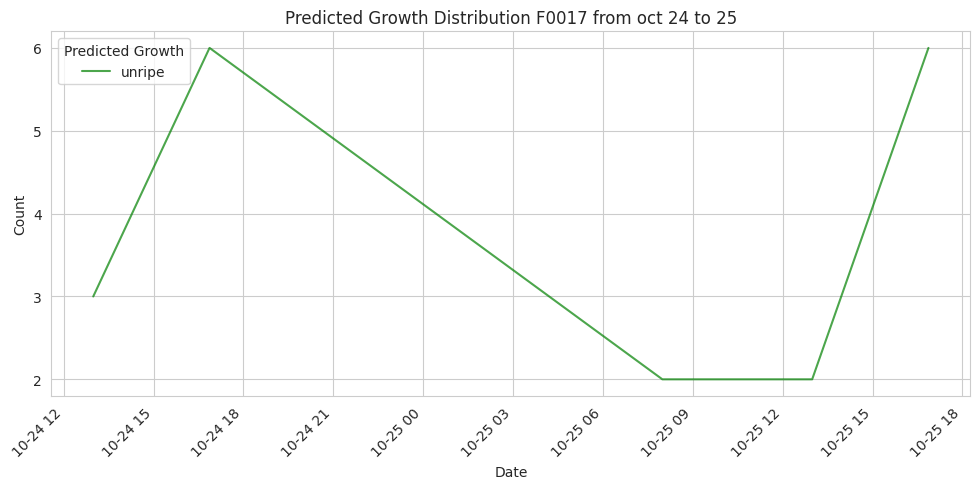

<Figure size 1200x600 with 0 Axes>

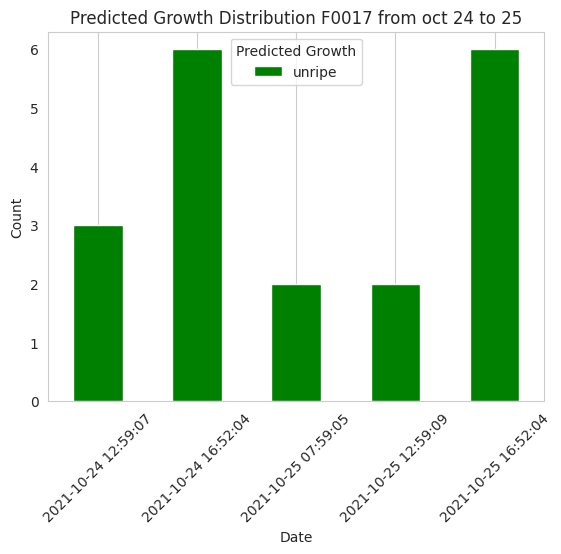

<Figure size 1200x600 with 0 Axes>

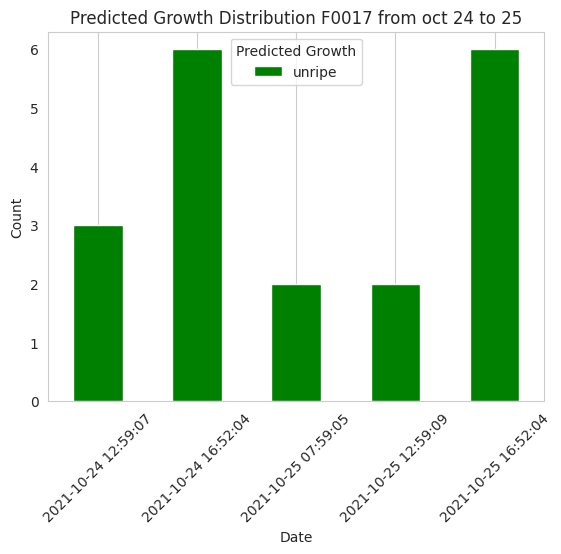

In [69]:
select_oct_1 = F0017_21_22_oct_data[(F0017_21_22_oct_data['shot_datetime'] >= '2021-10-03') & (F0017_21_22_oct_data['shot_datetime'] <= '2021-10-05')]
select_oct_2 = F0017_21_22_oct_data[(F0017_21_22_oct_data['shot_datetime'] >= '2021-10-10') & (F0017_21_22_oct_data['shot_datetime'] <= '2021-10-13')]
select_oct_3 = F0017_21_22_oct_data[(F0017_21_22_oct_data['shot_datetime'] >= '2021-10-17') & (F0017_21_22_oct_data['shot_datetime'] <= '2021-10-19')]
select_oct_4 = F0017_21_22_oct_data[(F0017_21_22_oct_data['shot_datetime'] >= '2021-10-24') & (F0017_21_22_oct_data['shot_datetime'] <= '2021-10-26')]

oct_1_counts = select_oct_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_2_counts = select_oct_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_3_counts = select_oct_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
oct_4_counts = select_oct_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(oct_1_counts, 'Predicted Growth Distribution F0017 from oct 3 to 4'),
            (oct_2_counts, 'Predicted Growth Distribution F0017 from oct 10 to 11'),
            (oct_3_counts, 'Predicted Growth Distribution F0017 from oct 17 to 18'),
            (oct_4_counts, 'Predicted Growth Distribution F0017 from oct 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0017 21-22작기 11월 생산량 추이

/tmp/ipykernel_21186/31538348.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_nov_data['shot_datetime'] = pd.to_datetime(F0017_21_22_nov_data['shot_datetime'])


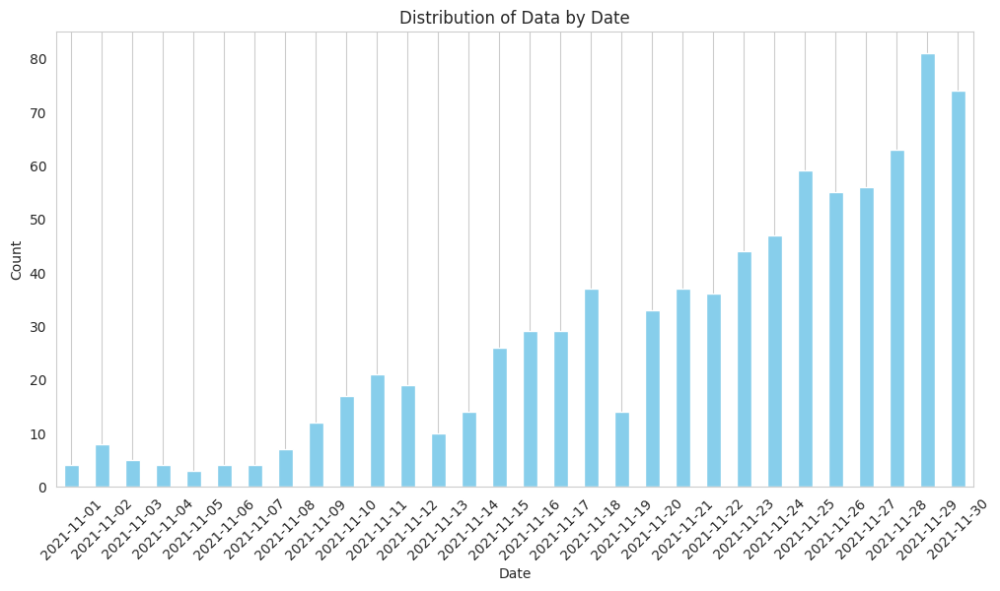

In [72]:
# F0017_21_22_nov_data 생성
F0017_21_22_nov_data = F0017_21_22[F0017_21_22['측정월'] == 11]
F0017_21_22_nov_data['shot_datetime'] = pd.to_datetime(F0017_21_22_nov_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_nov_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


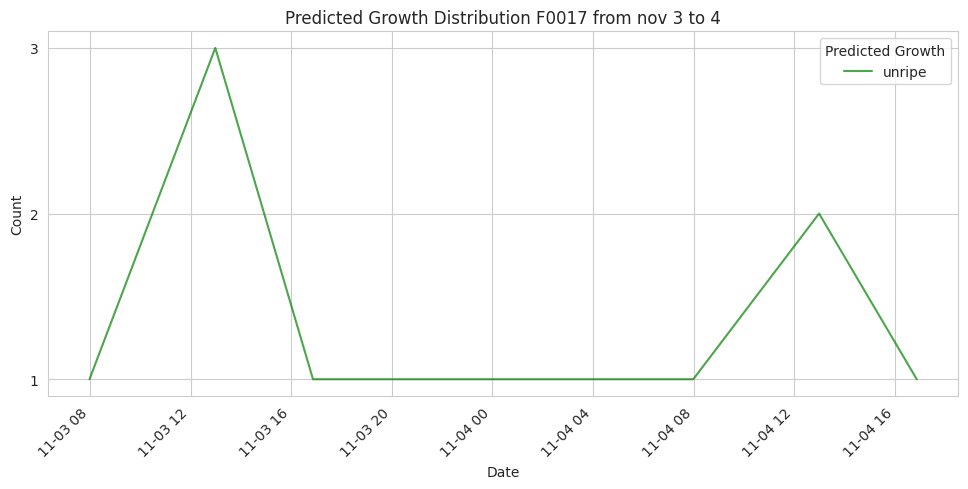

<Figure size 1200x600 with 0 Axes>

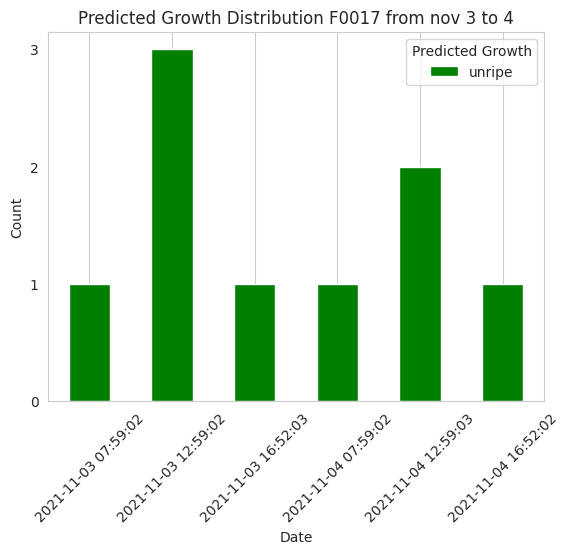

<Figure size 1200x600 with 0 Axes>

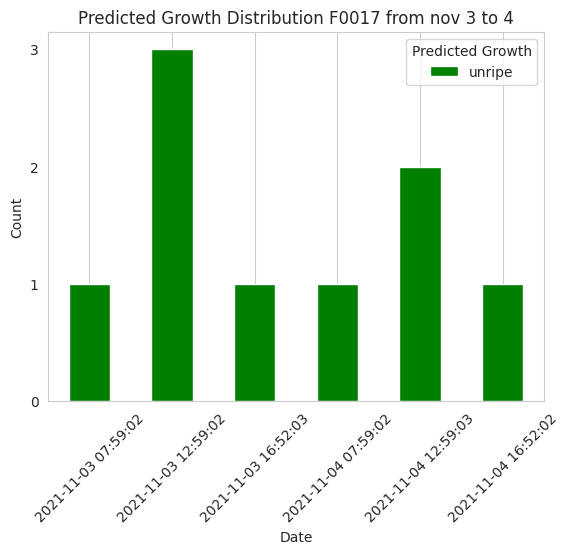

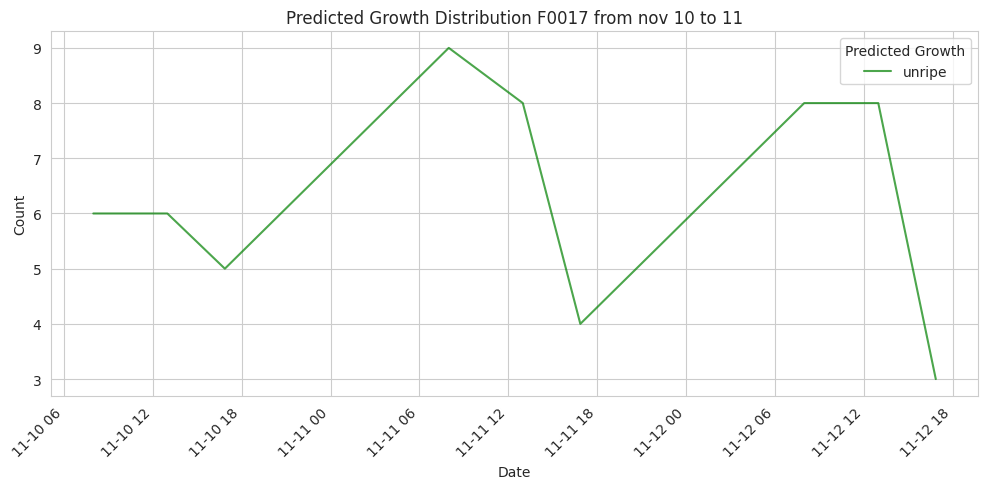

<Figure size 1200x600 with 0 Axes>

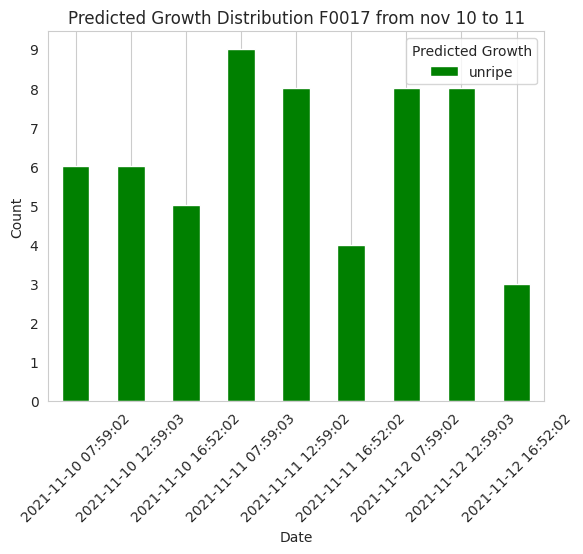

<Figure size 1200x600 with 0 Axes>

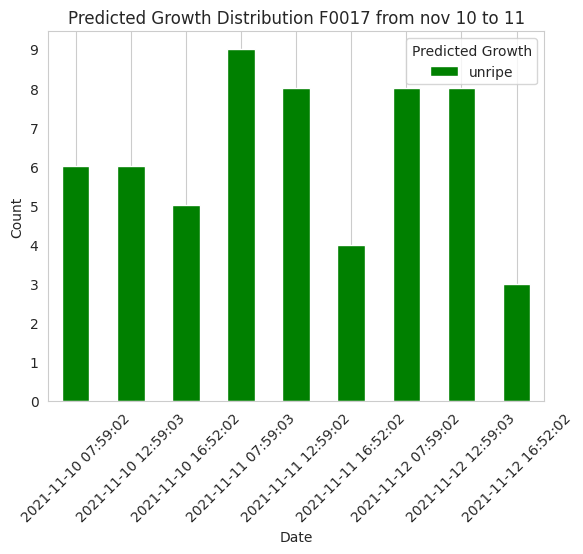

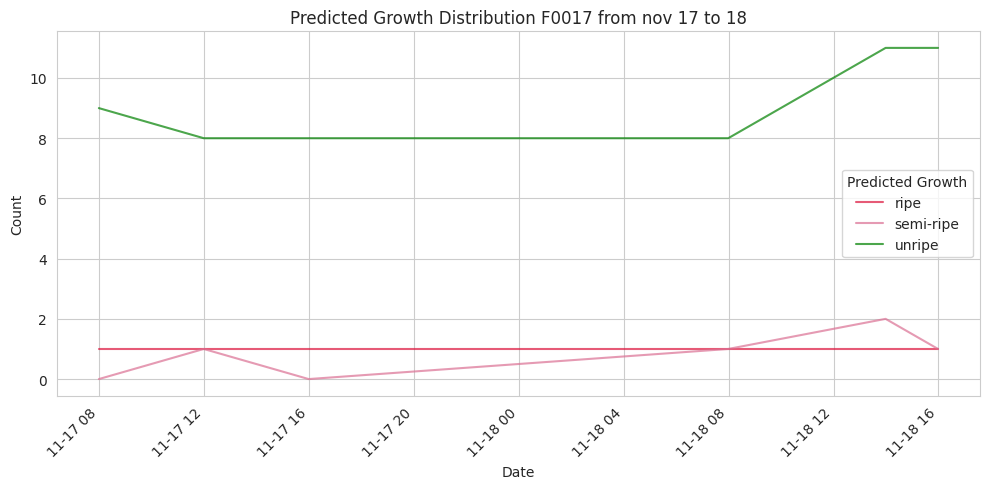

<Figure size 1200x600 with 0 Axes>

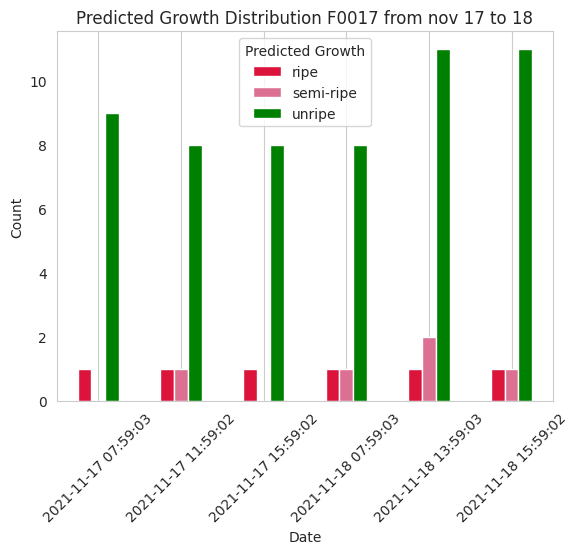

<Figure size 1200x600 with 0 Axes>

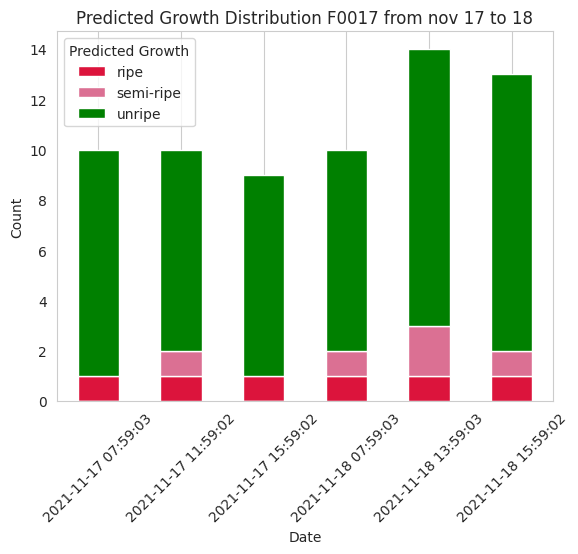

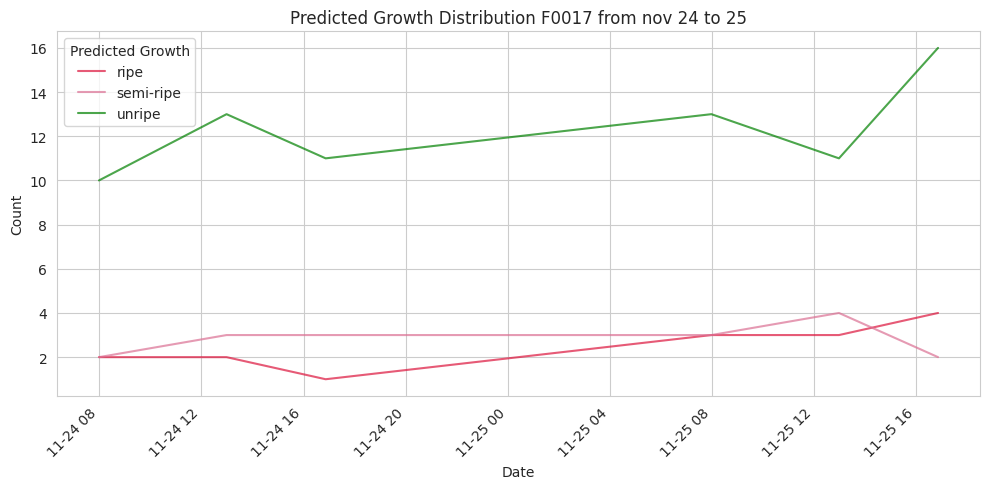

<Figure size 1200x600 with 0 Axes>

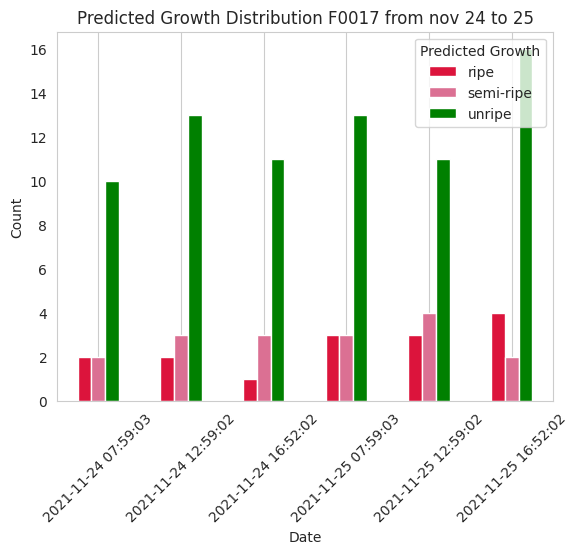

<Figure size 1200x600 with 0 Axes>

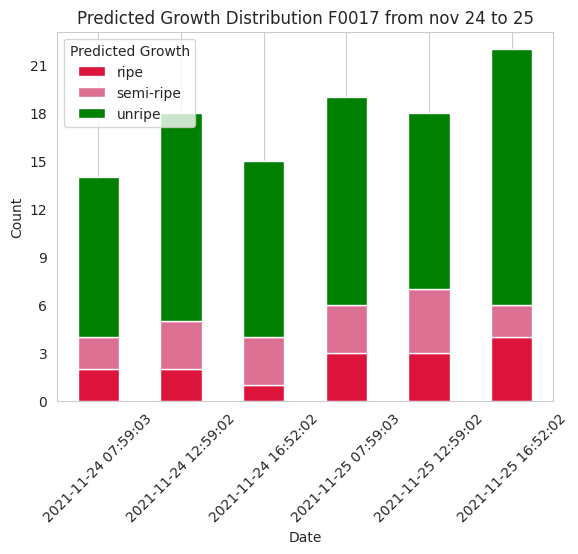

In [73]:
select_nov_1 = F0017_21_22_nov_data[(F0017_21_22_nov_data['shot_datetime'] >= '2021-11-03') & (F0017_21_22_nov_data['shot_datetime'] <= '2021-11-05')]
select_nov_2 = F0017_21_22_nov_data[(F0017_21_22_nov_data['shot_datetime'] >= '2021-11-10') & (F0017_21_22_nov_data['shot_datetime'] <= '2021-11-13')]
select_nov_3 = F0017_21_22_nov_data[(F0017_21_22_nov_data['shot_datetime'] >= '2021-11-17') & (F0017_21_22_nov_data['shot_datetime'] <= '2021-11-19')]
select_nov_4 = F0017_21_22_nov_data[(F0017_21_22_nov_data['shot_datetime'] >= '2021-11-24') & (F0017_21_22_nov_data['shot_datetime'] <= '2021-11-26')]

nov_1_counts = select_nov_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_2_counts = select_nov_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_3_counts = select_nov_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
nov_4_counts = select_nov_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 주어진 class에 따라 색상을 정의하는 함수
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson' 
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'  
    elif pred_growth == 'unripe':
        return 'green' 


def plot_growth_distribution(counts, title):
    # 라인 그래프 그리기
    plt.figure(figsize=(10, 5))
    for pred_growth in counts.columns:
        color = get_color(pred_growth)
        counts[pred_growth].plot(kind='line', color=color, alpha=0.7, label=pred_growth, stacked=True)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.grid(True)
    plt.tight_layout()
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.show()

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=False, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

    # 바 그래프 그리기
    plt.figure(figsize=(12, 6))
    colors = [get_color(pred_growth) for pred_growth in counts.columns]
    ax = counts.plot(kind='bar', stacked=True, color=colors)
    plt.title(title)
    plt.xlabel('Date')
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Predicted Growth')
    plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
    plt.grid(axis='y')

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(nov_1_counts, 'Predicted Growth Distribution F0017 from nov 3 to 4'),
            (nov_2_counts, 'Predicted Growth Distribution F0017 from nov 10 to 11'),
            (nov_3_counts, 'Predicted Growth Distribution F0017 from nov 17 to 18'),
            (nov_4_counts, 'Predicted Growth Distribution F0017 from nov 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0017 21-22작기 12월 생산량 추이

/tmp/ipykernel_21186/4155179391.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_dec_data['shot_datetime'] = pd.to_datetime(F0017_21_22_dec_data['shot_datetime'])


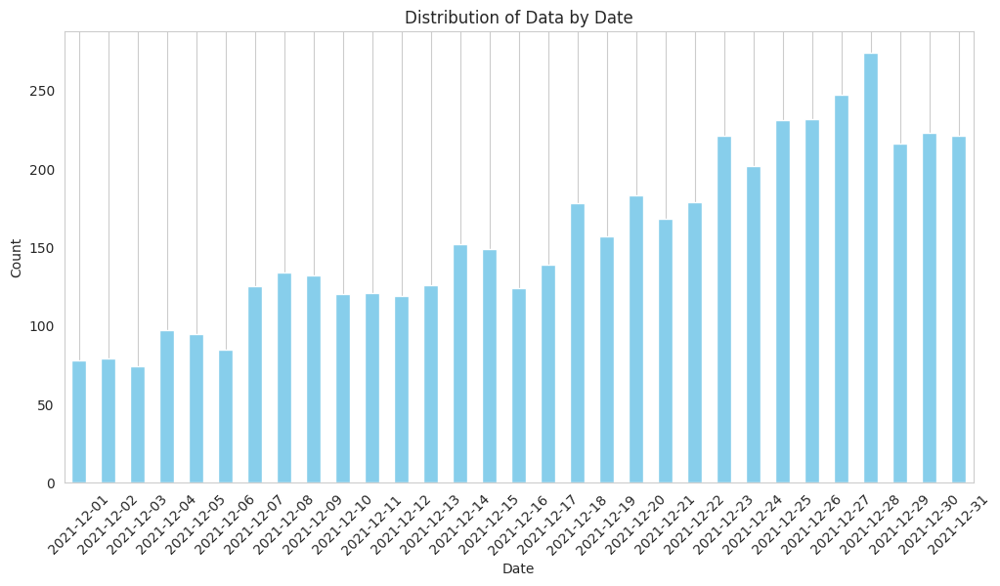

In [74]:
# F0017_21_22_dec_data 생성
F0017_21_22_dec_data = F0017_21_22[F0017_21_22['측정월'] == 12]
F0017_21_22_dec_data['shot_datetime'] = pd.to_datetime(F0017_21_22_dec_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_dec_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


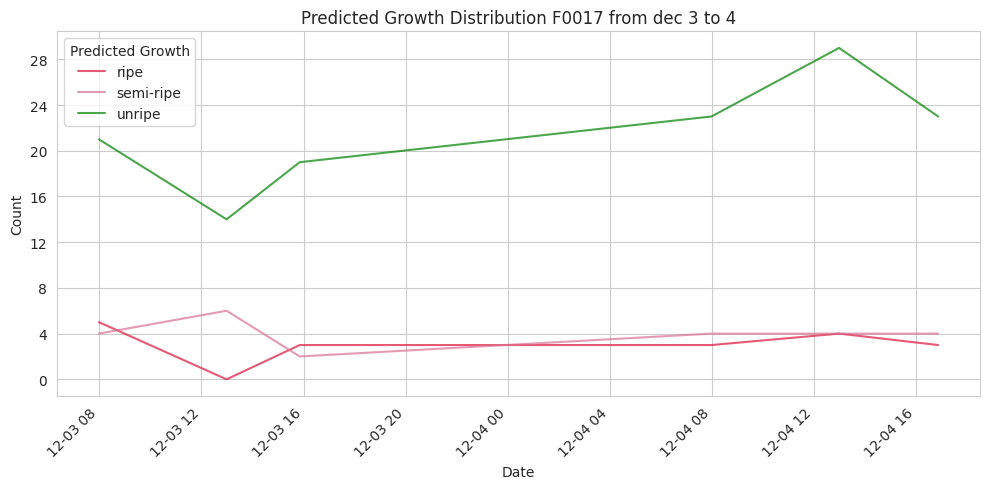

<Figure size 1200x600 with 0 Axes>

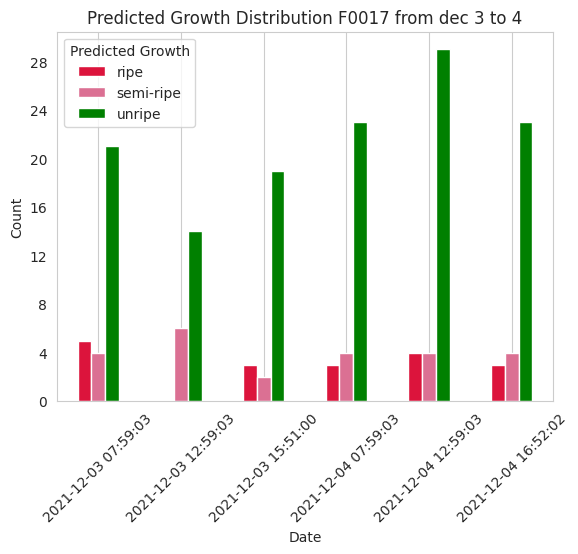

<Figure size 1200x600 with 0 Axes>

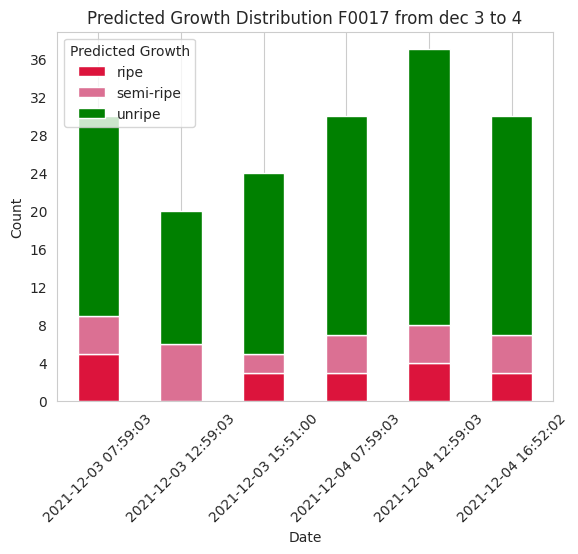

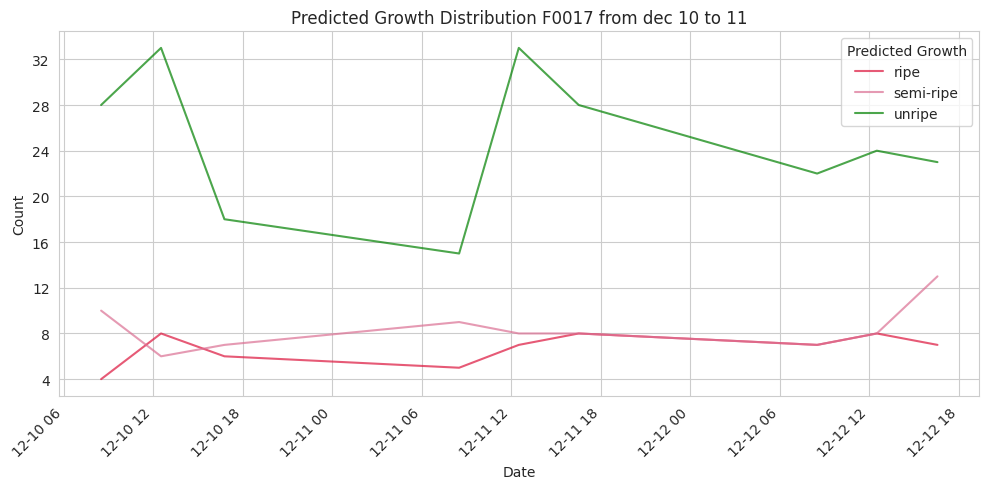

<Figure size 1200x600 with 0 Axes>

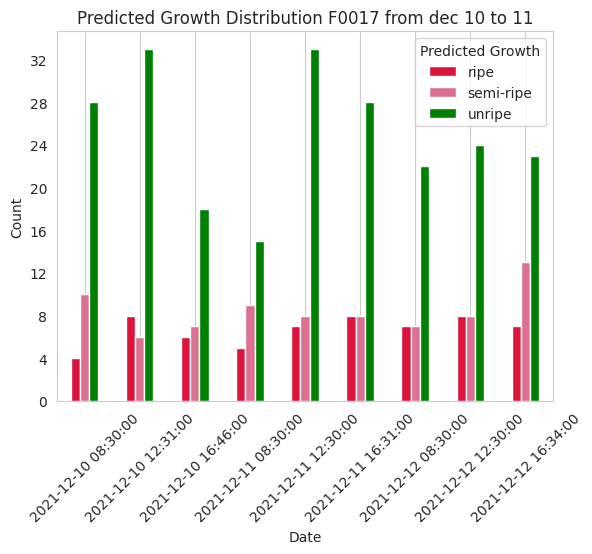

<Figure size 1200x600 with 0 Axes>

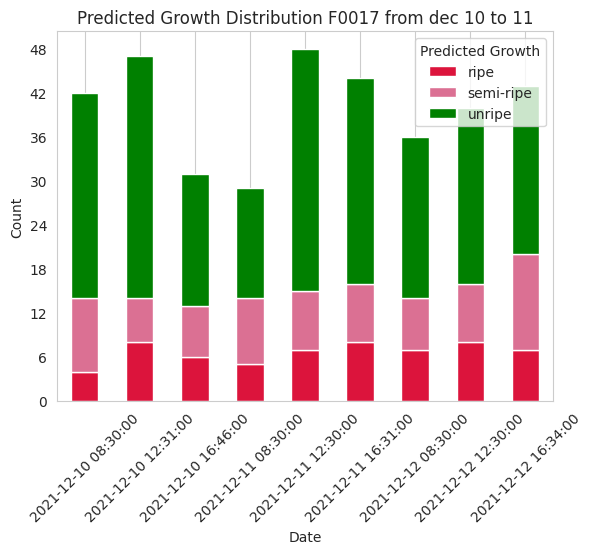

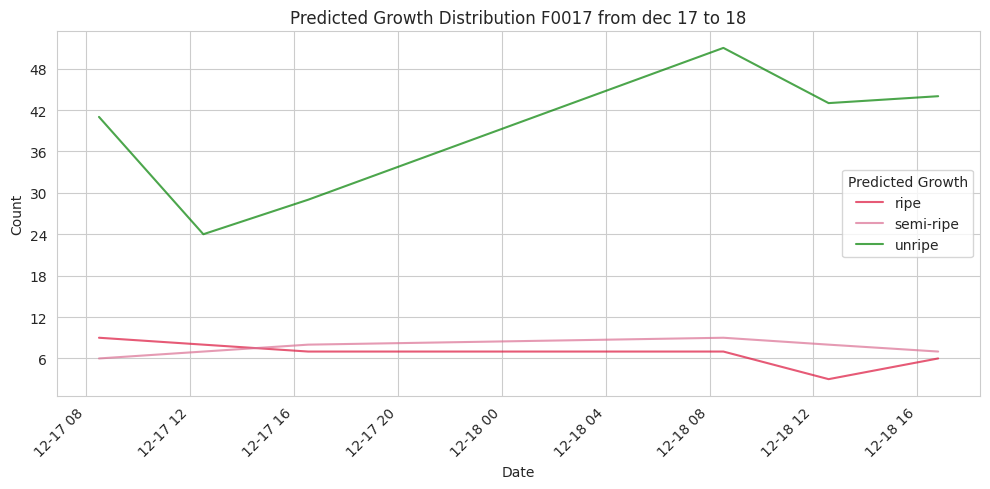

<Figure size 1200x600 with 0 Axes>

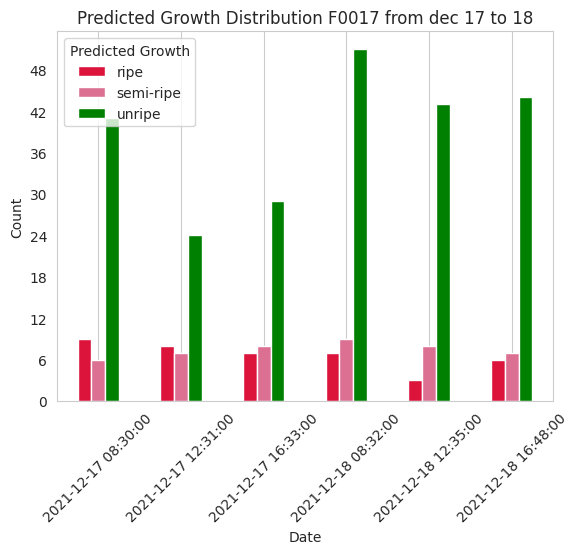

<Figure size 1200x600 with 0 Axes>

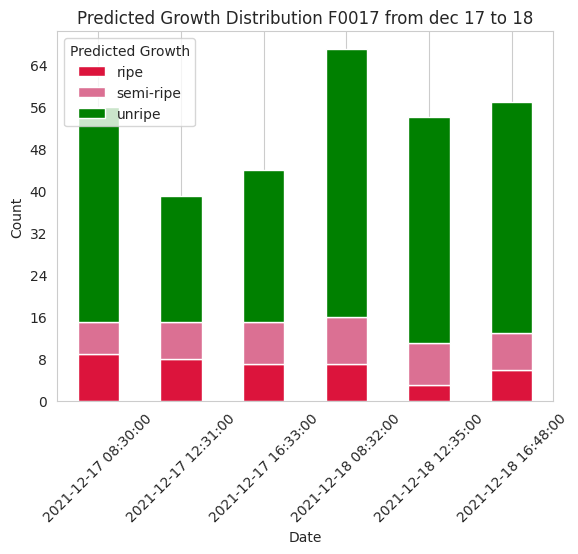

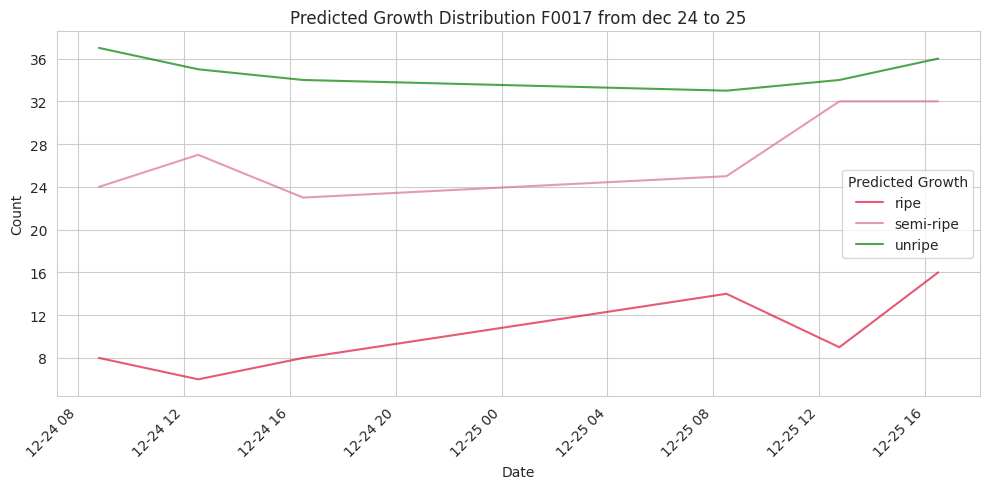

<Figure size 1200x600 with 0 Axes>

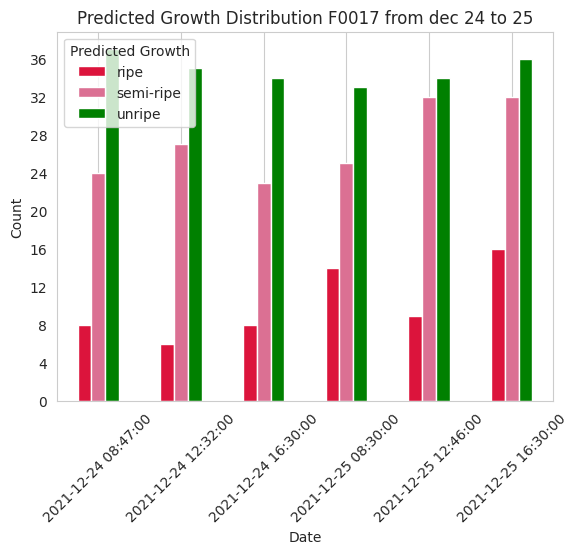

<Figure size 1200x600 with 0 Axes>

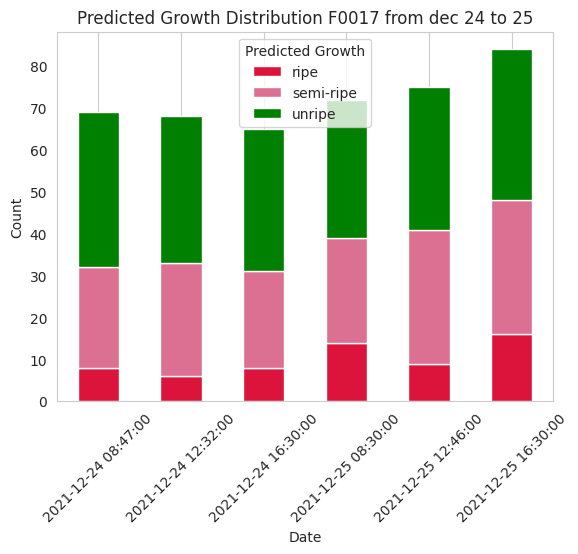

In [75]:
select_dec_1 = F0017_21_22_dec_data[(F0017_21_22_dec_data['shot_datetime'] >= '2021-12-03') & (F0017_21_22_dec_data['shot_datetime'] <= '2021-12-05')]
select_dec_2 = F0017_21_22_dec_data[(F0017_21_22_dec_data['shot_datetime'] >= '2021-12-10') & (F0017_21_22_dec_data['shot_datetime'] <= '2021-12-13')]
select_dec_3 = F0017_21_22_dec_data[(F0017_21_22_dec_data['shot_datetime'] >= '2021-12-17') & (F0017_21_22_dec_data['shot_datetime'] <= '2021-12-19')]
select_dec_4 = F0017_21_22_dec_data[(F0017_21_22_dec_data['shot_datetime'] >= '2021-12-24') & (F0017_21_22_dec_data['shot_datetime'] <= '2021-12-26')]

dec_1_counts = select_dec_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_2_counts = select_dec_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_3_counts = select_dec_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
dec_4_counts = select_dec_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(dec_1_counts, 'Predicted Growth Distribution F0017 from dec 3 to 4'),
            (dec_2_counts, 'Predicted Growth Distribution F0017 from dec 10 to 11'),
            (dec_3_counts, 'Predicted Growth Distribution F0017 from dec 17 to 18'),
            (dec_4_counts, 'Predicted Growth Distribution F0017 from dec 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0017 21-22작기 1월 

/tmp/ipykernel_21186/1688260361.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_jan_data['shot_datetime'] = pd.to_datetime(F0017_21_22_jan_data['shot_datetime'])


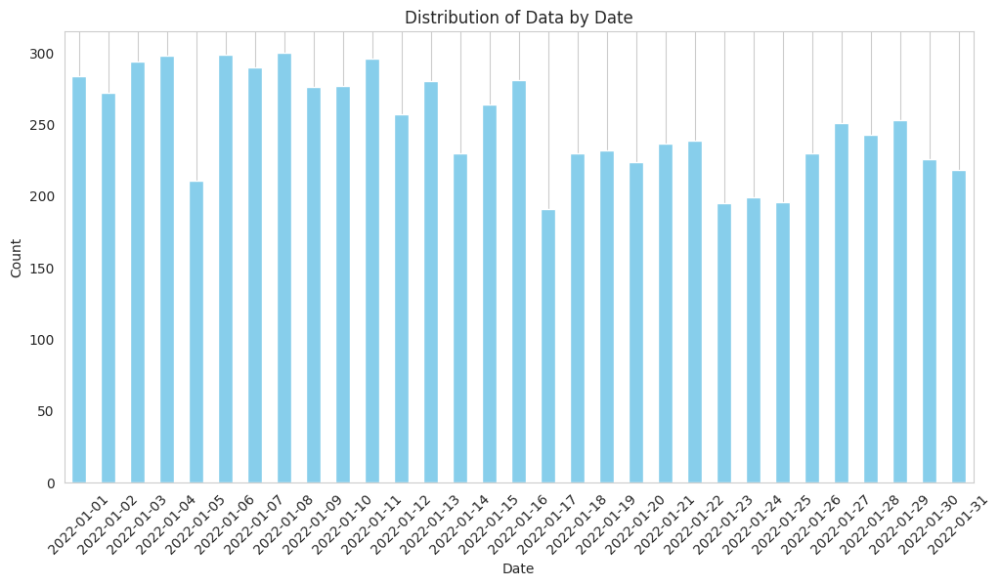

In [76]:
F0017_21_22_jan_data = F0017_21_22[F0017_21_22['측정월'] == 1]
F0017_21_22_jan_data['shot_datetime'] = pd.to_datetime(F0017_21_22_jan_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_jan_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

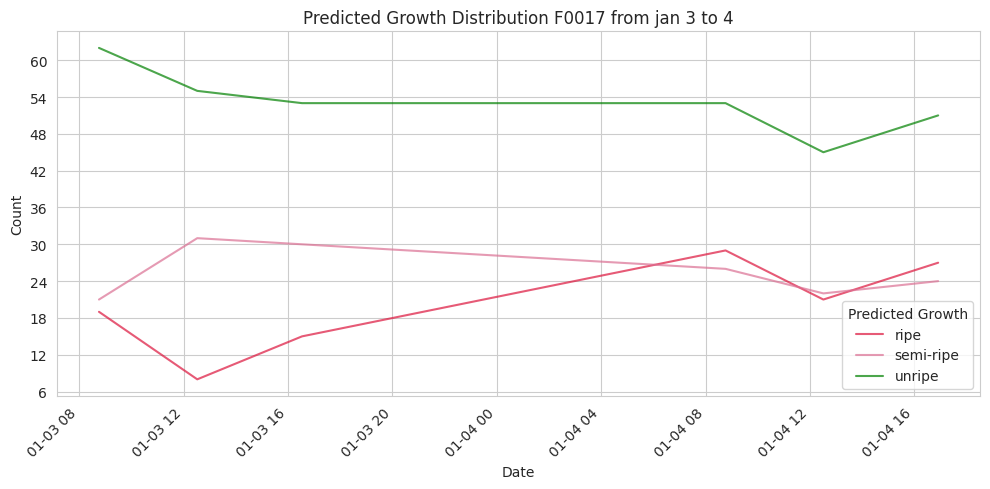

<Figure size 1200x600 with 0 Axes>

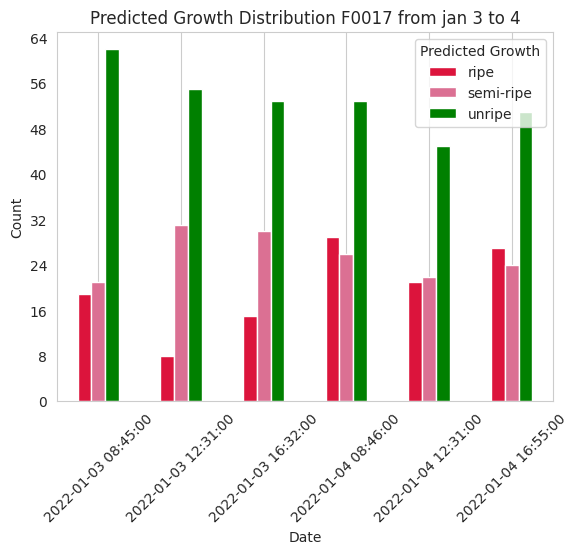

<Figure size 1200x600 with 0 Axes>

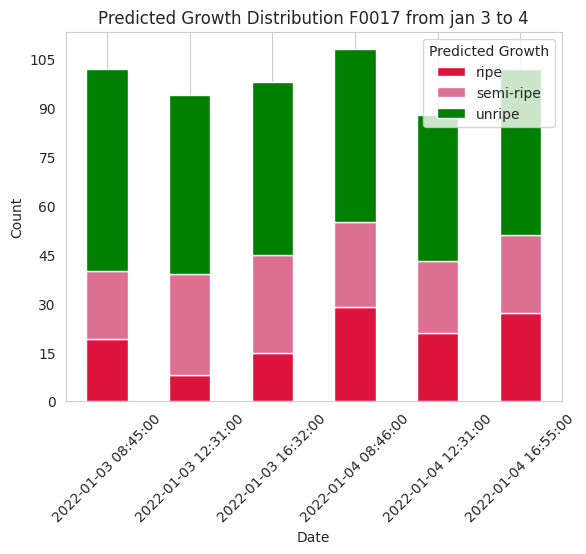

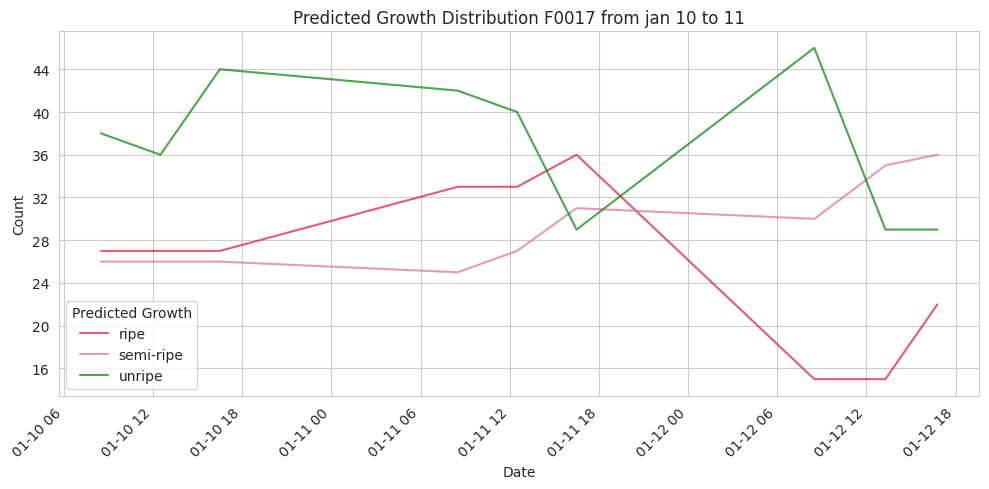

<Figure size 1200x600 with 0 Axes>

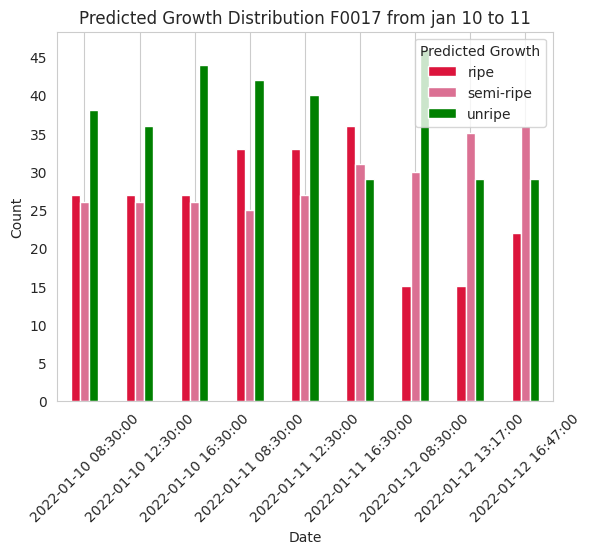

<Figure size 1200x600 with 0 Axes>

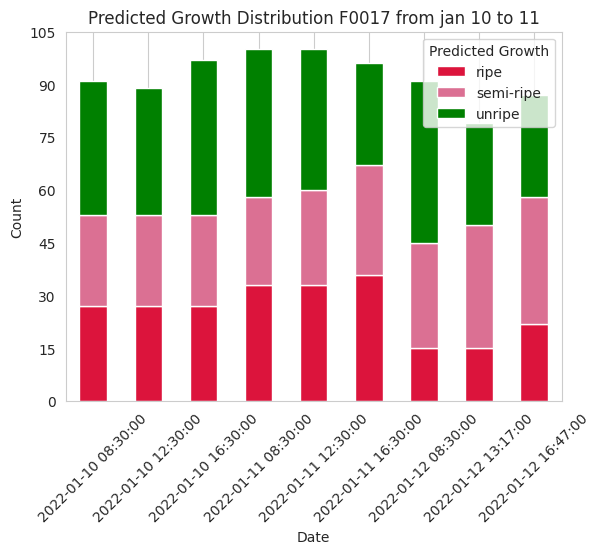

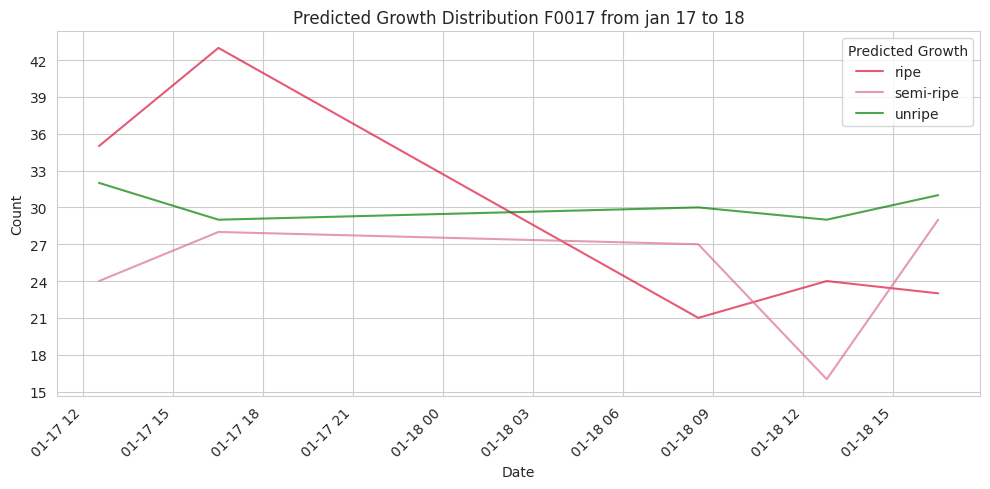

<Figure size 1200x600 with 0 Axes>

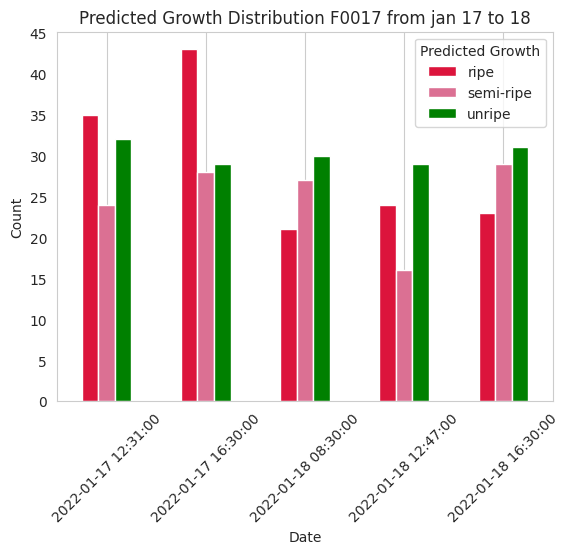

<Figure size 1200x600 with 0 Axes>

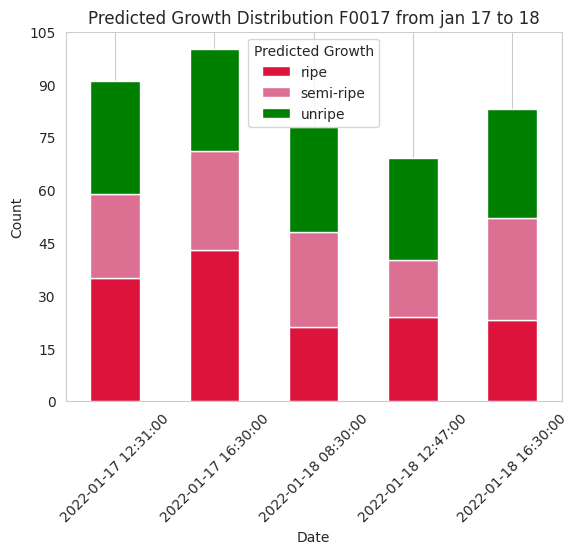

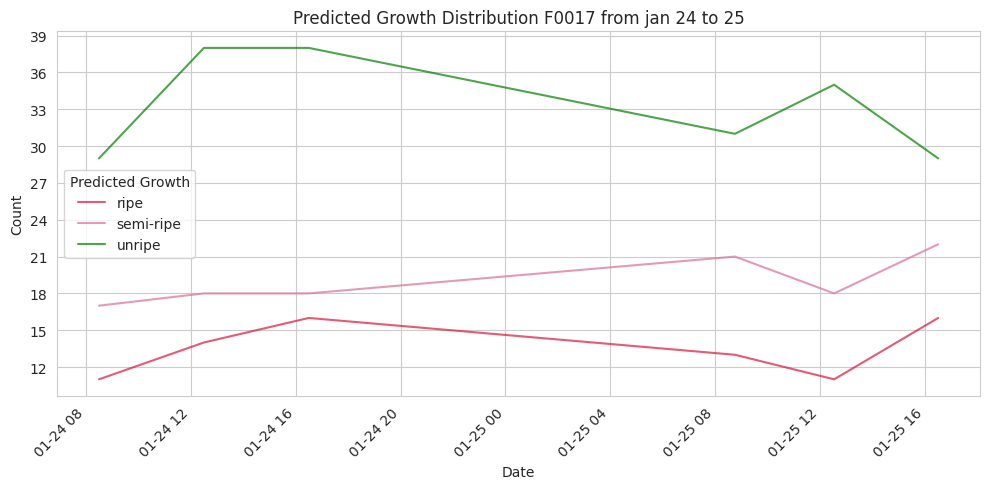

<Figure size 1200x600 with 0 Axes>

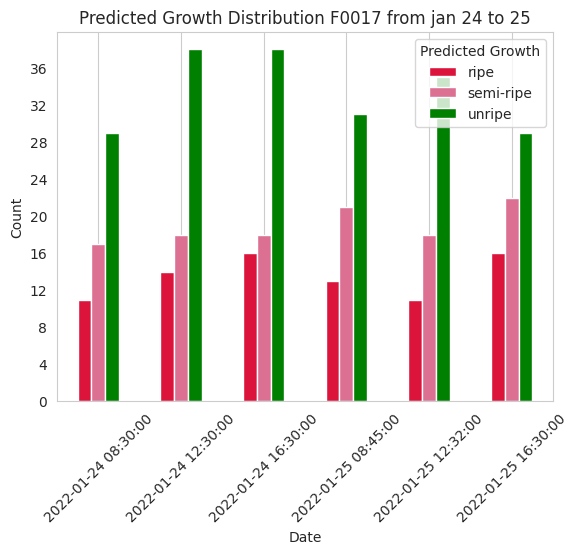

<Figure size 1200x600 with 0 Axes>

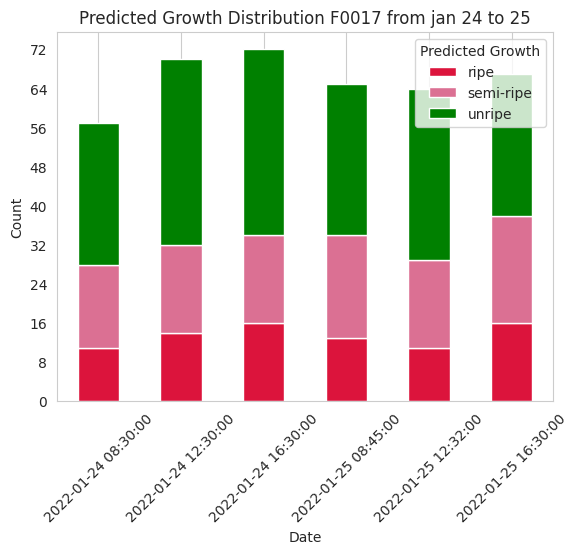

In [77]:
select_jan_1 = F0017_21_22_jan_data[(F0017_21_22_jan_data['shot_datetime'] >= '2022-01-03') & (F0017_21_22_jan_data['shot_datetime'] <= '2022-01-05')]
select_jan_2 = F0017_21_22_jan_data[(F0017_21_22_jan_data['shot_datetime'] >= '2022-01-10') & (F0017_21_22_jan_data['shot_datetime'] <= '2022-01-13')]
select_jan_3 = F0017_21_22_jan_data[(F0017_21_22_jan_data['shot_datetime'] >= '2022-01-17') & (F0017_21_22_jan_data['shot_datetime'] <= '2022-01-19')]
select_jan_4 = F0017_21_22_jan_data[(F0017_21_22_jan_data['shot_datetime'] >= '2022-01-24') & (F0017_21_22_jan_data['shot_datetime'] <= '2022-01-26')]

jan_1_counts = select_jan_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_2_counts = select_jan_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_3_counts = select_jan_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jan_4_counts = select_jan_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(jan_1_counts, 'Predicted Growth Distribution F0017 from jan 3 to 4'),
            (jan_2_counts, 'Predicted Growth Distribution F0017 from jan 10 to 11'),
            (jan_3_counts, 'Predicted Growth Distribution F0017 from jan 17 to 18'),
            (jan_4_counts, 'Predicted Growth Distribution F0017 from jan 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0017 21-22작기 2월

/tmp/ipykernel_21186/3236976320.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_feb_data['shot_datetime'] = pd.to_datetime(F0017_21_22_feb_data['shot_datetime'])


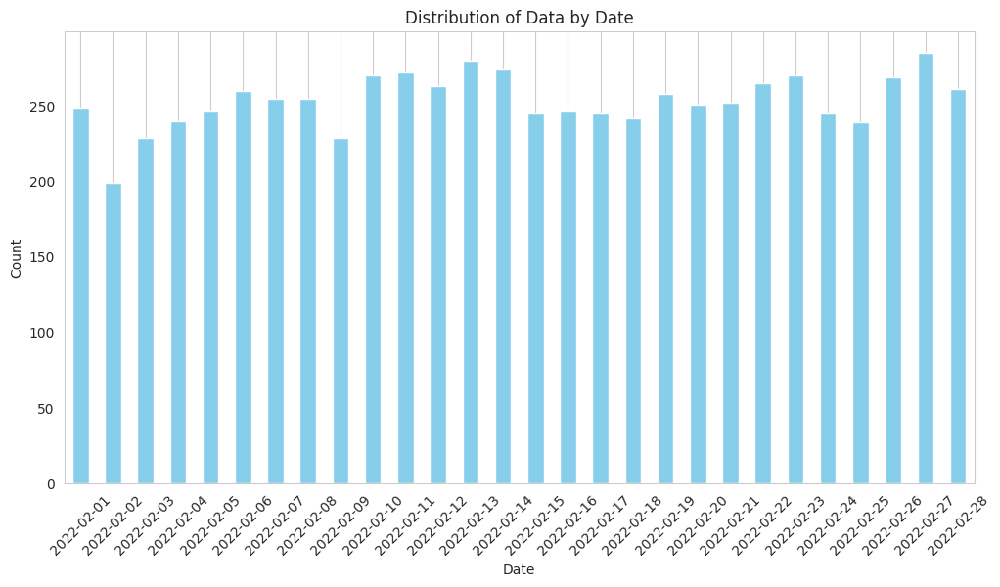

In [78]:
F0017_21_22_feb_data = F0017_21_22[F0017_21_22['측정월'] == 2]
F0017_21_22_feb_data['shot_datetime'] = pd.to_datetime(F0017_21_22_feb_data['shot_datetime'])
# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_feb_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()


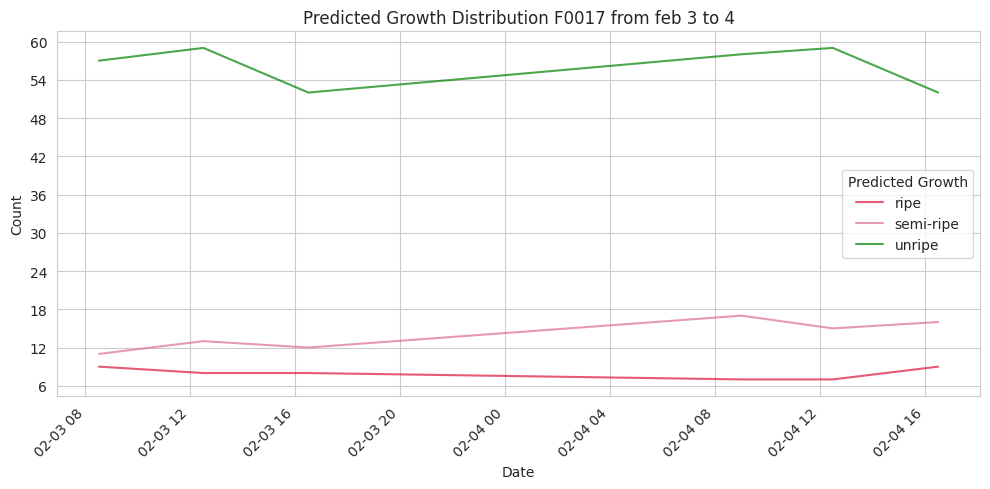

<Figure size 1200x600 with 0 Axes>

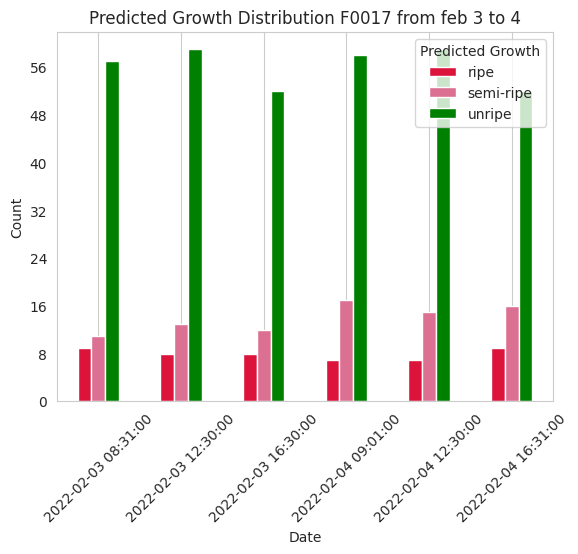

<Figure size 1200x600 with 0 Axes>

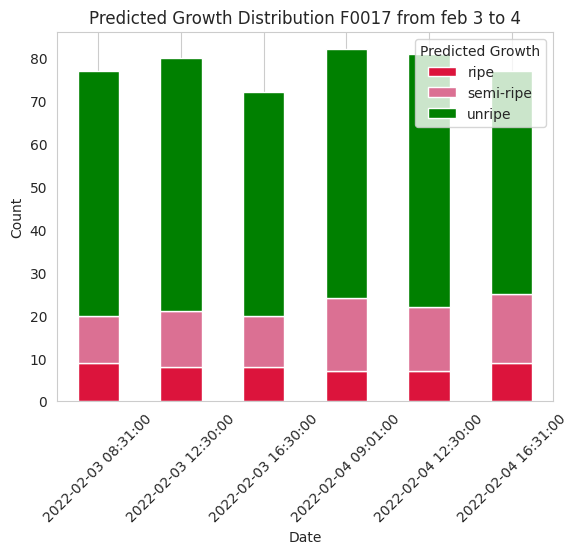

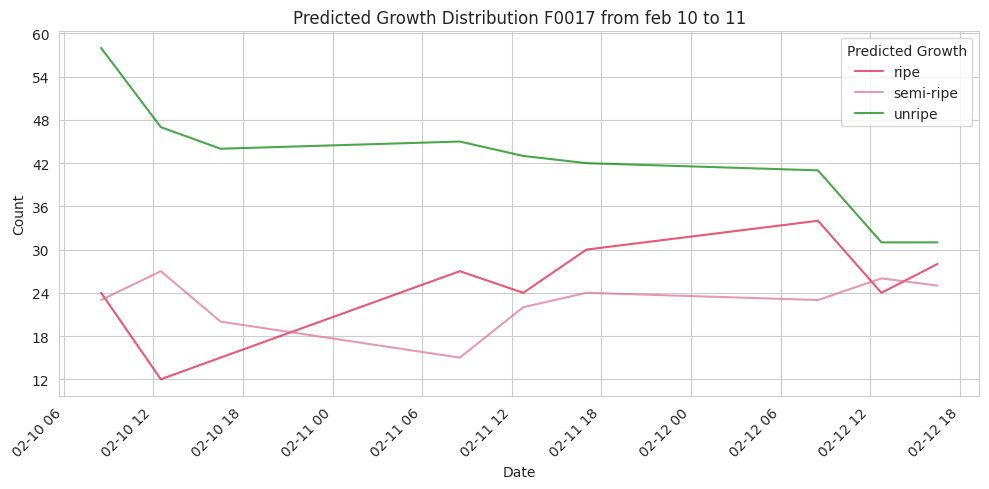

<Figure size 1200x600 with 0 Axes>

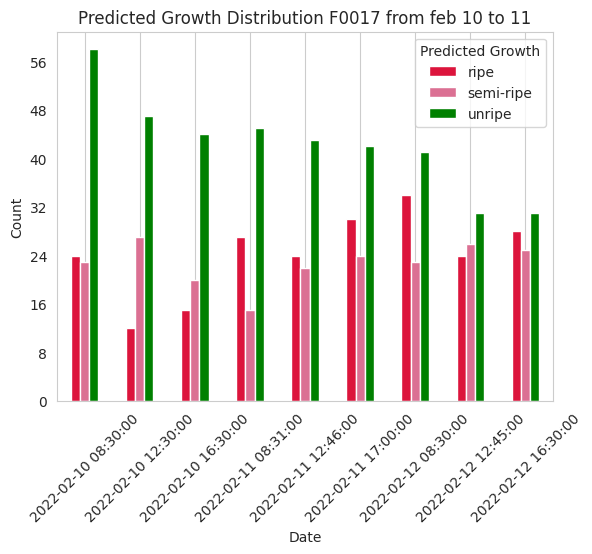

<Figure size 1200x600 with 0 Axes>

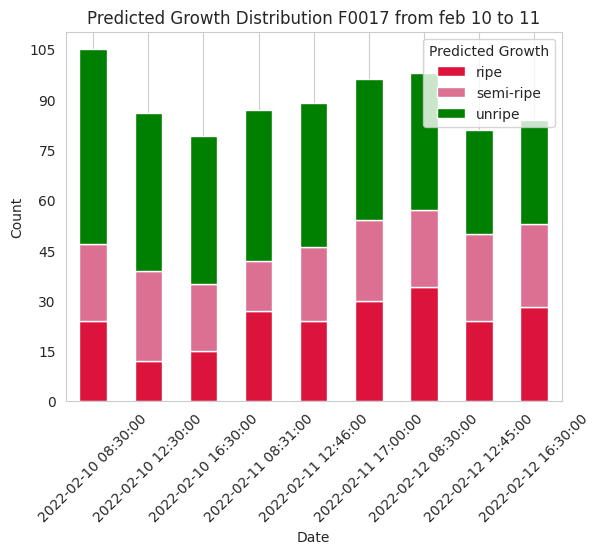

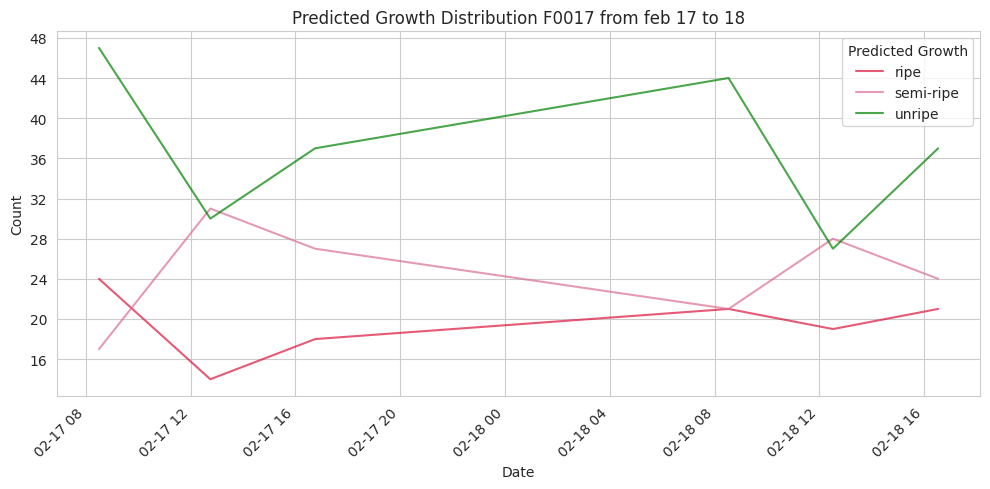

<Figure size 1200x600 with 0 Axes>

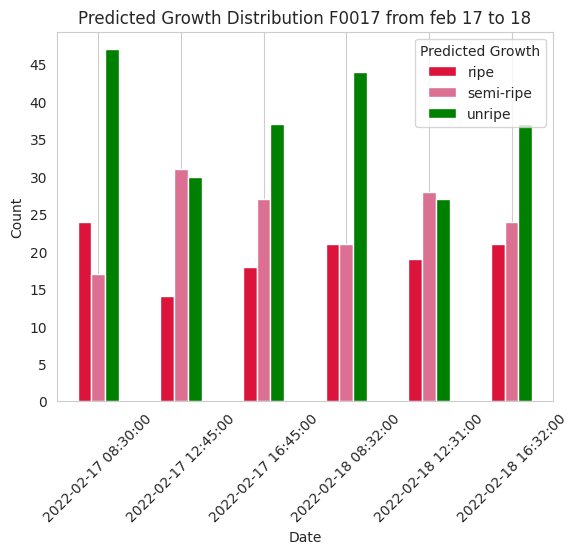

<Figure size 1200x600 with 0 Axes>

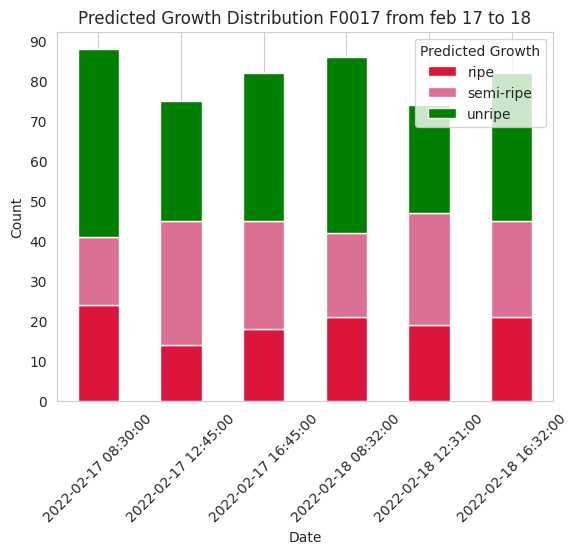

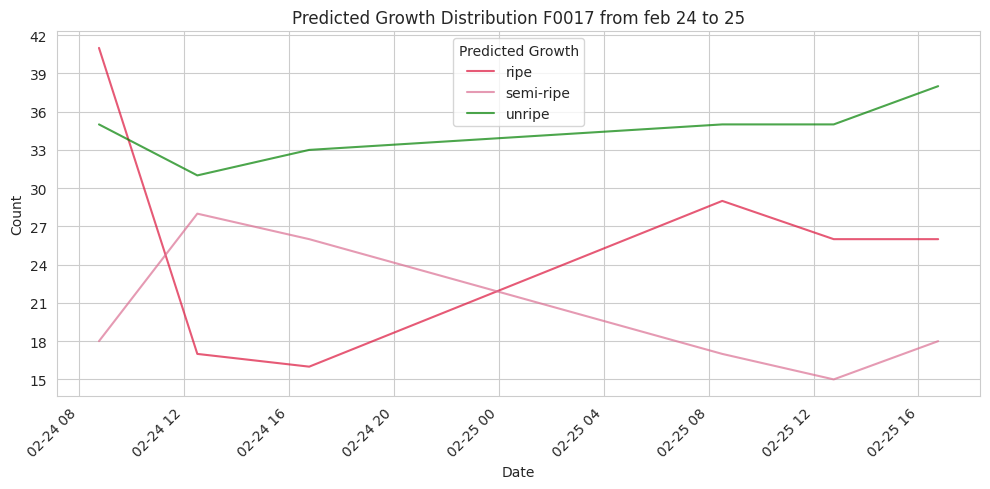

<Figure size 1200x600 with 0 Axes>

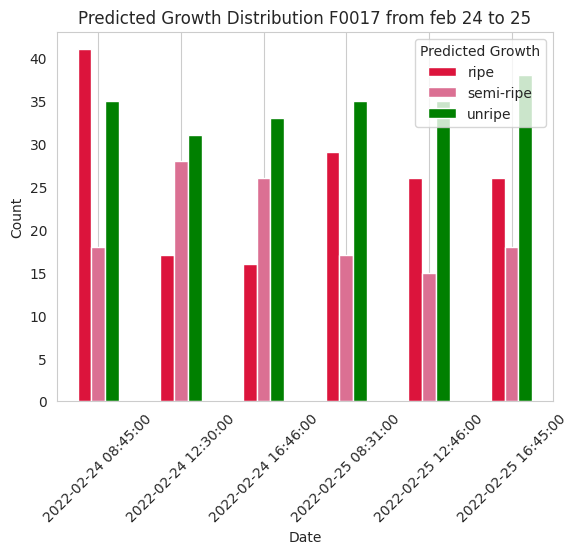

<Figure size 1200x600 with 0 Axes>

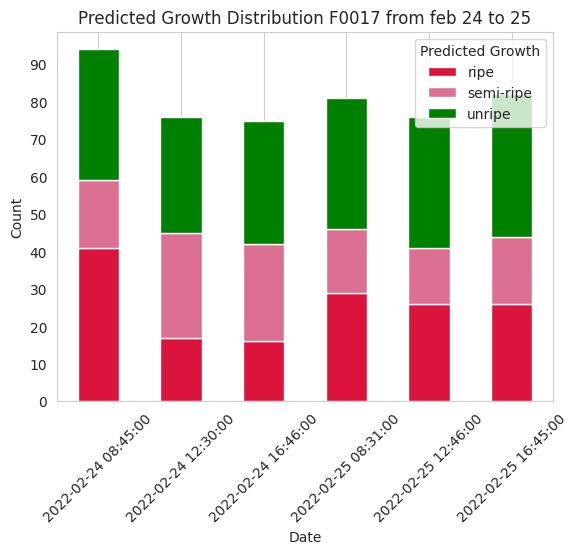

In [79]:
select_feb_1 = F0017_21_22_feb_data[(F0017_21_22_feb_data['shot_datetime'] >= '2022-02-03') & (F0017_21_22_feb_data['shot_datetime'] <= '2022-02-05')]
select_feb_2 = F0017_21_22_feb_data[(F0017_21_22_feb_data['shot_datetime'] >= '2022-02-10') & (F0017_21_22_feb_data['shot_datetime'] <= '2022-02-13')]
select_feb_3 = F0017_21_22_feb_data[(F0017_21_22_feb_data['shot_datetime'] >= '2022-02-17') & (F0017_21_22_feb_data['shot_datetime'] <= '2022-02-19')]
select_feb_4 = F0017_21_22_feb_data[(F0017_21_22_feb_data['shot_datetime'] >= '2022-02-24') & (F0017_21_22_feb_data['shot_datetime'] <= '2022-02-26')]

feb_1_counts = select_feb_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_2_counts = select_feb_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_3_counts = select_feb_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
feb_4_counts = select_feb_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
# 각 주차별 데이터와 제목을 리스트로 정의
datasets = [(feb_1_counts, 'Predicted Growth Distribution F0017 from feb 3 to 4'),
            (feb_2_counts, 'Predicted Growth Distribution F0017 from feb 10 to 11'),
            (feb_3_counts, 'Predicted Growth Distribution F0017 from feb 17 to 18'),
            (feb_4_counts, 'Predicted Growth Distribution F0017 from feb 24 to 25')]

# 각 데이터에 대해 그래프 그리기 함수 호출
for counts, title in datasets:
    plot_growth_distribution(counts, title)


#### F0017 21-22작기 3월

/tmp/ipykernel_21186/3645399235.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_mar_data['shot_datetime'] = pd.to_datetime(F0017_21_22_mar_data['shot_datetime'])


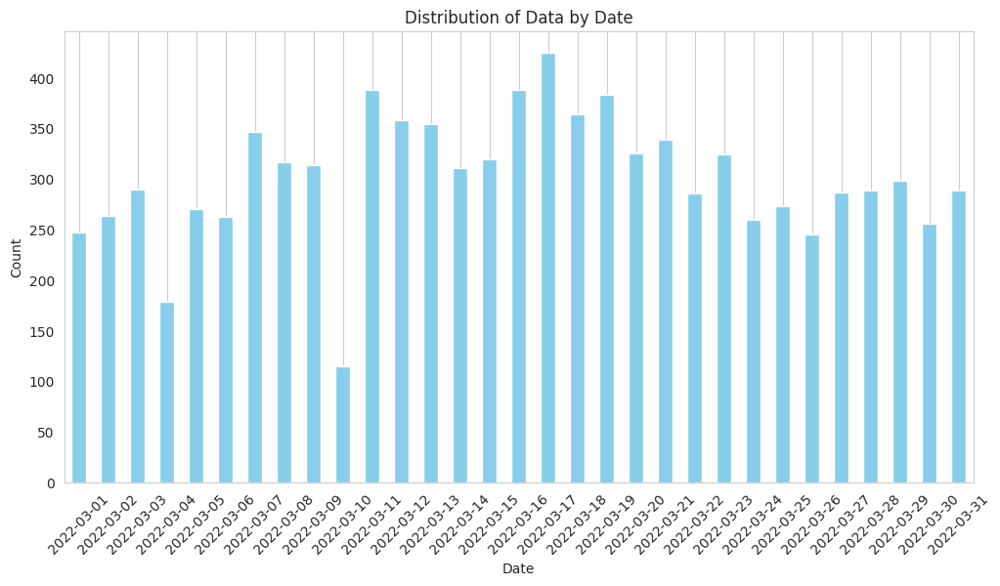

In [83]:
# F0017_21_22_mar_data 생성 (assuming dataframe name changed to F0017)
F0017_21_22_mar_data = F0017_21_22[F0017_21_22['측정월'] == 3]
F0017_21_22_mar_data['shot_datetime'] = pd.to_datetime(F0017_21_22_mar_data['shot_datetime'])

# 일자별 마스크 개수 카운트
date_counts = pd.to_datetime(F0017_21_22_mar_data['shot_datetime']).dt.date.value_counts().sort_index()

# 그래프 그리기
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

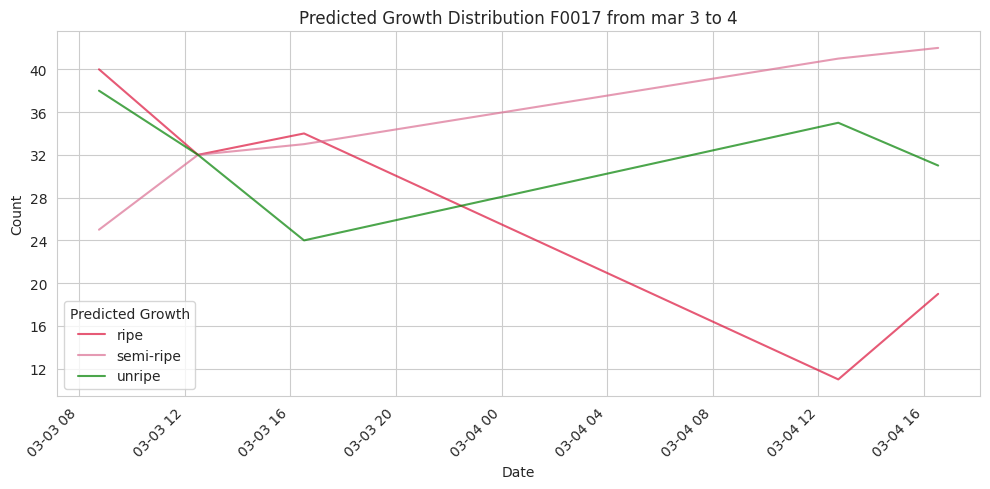

<Figure size 1200x600 with 0 Axes>

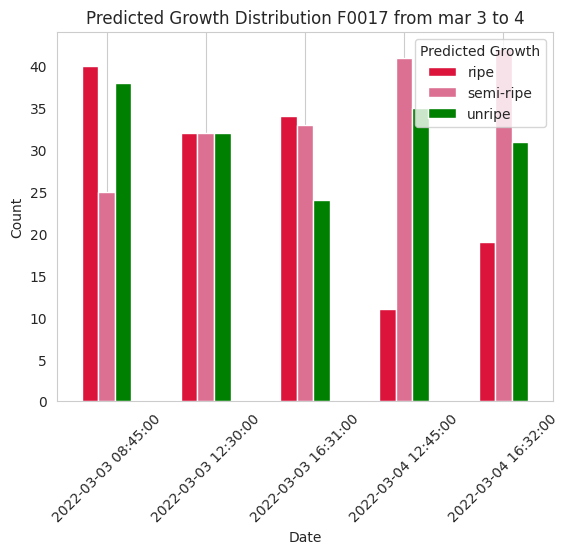

<Figure size 1200x600 with 0 Axes>

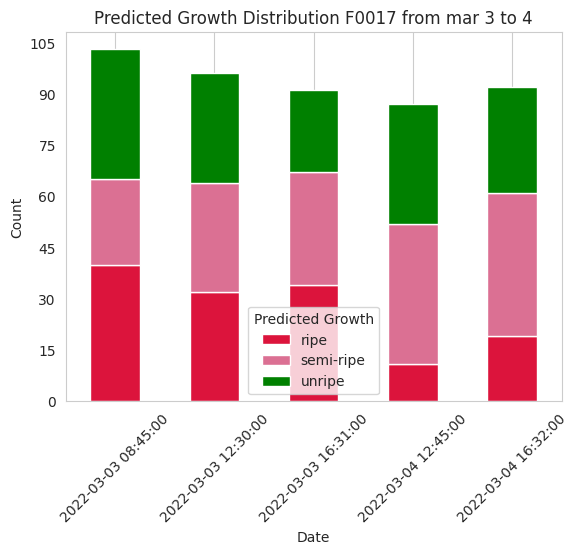

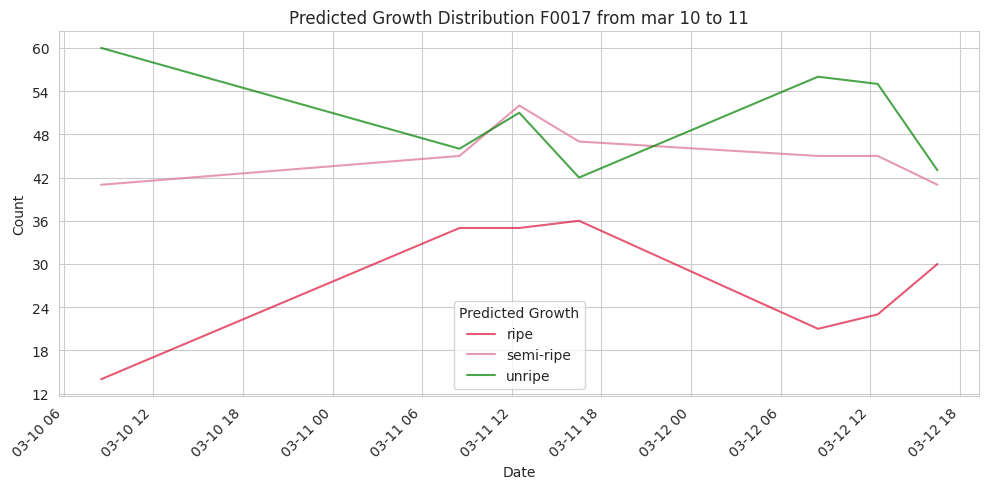

<Figure size 1200x600 with 0 Axes>

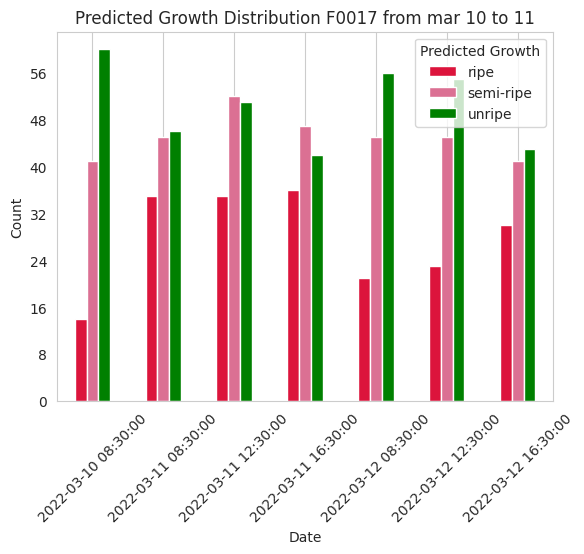

<Figure size 1200x600 with 0 Axes>

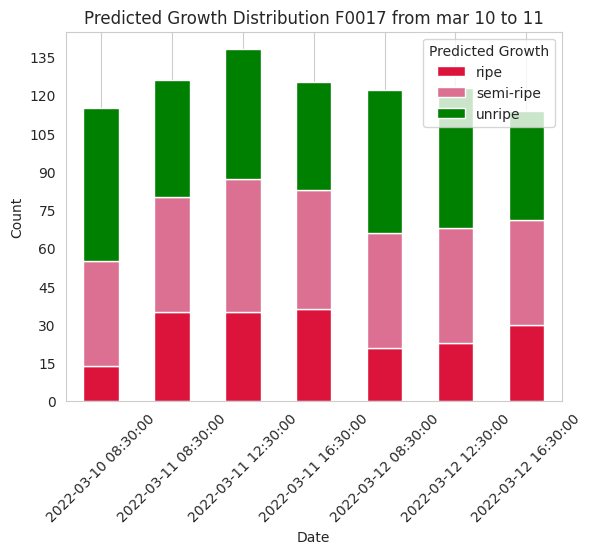

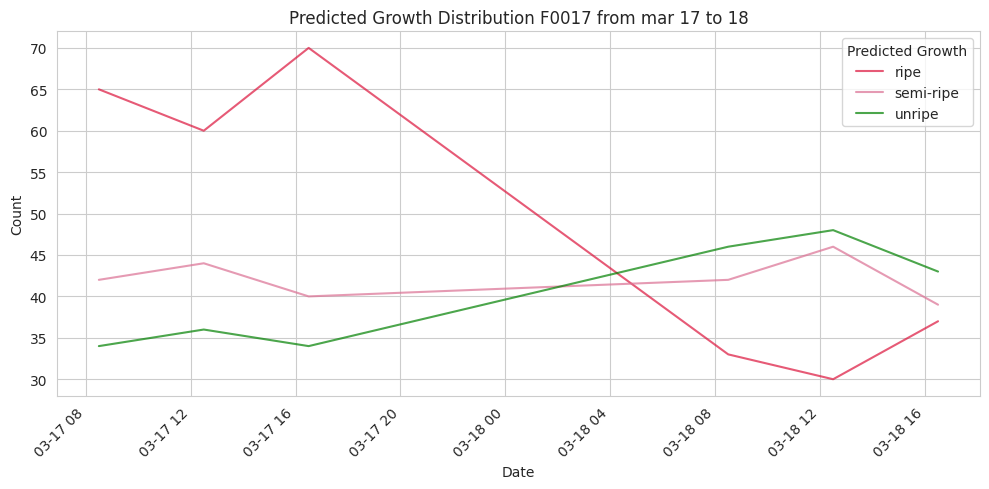

<Figure size 1200x600 with 0 Axes>

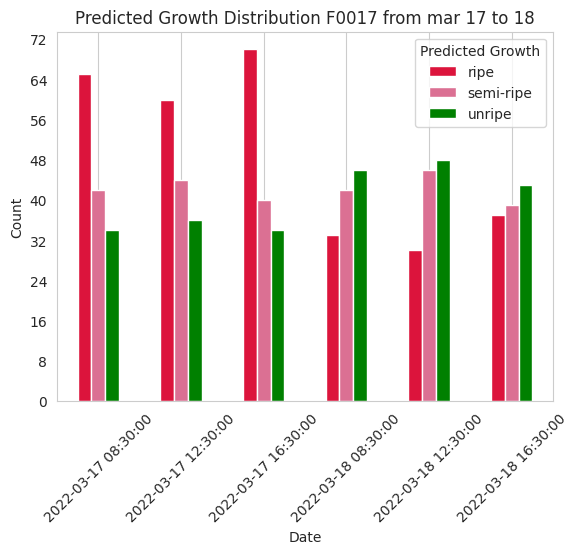

<Figure size 1200x600 with 0 Axes>

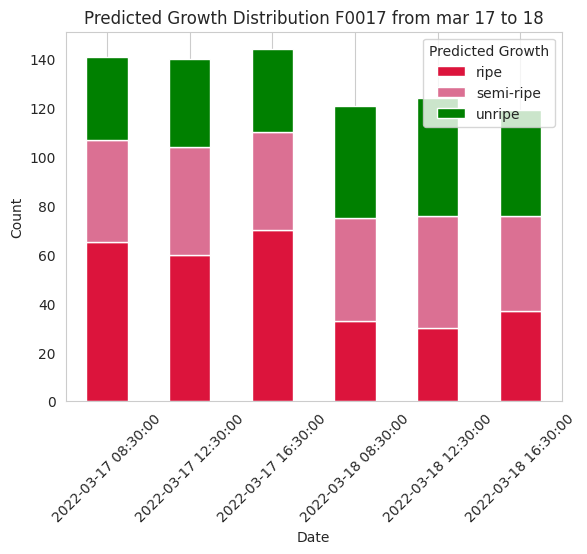

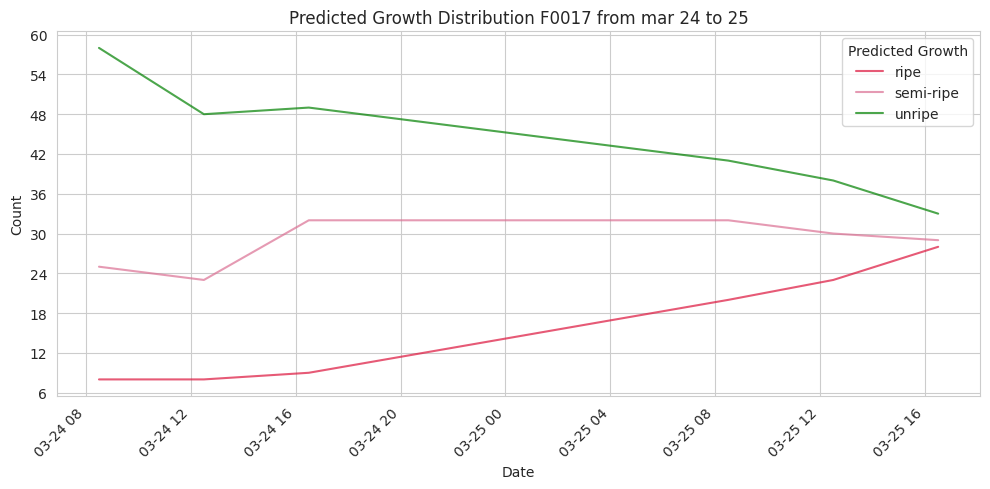

<Figure size 1200x600 with 0 Axes>

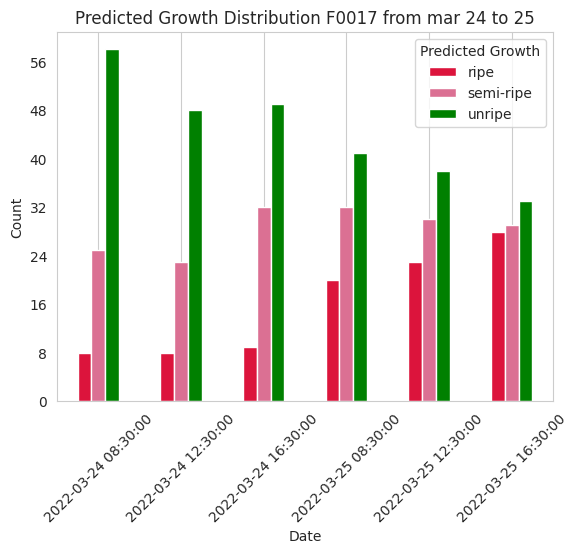

<Figure size 1200x600 with 0 Axes>

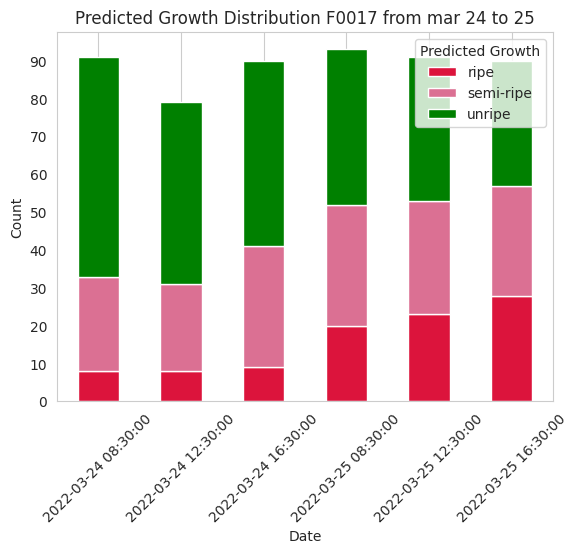

In [84]:
# Data selection for March (assuming dataframe name changed to F0017)
select_mar_1 = F0017_21_22_mar_data[(F0017_21_22_mar_data['shot_datetime'] >= '2022-03-03') & (F0017_21_22_mar_data['shot_datetime'] <= '2022-03-05')]
select_mar_2 = F0017_21_22_mar_data[(F0017_21_22_mar_data['shot_datetime'] >= '2022-03-10') & (F0017_21_22_mar_data['shot_datetime'] <= '2022-03-13')]
select_mar_3 = F0017_21_22_mar_data[(F0017_21_22_mar_data['shot_datetime'] >= '2022-03-17') & (F0017_21_22_mar_data['shot_datetime'] <= '2022-03-19')]
select_mar_4 = F0017_21_22_mar_data[(F0017_21_22_mar_data['shot_datetime'] >= '2022-03-24') & (F0017_21_22_mar_data['shot_datetime'] <= '2022-03-26')]

# Counting by growth category
mar_1_counts = select_mar_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_2_counts = select_mar_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_3_counts = select_mar_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
mar_4_counts = select_mar_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)

# Function to define color based on growth prediction (unchanged)
def get_color(pred_growth):
    if pred_growth == 'ripe':
        return 'crimson'
    elif pred_growth == 'semi-ripe':
        return 'palevioletred'
    elif pred_growth == 'unripe':
        return 'green'


# Define datasets and titles (replace F0016 with F0017)
datasets = [(mar_1_counts, 'Predicted Growth Distribution F0017 from mar 3 to 4'),
            (mar_2_counts, 'Predicted Growth Distribution F0017 from mar 10 to 11'),
            (mar_3_counts, 'Predicted Growth Distribution F0017 from mar 17 to 18'),
            (mar_4_counts, 'Predicted Growth Distribution F0017 from mar 24 to 25')]

# Call plot function for each dataset
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0017 21-22작기 4월

/tmp/ipykernel_21186/2288238386.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_apr_data['shot_datetime'] = pd.to_datetime(F0017_21_22_apr_data['shot_datetime'])


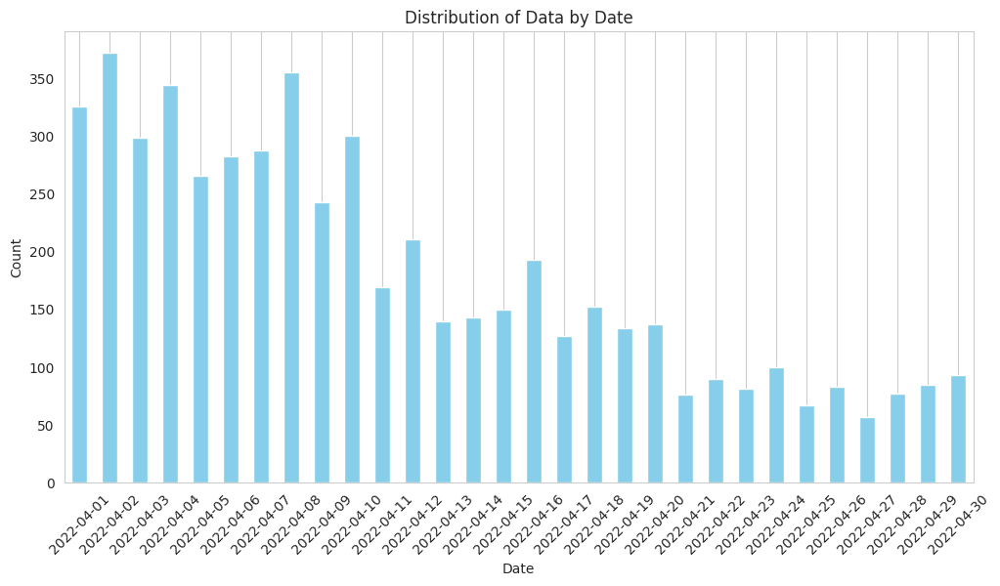

In [85]:
F0017_21_22_apr_data = F0017_21_22[F0017_21_22['측정월'] == 4]
F0017_21_22_apr_data['shot_datetime'] = pd.to_datetime(F0017_21_22_apr_data['shot_datetime'])

# Daily mask count
date_counts = pd.to_datetime(F0017_21_22_apr_data['shot_datetime']).dt.date.value_counts().sort_index()

# Plot the data distribution
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

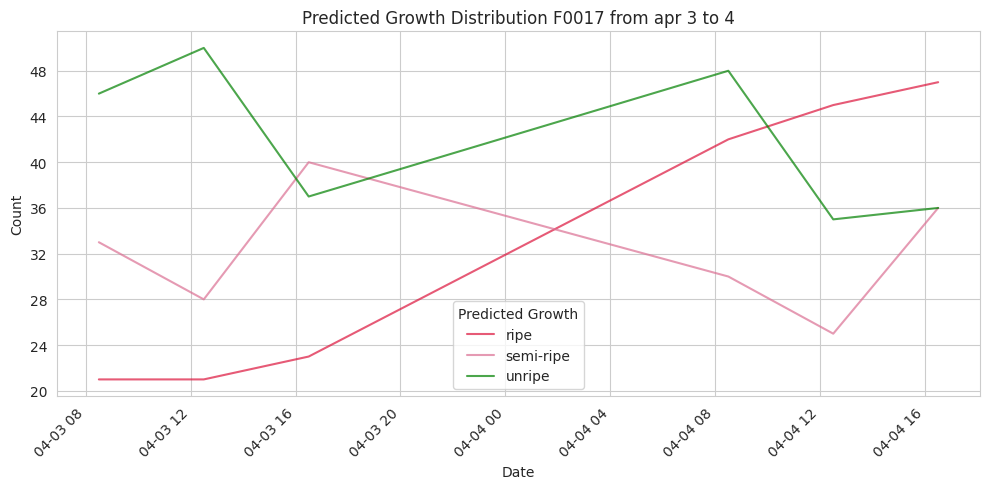

<Figure size 1200x600 with 0 Axes>

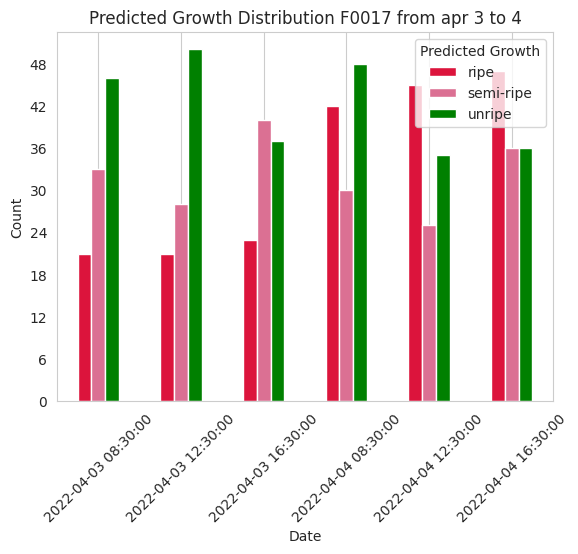

<Figure size 1200x600 with 0 Axes>

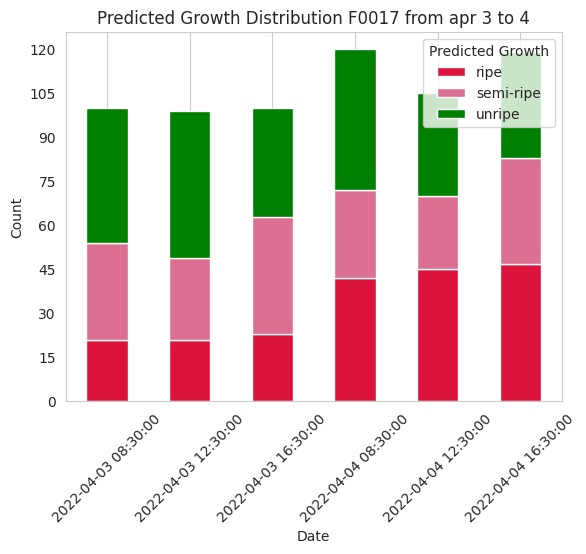

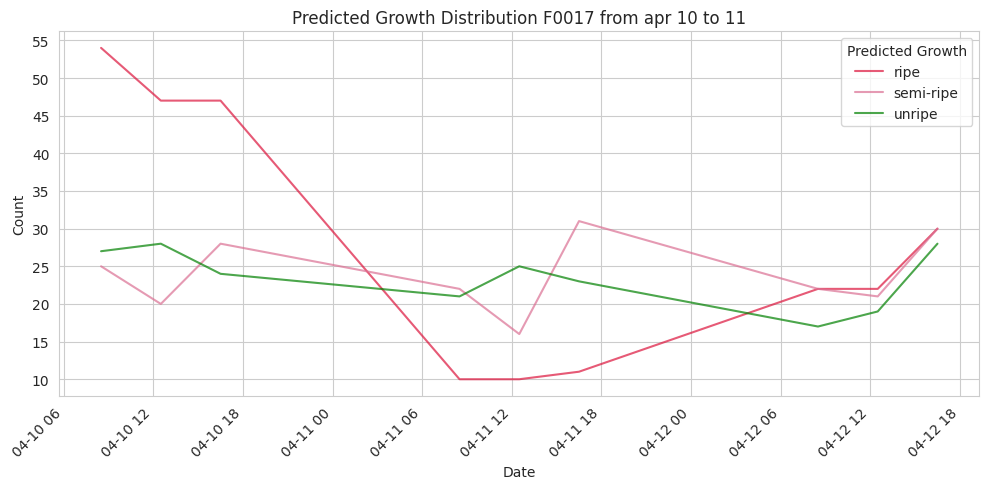

<Figure size 1200x600 with 0 Axes>

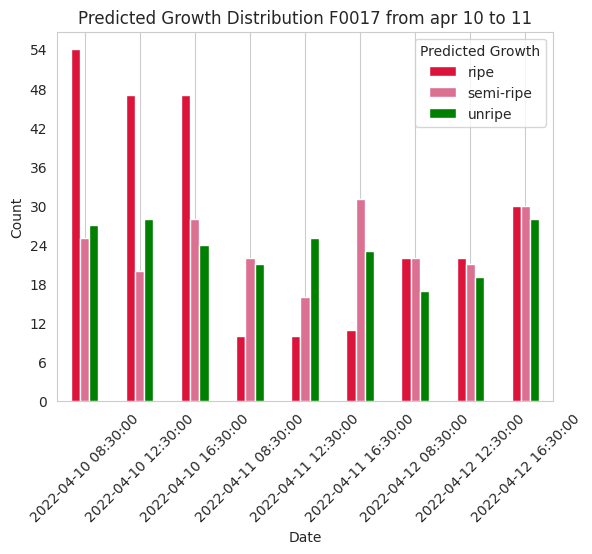

<Figure size 1200x600 with 0 Axes>

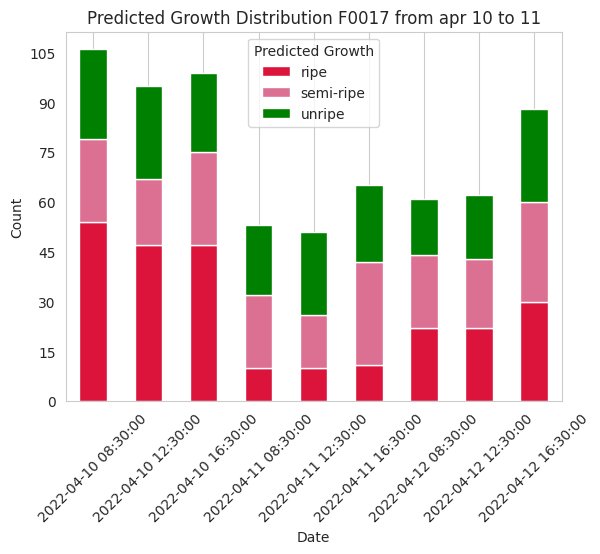

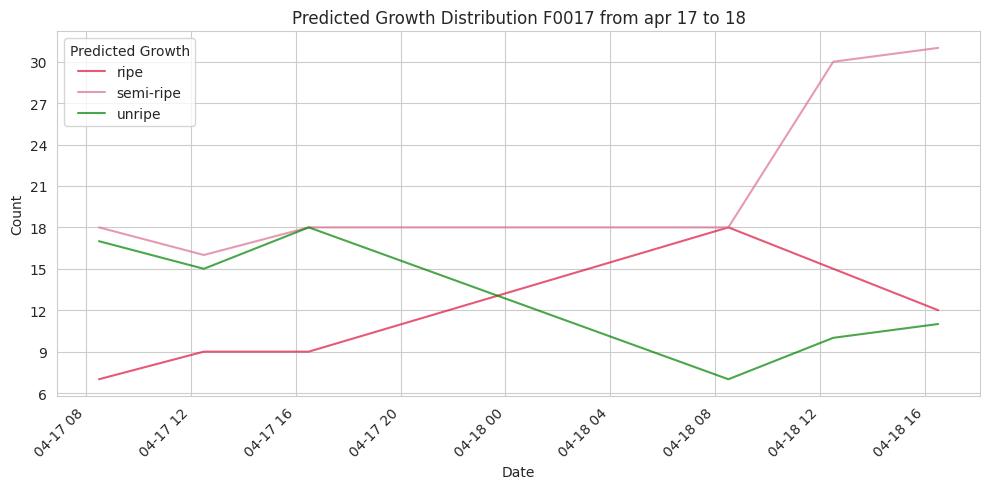

<Figure size 1200x600 with 0 Axes>

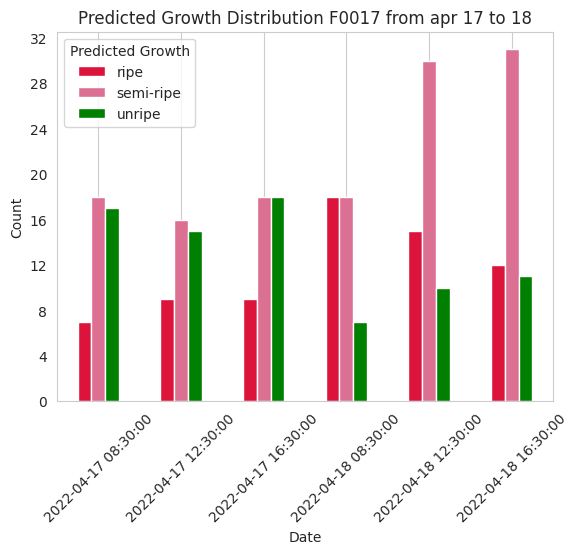

<Figure size 1200x600 with 0 Axes>

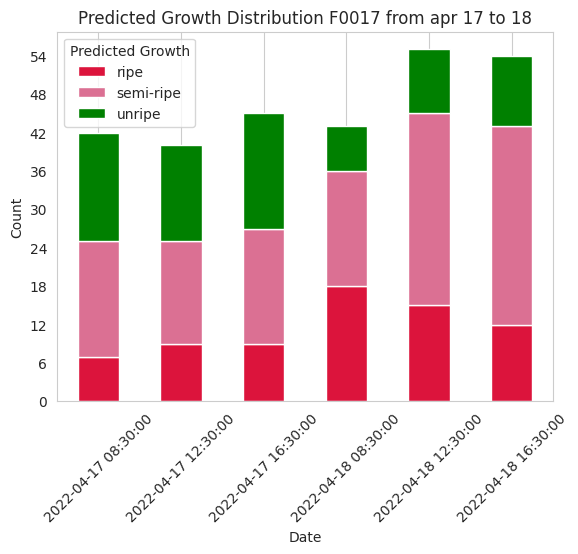

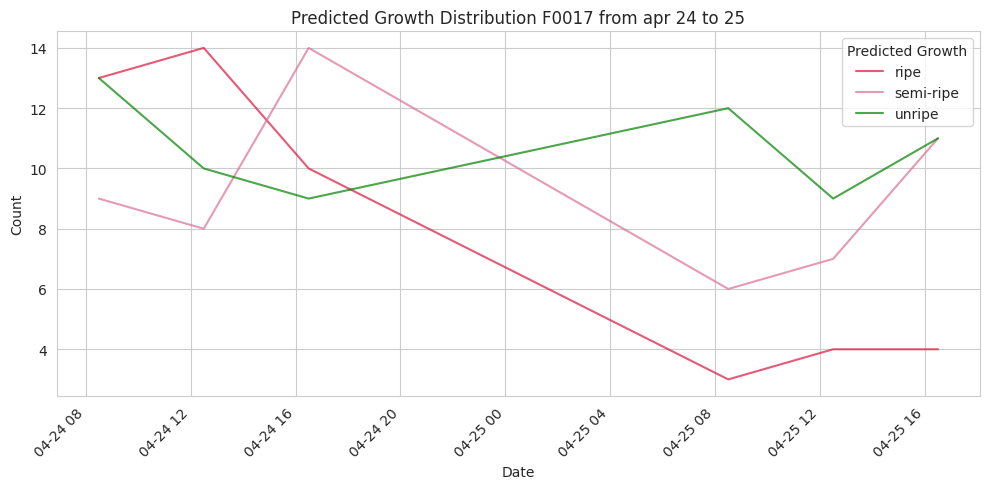

<Figure size 1200x600 with 0 Axes>

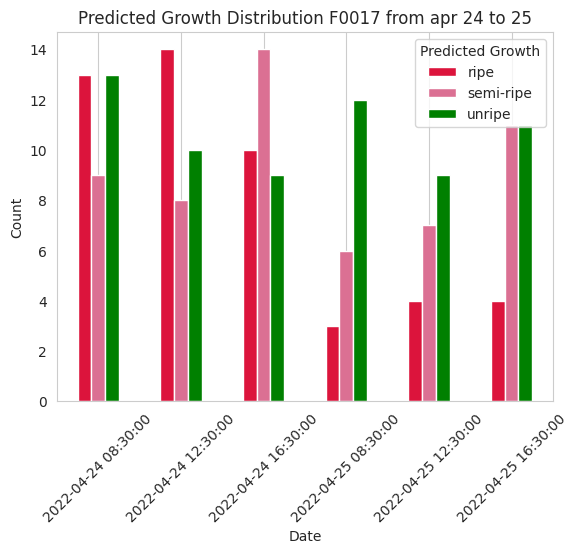

<Figure size 1200x600 with 0 Axes>

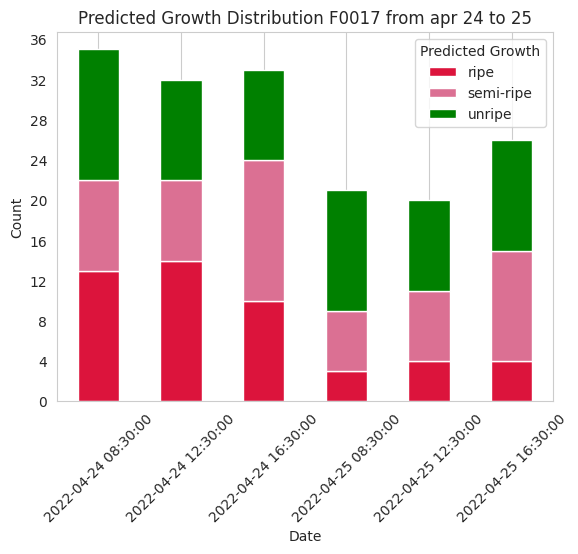

In [86]:
select_apr_1 = F0017_21_22_apr_data[(F0017_21_22_apr_data['shot_datetime'] >= '2022-04-03') & (F0017_21_22_apr_data['shot_datetime'] <= '2022-04-05')]
select_apr_2 = F0017_21_22_apr_data[(F0017_21_22_apr_data['shot_datetime'] >= '2022-04-10') & (F0017_21_22_apr_data['shot_datetime'] <= '2022-04-13')]
select_apr_3 = F0017_21_22_apr_data[(F0017_21_22_apr_data['shot_datetime'] >= '2022-04-17') & (F0017_21_22_apr_data['shot_datetime'] <= '2022-04-19')]
select_apr_4 = F0017_21_22_apr_data[(F0017_21_22_apr_data['shot_datetime'] >= '2022-04-24') & (F0017_21_22_apr_data['shot_datetime'] <= '2022-04-26')]

# Counting by growth category
apr_1_counts = select_apr_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_2_counts = select_apr_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_3_counts = select_apr_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
apr_4_counts = select_apr_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)


# Define datasets and titles (replace F0016 with F0017)
datasets = [(apr_1_counts, 'Predicted Growth Distribution F0017 from apr 3 to 4'),
            (apr_2_counts, 'Predicted Growth Distribution F0017 from apr 10 to 11'),
            (apr_3_counts, 'Predicted Growth Distribution F0017 from apr 17 to 18'),
            (apr_4_counts, 'Predicted Growth Distribution F0017 from apr 24 to 25')]

# Call plot function for each dataset
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0017 21-22작기 ５월

/tmp/ipykernel_21186/1603311019.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_may_data['shot_datetime'] = pd.to_datetime(F0017_21_22_may_data['shot_datetime'])


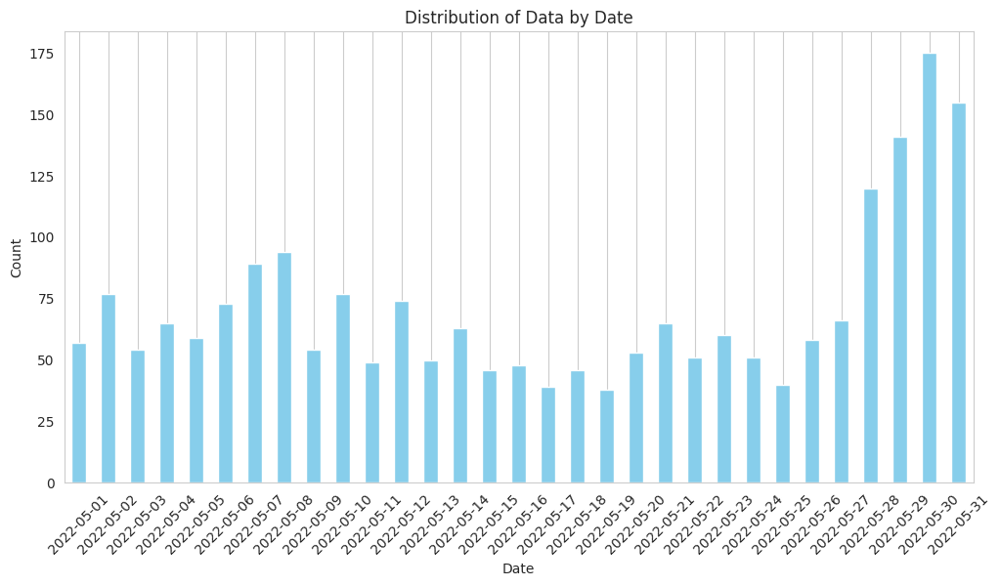

In [87]:
F0017_21_22_may_data = F0017_21_22[F0017_21_22['측정월'] == 5]
F0017_21_22_may_data['shot_datetime'] = pd.to_datetime(F0017_21_22_may_data['shot_datetime'])

# Daily mask count
date_counts = pd.to_datetime(F0017_21_22_may_data['shot_datetime']).dt.date.value_counts().sort_index()

# Plot the data distribution
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

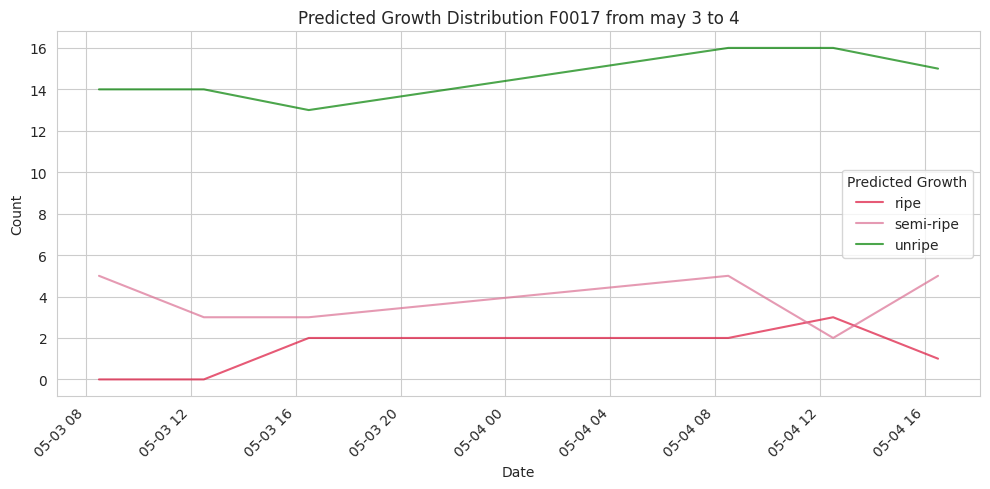

<Figure size 1200x600 with 0 Axes>

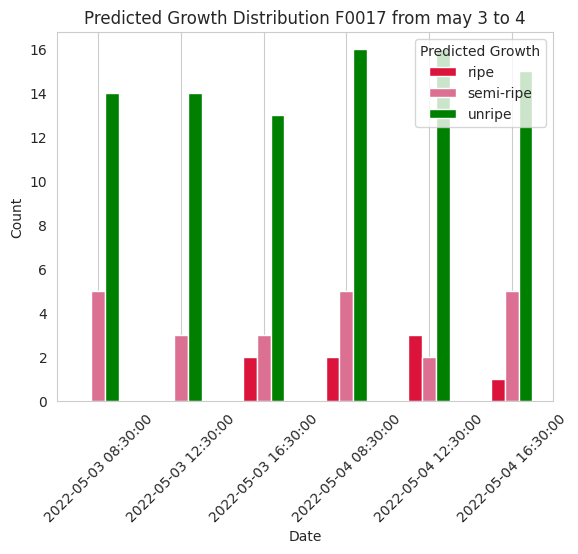

<Figure size 1200x600 with 0 Axes>

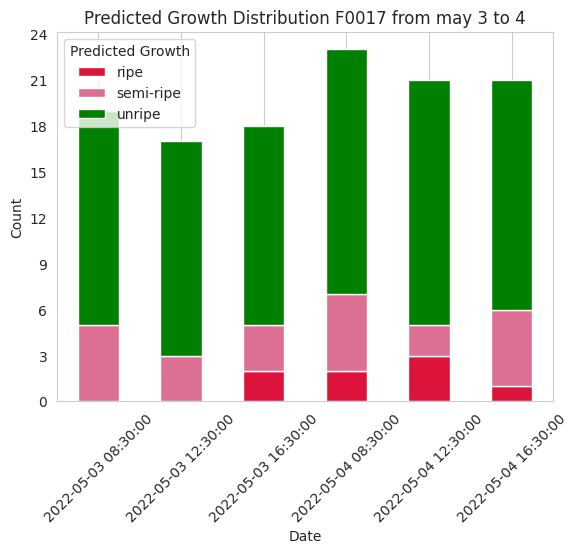

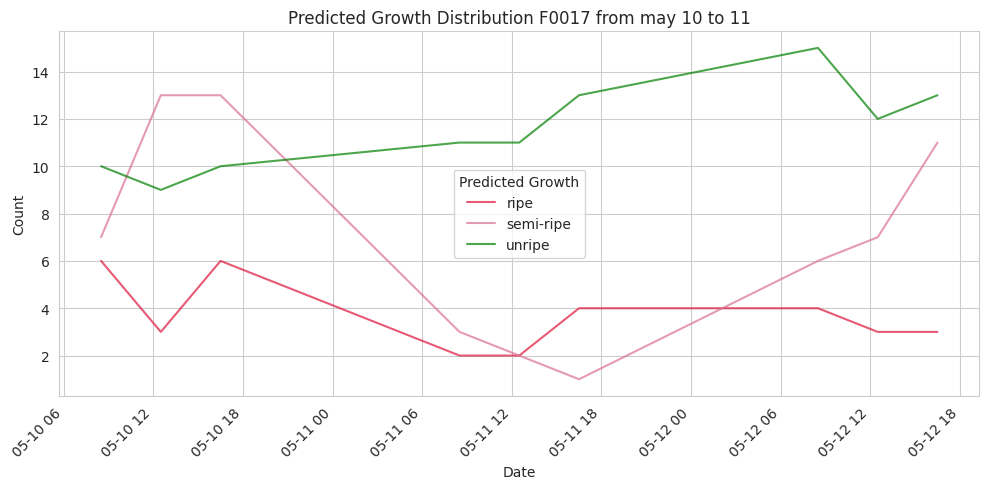

<Figure size 1200x600 with 0 Axes>

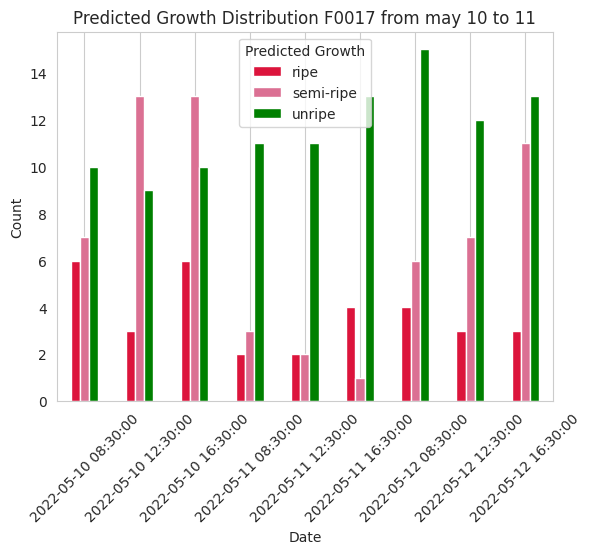

<Figure size 1200x600 with 0 Axes>

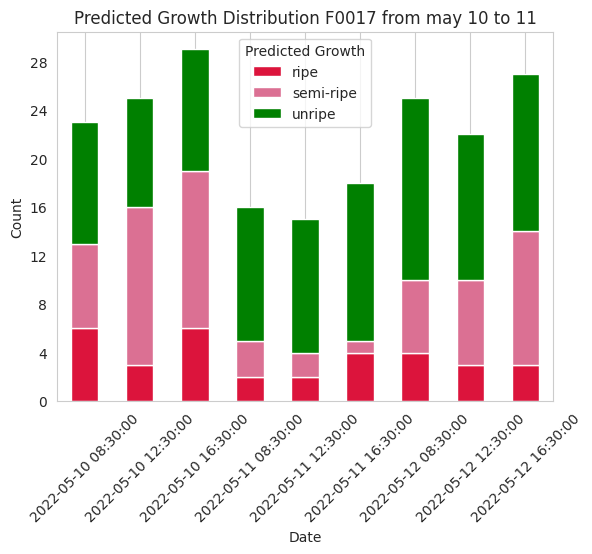

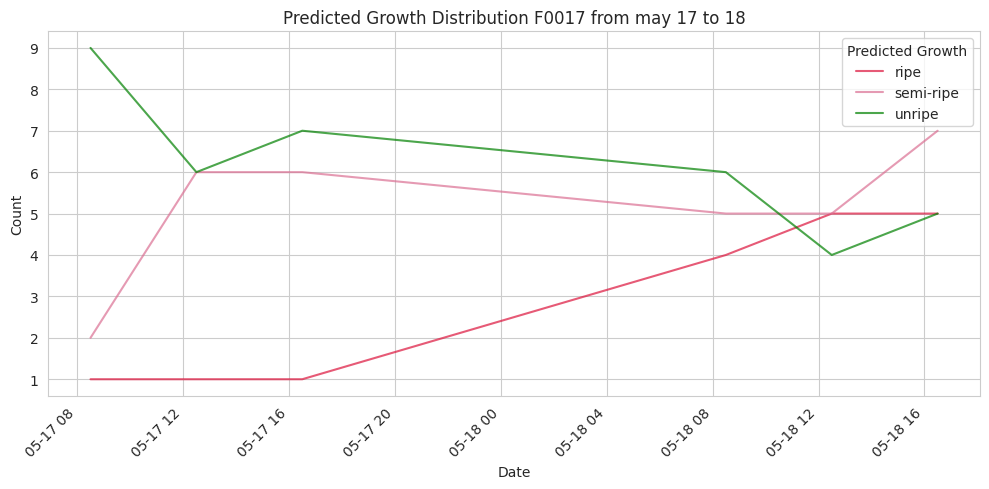

<Figure size 1200x600 with 0 Axes>

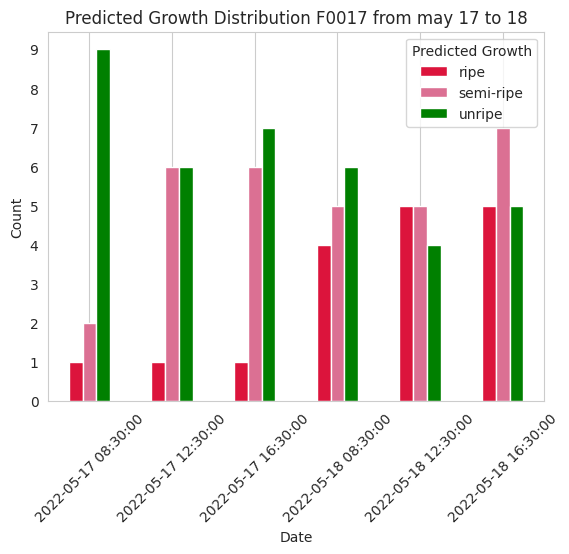

<Figure size 1200x600 with 0 Axes>

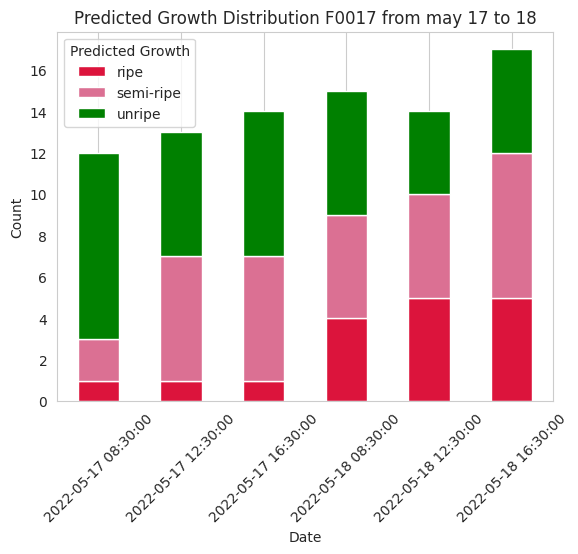

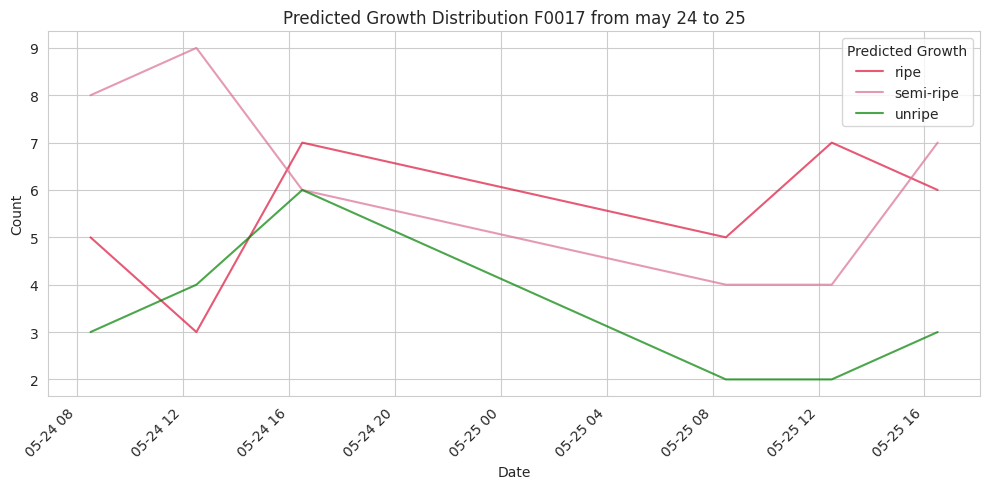

<Figure size 1200x600 with 0 Axes>

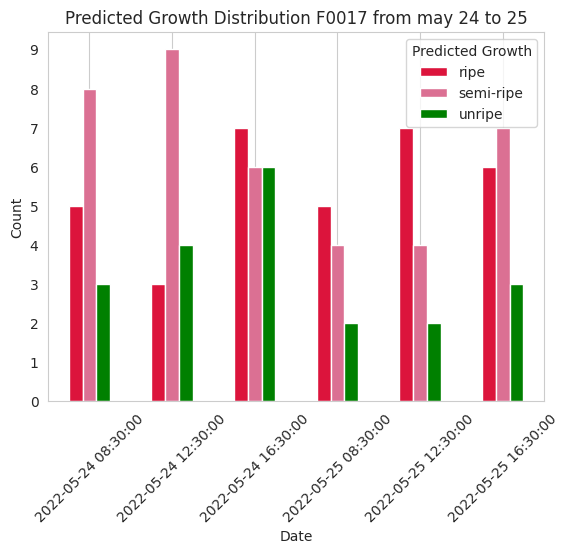

<Figure size 1200x600 with 0 Axes>

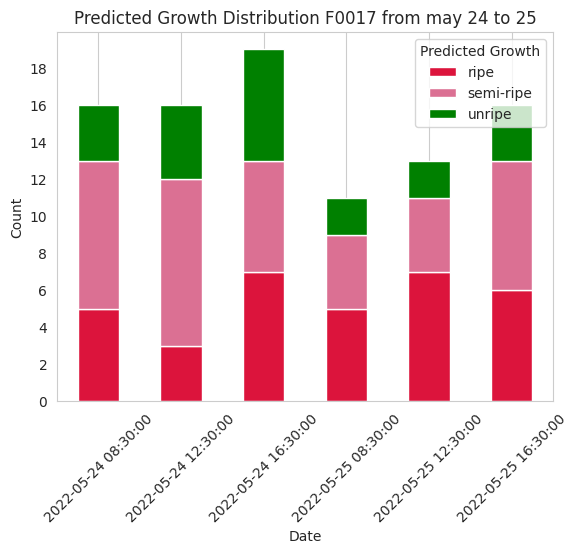

In [88]:
select_may_1 = F0017_21_22_may_data[(F0017_21_22_may_data['shot_datetime'] >= '2022-05-03') & (F0017_21_22_may_data['shot_datetime'] <= '2022-05-05')]
select_may_2 = F0017_21_22_may_data[(F0017_21_22_may_data['shot_datetime'] >= '2022-05-10') & (F0017_21_22_may_data['shot_datetime'] <= '2022-05-13')]
select_may_3 = F0017_21_22_may_data[(F0017_21_22_may_data['shot_datetime'] >= '2022-05-17') & (F0017_21_22_may_data['shot_datetime'] <= '2022-05-19')]
select_may_4 = F0017_21_22_may_data[(F0017_21_22_may_data['shot_datetime'] >= '2022-05-24') & (F0017_21_22_may_data['shot_datetime'] <= '2022-05-26')]

# Counting by growth category
may_1_counts = select_may_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_2_counts = select_may_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_3_counts = select_may_3.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
may_4_counts = select_may_4.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# Define datasets and titles (replace F0016 with F0017)
datasets = [(may_1_counts, 'Predicted Growth Distribution F0017 from may 3 to 4'),
            (may_2_counts, 'Predicted Growth Distribution F0017 from may 10 to 11'),
            (may_3_counts, 'Predicted Growth Distribution F0017 from may 17 to 18'),
            (may_4_counts, 'Predicted Growth Distribution F0017 from may 24 to 25')]

# Call plot function for each dataset
for counts, title in datasets:
    plot_growth_distribution(counts, title)

#### F0017 21-22작기 ６월

/tmp/ipykernel_21186/2656870810.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  F0017_21_22_jun_data['shot_datetime'] = pd.to_datetime(F0017_21_22_jun_data['shot_datetime'])


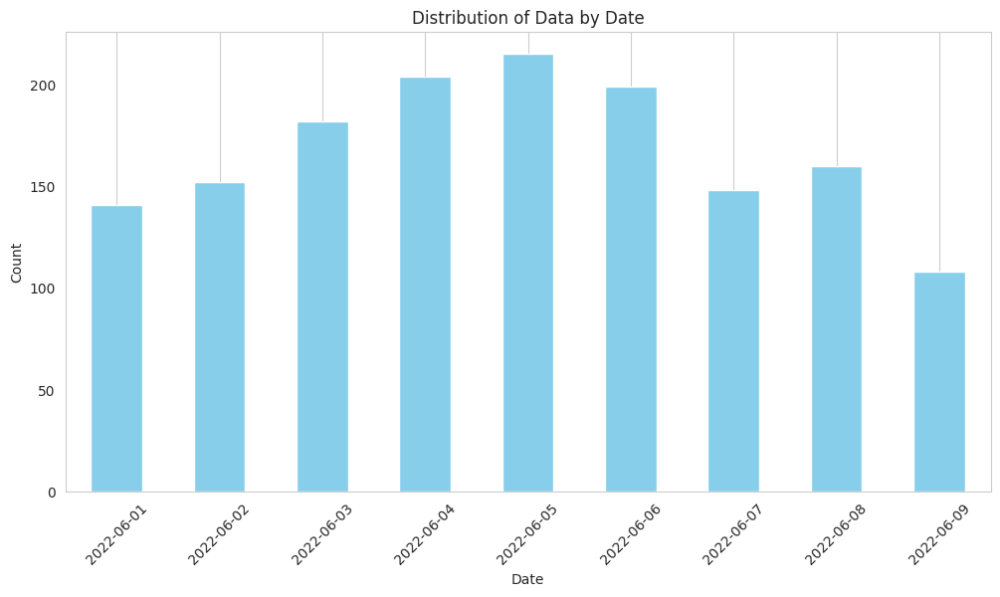

In [89]:
# Create data for June (assuming dataframe name changed to F0017)
F0017_21_22_jun_data = F0017_21_22[F0017_21_22['측정월'] == 6]
F0017_21_22_jun_data['shot_datetime'] = pd.to_datetime(F0017_21_22_jun_data['shot_datetime'])

# Daily mask count
date_counts = pd.to_datetime(F0017_21_22_jun_data['shot_datetime']).dt.date.value_counts().sort_index()

# Plot the data distribution
plt.figure(figsize=(12, 6))
date_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Data by Date')
plt.xlabel('Date')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

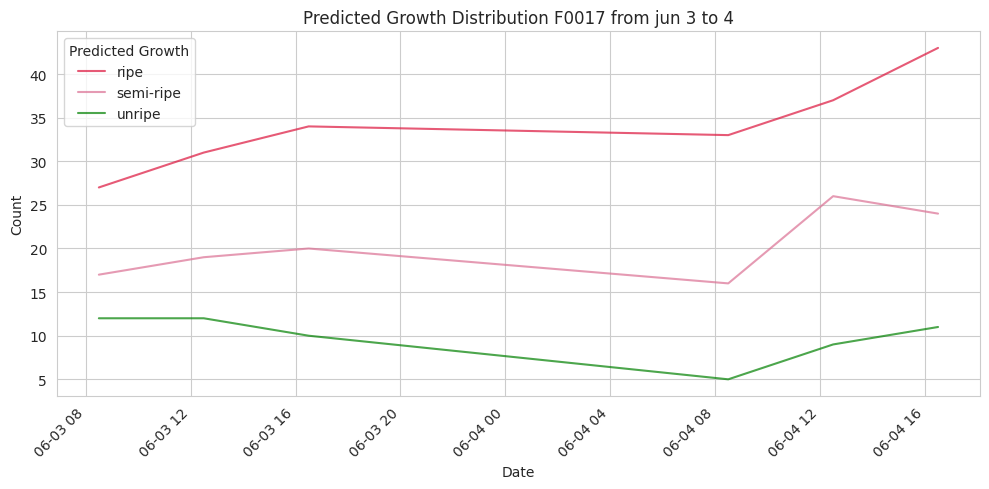

<Figure size 1200x600 with 0 Axes>

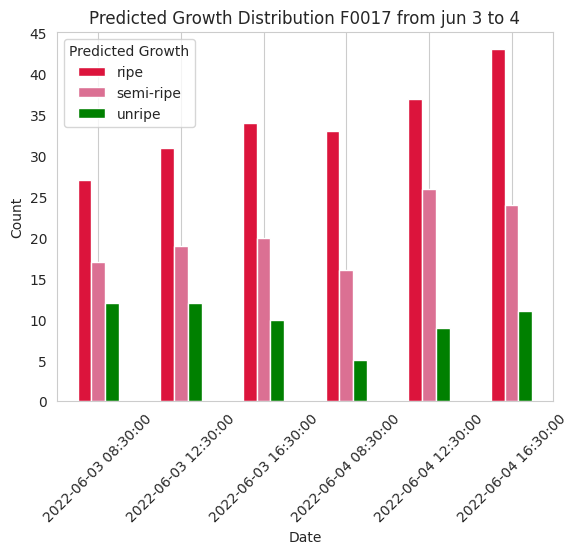

<Figure size 1200x600 with 0 Axes>

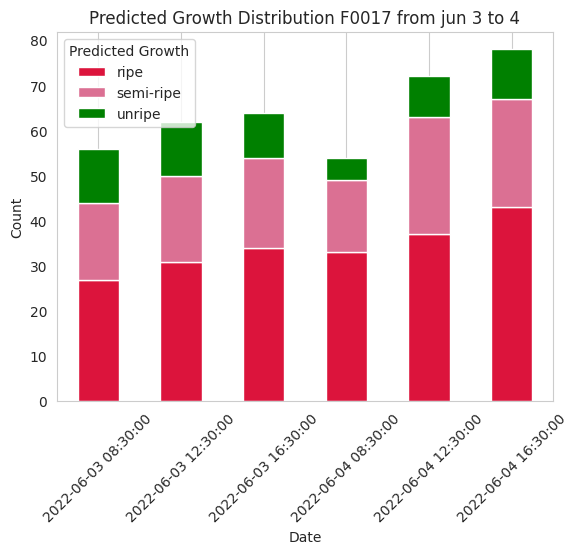

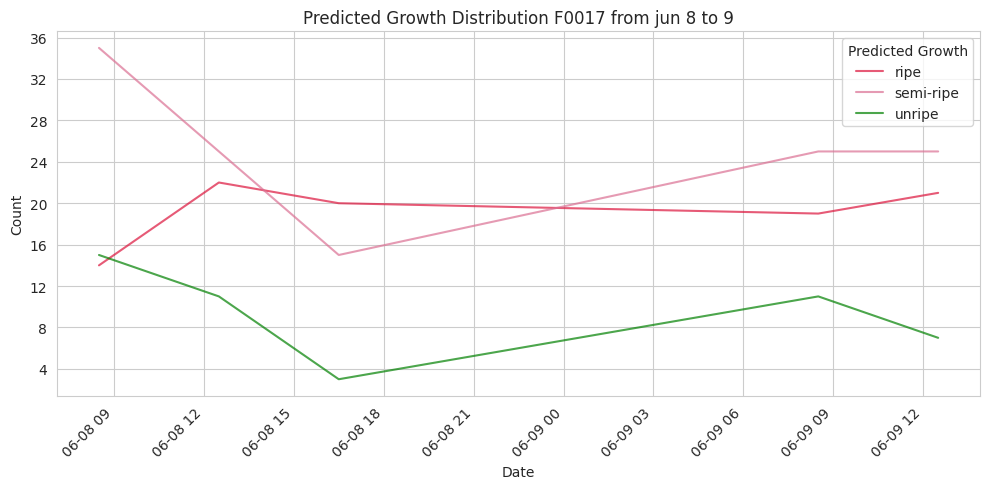

<Figure size 1200x600 with 0 Axes>

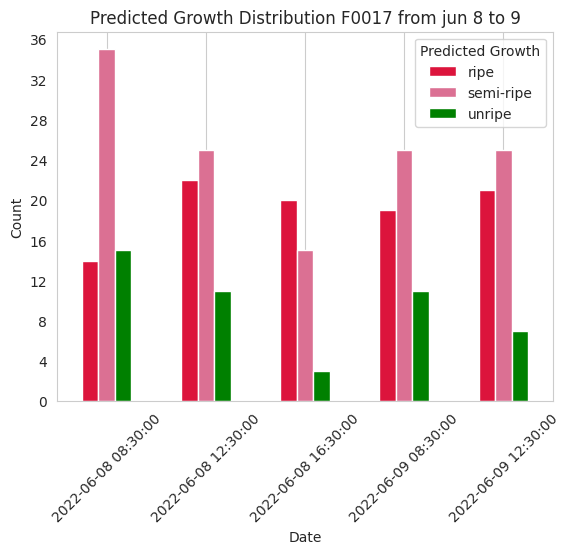

<Figure size 1200x600 with 0 Axes>

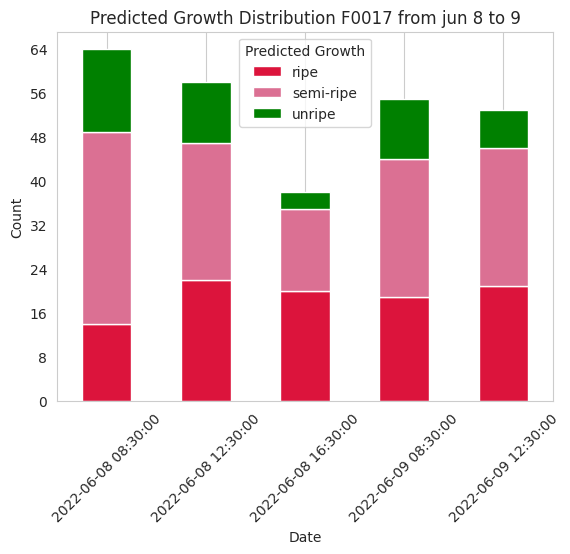

In [90]:
select_jun_1 = F0017_21_22_jun_data[(F0017_21_22_jun_data['shot_datetime'] >= '2022-06-03') & (F0017_21_22_jun_data['shot_datetime'] <= '2022-06-05')]
select_jun_2 = F0017_21_22_jun_data[(F0017_21_22_jun_data['shot_datetime'] >= '2022-06-08') & (F0017_21_22_jun_data['shot_datetime'] <= '2022-06-10')]

# Counting by growth category
jun_1_counts = select_jun_1.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)
jun_2_counts = select_jun_2.groupby(['shot_datetime', 'pred_growth']).size().unstack(fill_value=0)



# Define datasets and titles (replace F0016 with F0017)
datasets = [(jun_1_counts, 'Predicted Growth Distribution F0017 from jun 3 to 4'),
            (jun_2_counts, 'Predicted Growth Distribution F0017 from jun 8 to 9')]

# Call plot function for each dataset
for counts, title in datasets:
    plot_growth_distribution(counts, title)

### F0017 2２-2３ 작기별 확인